# Based
- https://www.kaggle.com/code/honganzhu/cmi-piu-competition?scriptVersionId=201912528 Version44 LB0.492

 If you find this notebook useful, please upvote this and the based one.

In [1]:
import numpy as np
import pandas as pd
import os
import re
from sklearn.base import clone
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import StratifiedKFold
from scipy.optimize import minimize
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm
import polars as pl
import polars.selectors as cs
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, PercentFormatter
import seaborn as sns

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim

from colorama import Fore, Style
from IPython.display import clear_output
import warnings
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import VotingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
from pytorch_tabnet.tab_model import TabNetRegressor
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)

pl.Config.set_tbl_rows(-1)
pl.Config.set_tbl_cols(-1)
pl.Config.set_fmt_str_lengths(10000)

polars.config.Config

In [2]:
SEED = 42
n_splits = 5

# Feature Engineering

- **Feature Selection**: The dataset contains features related to physical characteristics (e.g., BMI, Height, Weight), behavioral aspects (e.g., internet usage), and fitness data (e.g., endurance time). 
- **Categorical Feature Encoding**: Categorical features are mapped to numerical values using custom mappings for each unique category within the dataset. This ensures compatibility with machine learning algorithms that require numerical input.
- **Time Series Aggregation**: Time series statistics (e.g., mean, standard deviation) from the actigraphy data are computed and merged into the main dataset to create additional features for model training.


In [3]:
path = "I:/Kaggle/child-mind-institute-problematic-internet-use/"

In [4]:
train = pd.read_csv(path + 'train.csv')
test = pd.read_csv(path + 'test.csv')
sample = pd.read_csv(path + 'sample_submission.csv')

In [5]:
print(train.shape)
train.head()

(3960, 82)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,PCIAT-Season,PCIAT-PCIAT_01,PCIAT-PCIAT_02,PCIAT-PCIAT_03,PCIAT-PCIAT_04,PCIAT-PCIAT_05,PCIAT-PCIAT_06,PCIAT-PCIAT_07,PCIAT-PCIAT_08,PCIAT-PCIAT_09,PCIAT-PCIAT_10,PCIAT-PCIAT_11,PCIAT-PCIAT_12,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,Fall,5.0,4.0,4.0,0.0,4.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,55.0,NaN,NaN,NaN,Fall,3.0,2.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Fall,46.0,64.0,Summer,0.0,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,5.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,2.0,2.0,1.0,1.0,28.0,Fall,38.0,54.0,Summer,2.0,0.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,NaN,60.0,97.0,117.0,Summer,6.0,9.0,37.0,Summer,18.0,1.0,NaN,NaN,NaN,NaN,5.0,0.0,7.0,0.0,7.0,0.0,7.0,1.0,Summer,3.0,3.84191,18.2943,1131.430,1923.44,15.59250,62.7757,14.0740,4.22033,18.82430,2.0,30.4041,16.77900,58.9338,26.4798,45.9966,NaN,NaN,Winter,2.451,Summer,4.0,2.0,4.0,0.0,5.0,1.0,0.0,3.0,2.0,2.0,3.0,0.0,3.0,0.0,0.0,3.0,4.0,3.0,4.0,1.0,44.0,Summer,31.0,45.0,Winter,0.0,1.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,1.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
print(test.shape)
test.head()

(20, 59)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,3.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,46.0,64.0,Summer,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,38.0,54.0,Summer,2.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,NaN,60.0,97.0,117.0,Summer,6.0,9.0,37.0,Summer,18.0,1.0,NaN,NaN,NaN,NaN,5.0,0.0,7.0,0.0,7.0,0.0,7.0,1.0,Summer,3.0,3.84191,18.2943,1131.430,1923.44,15.59250,62.7757,14.0740,4.22033,18.82430,2.0,30.4041,16.77900,58.9338,26.4798,45.9966,NaN,NaN,Winter,2.451,Summer,31.0,45.0,Winter,0.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,1.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
sample

,id,sii
0,00008ff9,0
1,000fd460,1
2,00105258,2
3,00115b9f,3
4,0016bb22,0
5,001f3379,1
6,0038ba98,2
7,0068a485,3
8,0069fbed,0
9,0083e397,1


In [8]:
data_dict = pd.read_csv(path + 'data_dictionary.csv')
print(data_dict.shape)
data_dict

(81, 6)


,Instrument,Field,Description,Type,Values,Value Labels
0,Identifier,id,Participant's ID,str,NaN,NaN
1,Demographics,Basic_Demos-Enroll_Season,Season of enrollment,str,"Spring, Summer, Fall, Winter",NaN
2,Demographics,Basic_Demos-Age,Age of participant,float,NaN,NaN
3,Demographics,Basic_Demos-Sex,Sex of participant,categorical int,"0,1","0=Male, 1=Female"
4,Children's Global Assessment Scale,CGAS-Season,Season of participation,str,"Spring, Summer, Fall, Winter",NaN
5,Children's Global Assessment Scale,CGAS-CGAS_Score,Children's Global Assessment Scale Score,int,NaN,NaN
6,Physical Measures,Physical-Season,Season of participation,str,"Spring, Summer, Fall, Winter",NaN
7,Physical Measures,Physical-BMI,Body Mass Index (kg/m^2),float,NaN,NaN
8,Physical Measures,Physical-Height,Height (in),float,NaN,NaN
9,Physical Measures,Physical-Weight,Weight (lbs),float,NaN,NaN


In [9]:
train['id'].nunique()

3960

In [10]:
test['id'].nunique()

20

In [11]:
train_target = train[test.columns]

In [12]:
print(train_target.shape)
train_target.head()

(3960, 59)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,3.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,46.0,64.0,Summer,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,38.0,54.0,Summer,2.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,NaN,60.0,97.0,117.0,Summer,6.0,9.0,37.0,Summer,18.0,1.0,NaN,NaN,NaN,NaN,5.0,0.0,7.0,0.0,7.0,0.0,7.0,1.0,Summer,3.0,3.84191,18.2943,1131.430,1923.44,15.59250,62.7757,14.0740,4.22033,18.82430,2.0,30.4041,16.77900,58.9338,26.4798,45.9966,NaN,NaN,Winter,2.451,Summer,31.0,45.0,Winter,0.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,1.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
concat_df = pd.concat([train_target, test], ignore_index=True)
print(concat_df.shape)
concat_df.head()

(3980, 59)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,3.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,46.0,64.0,Summer,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,38.0,54.0,Summer,2.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,NaN,60.0,97.0,117.0,Summer,6.0,9.0,37.0,Summer,18.0,1.0,NaN,NaN,NaN,NaN,5.0,0.0,7.0,0.0,7.0,0.0,7.0,1.0,Summer,3.0,3.84191,18.2943,1131.430,1923.44,15.59250,62.7757,14.0740,4.22033,18.82430,2.0,30.4041,16.77900,58.9338,26.4798,45.9966,NaN,NaN,Winter,2.451,Summer,31.0,45.0,Winter,0.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,1.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
concat_df['total_num_nan'] = concat_df.isna().sum(axis=1)

In [15]:
concat_df['total_num_nan'].describe()

count    3980.000000
mean       26.142462
std        17.257902
min         3.000000
25%         9.000000
50%        24.000000
75%        41.000000
max        55.000000
Name: total_num_nan, dtype: float64

In [16]:
nan_df = concat_df[concat_df['total_num_nan'] == concat_df['total_num_nan'].max()]
print(nan_df.shape)
nan_df.head()

(199, 60)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,total_num_nan
42,023e1b6a,Summer,13,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55
67,040d103f,Spring,8,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55
84,04ccb838,Summer,7,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55
107,05dc60ef,Spring,12,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55
148,0882b065,Summer,11,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55


In [17]:
for col in concat_df.columns:
    new_col_name = col + '_isnan'
    concat_df[new_col_name] = concat_df[col].isna().astype(int)

In [18]:
print(concat_df.shape)
concat_df.head()

(3980, 120)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,total_num_nan,id_isnan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,CGAS-CGAS_Score_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Height_isnan,Physical-Weight_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Physical-HeartRate_isnan,Physical-Systolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,Fitness_Endurance-Time_Mins_isnan,Fitness_Endurance-Time_Sec_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_CU_Zone_isnan,FGC-FGC_GSND_isnan,FGC-FGC_GSND_Zone_isnan,FGC-FGC_GSD_isnan,FGC-FGC_GSD_Zone_isnan,FGC-FGC_PU_isnan,FGC-FGC_PU_Zone_isnan,FGC-FGC_SRL_isnan,FGC-FGC_SRL_Zone_isnan,FGC-FGC_SRR_isnan,FGC-FGC_SRR_Zone_isnan,FGC-FGC_TL_isnan,FGC-FGC_TL_Zone_isnan,BIA-Season_isnan,BIA-BIA_Activity_Level_num_isnan,BIA-BIA_BMC_isnan,BIA-BIA_BMI_isnan,BIA-BIA_BMR_isnan,BIA-BIA_DEE_isnan,BIA-BIA_ECW_isnan,BIA-BIA_FFM_isnan,BIA-BIA_FFMI_isnan,BIA-BIA_FMI_isnan,BIA-BIA_Fat_isnan,BIA-BIA_Frame_num_isnan,BIA-BIA_ICW_isnan,BIA-BIA_LDM_isnan,BIA-BIA_LST_isnan,BIA-BIA_SMM_isnan,BIA-BIA_TBW_isnan,PAQ_A-Season_isnan,PAQ_A-PAQ_A_Total_isnan,PAQ_C-Season_isnan,PAQ_C-PAQ_C_Total_isnan,SDS-Season_isnan,SDS-SDS_Total_Raw_isnan,SDS-SDS_Total_T_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,3.0,19,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,46.0,64.0,Summer,0.0,12,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,38.0,54.0,Summer,2.0,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,NaN,60.0,97.0,117.0,Summer,6.0,9.0,37.0,Summer,18.0,1.0,NaN,NaN,NaN,NaN,5.0,0.0,7.0,0.0,7.0,0.0,7.0,1.0,Summer,3.0,3.84191,18.2943,1131.430,1923.44,15.59250,62.7757,14.0740,4.22033,18.82430,2.0,30.4041,16.77900,58.9338,26.4798,45.9966,NaN,NaN,Winter,2.451,Summer,31.0,45.0,Winter,0.0,7,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [19]:
instruments = data_dict['Instrument'].unique().tolist()
instruments.remove('Identifier')
print(len(instruments))
instruments

11


['Demographics',
 "Children's Global Assessment Scale",
 'Physical Measures',
 'FitnessGram Vitals and Treadmill',
 'FitnessGram Child',
 'Bio-electric Impedance Analysis',
 'Physical Activity Questionnaire (Adolescents)',
 'Physical Activity Questionnaire (Children)',
 'Parent-Child Internet Addiction Test',
 'Sleep Disturbance Scale',
 'Internet Use']

In [20]:
for instrument in instruments:
    if 'Parent-Child Internet Addiction Test' == instrument:
        continue
    instrument_df = data_dict[data_dict['Instrument'] == instrument]
    field_list = instrument_df['Field'].unique().tolist()
    concat_df[instrument + '_num_nan'] = concat_df[field_list].isna().sum(axis=1)    

In [21]:
print(concat_df.shape)
concat_df.head()

(3980, 130)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,total_num_nan,id_isnan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,CGAS-CGAS_Score_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Height_isnan,Physical-Weight_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Physical-HeartRate_isnan,Physical-Systolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,Fitness_Endurance-Time_Mins_isnan,Fitness_Endurance-Time_Sec_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_CU_Zone_isnan,FGC-FGC_GSND_isnan,FGC-FGC_GSND_Zone_isnan,FGC-FGC_GSD_isnan,FGC-FGC_GSD_Zone_isnan,FGC-FGC_PU_isnan,FGC-FGC_PU_Zone_isnan,FGC-FGC_SRL_isnan,FGC-FGC_SRL_Zone_isnan,FGC-FGC_SRR_isnan,FGC-FGC_SRR_Zone_isnan,FGC-FGC_TL_isnan,FGC-FGC_TL_Zone_isnan,BIA-Season_isnan,BIA-BIA_Activity_Level_num_isnan,BIA-BIA_BMC_isnan,BIA-BIA_BMI_isnan,BIA-BIA_BMR_isnan,BIA-BIA_DEE_isnan,BIA-BIA_ECW_isnan,BIA-BIA_FFM_isnan,BIA-BIA_FFMI_isnan,BIA-BIA_FMI_isnan,BIA-BIA_Fat_isnan,BIA-BIA_Frame_num_isnan,BIA-BIA_ICW_isnan,BIA-BIA_LDM_isnan,BIA-BIA_LST_isnan,BIA-BIA_SMM_isnan,BIA-BIA_TBW_isnan,PAQ_A-Season_isnan,PAQ_A-PAQ_A_Total_isnan,PAQ_C-Season_isnan,PAQ_C-PAQ_C_Total_isnan,SDS-Season_isnan,SDS-SDS_Total_Raw_isnan,SDS-SDS_Total_T_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan,Demographics_num_nan,Children's Global Assessment Scale_num_nan,Physical Measures_num_nan,FitnessGram Vitals and Treadmill_num_nan,FitnessGram Child_num_nan,Bio-electric Impedance Analysis_num_nan,Physical Activity Questionnaire (Adolescents)_num_nan,Physical Activity Questionnaire (Children)_num_nan,Sleep Disturbance Scale_num_nan,Internet Use_num_nan
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,3.0,19,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,0,4,4,4,0,2,2,3,0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,46.0,64.0,Summer,0.0,12,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,2,0,4,4,0,2,0,0,0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,38.0,54.0,Summer,2.0,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,17,2,0,0,0
3,00115b9

In [22]:
train_parquet_id_folders_list = os.listdir(path + 'series_train.parquet/')
print(len(train_parquet_id_folders_list))
train_parquet_id_folders_list

996


['id=00115b9f',
 'id=001f3379',
 'id=00f332d1',
 'id=01085eb3',
 'id=012cadd8',
 'id=012e3869',
 'id=029a19c9',
 'id=02cebf33',
 'id=02cf7384',
 'id=035c96dd',
 'id=03a9019b',
 'id=0417c91e',
 'id=045a0a94',
 'id=04afb6f9',
 'id=04bb1a76',
 'id=04cb2c30',
 'id=04d06a9c',
 'id=04f094a8',
 'id=051680a0',
 'id=055156e2',
 'id=059eed01',
 'id=05bbed1b',
 'id=05db1b9b',
 'id=05e94f88',
 'id=063b16fc',
 'id=064e8da5',
 'id=0668373f',
 'id=067b9287',
 'id=06c8b2fb',
 'id=06eb8adb',
 'id=070386b2',
 'id=07048067',
 'id=0720320e',
 'id=0745c390',
 'id=080698b7',
 'id=082df556',
 'id=08577722',
 'id=08660d12',
 'id=089a6b19',
 'id=09331bb8',
 'id=0983654b',
 'id=099e3614',
 'id=09b29113',
 'id=0a418b57',
 'id=0a431608',
 'id=0b4014f0',
 'id=0b50f3fa',
 'id=0b518637',
 'id=0b7d7aec',
 'id=0b7d9da6',
 'id=0bd89878',
 'id=0bfe4fc9',
 'id=0c4e2d68',
 'id=0c4eabac',
 'id=0c98f822',
 'id=0cbe4e54',
 'id=0d01bbf2',
 'id=0d279d77',
 'id=0d4800c8',
 'id=0d4fa8f4',
 'id=0d570d3e',
 'id=0d924604',
 'id=0e3

In [23]:
train_parquet_id_list = [v.replace('id=', '') for v in train_parquet_id_folders_list]
print(len(train_parquet_id_list))
train_parquet_id_list

996


['00115b9f',
 '001f3379',
 '00f332d1',
 '01085eb3',
 '012cadd8',
 '012e3869',
 '029a19c9',
 '02cebf33',
 '02cf7384',
 '035c96dd',
 '03a9019b',
 '0417c91e',
 '045a0a94',
 '04afb6f9',
 '04bb1a76',
 '04cb2c30',
 '04d06a9c',
 '04f094a8',
 '051680a0',
 '055156e2',
 '059eed01',
 '05bbed1b',
 '05db1b9b',
 '05e94f88',
 '063b16fc',
 '064e8da5',
 '0668373f',
 '067b9287',
 '06c8b2fb',
 '06eb8adb',
 '070386b2',
 '07048067',
 '0720320e',
 '0745c390',
 '080698b7',
 '082df556',
 '08577722',
 '08660d12',
 '089a6b19',
 '09331bb8',
 '0983654b',
 '099e3614',
 '09b29113',
 '0a418b57',
 '0a431608',
 '0b4014f0',
 '0b50f3fa',
 '0b518637',
 '0b7d7aec',
 '0b7d9da6',
 '0bd89878',
 '0bfe4fc9',
 '0c4e2d68',
 '0c4eabac',
 '0c98f822',
 '0cbe4e54',
 '0d01bbf2',
 '0d279d77',
 '0d4800c8',
 '0d4fa8f4',
 '0d570d3e',
 '0d924604',
 '0e3b0bd2',
 '0ec403df',
 '0ed2a3c8',
 '0eddd8e5',
 '0f6b71c4',
 '0fbb3ca5',
 '101774f0',
 '101c27f1',
 '108b8659',
 '10ad8c48',
 '10e46254',
 '113f5798',
 '11739de2',
 '119d7562',
 '119e181e',

In [24]:
test_parquet_id_folders_list = os.listdir(path + 'series_test.parquet/')
print(len(test_parquet_id_folders_list))
test_parquet_id_folders_list

2


['id=00115b9f', 'id=001f3379']

In [25]:
test_parquet_id_list = [v.replace('id=', '') for v in test_parquet_id_folders_list]
print(len(test_parquet_id_list))
test_parquet_id_list

2


['00115b9f', '001f3379']

In [26]:
concat_df['id'].isin(train_parquet_id_list + test_parquet_id_list).sum()

998

In [28]:
concat_df['has_parquet'] = concat_df['id'].isin(train_parquet_id_list + test_parquet_id_list).astype(int)
print(concat_df.shape)
concat_df.head()

(3980, 131)


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Season,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-Season,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-Season,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_BMR,BIA-BIA_DEE,BIA-BIA_ECW,BIA-BIA_FFM,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,BIA-BIA_ICW,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,PAQ_A-Season,PAQ_A-PAQ_A_Total,PAQ_C-Season,PAQ_C-PAQ_C_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,total_num_nan,id_isnan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,CGAS-CGAS_Score_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Height_isnan,Physical-Weight_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Physical-HeartRate_isnan,Physical-Systolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,Fitness_Endurance-Time_Mins_isnan,Fitness_Endurance-Time_Sec_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_CU_Zone_isnan,FGC-FGC_GSND_isnan,FGC-FGC_GSND_Zone_isnan,FGC-FGC_GSD_isnan,FGC-FGC_GSD_Zone_isnan,FGC-FGC_PU_isnan,FGC-FGC_PU_Zone_isnan,FGC-FGC_SRL_isnan,FGC-FGC_SRL_Zone_isnan,FGC-FGC_SRR_isnan,FGC-FGC_SRR_Zone_isnan,FGC-FGC_TL_isnan,FGC-FGC_TL_Zone_isnan,BIA-Season_isnan,BIA-BIA_Activity_Level_num_isnan,BIA-BIA_BMC_isnan,BIA-BIA_BMI_isnan,BIA-BIA_BMR_isnan,BIA-BIA_DEE_isnan,BIA-BIA_ECW_isnan,BIA-BIA_FFM_isnan,BIA-BIA_FFMI_isnan,BIA-BIA_FMI_isnan,BIA-BIA_Fat_isnan,BIA-BIA_Frame_num_isnan,BIA-BIA_ICW_isnan,BIA-BIA_LDM_isnan,BIA-BIA_LST_isnan,BIA-BIA_SMM_isnan,BIA-BIA_TBW_isnan,PAQ_A-Season_isnan,PAQ_A-PAQ_A_Total_isnan,PAQ_C-Season_isnan,PAQ_C-PAQ_C_Total_isnan,SDS-Season_isnan,SDS-SDS_Total_Raw_isnan,SDS-SDS_Total_T_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan,Demographics_num_nan,Children's Global Assessment Scale_num_nan,Physical Measures_num_nan,FitnessGram Vitals and Treadmill_num_nan,FitnessGram Child_num_nan,Bio-electric Impedance Analysis_num_nan,Physical Activity Questionnaire (Adolescents)_num_nan,Physical Activity Questionnaire (Children)_num_nan,Sleep Disturbance Scale_num_nan,Internet Use_num_nan,has_parquet
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,7.0,0.0,6.0,0.0,6.0,1.0,Fall,2.0,2.66855,16.8792,932.498,1492.00,8.25598,41.5862,13.8177,3.06143,9.21377,1.0,24.4349,8.89536,38.9177,19.5413,32.6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fall,3.0,19,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,0,4,4,4,0,2,2,3,0,0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,22.0,75.0,70.0,122.0,NaN,NaN,NaN,NaN,Fall,3.0,0.0,NaN,NaN,NaN,NaN,5.0,0.0,11.0,1.0,11.0,1.0,3.0,0.0,Winter,2.0,2.57949,14.0371,936.656,1498.65,6.01993,42.0291,12.8254,1.21172,3.97085,1.0,21.0352,14.97400,39.4497,15.4107,27.0552,NaN,NaN,Fall,2.340,Fall,46.0,64.0,Summer,0.0,12,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,2,0,4,4,0,2,0,0,0,0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,NaN,65.0,94.0,117.0,Fall,5.0,7.0,33.0,Fall,20.0,1.0,10.2,1.0,14.7,2.0,7.0,1.0,10.0,1.0,10.0,1.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.170,Fall,38.0,54.0,Summer,2.0,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,17,2

  0%|                                                                                          | 0/996 [00:00<?, ?it/s]

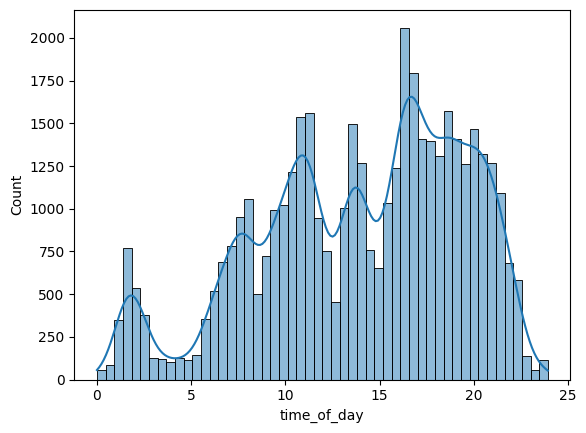

  0%|                                                                                  | 1/996 [00:00<07:17,  2.27it/s]

00115b9f


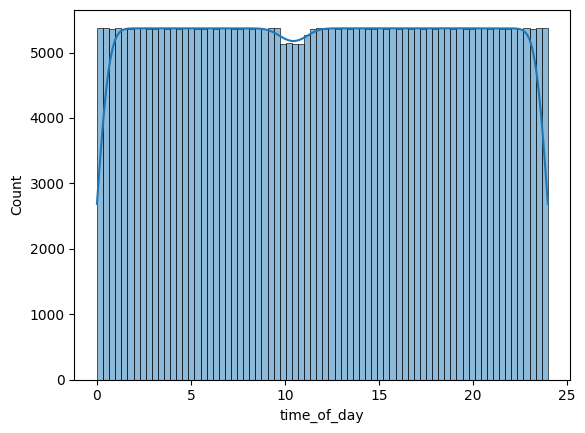

  0%|▏                                                                                 | 2/996 [00:03<33:25,  2.02s/it]

001f3379


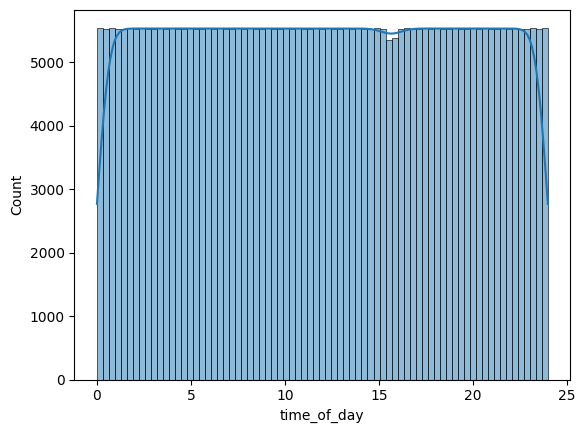

  0%|▏                                                                                 | 3/996 [00:06<42:39,  2.58s/it]

00f332d1


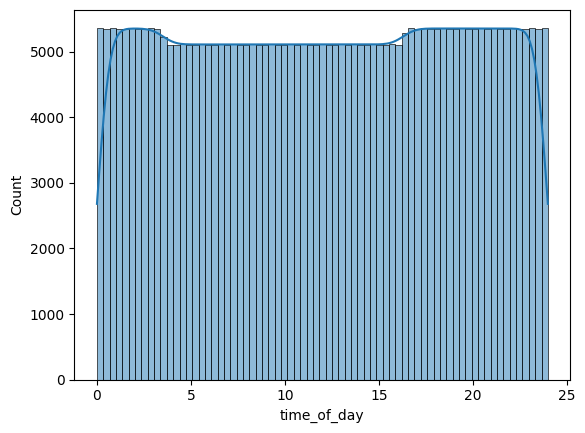

  0%|▎                                                                                 | 4/996 [00:09<44:50,  2.71s/it]

01085eb3


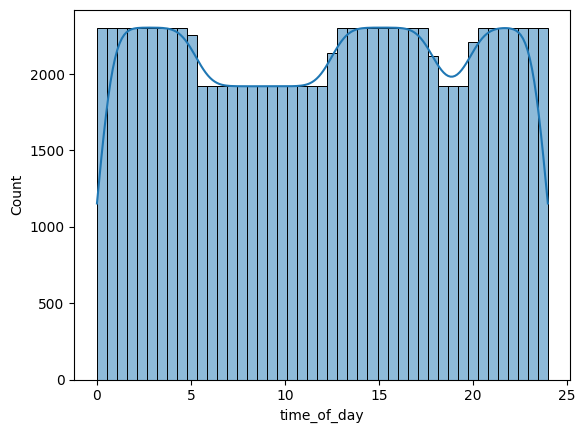

  1%|▍                                                                                 | 5/996 [00:10<33:37,  2.04s/it]

012cadd8


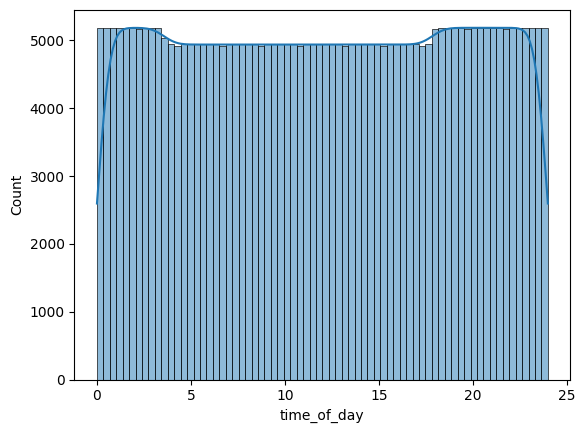

  1%|▍                                                                                 | 6/996 [00:13<37:50,  2.29s/it]

012e3869


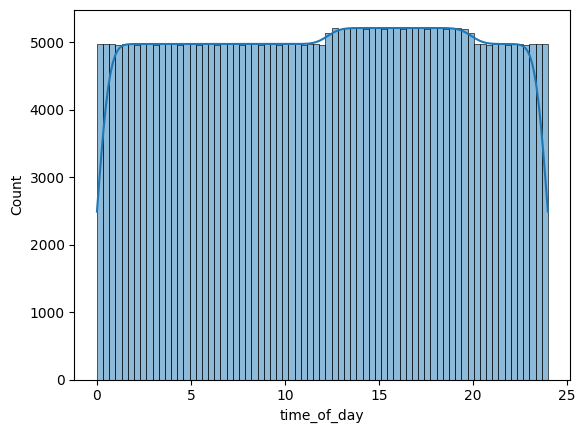

  1%|▌                                                                                 | 7/996 [00:16<41:03,  2.49s/it]

029a19c9


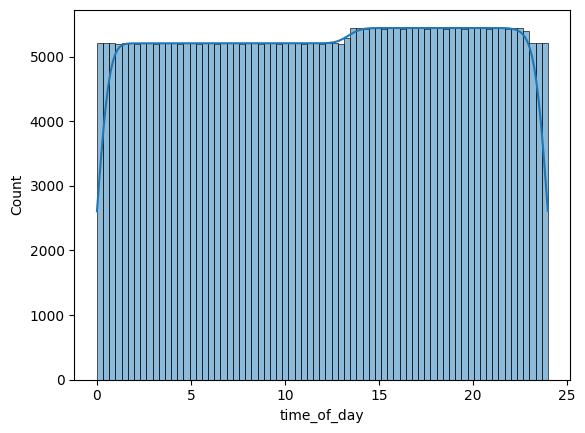

  1%|▋                                                                                 | 8/996 [00:19<43:44,  2.66s/it]

02cebf33


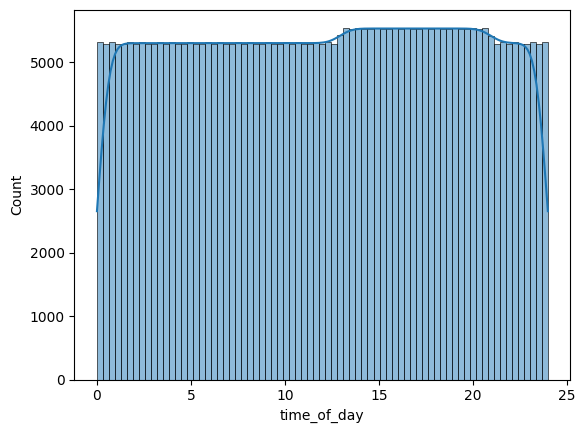

  1%|▋                                                                                 | 9/996 [00:22<47:07,  2.86s/it]

02cf7384


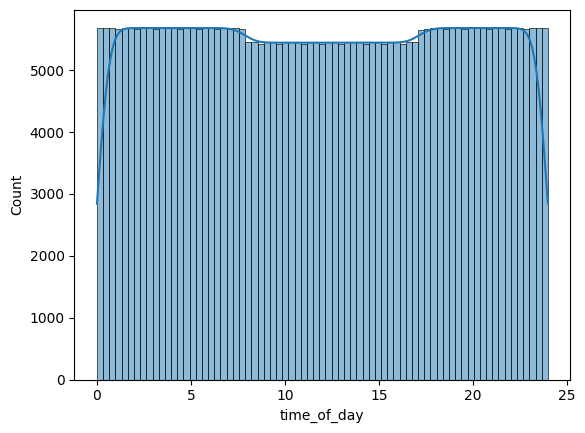

  1%|▊                                                                                | 10/996 [00:25<48:33,  2.96s/it]

035c96dd


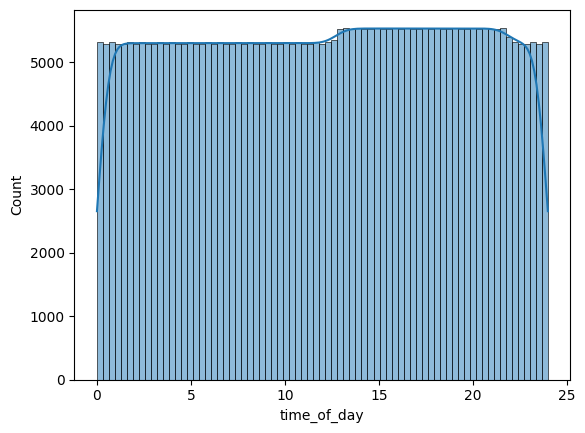

  1%|▉                                                                                | 11/996 [00:28<49:18,  3.00s/it]

03a9019b


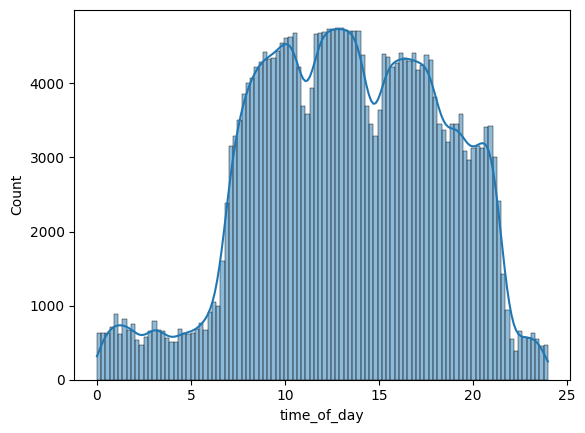

  1%|▉                                                                                | 12/996 [00:31<45:10,  2.75s/it]

0417c91e


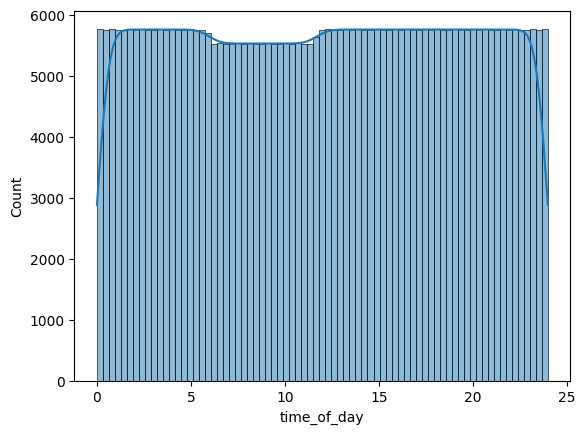

  1%|█                                                                                | 13/996 [00:34<47:46,  2.92s/it]

045a0a94


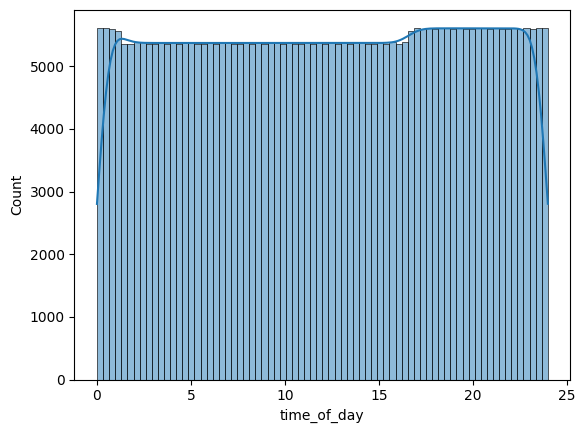

  1%|█▏                                                                               | 14/996 [00:37<48:43,  2.98s/it]

04afb6f9


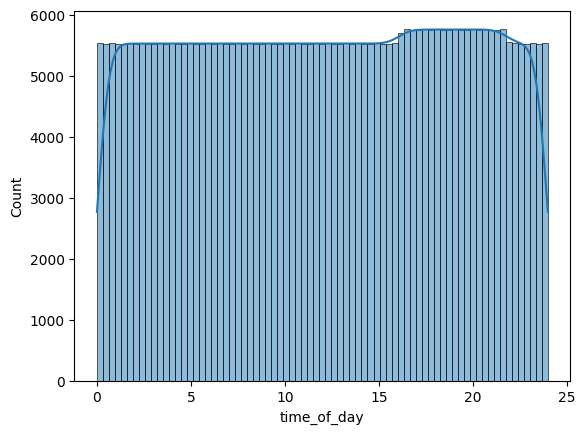

  2%|█▏                                                                               | 15/996 [00:40<49:52,  3.05s/it]

04bb1a76


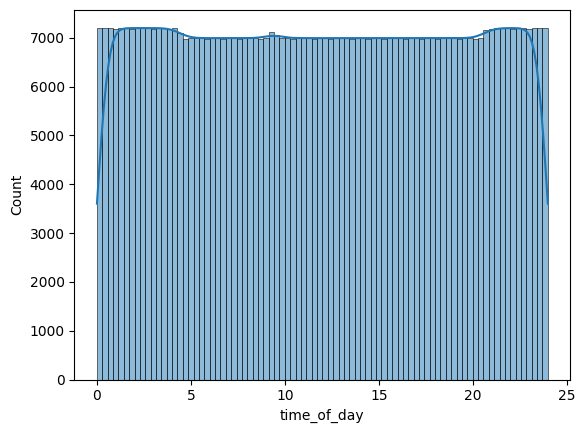

  2%|█▎                                                                               | 16/996 [00:45<56:46,  3.48s/it]

04cb2c30


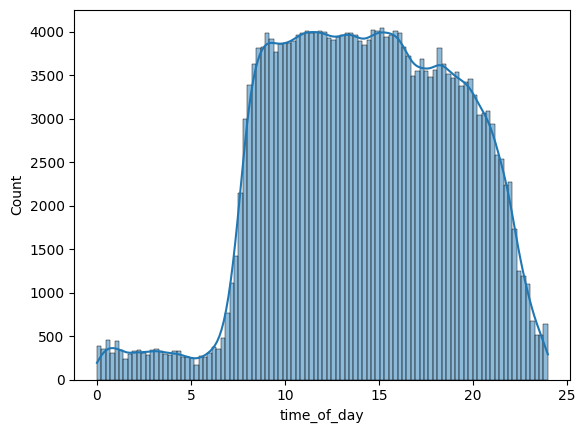

  2%|█▍                                                                               | 17/996 [00:47<48:52,  3.00s/it]

04d06a9c


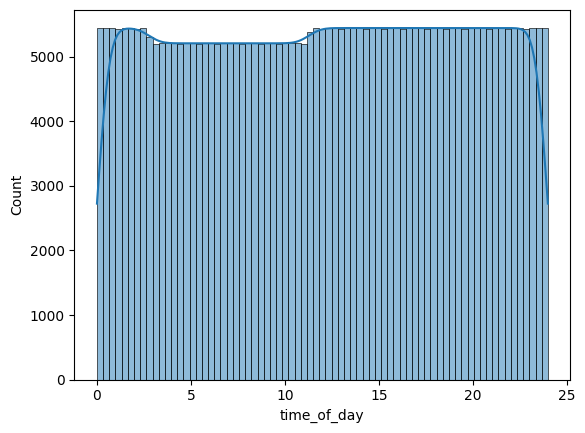

  2%|█▍                                                                               | 18/996 [00:50<48:58,  3.00s/it]

04f094a8


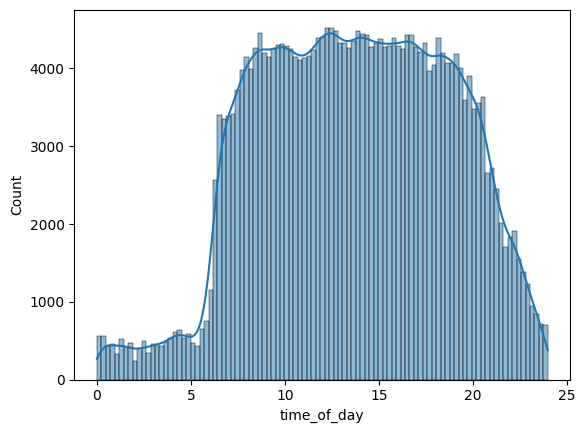

  2%|█▌                                                                               | 19/996 [00:52<44:55,  2.76s/it]

051680a0


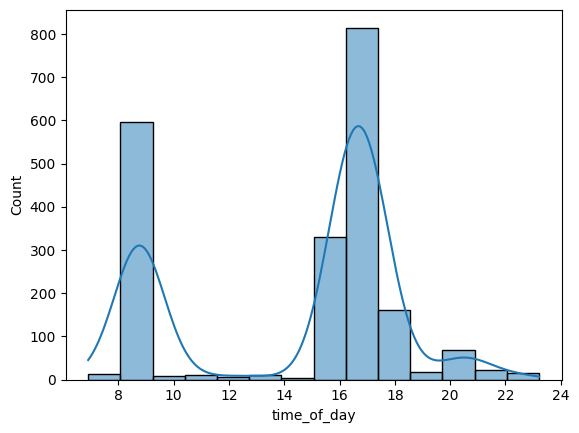

  2%|█▋                                                                               | 20/996 [00:52<31:54,  1.96s/it]

055156e2


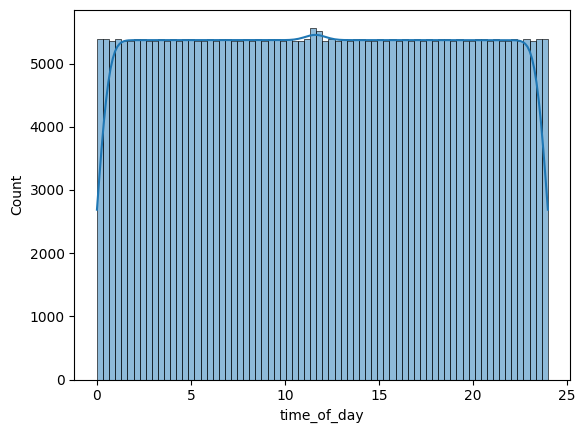

  2%|█▋                                                                               | 21/996 [00:55<37:16,  2.29s/it]

059eed01


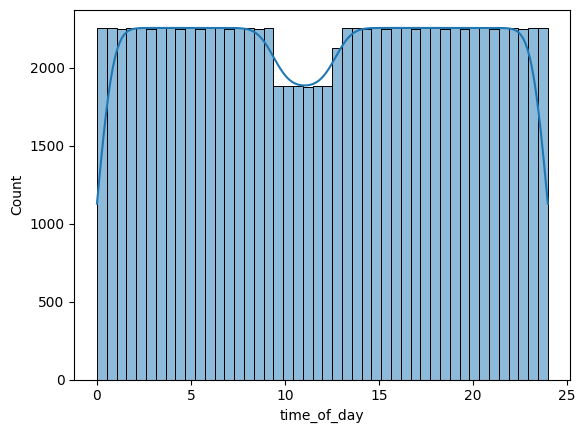

  2%|█▊                                                                               | 22/996 [00:56<30:12,  1.86s/it]

05bbed1b


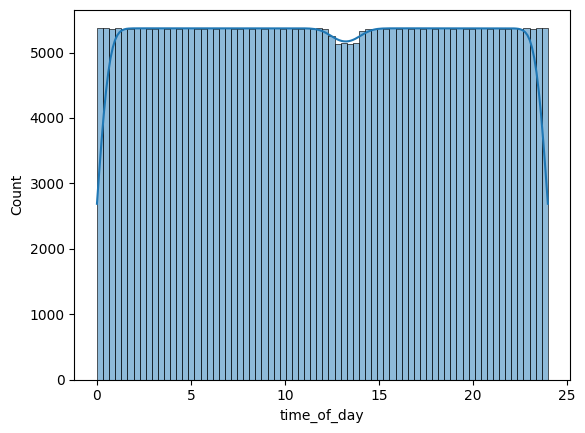

  2%|█▊                                                                               | 23/996 [00:59<36:00,  2.22s/it]

05db1b9b


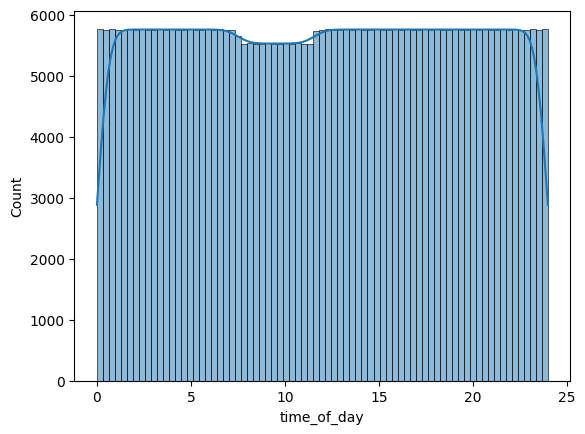

  2%|█▉                                                                               | 24/996 [01:02<41:14,  2.55s/it]

05e94f88


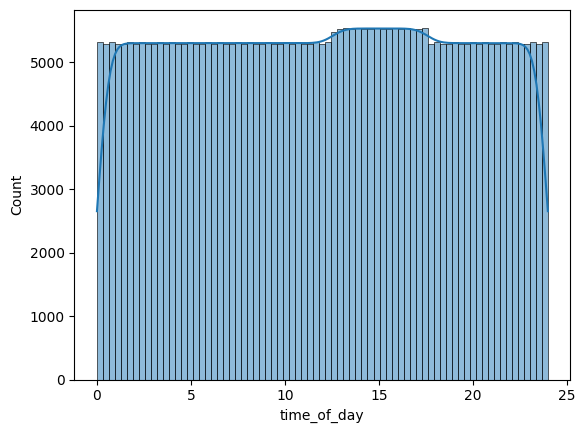

  3%|██                                                                               | 25/996 [01:05<43:50,  2.71s/it]

063b16fc


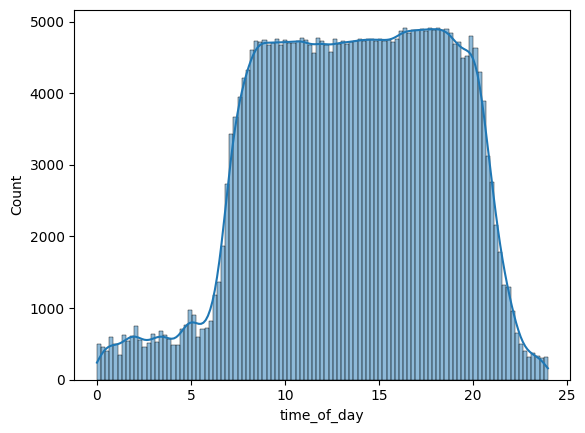

  3%|██                                                                               | 26/996 [01:08<42:37,  2.64s/it]

064e8da5


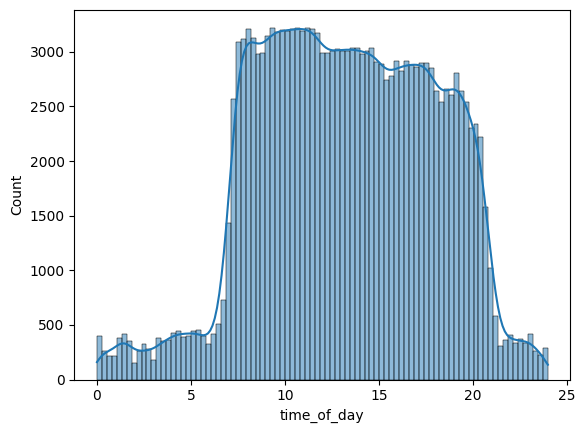

  3%|██▏                                                                              | 27/996 [01:09<36:19,  2.25s/it]

0668373f


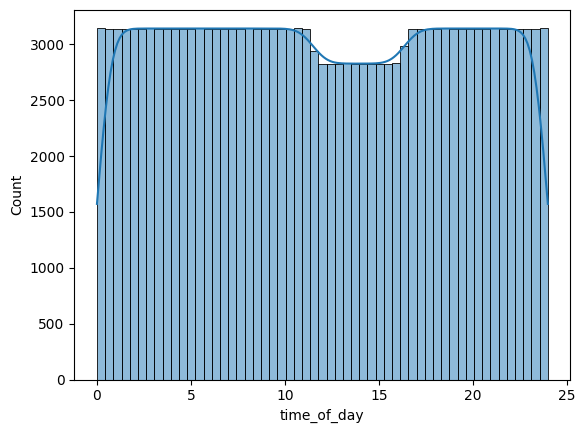

  3%|██▎                                                                              | 28/996 [01:10<32:04,  1.99s/it]

067b9287


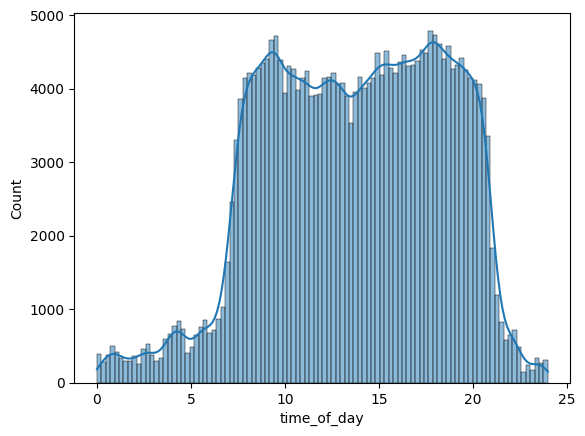

  3%|██▎                                                                              | 29/996 [01:12<32:21,  2.01s/it]

06c8b2fb


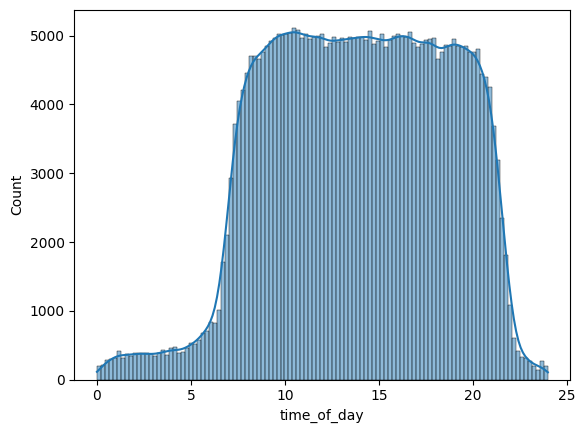

  3%|██▍                                                                              | 30/996 [01:15<35:00,  2.17s/it]

06eb8adb


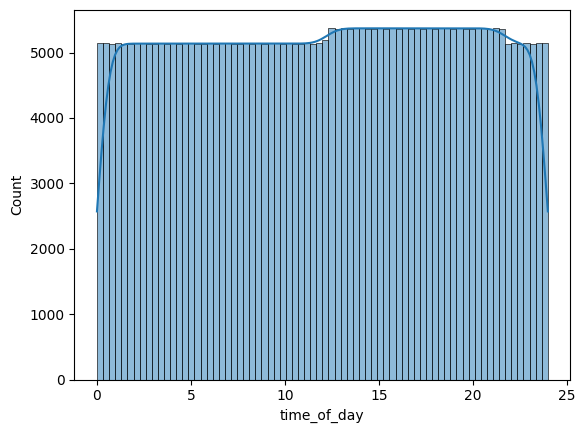

  3%|██▌                                                                              | 31/996 [01:18<38:55,  2.42s/it]

070386b2


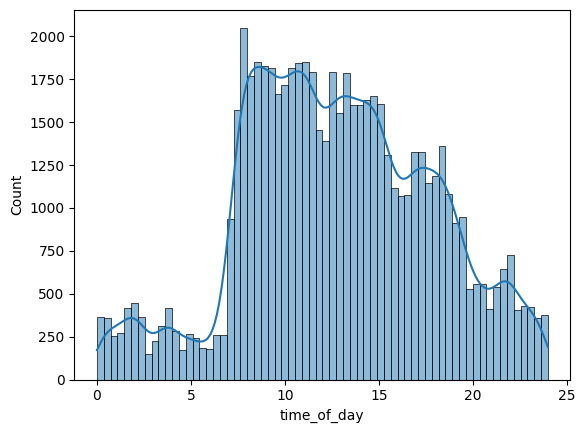

  3%|██▌                                                                              | 32/996 [01:19<31:05,  1.94s/it]

07048067


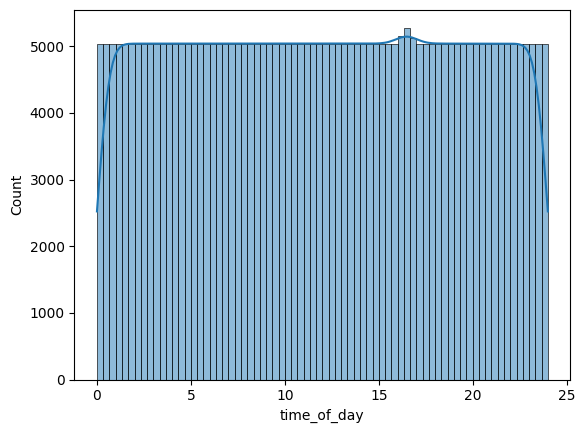

  3%|██▋                                                                              | 33/996 [01:22<35:20,  2.20s/it]

0720320e


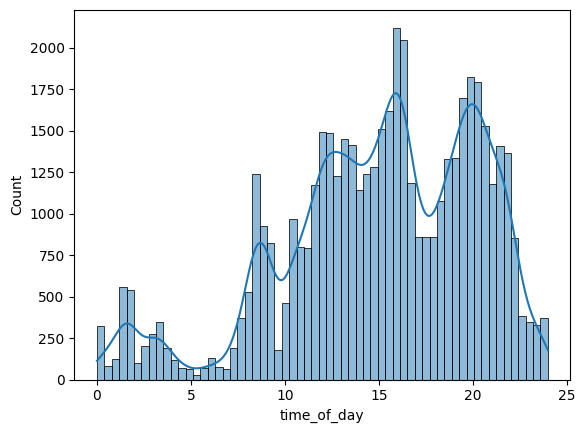

  3%|██▊                                                                              | 34/996 [01:22<27:03,  1.69s/it]

0745c390


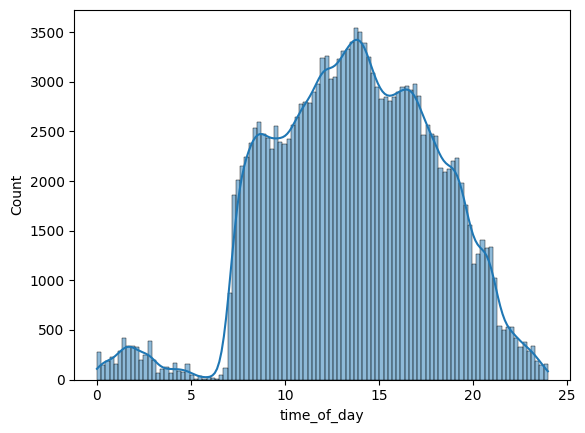

  4%|██▊                                                                              | 35/996 [01:23<25:27,  1.59s/it]

080698b7


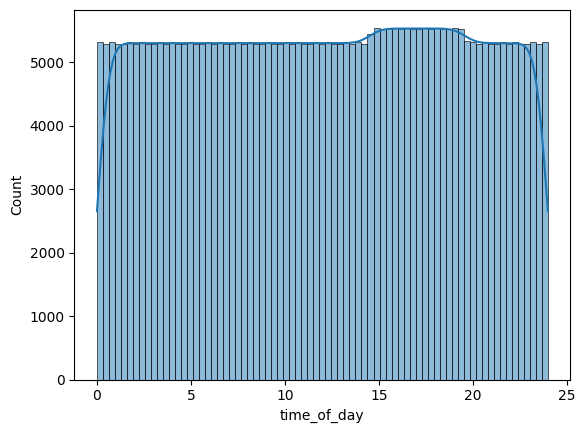

  4%|██▉                                                                              | 36/996 [01:27<32:36,  2.04s/it]

082df556


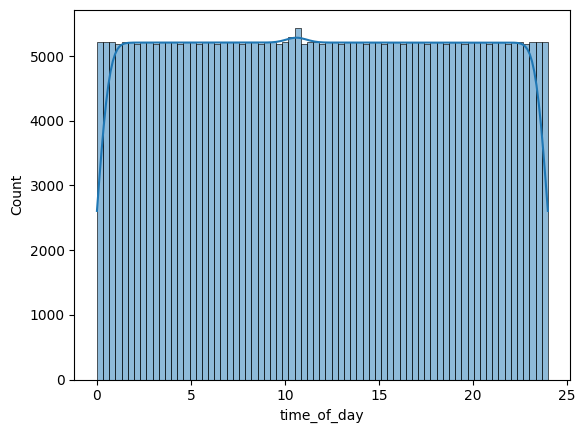

  4%|███                                                                              | 37/996 [01:29<36:51,  2.31s/it]

08577722


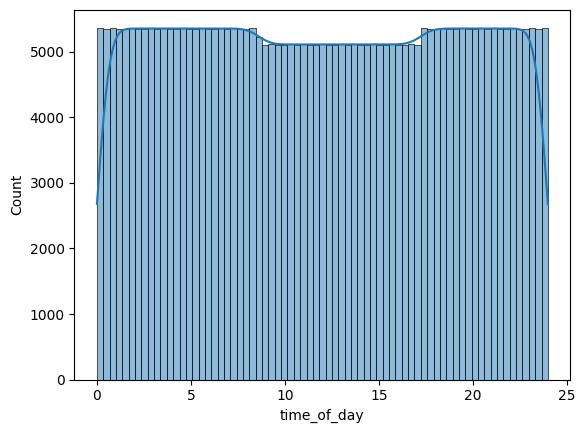

  4%|███                                                                              | 38/996 [01:32<39:41,  2.49s/it]

08660d12


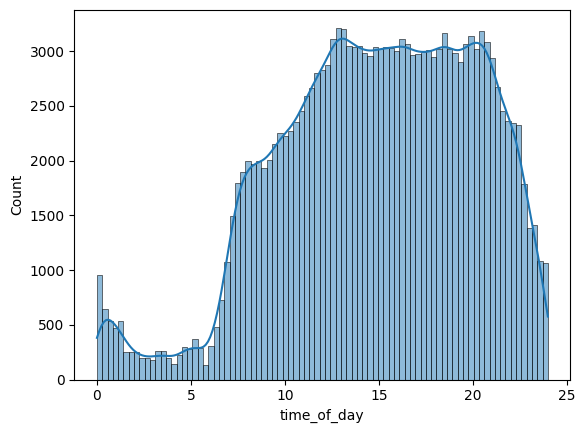

  4%|███▏                                                                             | 39/996 [01:34<34:07,  2.14s/it]

089a6b19


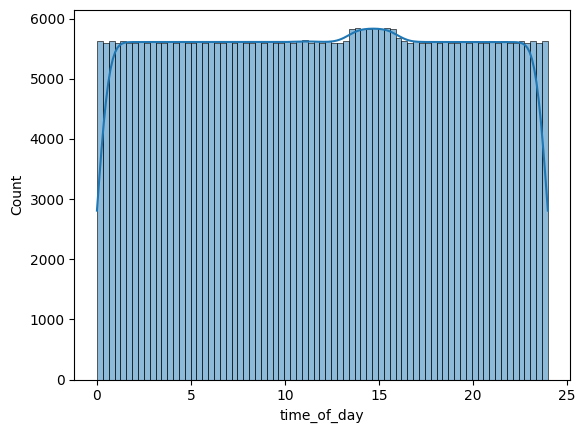

  4%|███▎                                                                             | 40/996 [01:37<39:46,  2.50s/it]

09331bb8


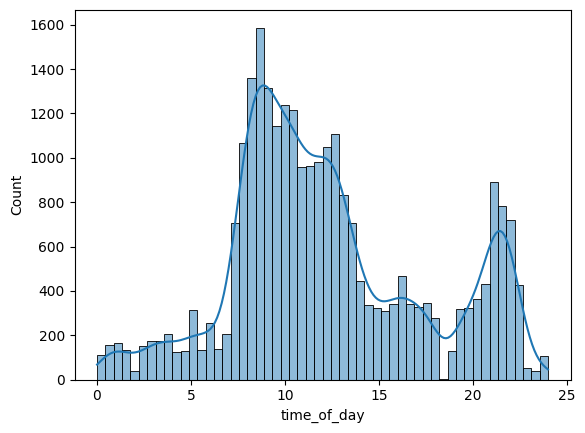

  4%|███▎                                                                             | 41/996 [01:37<29:16,  1.84s/it]

0983654b


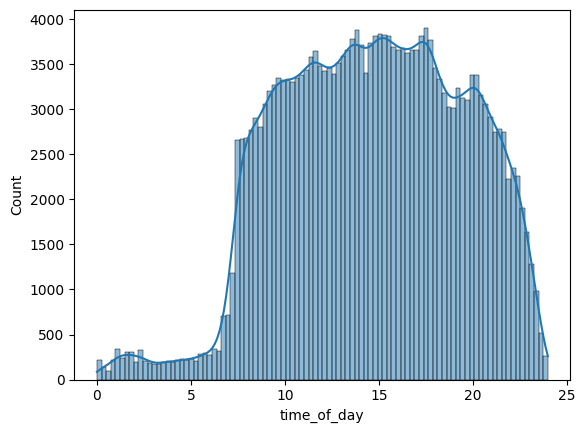

  4%|███▍                                                                             | 42/996 [01:39<28:34,  1.80s/it]

099e3614


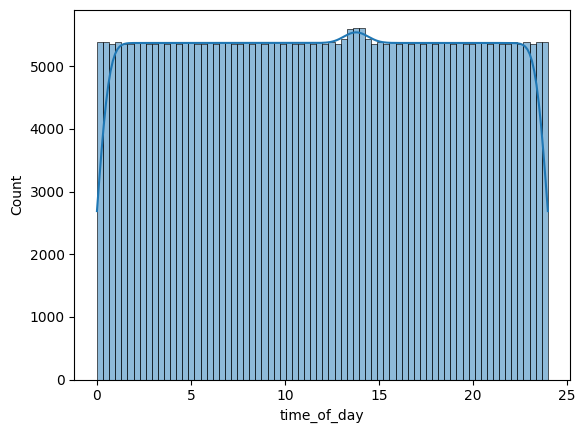

  4%|███▍                                                                             | 43/996 [01:42<34:34,  2.18s/it]

09b29113


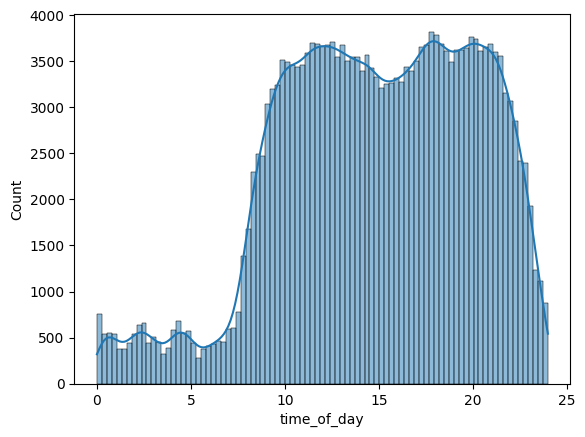

  4%|███▌                                                                             | 44/996 [01:44<32:08,  2.03s/it]

0a418b57


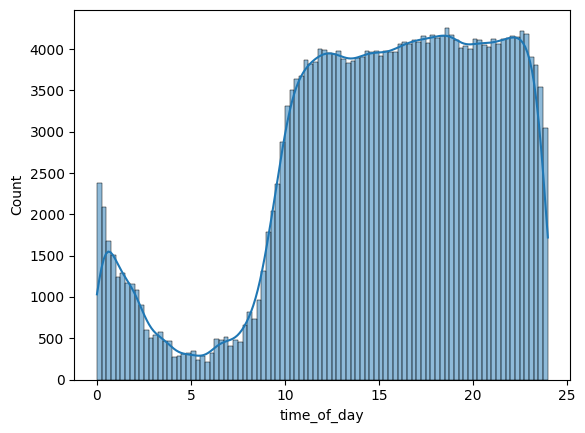

  5%|███▋                                                                             | 45/996 [01:46<32:01,  2.02s/it]

0a431608


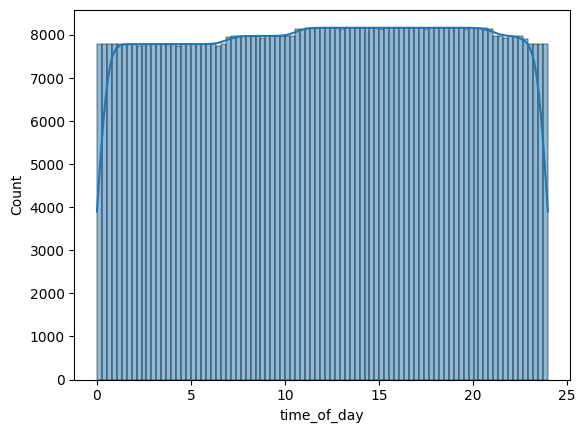

  5%|███▋                                                                             | 46/996 [01:51<47:58,  3.03s/it]

0b4014f0


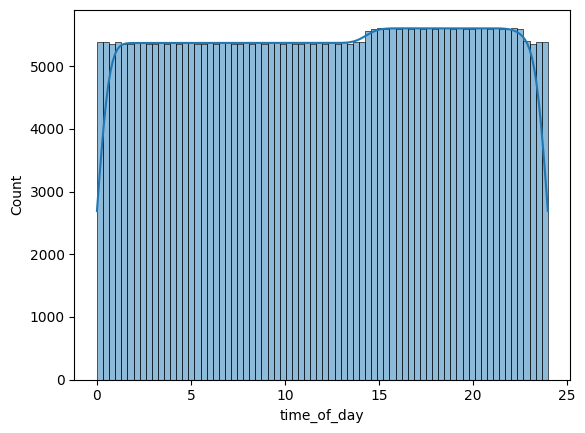

  5%|███▊                                                                             | 47/996 [01:54<48:17,  3.05s/it]

0b50f3fa


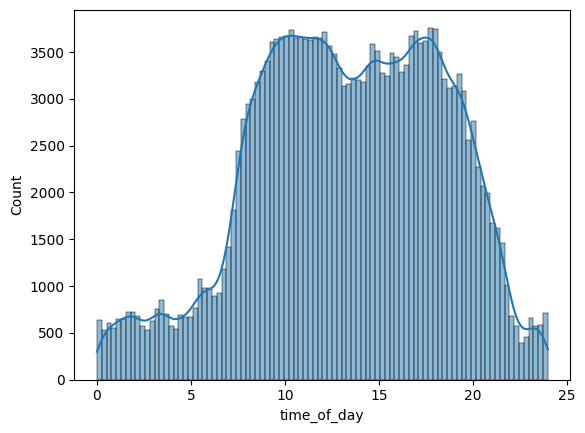

  5%|███▉                                                                             | 48/996 [01:56<41:34,  2.63s/it]

0b518637


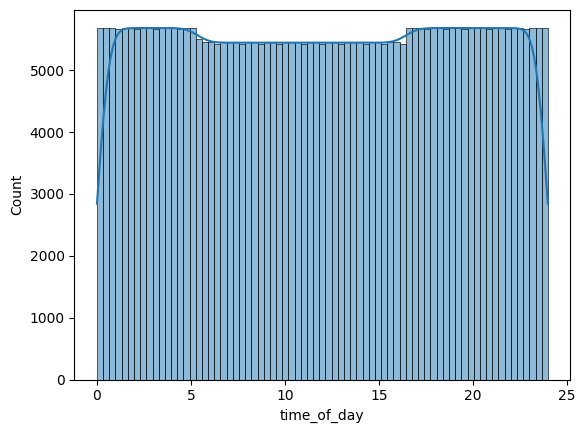

  5%|███▉                                                                             | 49/996 [01:59<43:53,  2.78s/it]

0b7d7aec


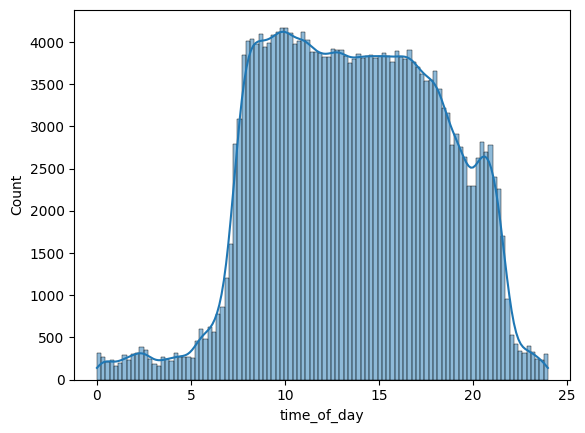

  5%|████                                                                             | 50/996 [02:01<39:34,  2.51s/it]

0b7d9da6


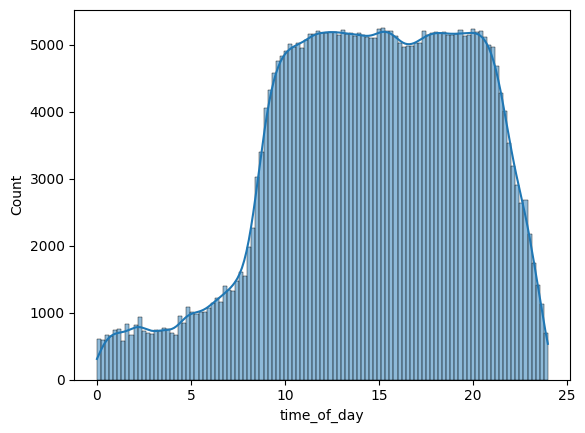

  5%|████▏                                                                            | 51/996 [02:04<40:34,  2.58s/it]

0bd89878


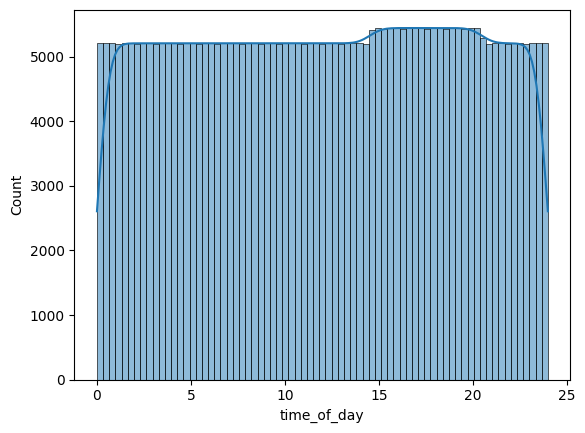

  5%|████▏                                                                            | 52/996 [02:07<42:26,  2.70s/it]

0bfe4fc9


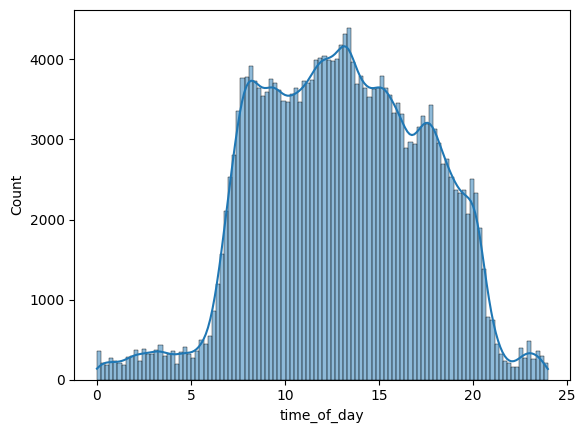

  5%|████▎                                                                            | 53/996 [02:08<38:07,  2.43s/it]

0c4e2d68


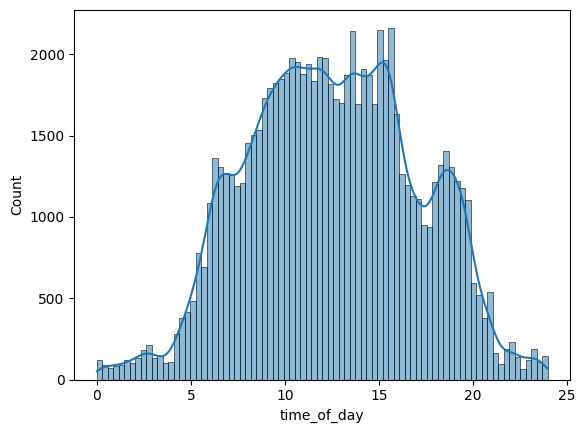

  5%|████▍                                                                            | 54/996 [02:09<30:04,  1.92s/it]

0c4eabac


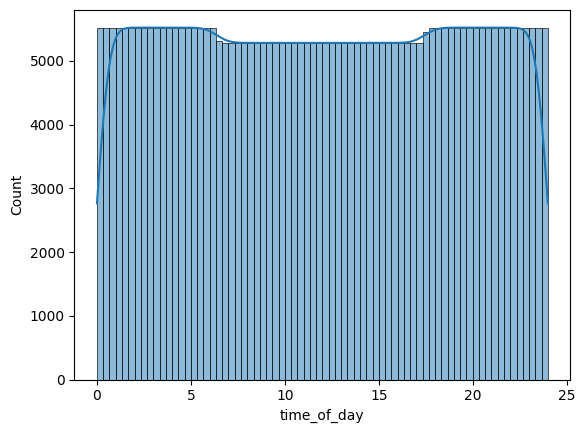

  6%|████▍                                                                            | 55/996 [02:12<36:17,  2.31s/it]

0c98f822


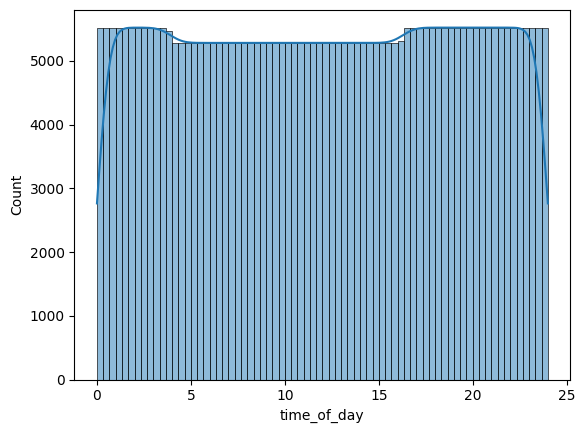

  6%|████▌                                                                            | 56/996 [02:15<39:28,  2.52s/it]

0cbe4e54


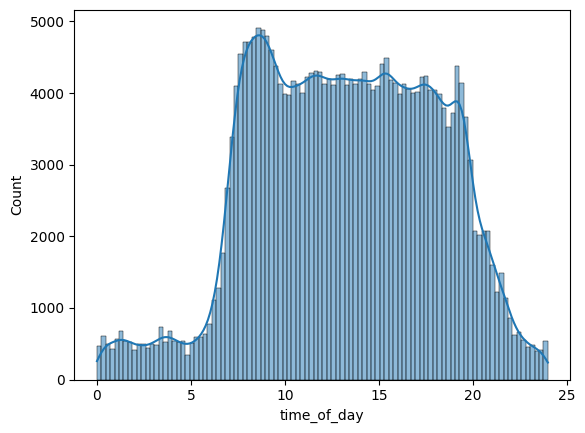

  6%|████▋                                                                            | 57/996 [02:17<37:14,  2.38s/it]

0d01bbf2


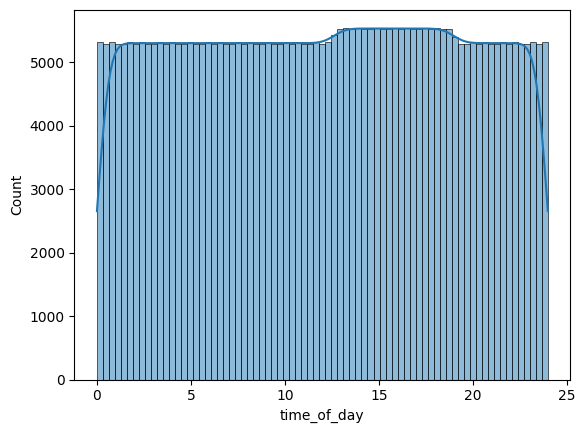

  6%|████▋                                                                            | 58/996 [02:21<40:36,  2.60s/it]

0d279d77


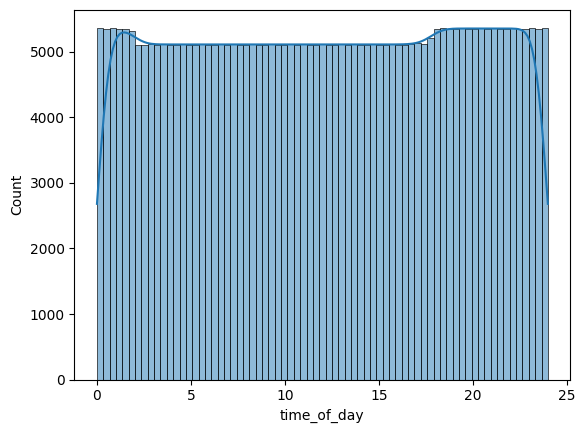

  6%|████▊                                                                            | 59/996 [02:23<41:44,  2.67s/it]

0d4800c8


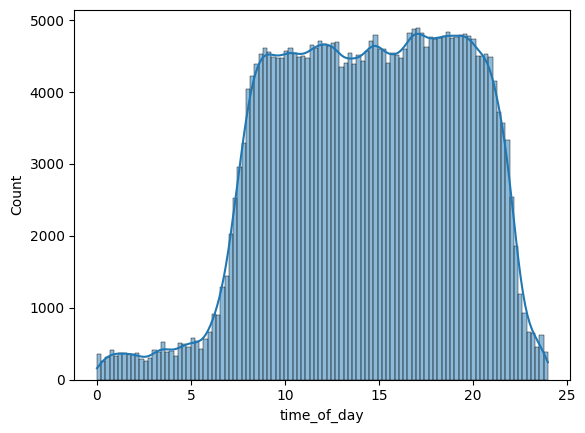

  6%|████▉                                                                            | 60/996 [02:26<40:09,  2.57s/it]

0d4fa8f4


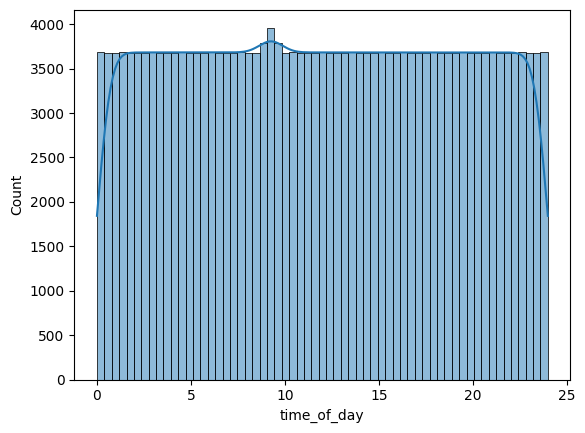

  6%|████▉                                                                            | 61/996 [02:28<36:30,  2.34s/it]

0d570d3e


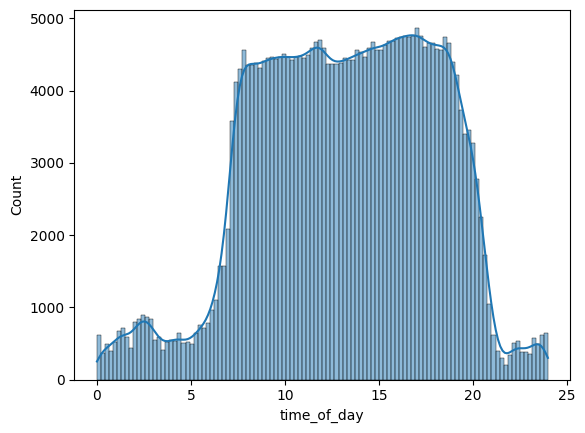

  6%|█████                                                                            | 62/996 [02:30<36:22,  2.34s/it]

0d924604


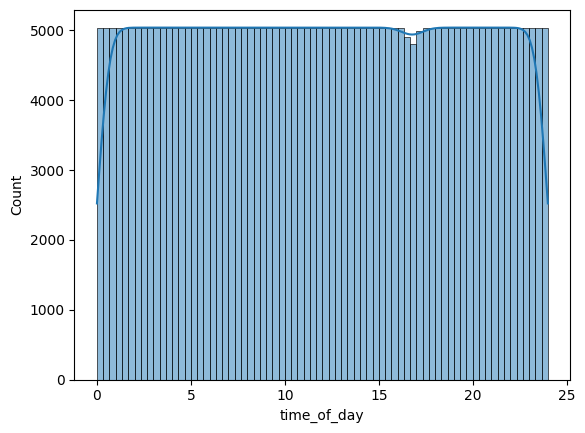

  6%|█████                                                                            | 63/996 [02:33<38:32,  2.48s/it]

0e3b0bd2


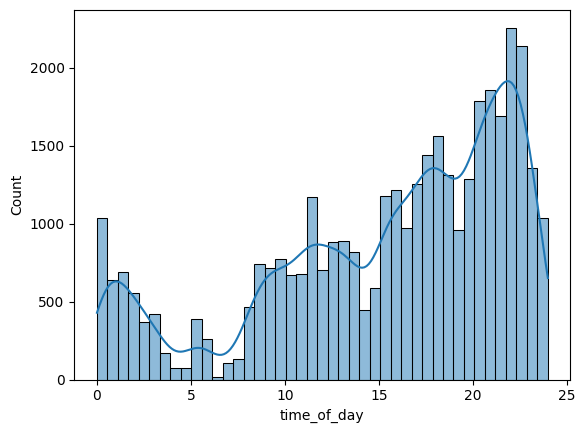

  6%|█████▏                                                                           | 64/996 [02:33<28:41,  1.85s/it]

0ec403df


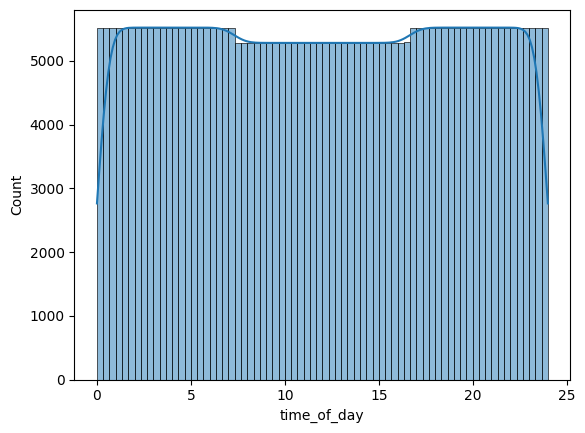

  7%|█████▎                                                                           | 65/996 [02:36<34:05,  2.20s/it]

0ed2a3c8


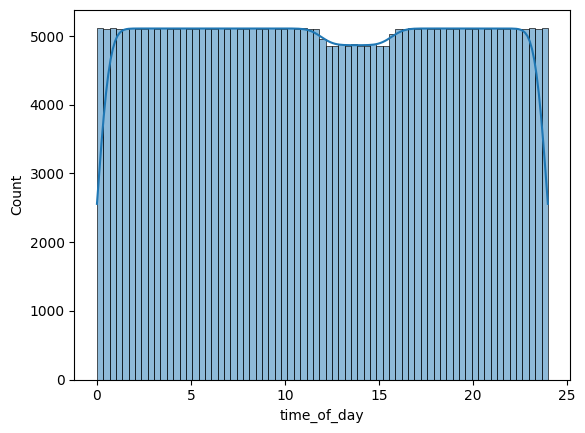

  7%|█████▎                                                                           | 66/996 [02:39<36:48,  2.38s/it]

0eddd8e5


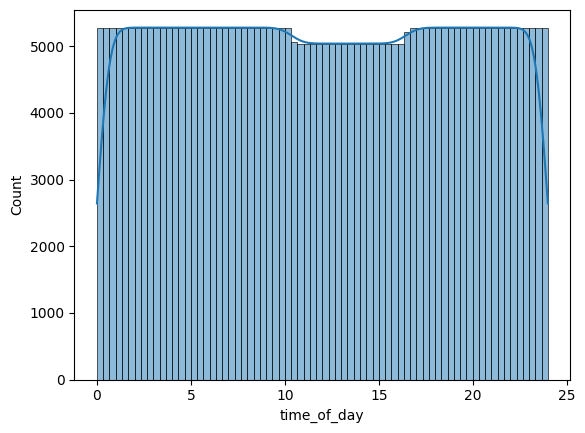

  7%|█████▍                                                                           | 67/996 [02:42<39:14,  2.53s/it]

0f6b71c4


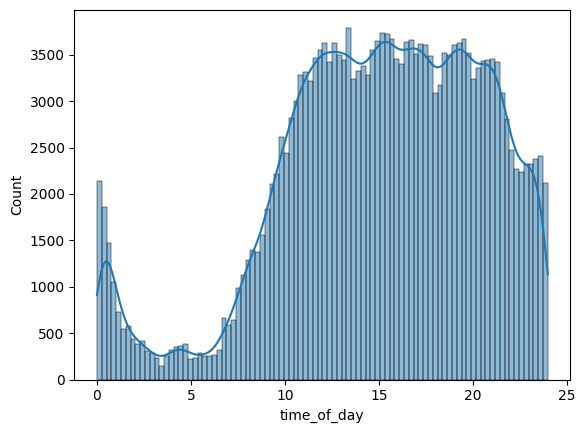

  7%|█████▌                                                                           | 68/996 [02:43<35:09,  2.27s/it]

0fbb3ca5


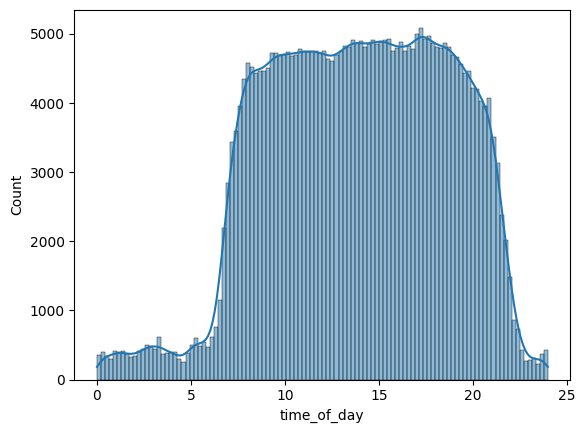

  7%|█████▌                                                                           | 69/996 [02:46<36:05,  2.34s/it]

101774f0


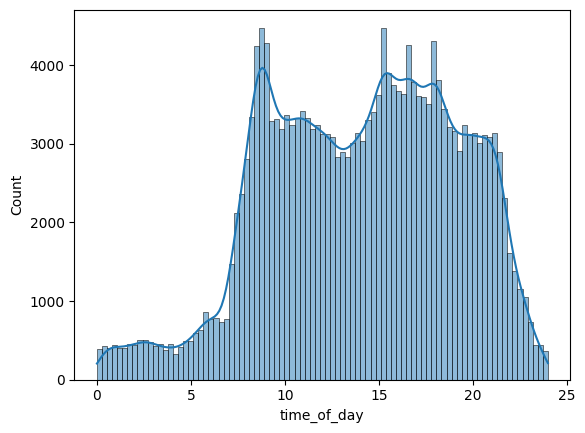

  7%|█████▋                                                                           | 70/996 [02:48<32:35,  2.11s/it]

101c27f1


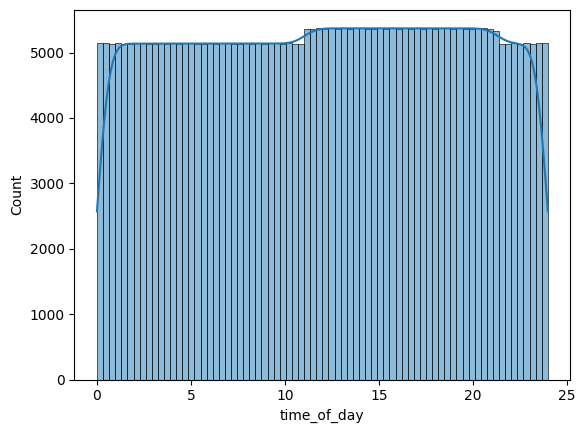

  7%|█████▊                                                                           | 71/996 [02:51<36:39,  2.38s/it]

108b8659


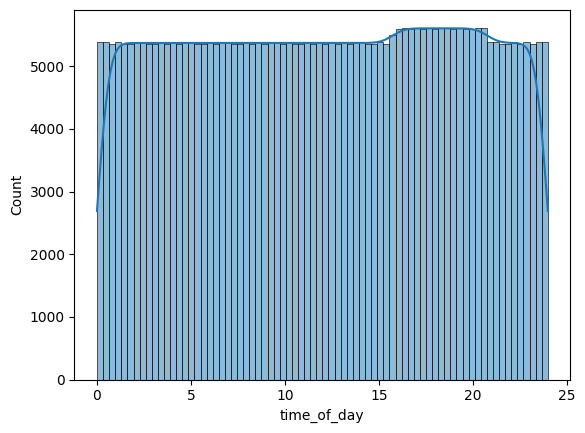

  7%|█████▊                                                                           | 72/996 [02:54<39:58,  2.60s/it]

10ad8c48


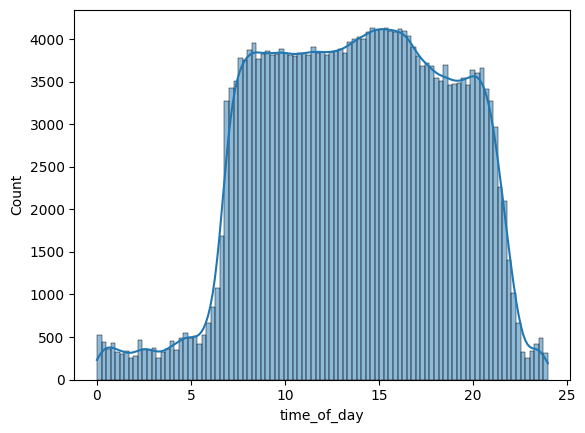

  7%|█████▉                                                                           | 73/996 [02:56<36:52,  2.40s/it]

10e46254


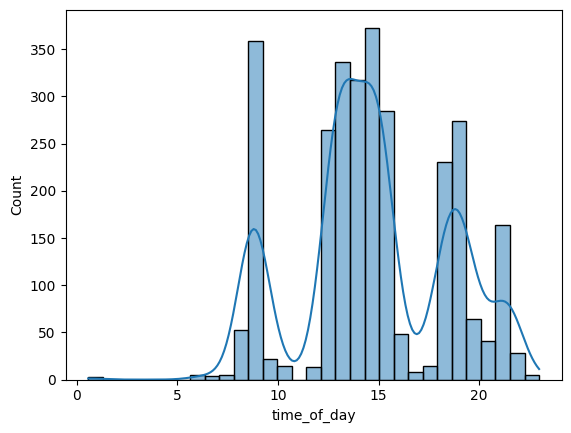

  7%|██████                                                                           | 74/996 [02:56<26:17,  1.71s/it]

113f5798


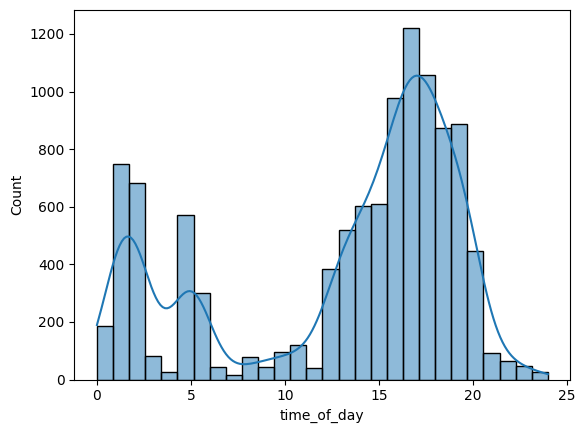

  8%|██████                                                                           | 75/996 [02:56<19:08,  1.25s/it]

11739de2


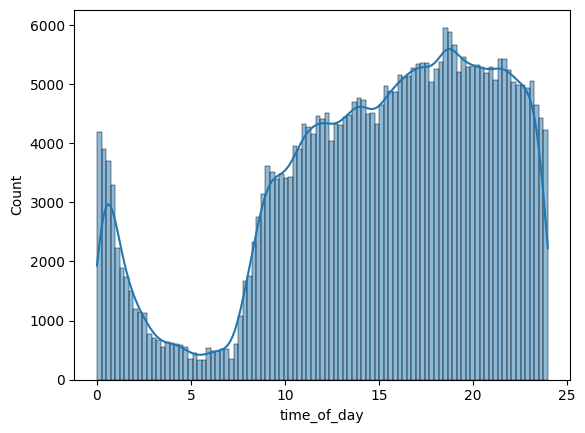

  8%|██████▏                                                                          | 76/996 [02:58<25:28,  1.66s/it]

119d7562


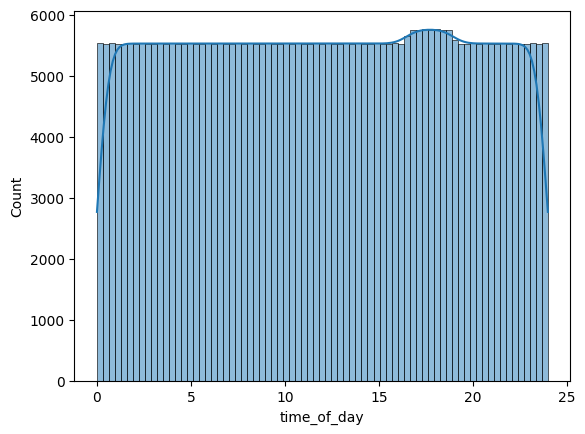

  8%|██████▎                                                                          | 77/996 [03:02<32:29,  2.12s/it]

119e181e


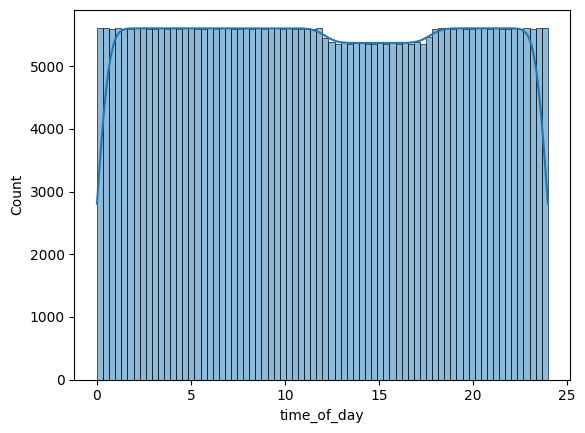

  8%|██████▎                                                                          | 78/996 [03:05<37:12,  2.43s/it]

11be5d2e


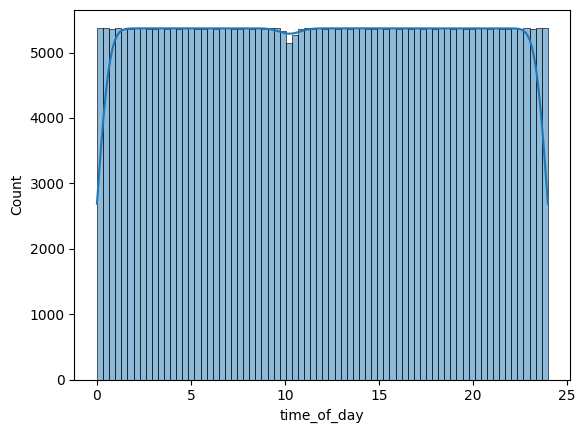

  8%|██████▍                                                                          | 79/996 [03:08<40:05,  2.62s/it]

11f9b26c


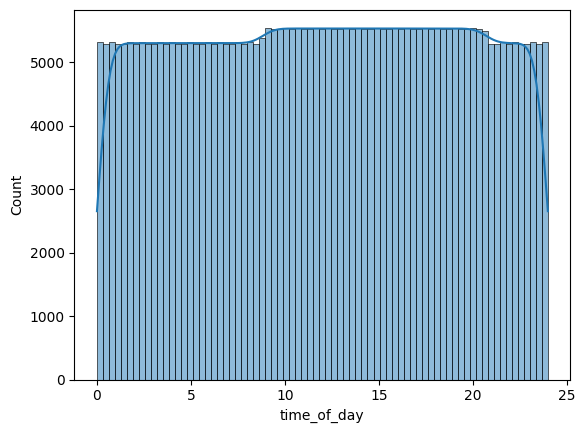

  8%|██████▌                                                                          | 80/996 [03:11<43:27,  2.85s/it]

12380b06


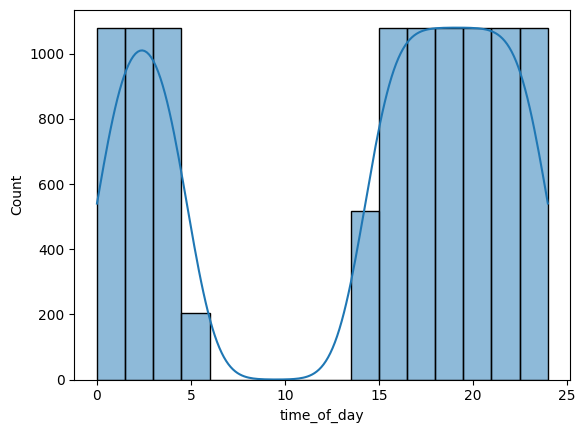

  8%|██████▌                                                                          | 81/996 [03:11<31:06,  2.04s/it]

12a607f6


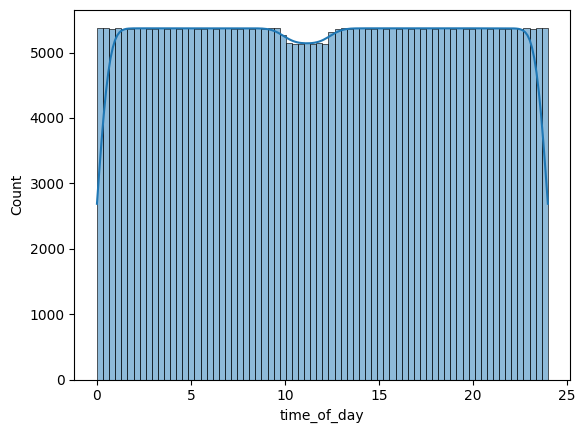

  8%|██████▋                                                                          | 82/996 [03:14<35:37,  2.34s/it]

1301f65d


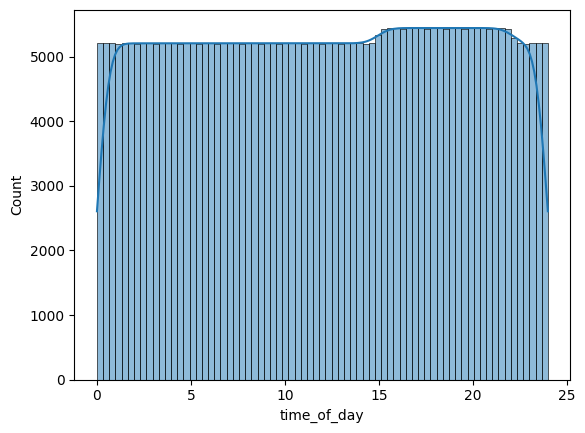

  8%|██████▊                                                                          | 83/996 [03:17<38:32,  2.53s/it]

1314bc8c


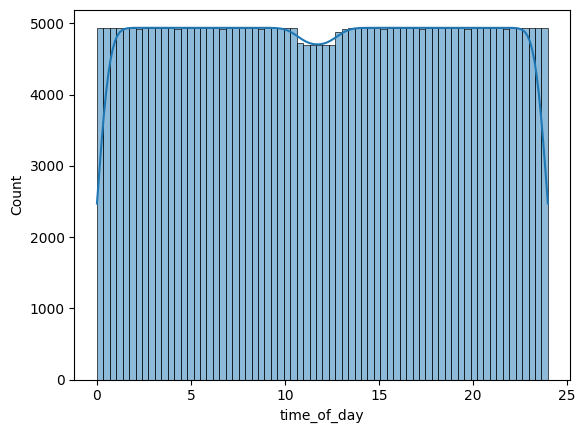

  8%|██████▊                                                                          | 84/996 [03:20<39:10,  2.58s/it]

137baaec


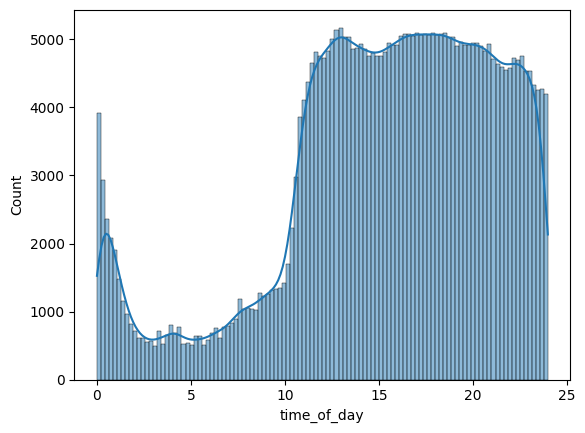

  9%|██████▉                                                                          | 85/996 [03:23<39:31,  2.60s/it]

13eee030


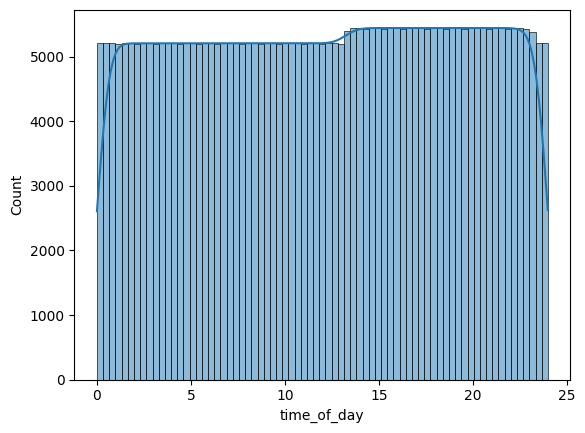

  9%|██████▉                                                                          | 86/996 [03:26<41:14,  2.72s/it]

13fca10c


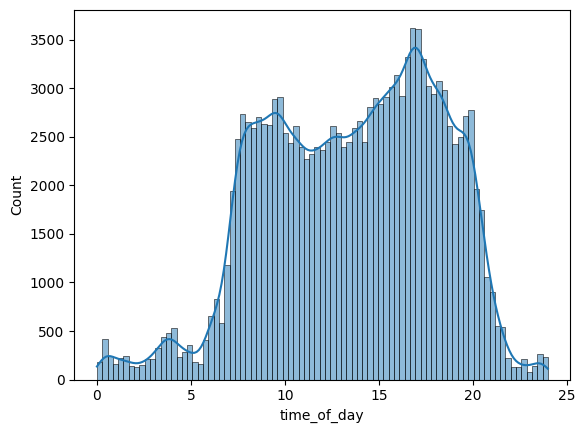

  9%|███████                                                                          | 87/996 [03:28<39:00,  2.57s/it]

14391970


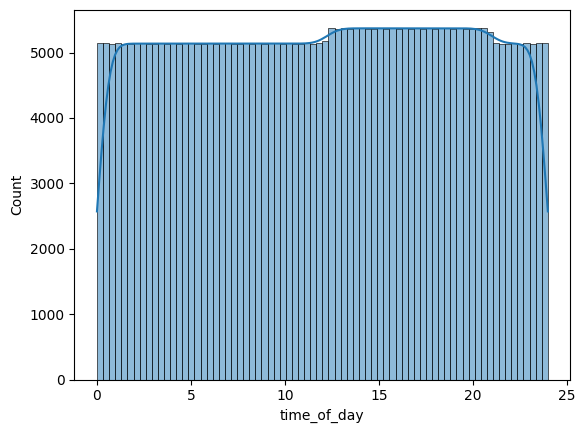

  9%|███████▏                                                                         | 88/996 [03:31<40:54,  2.70s/it]

144a9a79


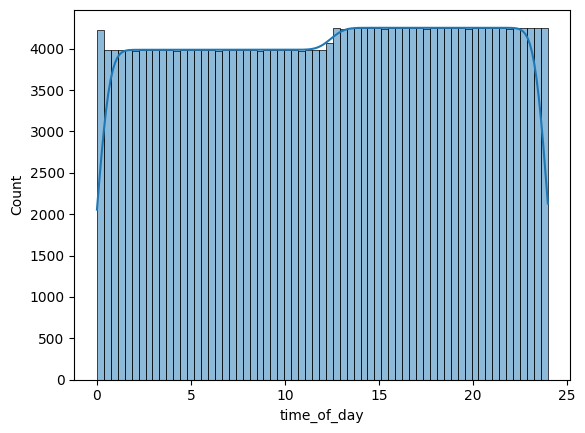

  9%|███████▏                                                                         | 89/996 [03:33<38:20,  2.54s/it]

14568d61


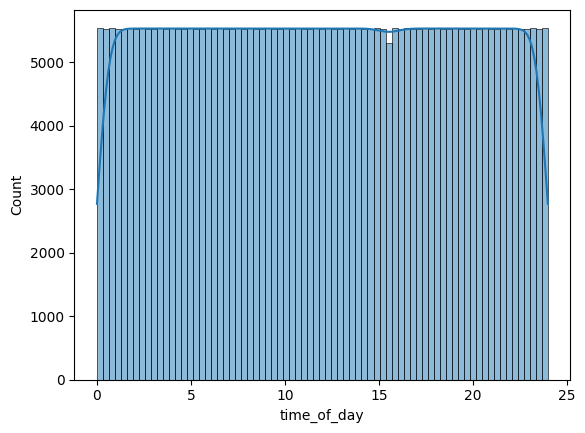

  9%|███████▎                                                                         | 90/996 [03:36<41:19,  2.74s/it]

1470a1df


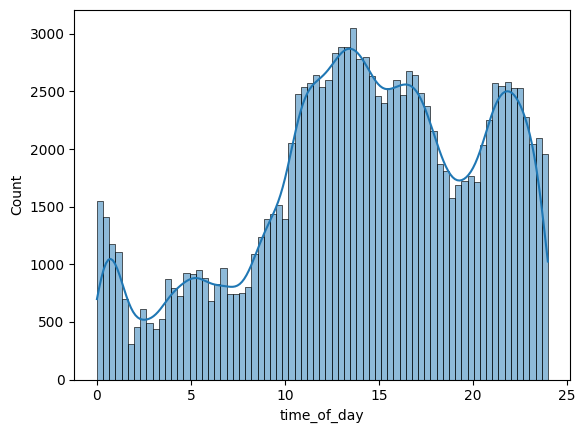

  9%|███████▍                                                                         | 91/996 [03:37<33:47,  2.24s/it]

14a6e58e


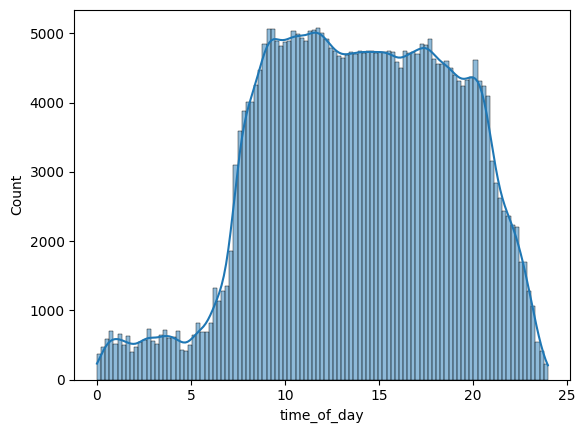

  9%|███████▍                                                                         | 92/996 [03:40<34:56,  2.32s/it]

14b3d6e5


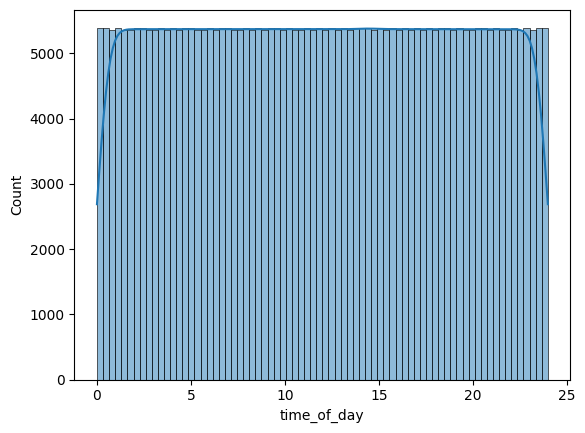

  9%|███████▌                                                                         | 93/996 [03:43<38:18,  2.55s/it]

15227eef


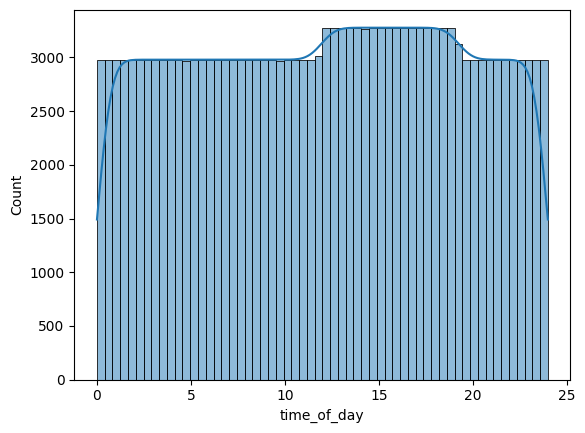

  9%|███████▋                                                                         | 94/996 [03:44<33:22,  2.22s/it]

154d1191


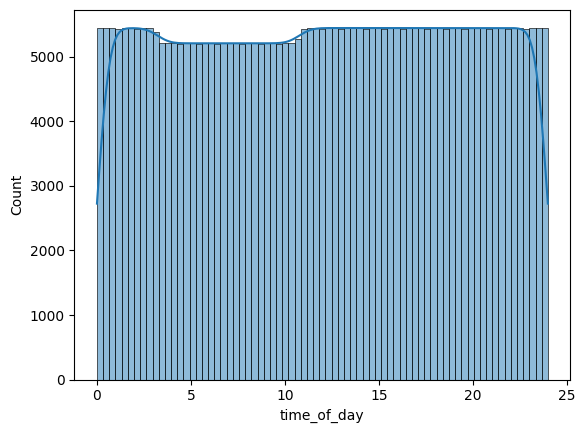

 10%|███████▋                                                                         | 95/996 [03:48<37:01,  2.47s/it]

15dbc929


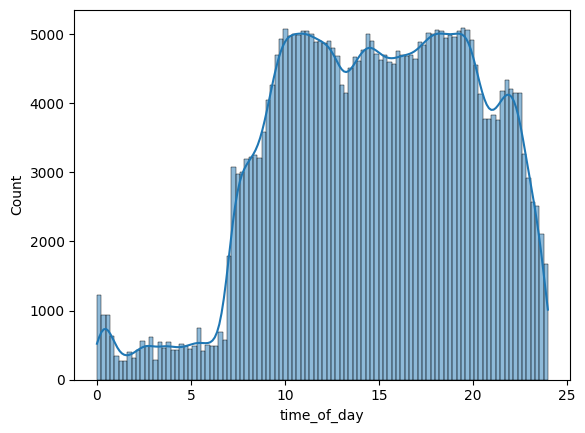

 10%|███████▊                                                                         | 96/996 [03:50<37:07,  2.47s/it]

15f217a6


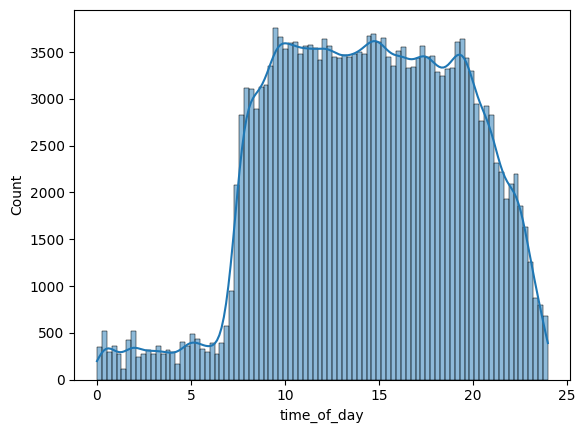

 10%|███████▉                                                                         | 97/996 [03:52<33:16,  2.22s/it]

15f2e240


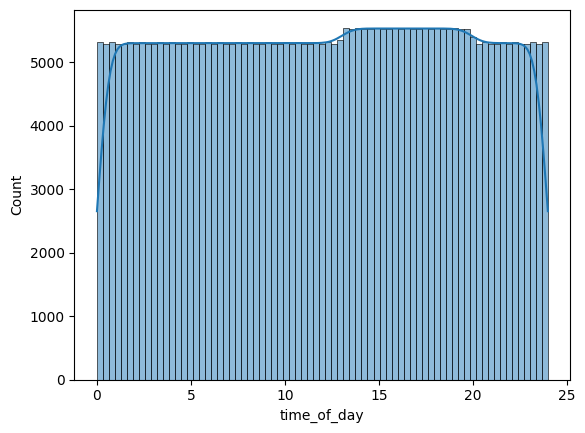

 10%|███████▉                                                                         | 98/996 [03:55<37:13,  2.49s/it]

1606f203


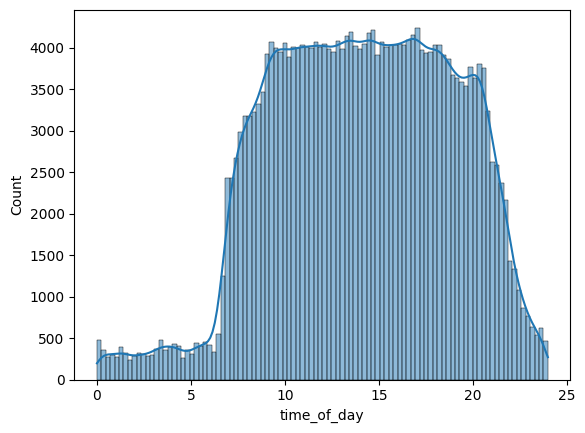

 10%|████████                                                                         | 99/996 [03:57<34:54,  2.34s/it]

1649ce22


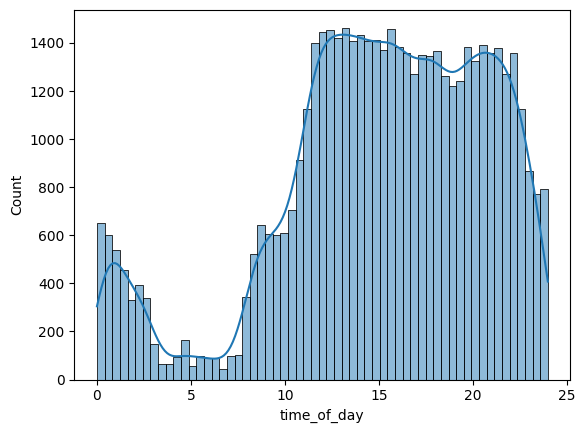

 10%|████████                                                                        | 100/996 [03:57<26:37,  1.78s/it]

17c1ae23


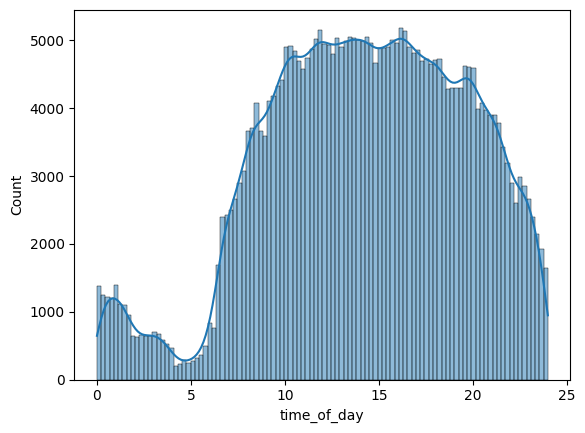

 10%|████████                                                                        | 101/996 [04:00<30:10,  2.02s/it]

1837456f


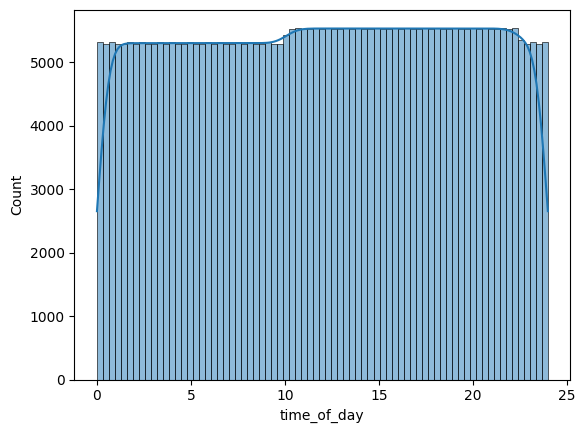

 10%|████████▏                                                                       | 102/996 [04:03<35:09,  2.36s/it]

18b8b2f6


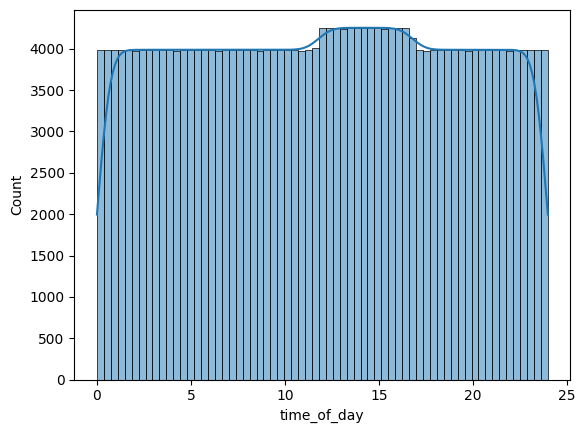

 10%|████████▎                                                                       | 103/996 [04:05<33:59,  2.28s/it]

19098ef0


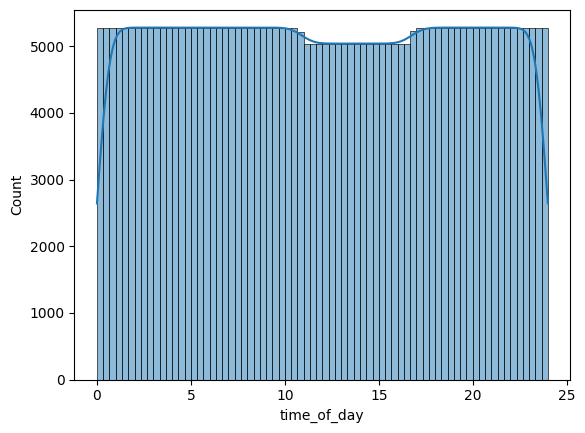

 10%|████████▎                                                                       | 104/996 [04:08<37:56,  2.55s/it]

1911731d


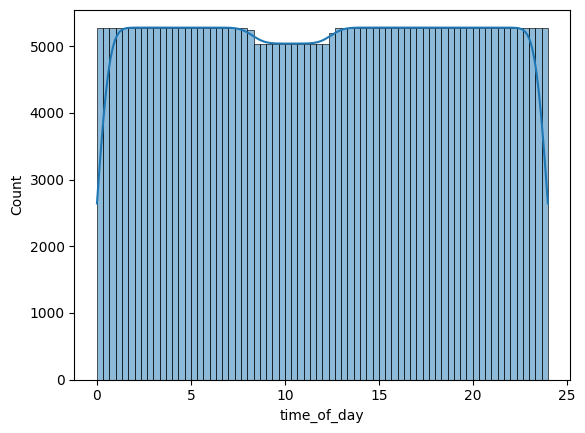

 11%|████████▍                                                                       | 105/996 [04:11<39:39,  2.67s/it]

19455336


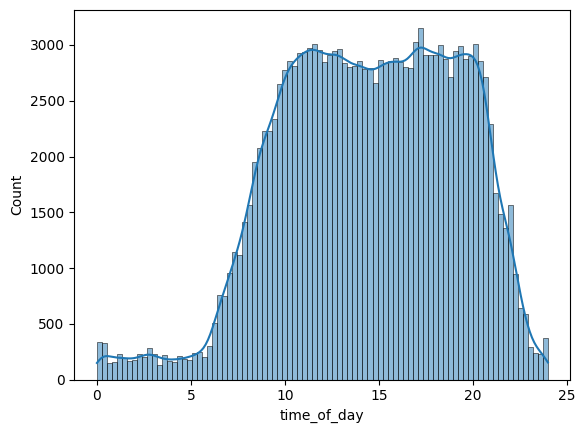

 11%|████████▌                                                                       | 106/996 [04:12<33:23,  2.25s/it]

1957153d


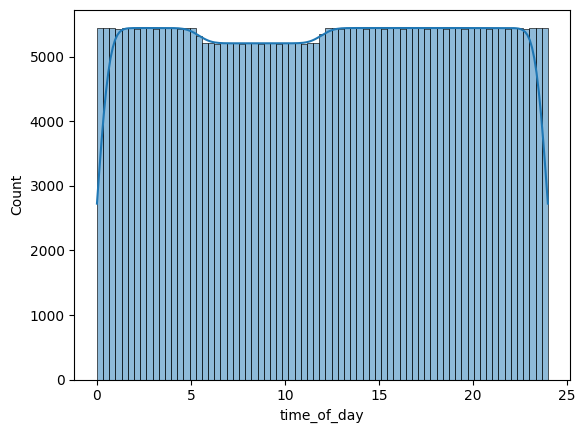

 11%|████████▌                                                                       | 107/996 [04:16<36:54,  2.49s/it]

1a803bfe


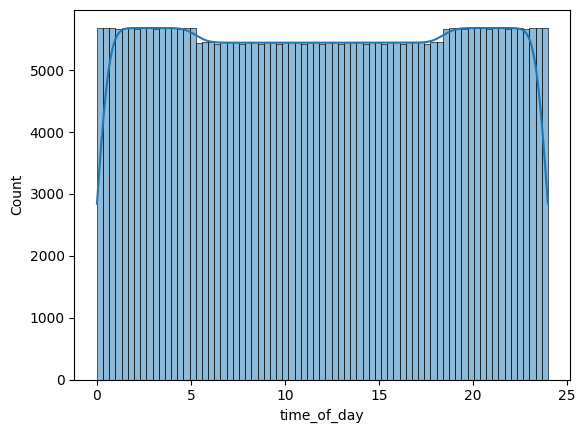

 11%|████████▋                                                                       | 108/996 [04:19<39:45,  2.69s/it]

1aae1de3


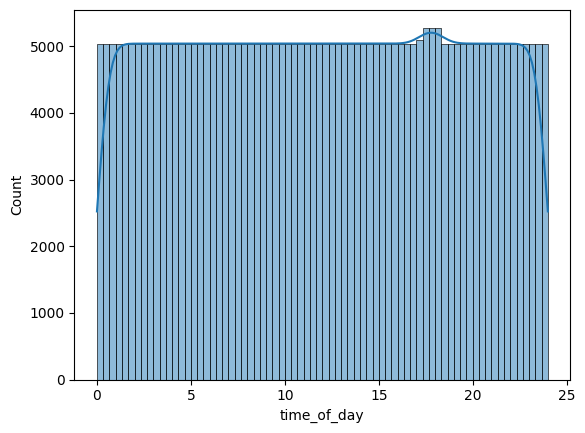

 11%|████████▊                                                                       | 109/996 [04:22<40:26,  2.74s/it]

1aff6762


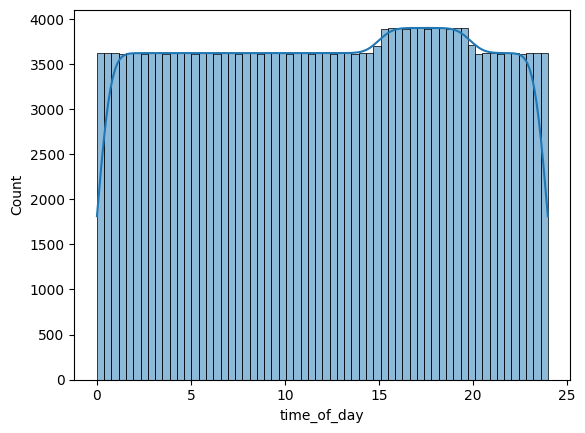

 11%|████████▊                                                                       | 110/996 [04:23<36:25,  2.47s/it]

1b2eea8f


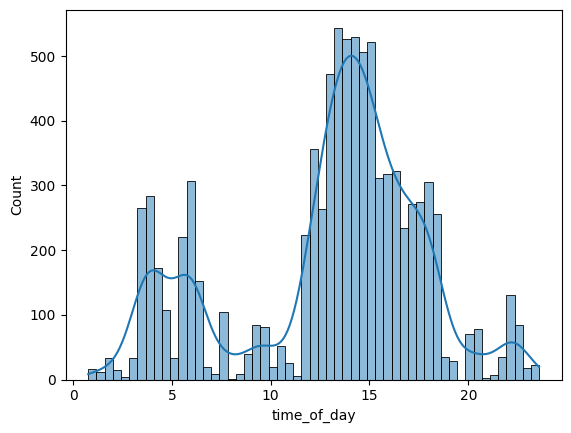

 11%|████████▉                                                                       | 111/996 [04:24<26:13,  1.78s/it]

1b32427b


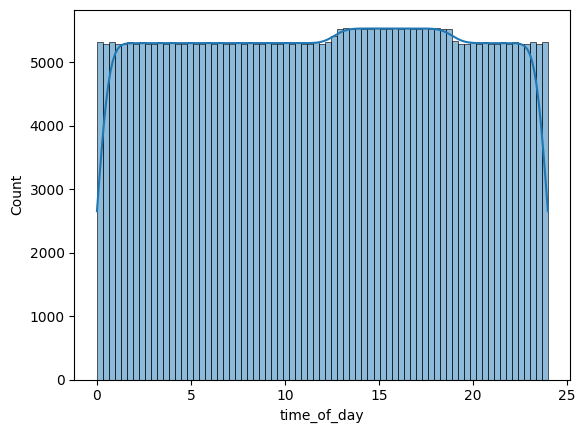

 11%|████████▉                                                                       | 112/996 [04:27<32:04,  2.18s/it]

1b329556


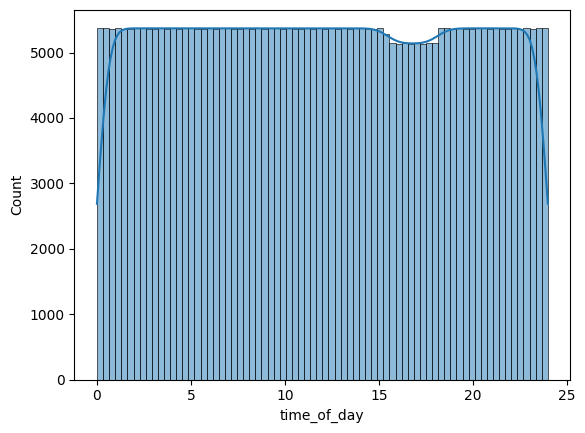

 11%|█████████                                                                       | 113/996 [04:30<36:00,  2.45s/it]

1b5b34bc


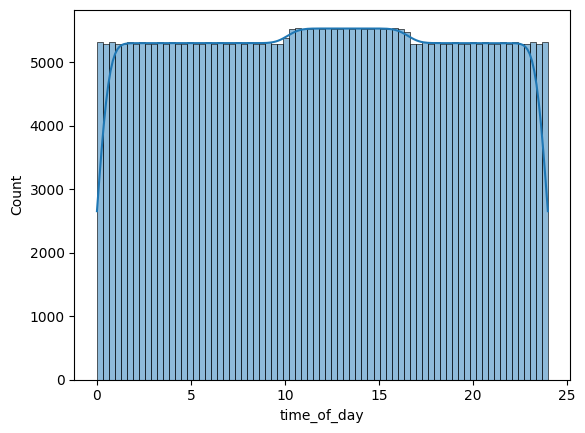

 11%|█████████▏                                                                      | 114/996 [04:33<38:57,  2.65s/it]

1b6fb363


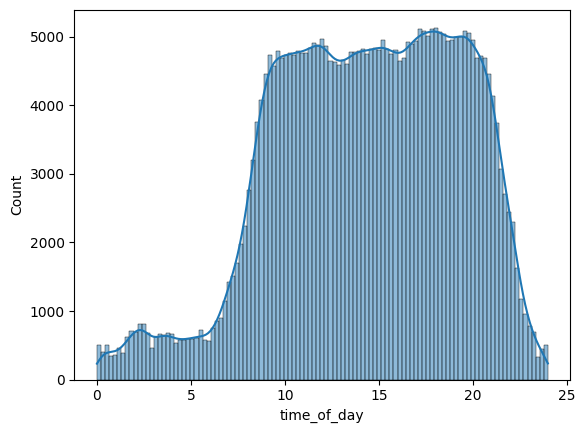

 12%|█████████▏                                                                      | 115/996 [04:35<38:22,  2.61s/it]

1c063ebc


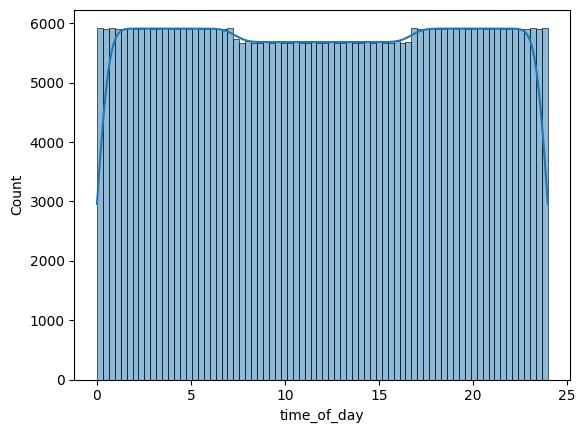

 12%|█████████▎                                                                      | 116/996 [04:39<41:48,  2.85s/it]

1c23295e


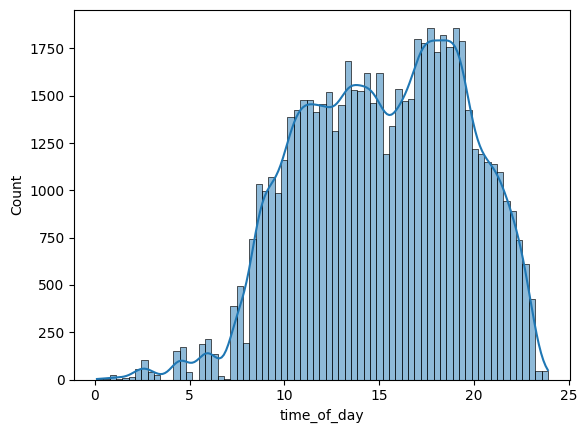

 12%|█████████▍                                                                      | 117/996 [04:39<31:47,  2.17s/it]

1c5ba087


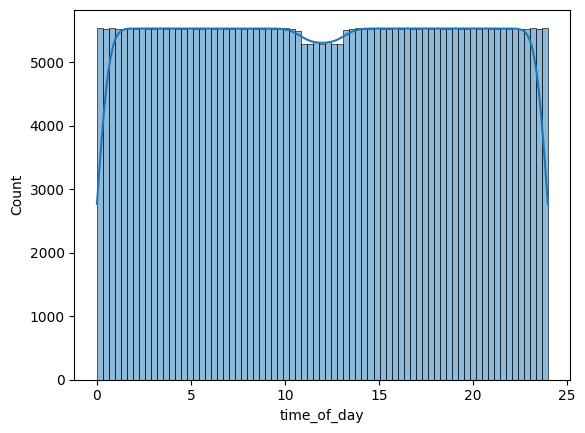

 12%|█████████▍                                                                      | 118/996 [04:43<36:19,  2.48s/it]

1cd37b36


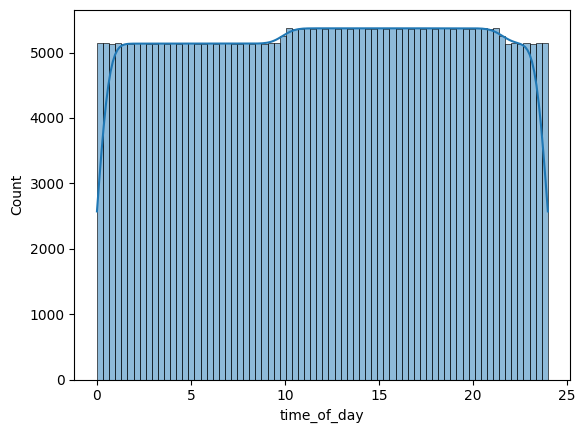

 12%|█████████▌                                                                      | 119/996 [04:46<38:39,  2.64s/it]

1d78b3c3


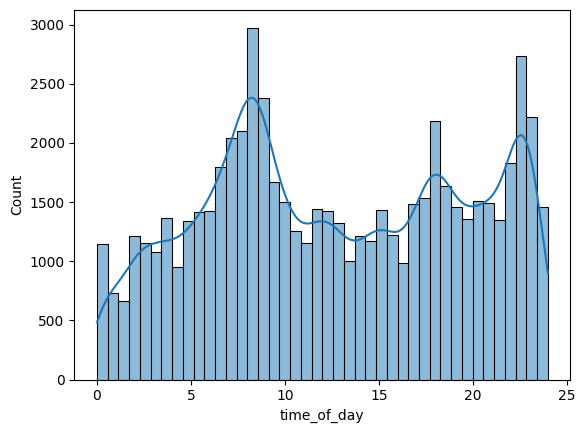

 12%|█████████▋                                                                      | 120/996 [04:46<29:32,  2.02s/it]

1e08b1dc


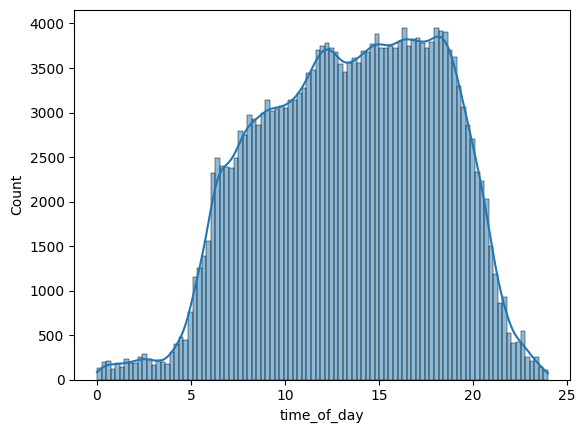

 12%|█████████▋                                                                      | 121/996 [04:48<28:10,  1.93s/it]

1e5f6199


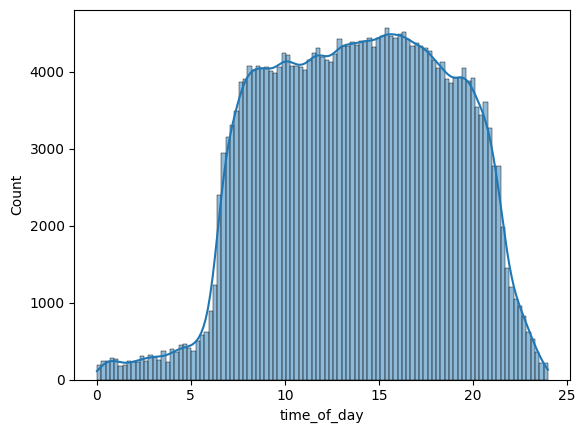

 12%|█████████▊                                                                      | 122/996 [04:50<29:09,  2.00s/it]

1e87baed


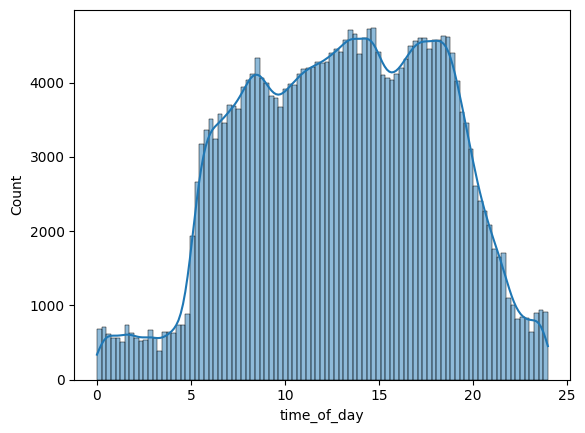

 12%|█████████▉                                                                      | 123/996 [04:52<29:54,  2.06s/it]

1eda934b


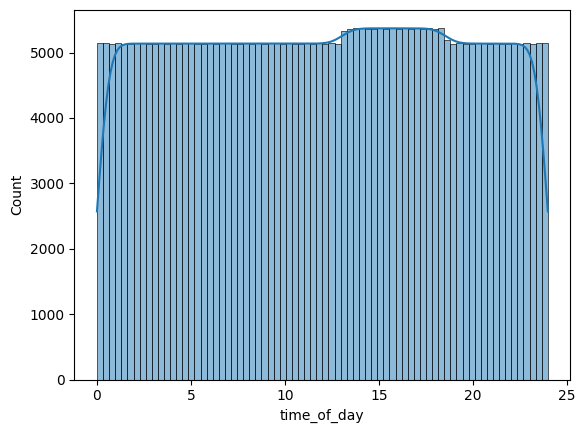

 12%|█████████▉                                                                      | 124/996 [04:55<33:56,  2.34s/it]

1eea8df2


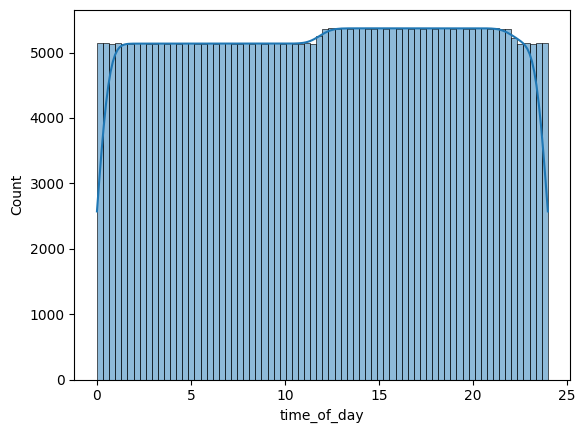

 13%|██████████                                                                      | 125/996 [04:58<36:48,  2.54s/it]

1eedf45e


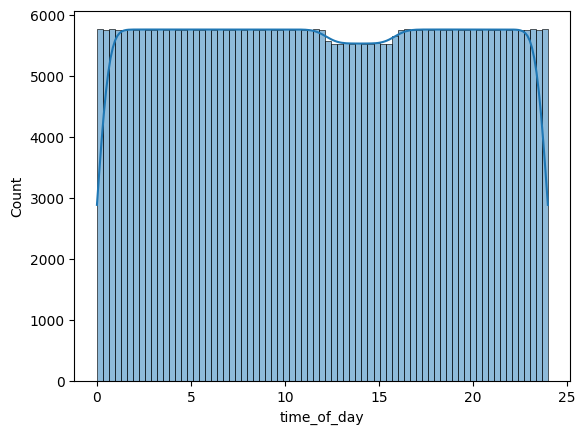

 13%|██████████                                                                      | 126/996 [05:02<40:07,  2.77s/it]

1f2164a4


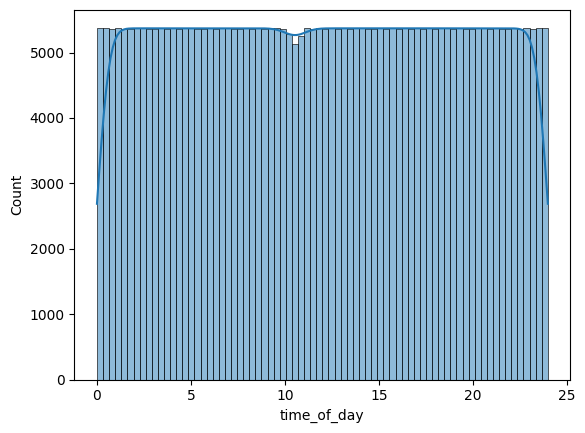

 13%|██████████▏                                                                     | 127/996 [05:05<41:27,  2.86s/it]

1f5835cd


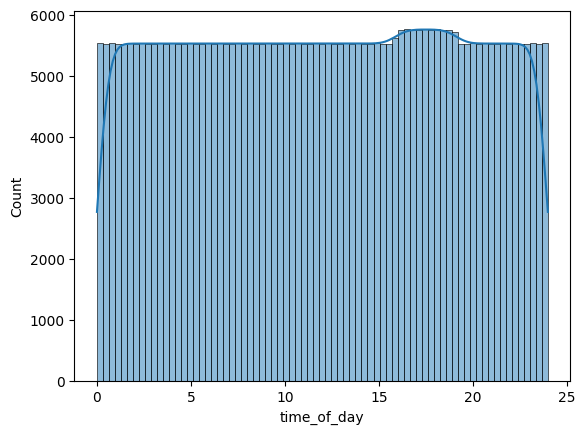

 13%|██████████▎                                                                     | 128/996 [05:08<42:56,  2.97s/it]

1f65fa82


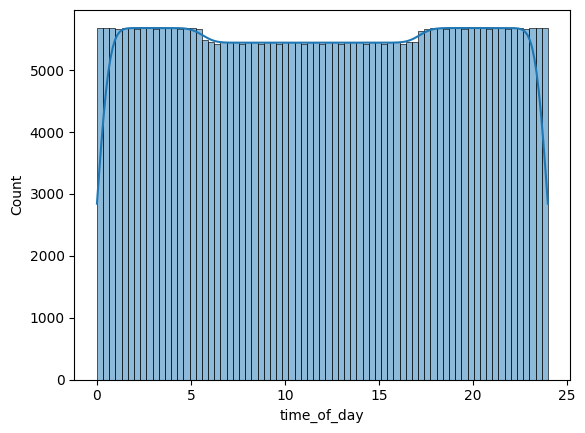

 13%|██████████▎                                                                     | 129/996 [05:11<44:42,  3.09s/it]

1f7bd44c


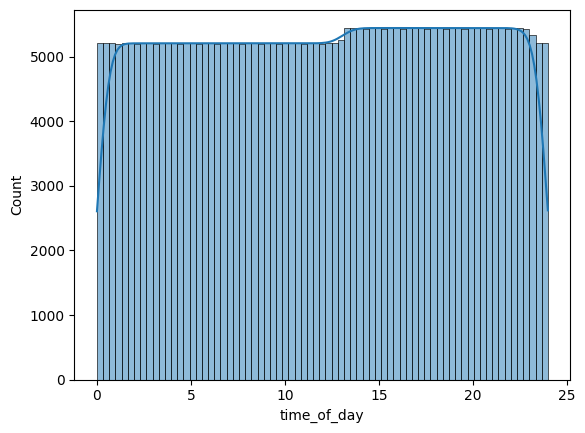

 13%|██████████▍                                                                     | 130/996 [05:14<44:20,  3.07s/it]

1fc07a80


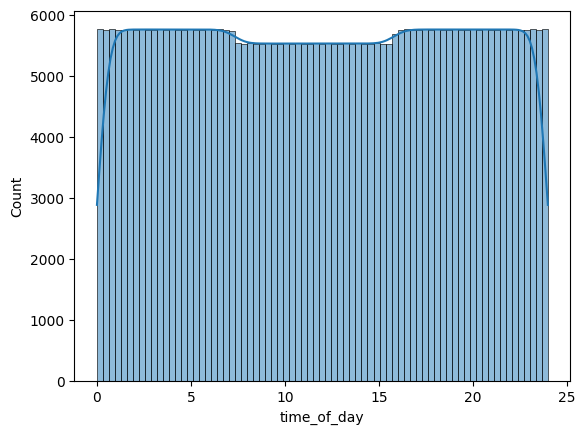

 13%|██████████▌                                                                     | 131/996 [05:18<45:15,  3.14s/it]

1fed3943


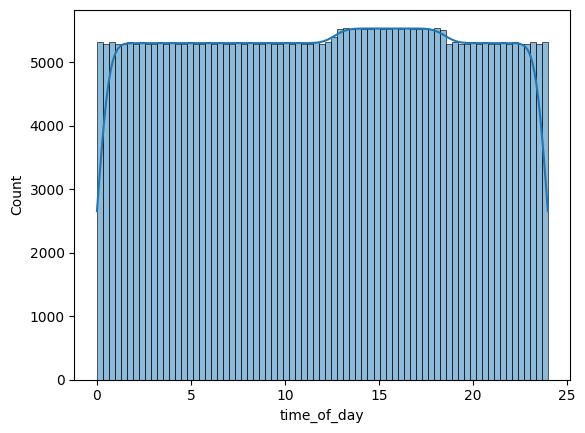

 13%|██████████▌                                                                     | 132/996 [05:21<45:07,  3.13s/it]

214f46e8


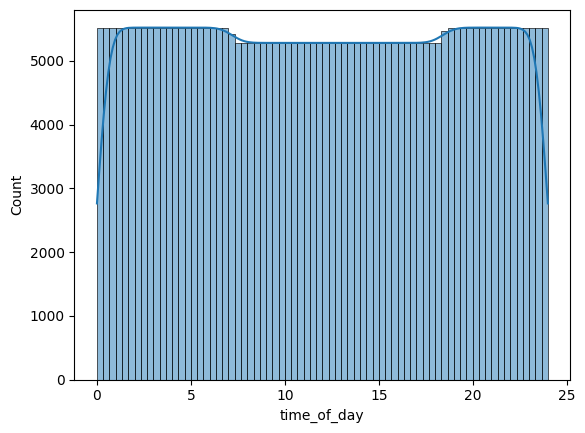

 13%|██████████▋                                                                     | 133/996 [05:24<44:37,  3.10s/it]

215ca39b


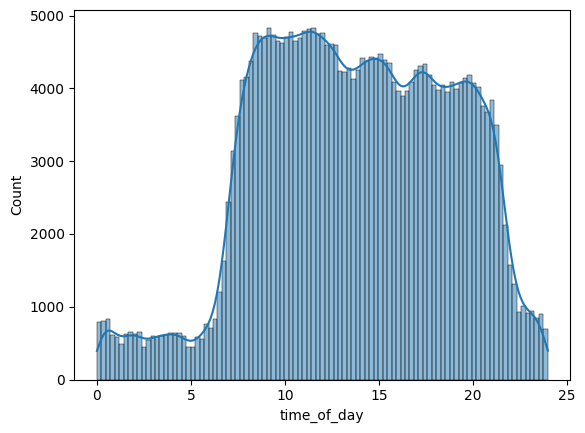

 13%|██████████▊                                                                     | 134/996 [05:26<40:53,  2.85s/it]

218faf6f


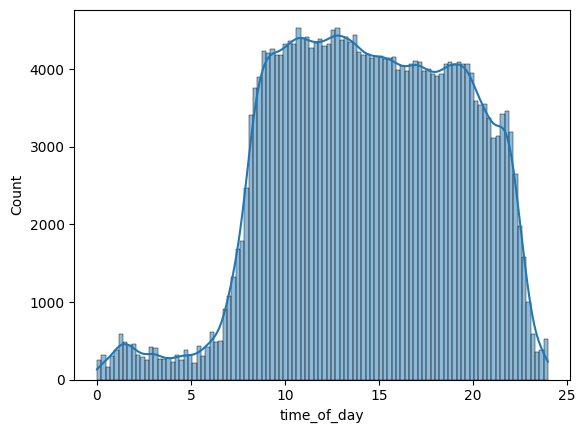

 14%|██████████▊                                                                     | 135/996 [05:28<37:36,  2.62s/it]

21a76448


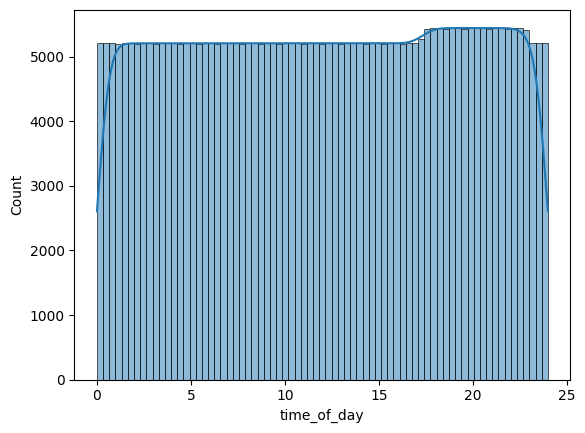

 14%|██████████▉                                                                     | 136/996 [05:31<39:06,  2.73s/it]

21eb6d47


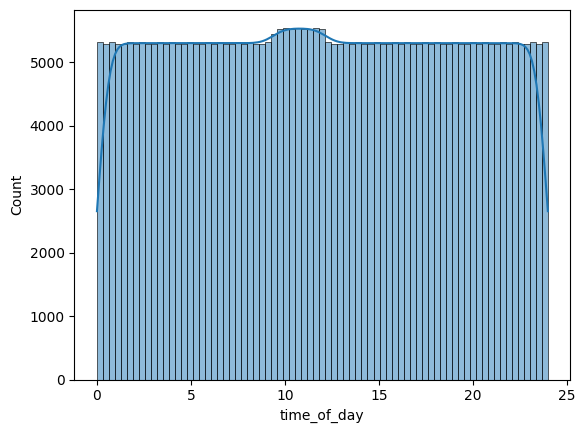

 14%|███████████                                                                     | 137/996 [05:34<40:39,  2.84s/it]

221e37e0


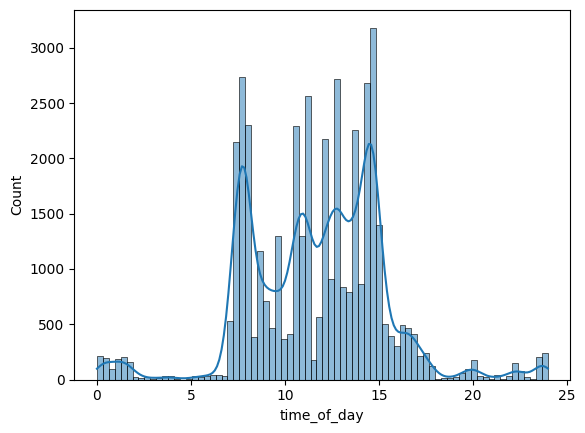

 14%|███████████                                                                     | 138/996 [05:35<30:19,  2.12s/it]

22375702


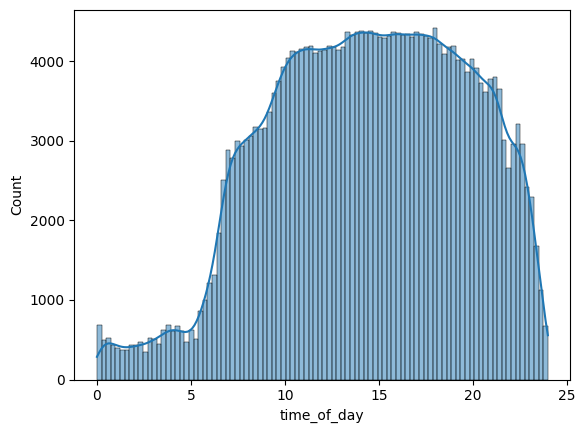

 14%|███████████▏                                                                    | 139/996 [05:37<30:23,  2.13s/it]

224fc39a


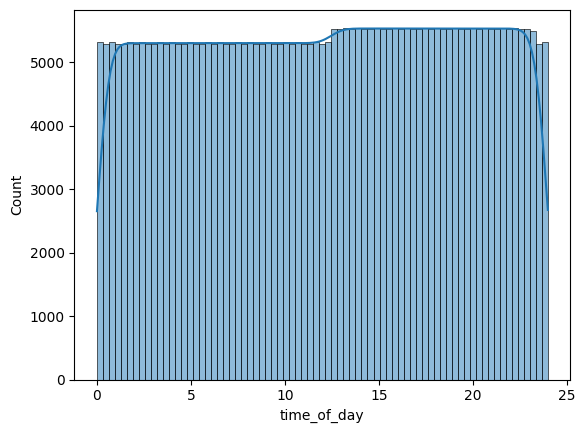

 14%|███████████▏                                                                    | 140/996 [05:40<34:36,  2.43s/it]

22536a61


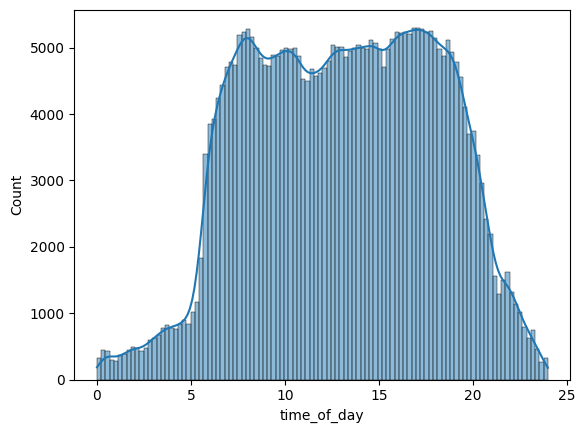

 14%|███████████▎                                                                    | 141/996 [05:42<35:23,  2.48s/it]

22b4191a


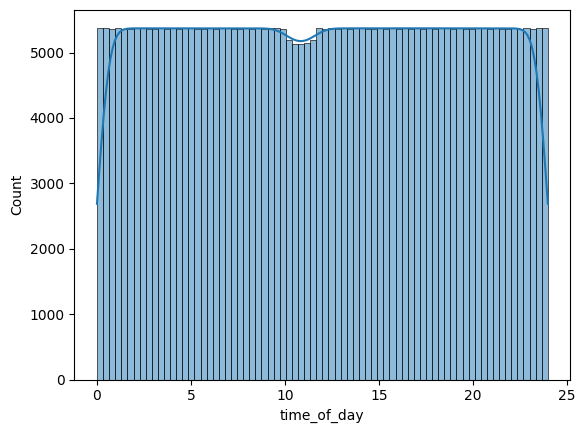

 14%|███████████▍                                                                    | 142/996 [05:45<37:48,  2.66s/it]

22c72c4e


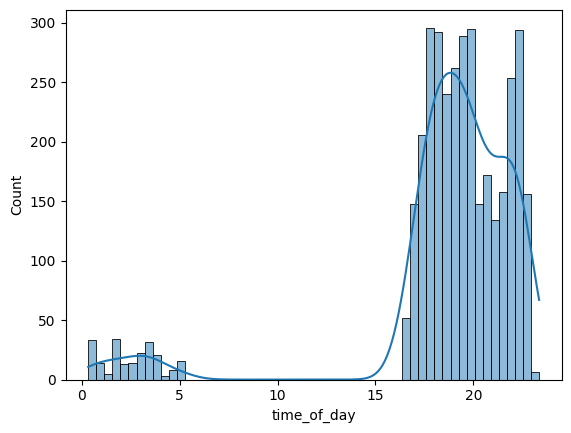

 14%|███████████▍                                                                    | 143/996 [05:46<27:01,  1.90s/it]

22e44415


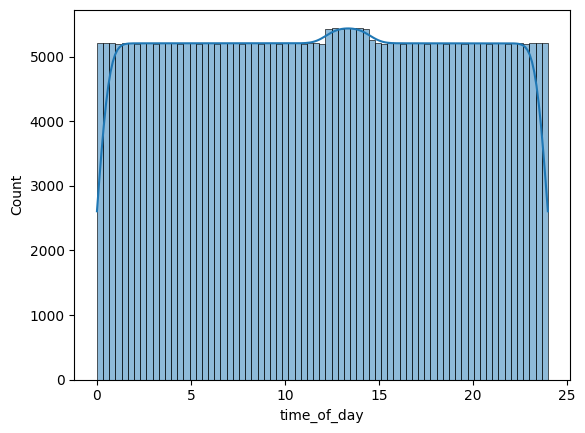

 14%|███████████▌                                                                    | 144/996 [05:49<31:29,  2.22s/it]

22f43a12


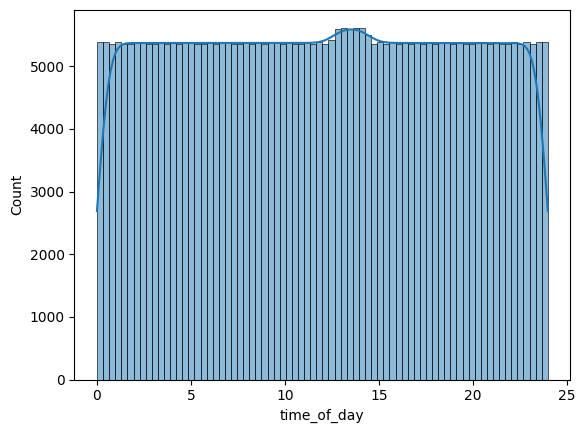

 15%|███████████▋                                                                    | 145/996 [05:52<35:11,  2.48s/it]

233b9425


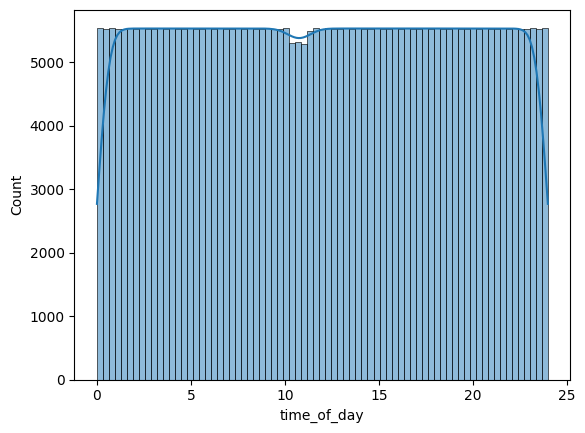

 15%|███████████▋                                                                    | 146/996 [05:55<38:12,  2.70s/it]

23567787


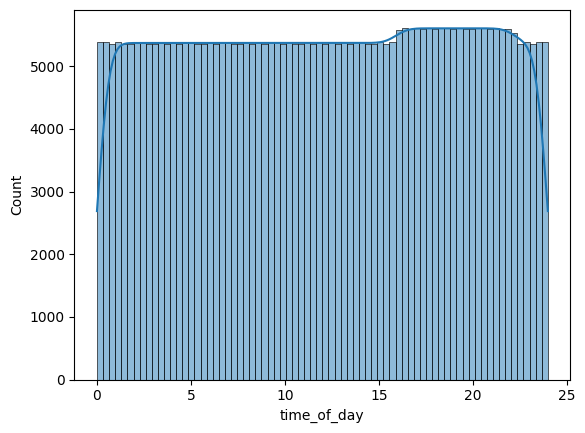

 15%|███████████▊                                                                    | 147/996 [05:58<39:58,  2.82s/it]

23dafdab


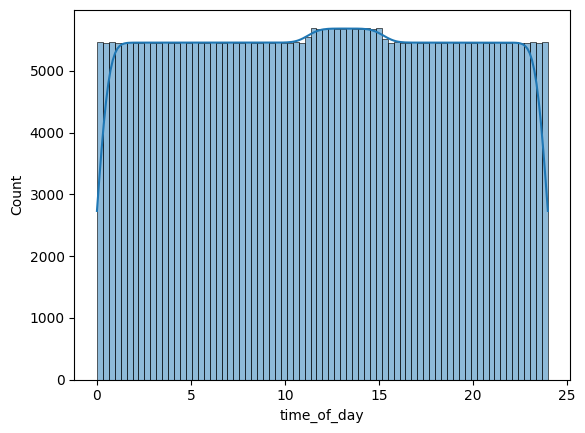

 15%|███████████▉                                                                    | 148/996 [06:01<41:39,  2.95s/it]

23e024bd


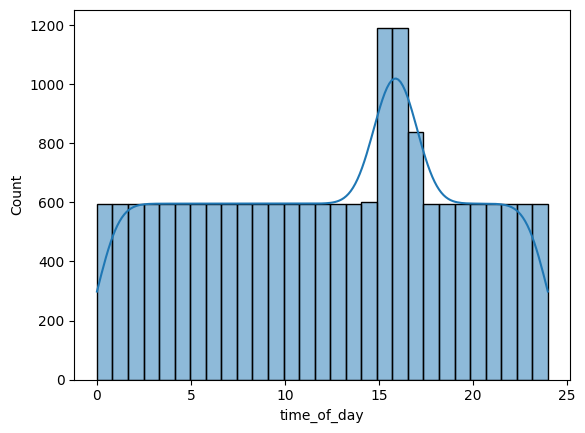

 15%|███████████▉                                                                    | 149/996 [06:01<30:08,  2.14s/it]

23e71e7c


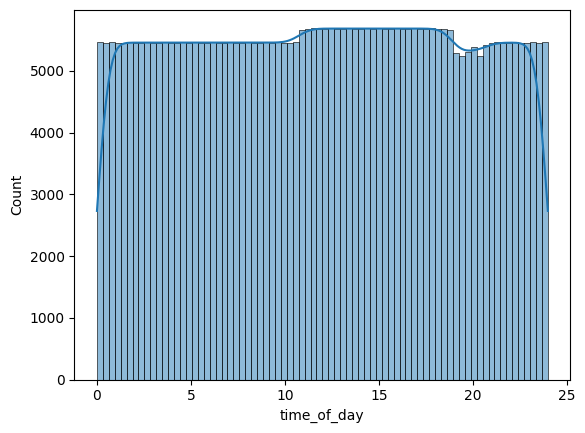

 15%|████████████                                                                    | 150/996 [06:05<34:44,  2.46s/it]

24398aed


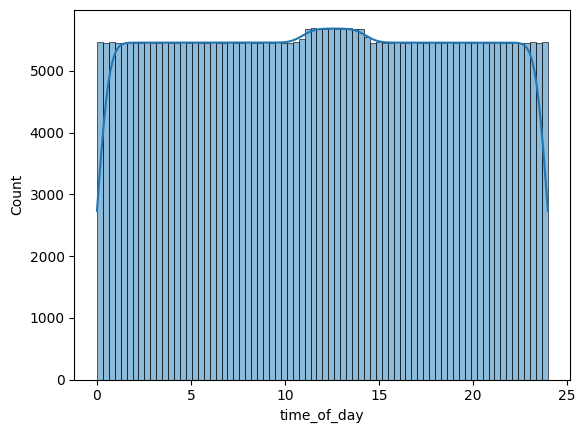

 15%|████████████▏                                                                   | 151/996 [06:08<37:59,  2.70s/it]

2496c491


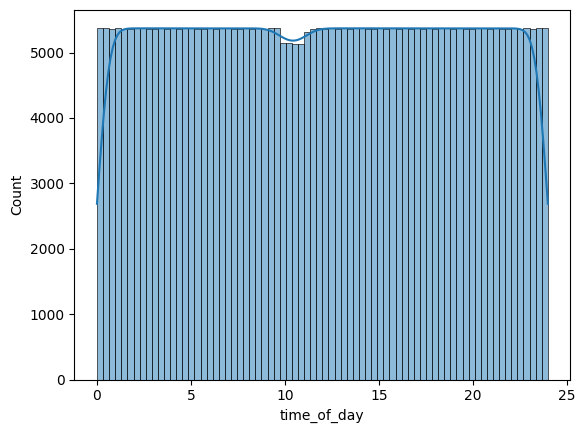

 15%|████████████▏                                                                   | 152/996 [06:11<39:36,  2.82s/it]

24a3b16d


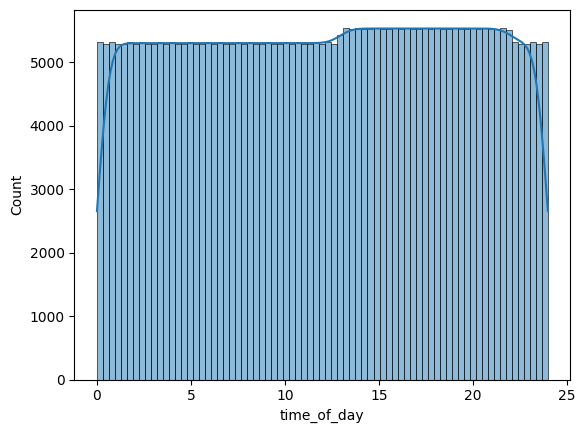

 15%|████████████▎                                                                   | 153/996 [06:14<41:57,  2.99s/it]

24ab10c6


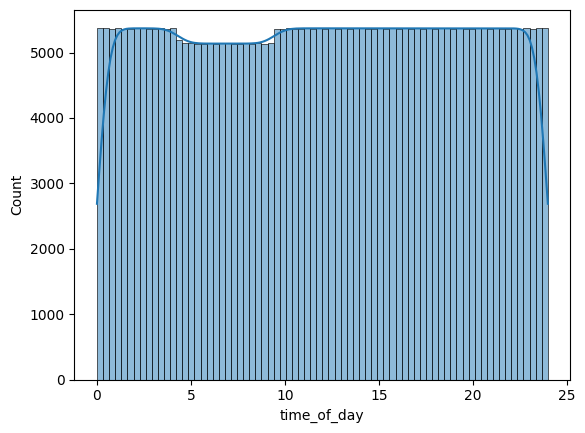

 15%|████████████▎                                                                   | 154/996 [06:17<42:10,  3.01s/it]

25849c6c


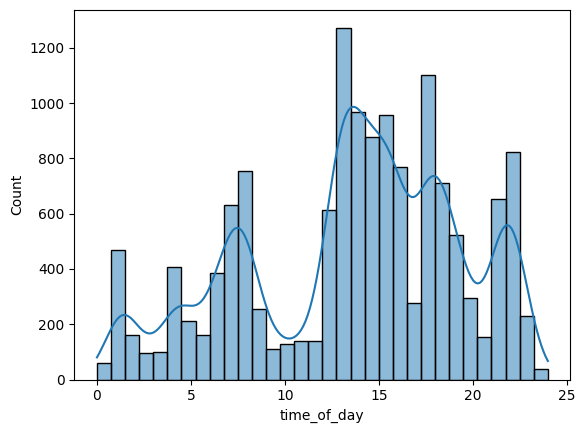

 16%|████████████▍                                                                   | 155/996 [06:18<30:22,  2.17s/it]

25a3a723


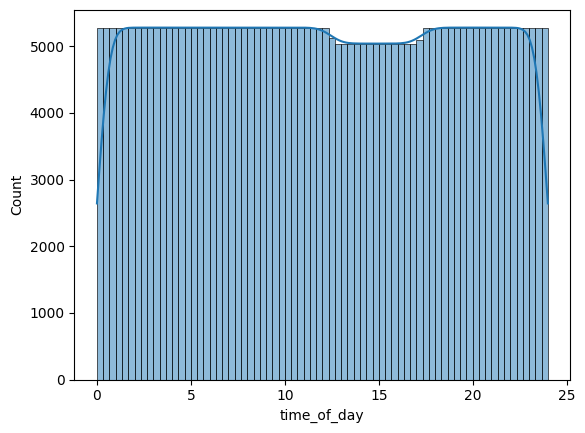

 16%|████████████▌                                                                   | 156/996 [06:21<33:32,  2.40s/it]

25eba023


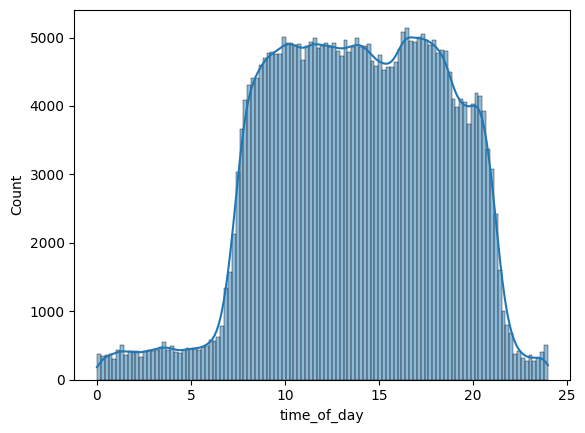

 16%|████████████▌                                                                   | 157/996 [06:23<33:54,  2.42s/it]

260f542b


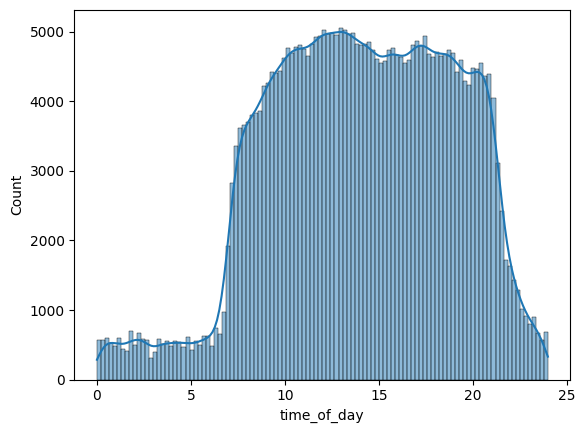

 16%|████████████▋                                                                   | 158/996 [06:26<34:14,  2.45s/it]

26190ddd


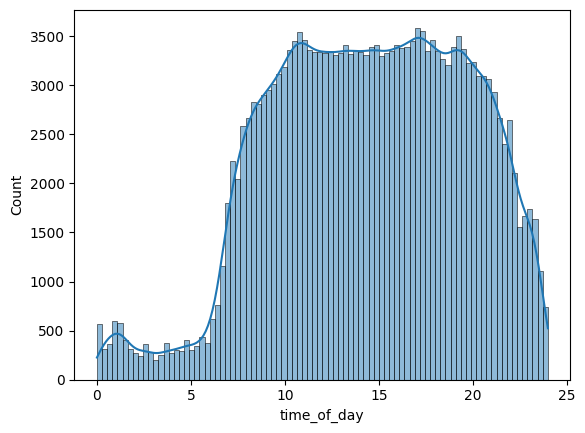

 16%|████████████▊                                                                   | 159/996 [06:27<30:32,  2.19s/it]

26aeacdf


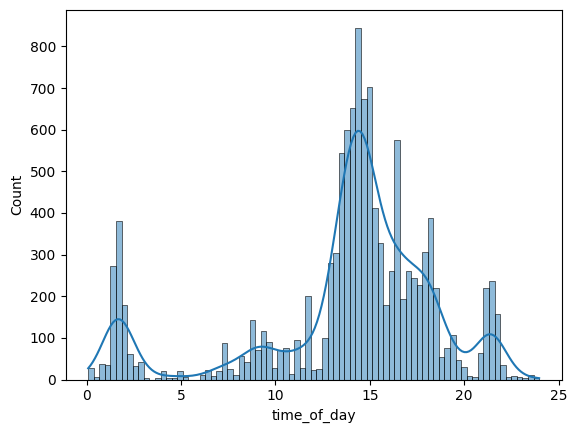

 16%|████████████▊                                                                   | 160/996 [06:27<22:14,  1.60s/it]

26d541c2


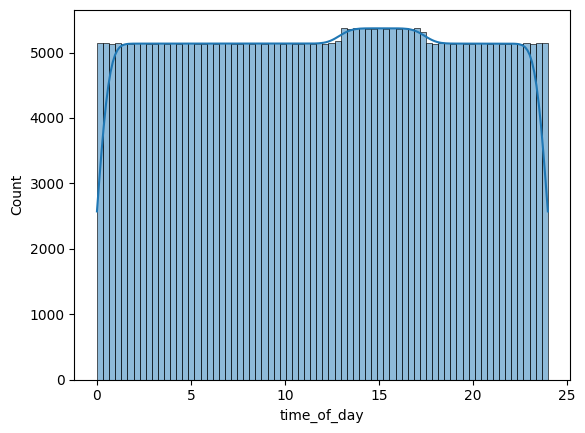

 16%|████████████▉                                                                   | 161/996 [06:30<27:55,  2.01s/it]

2760be91


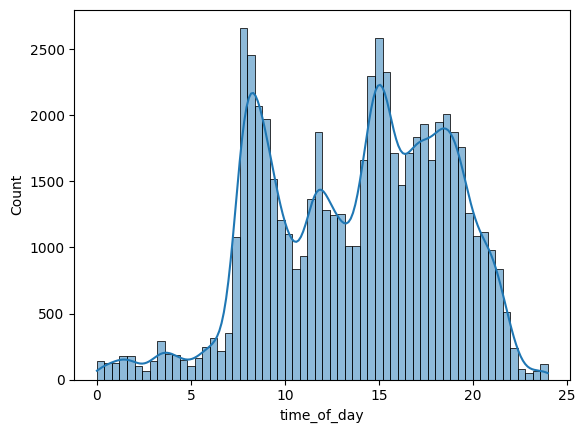

 16%|█████████████                                                                   | 162/996 [06:31<21:53,  1.58s/it]

278e8a51


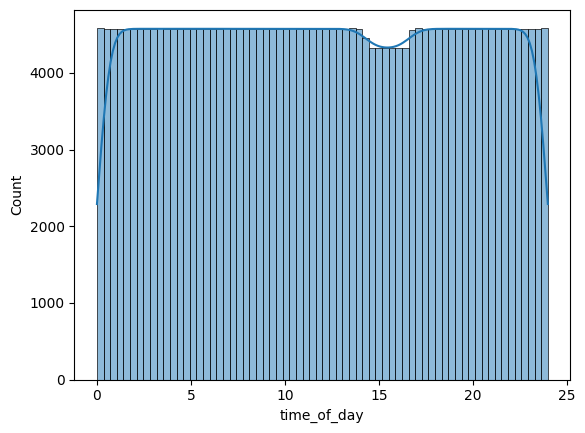

 16%|█████████████                                                                   | 163/996 [06:33<25:28,  1.84s/it]

27d7e5e4


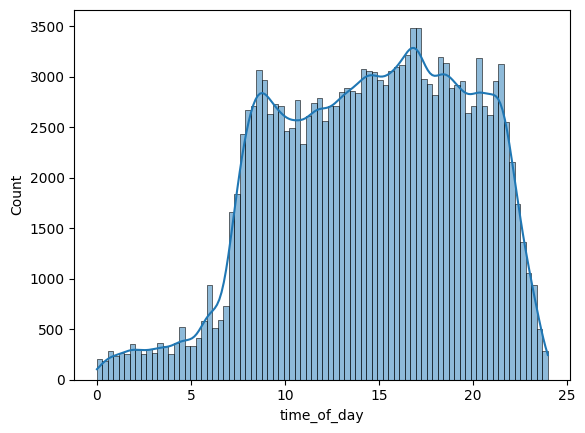

 16%|█████████████▏                                                                  | 164/996 [06:35<23:20,  1.68s/it]

2812951b


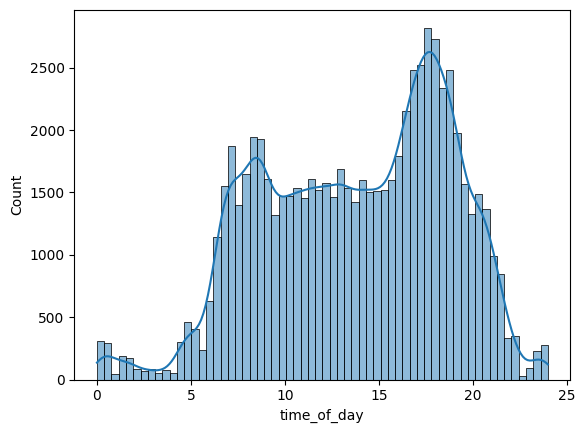

 17%|█████████████▎                                                                  | 165/996 [06:35<19:02,  1.37s/it]

2840643b


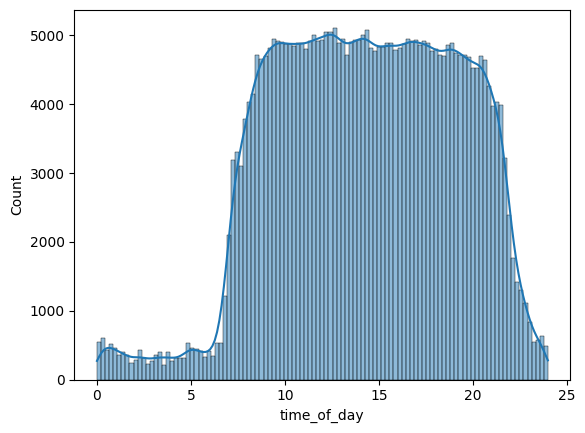

 17%|█████████████▎                                                                  | 166/996 [06:38<23:52,  1.73s/it]

2898269f


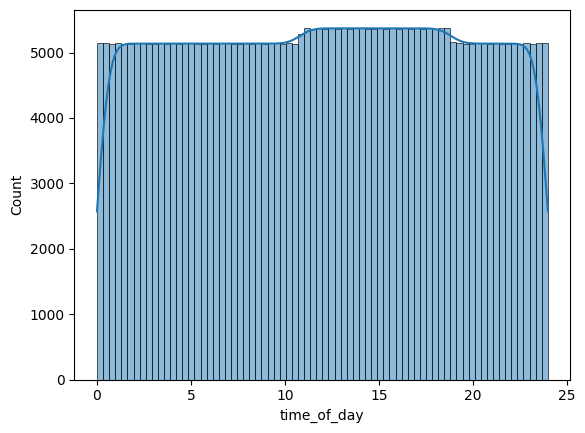

 17%|█████████████▍                                                                  | 167/996 [06:41<29:07,  2.11s/it]

28e973b1


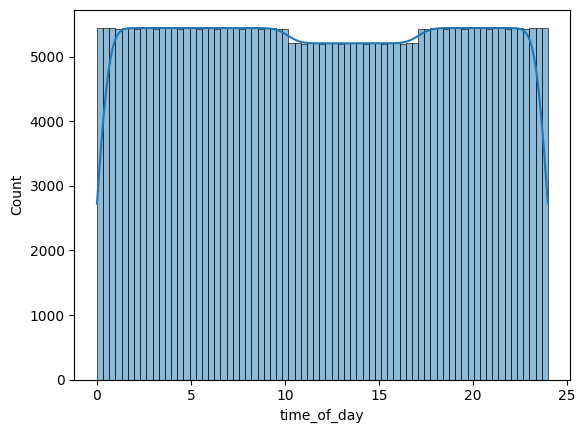

 17%|█████████████▍                                                                  | 168/996 [06:44<32:59,  2.39s/it]

29587a31


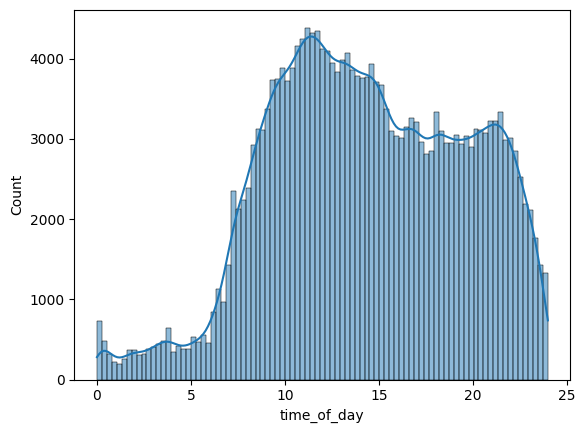

 17%|█████████████▌                                                                  | 169/996 [06:46<30:14,  2.19s/it]

29b37b4a


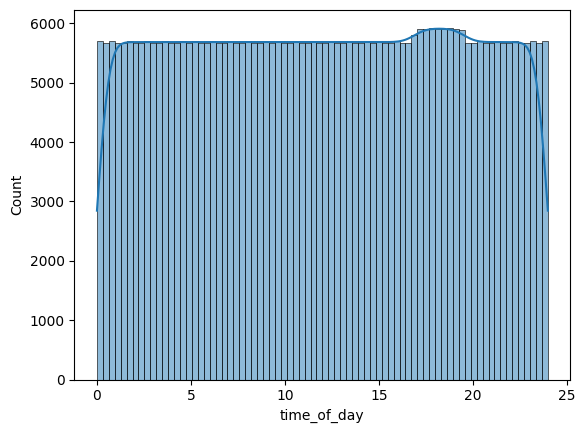

 17%|█████████████▋                                                                  | 170/996 [06:49<35:04,  2.55s/it]

29c54890


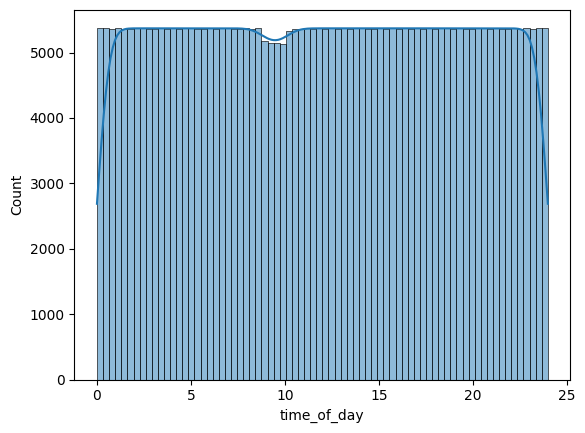

 17%|█████████████▋                                                                  | 171/996 [06:52<37:13,  2.71s/it]

2a0b8386


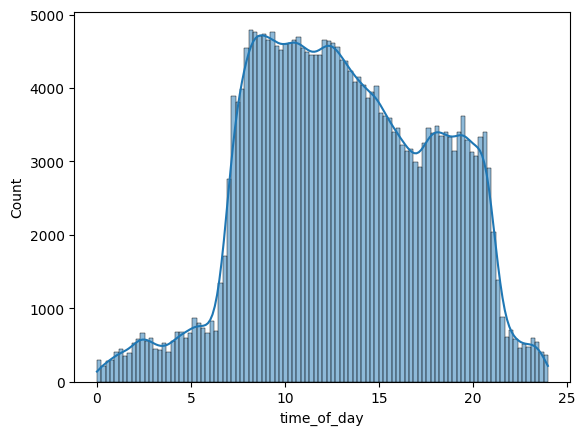

 17%|█████████████▊                                                                  | 172/996 [06:54<34:31,  2.51s/it]

2a3fcf9a


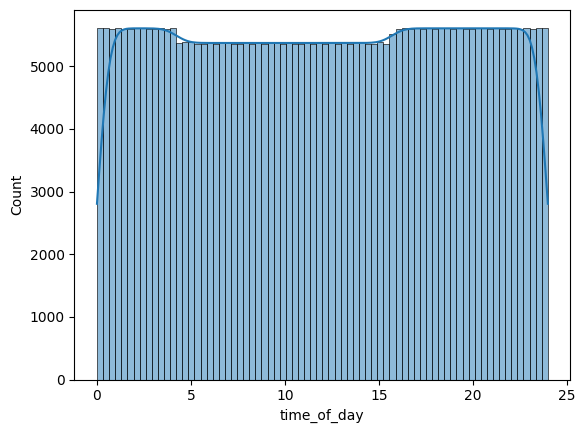

 17%|█████████████▉                                                                  | 173/996 [06:57<37:05,  2.70s/it]

2a6a6b92


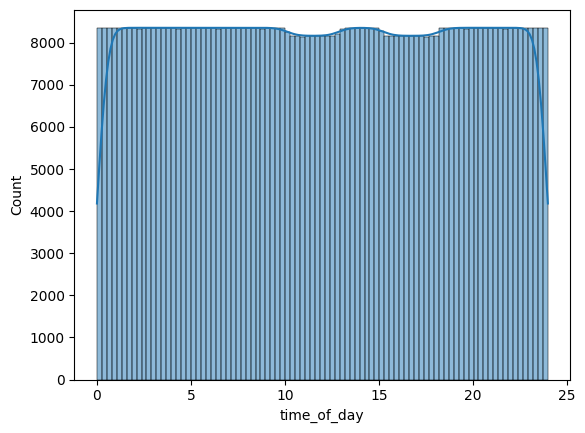

 17%|█████████████▉                                                                  | 174/996 [07:03<49:02,  3.58s/it]

2a88cbe9


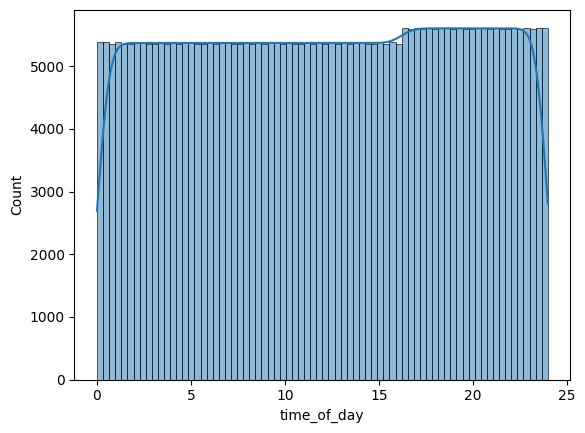

 18%|██████████████                                                                  | 175/996 [07:06<47:05,  3.44s/it]

2a922ca4


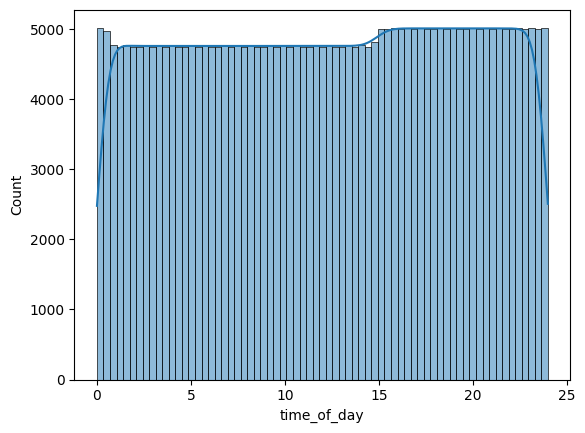

 18%|██████████████▏                                                                 | 176/996 [07:09<43:44,  3.20s/it]

2a9e0dee


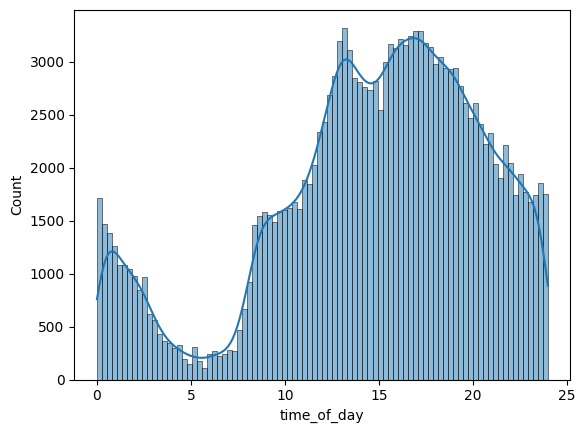

 18%|██████████████▏                                                                 | 177/996 [07:10<37:09,  2.72s/it]

2ac0bd9f


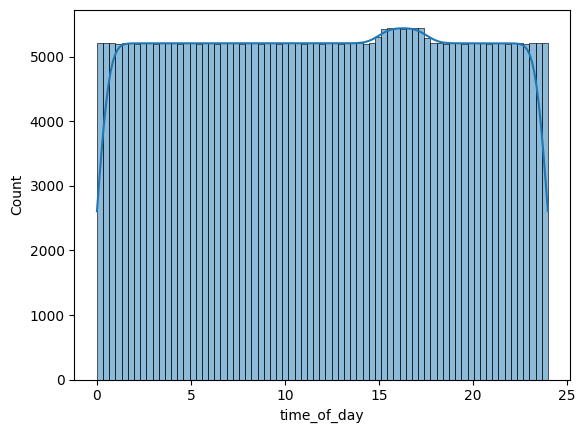

 18%|██████████████▎                                                                 | 178/996 [07:13<38:20,  2.81s/it]

2afea280


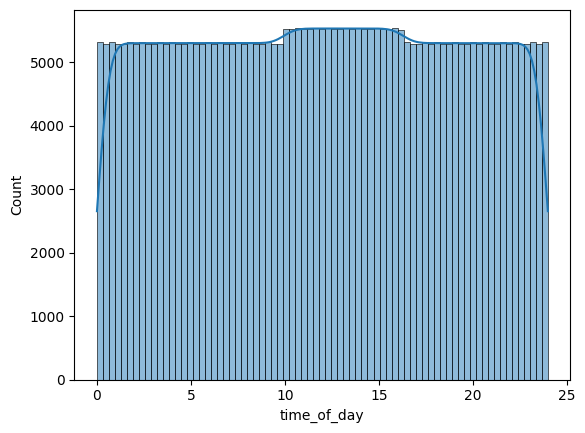

 18%|██████████████▍                                                                 | 179/996 [07:17<39:41,  2.92s/it]

2b34dcf3


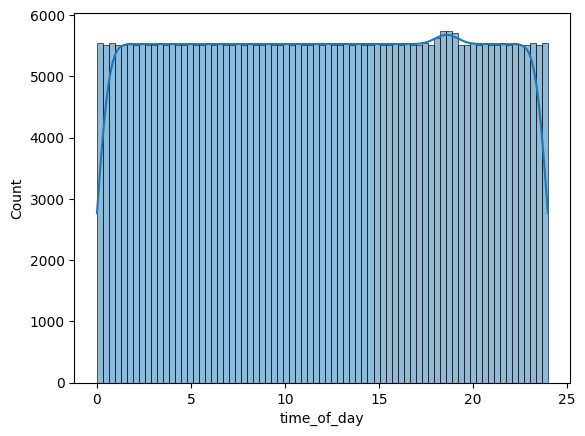

 18%|██████████████▍                                                                 | 180/996 [07:20<41:09,  3.03s/it]

2bac0893


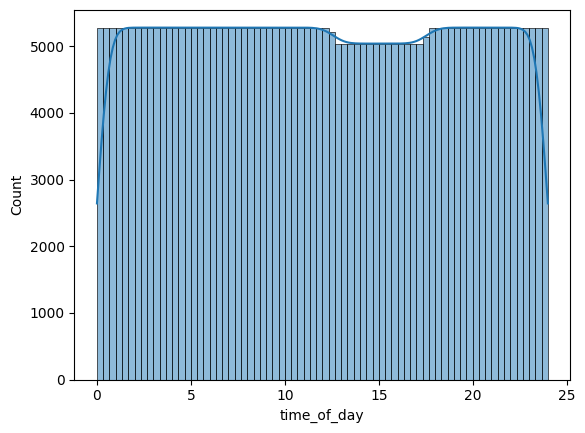

 18%|██████████████▌                                                                 | 181/996 [07:23<41:07,  3.03s/it]

2bbcfd43


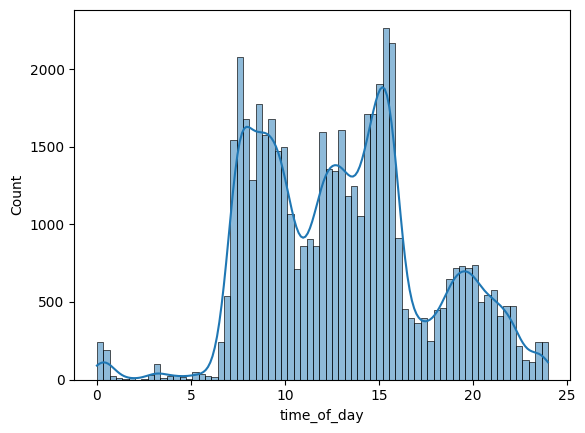

 18%|██████████████▌                                                                 | 182/996 [07:23<30:48,  2.27s/it]

2c2dc20d


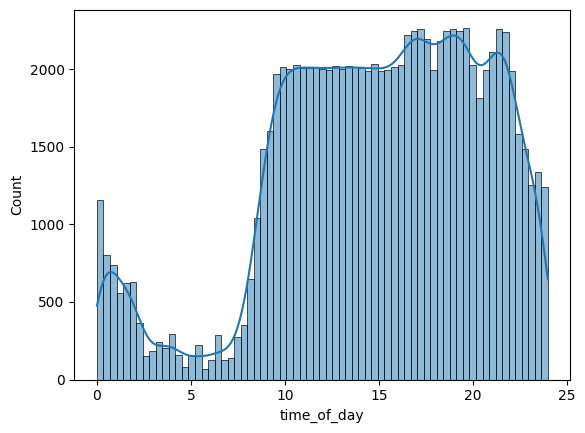

 18%|██████████████▋                                                                 | 183/996 [07:24<25:00,  1.85s/it]

2c3b09db


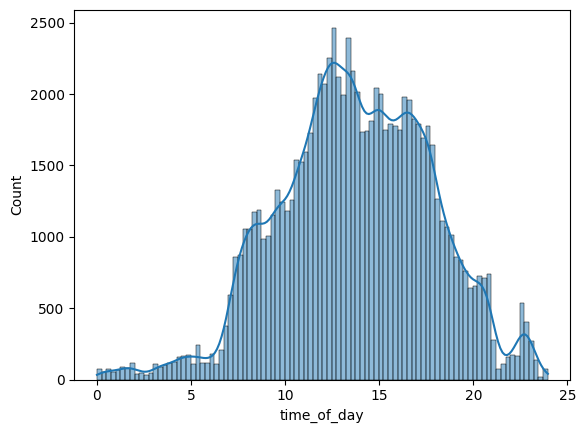

 18%|██████████████▊                                                                 | 184/996 [07:25<20:40,  1.53s/it]

2c406043


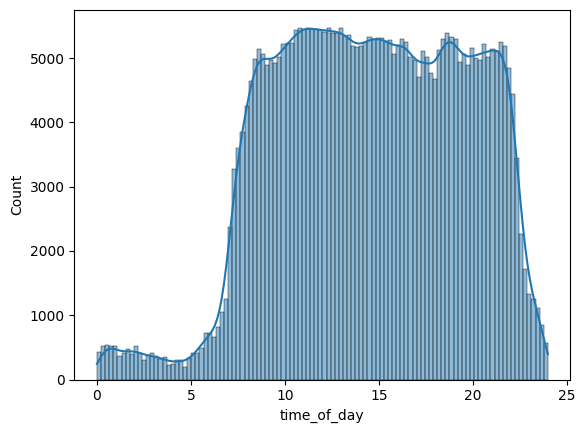

 19%|██████████████▊                                                                 | 185/996 [07:28<26:04,  1.93s/it]

2c483245


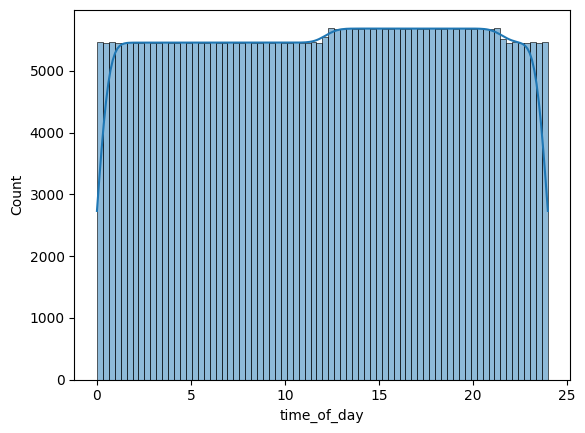

 19%|██████████████▉                                                                 | 186/996 [07:31<31:46,  2.35s/it]

2c54d6c5


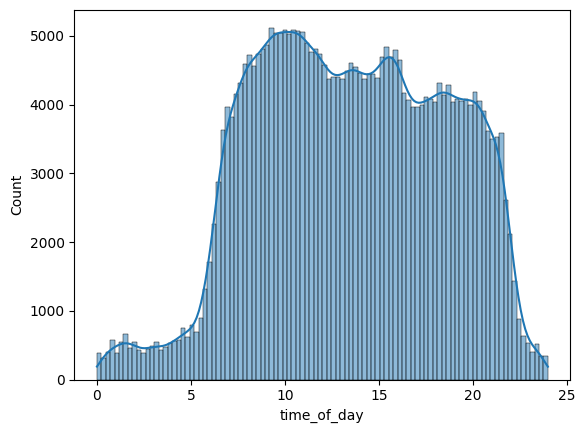

 19%|███████████████                                                                 | 187/996 [07:34<32:02,  2.38s/it]

2ca2206f


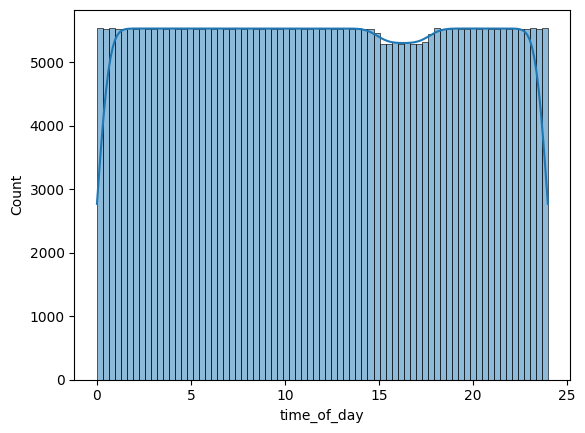

 19%|███████████████                                                                 | 188/996 [07:37<35:36,  2.64s/it]

2cb0db2c


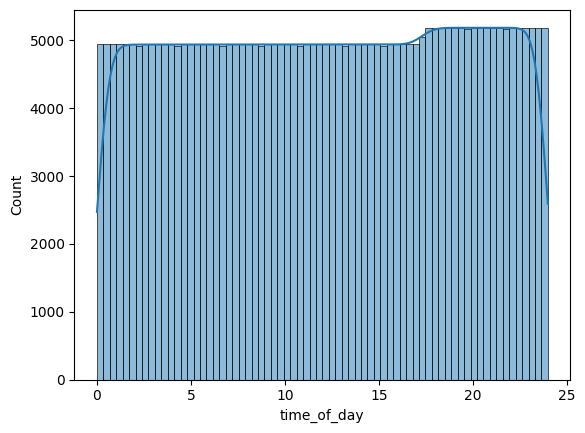

 19%|███████████████▏                                                                | 189/996 [07:40<36:13,  2.69s/it]

2cd9b5a3


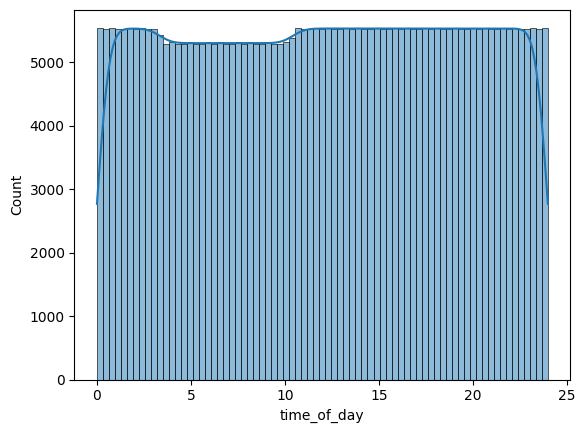

 19%|███████████████▎                                                                | 190/996 [07:43<38:24,  2.86s/it]

2cda86bd


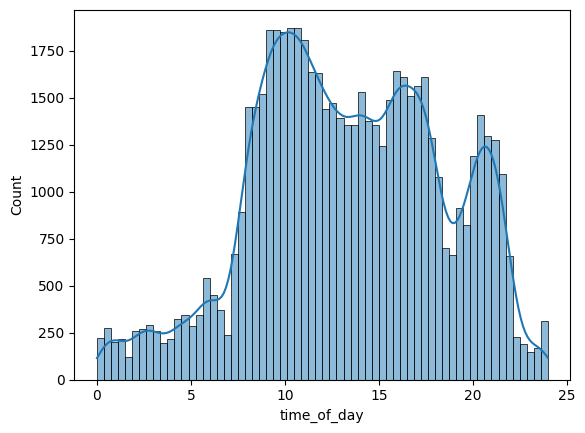

 19%|███████████████▎                                                                | 191/996 [07:44<29:12,  2.18s/it]

2d0bbbd3


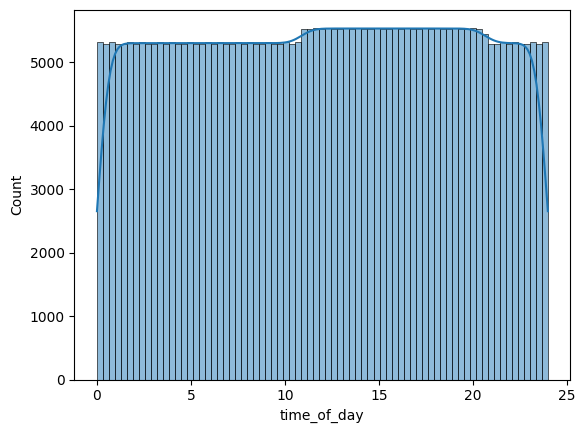

 19%|███████████████▍                                                                | 192/996 [07:47<33:16,  2.48s/it]

2da6bf6e


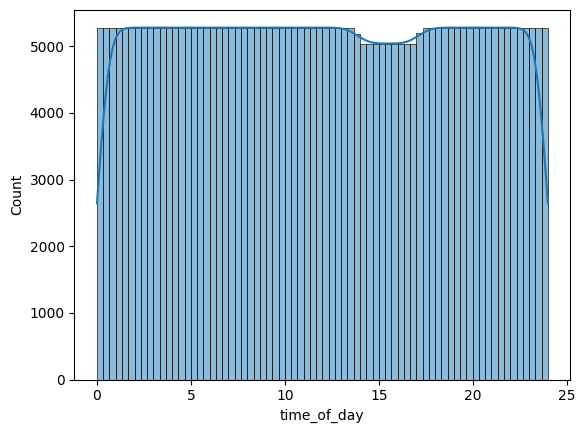

 19%|███████████████▌                                                                | 193/996 [07:50<35:13,  2.63s/it]

2e17c497


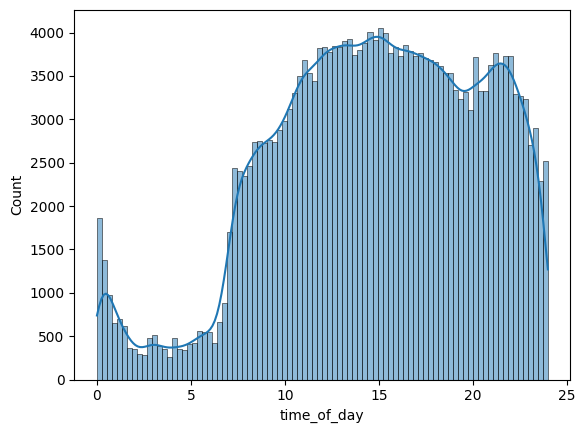

 19%|███████████████▌                                                                | 194/996 [07:52<31:59,  2.39s/it]

2e5f5207


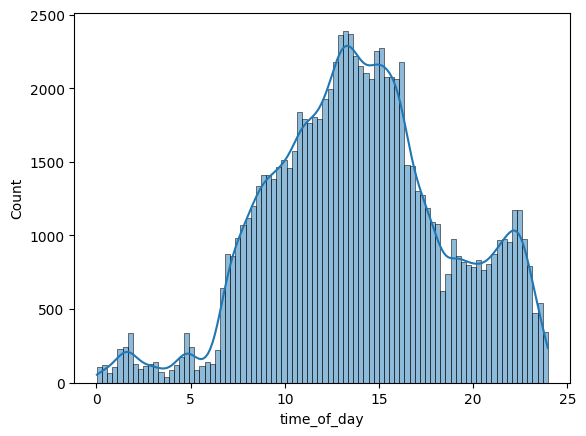

 20%|███████████████▋                                                                | 195/996 [07:52<25:36,  1.92s/it]

2ee0a1e8


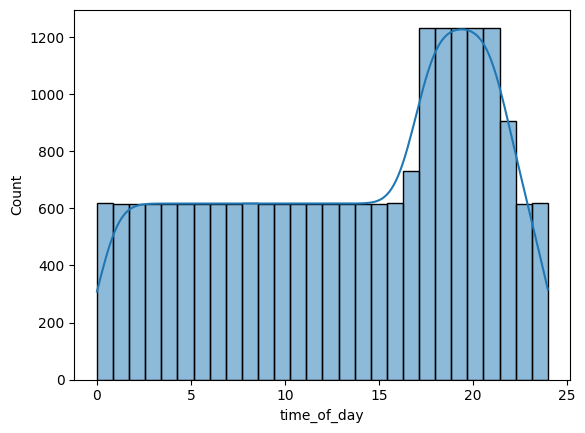

 20%|███████████████▋                                                                | 196/996 [07:53<18:54,  1.42s/it]

2f154763


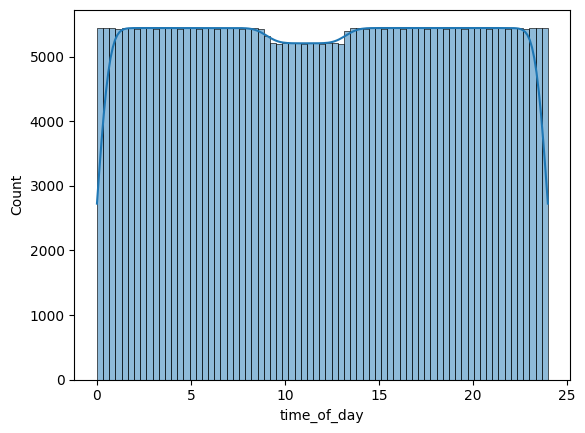

 20%|███████████████▊                                                                | 197/996 [07:56<25:32,  1.92s/it]

2f16cad4


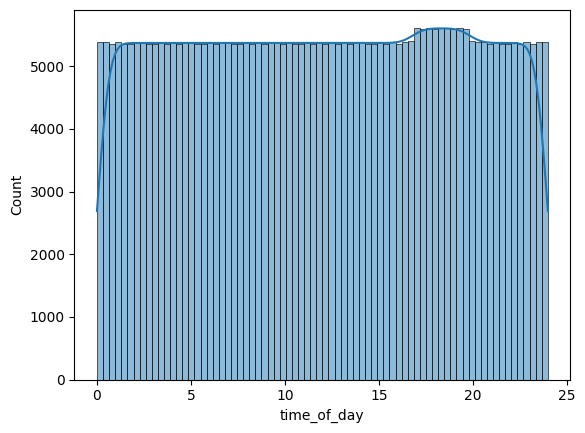

 20%|███████████████▉                                                                | 198/996 [07:59<30:18,  2.28s/it]

2f1af08a


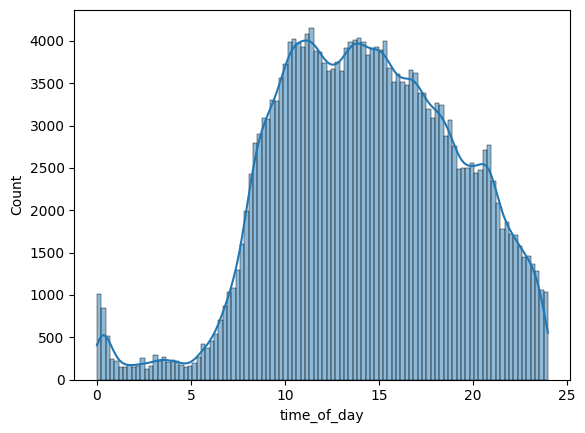

 20%|███████████████▉                                                                | 199/996 [08:01<28:24,  2.14s/it]

2f8ec752


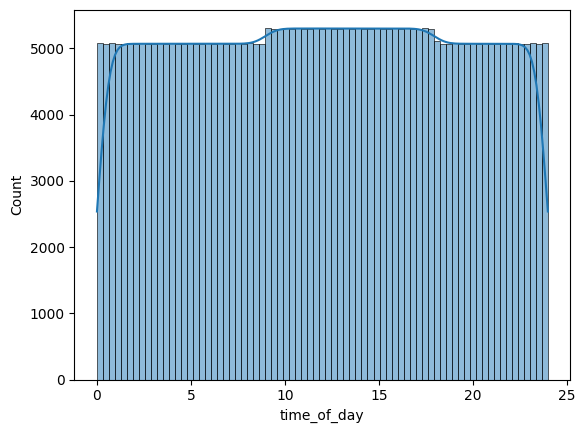

 20%|████████████████                                                                | 200/996 [08:04<31:54,  2.40s/it]

2fba6cf4


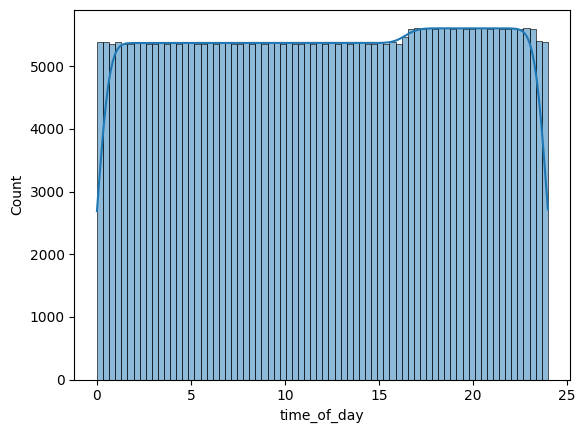

 20%|████████████████▏                                                               | 201/996 [08:07<34:48,  2.63s/it]

2fef897e


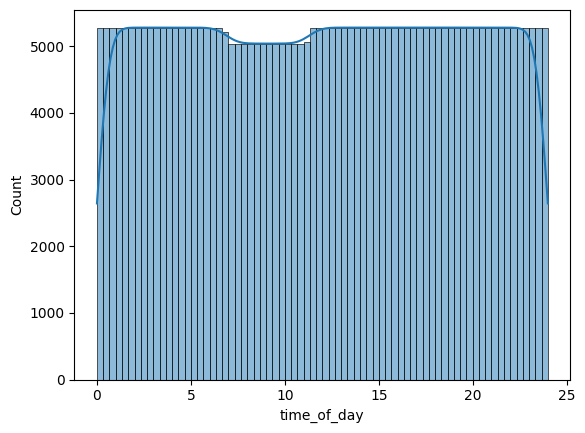

 20%|████████████████▏                                                               | 202/996 [08:10<37:10,  2.81s/it]

3065aa2f


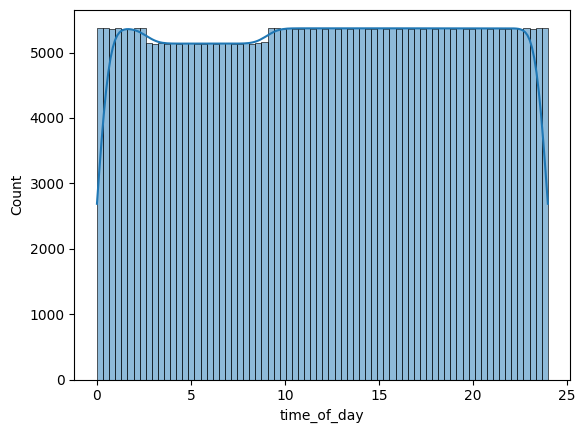

 20%|████████████████▎                                                               | 203/996 [08:13<38:12,  2.89s/it]

30d2fd47


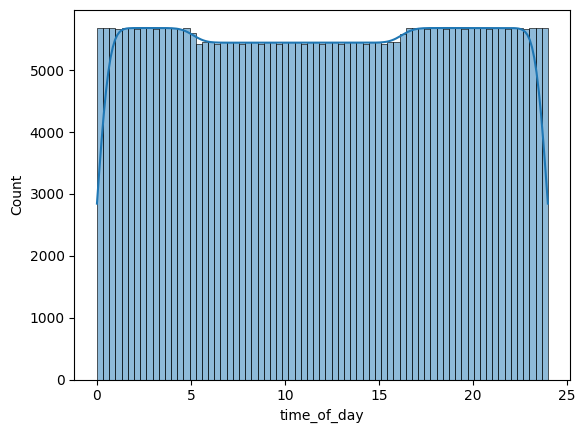

 20%|████████████████▍                                                               | 204/996 [08:16<39:17,  2.98s/it]

31648caa


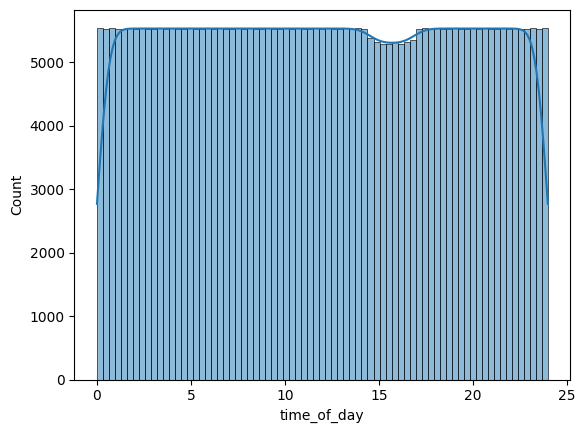

 21%|████████████████▍                                                               | 205/996 [08:19<40:11,  3.05s/it]

31b74cd4


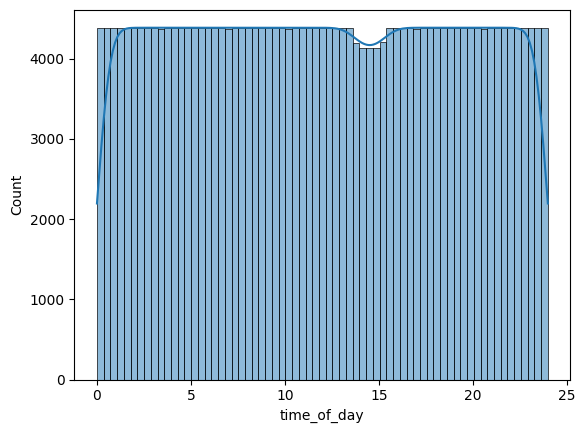

 21%|████████████████▌                                                               | 206/996 [08:22<37:22,  2.84s/it]

31d61741


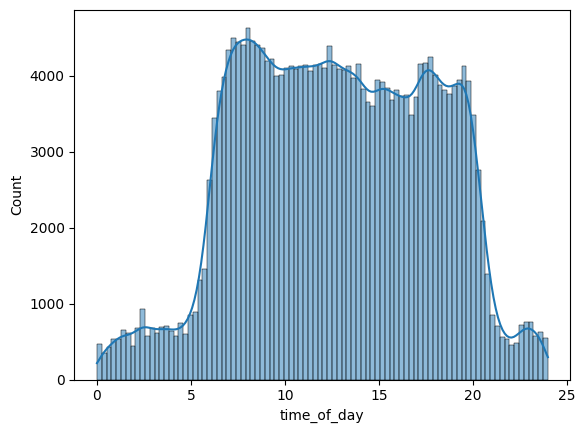

 21%|████████████████▋                                                               | 207/996 [08:24<33:58,  2.58s/it]

31f01671


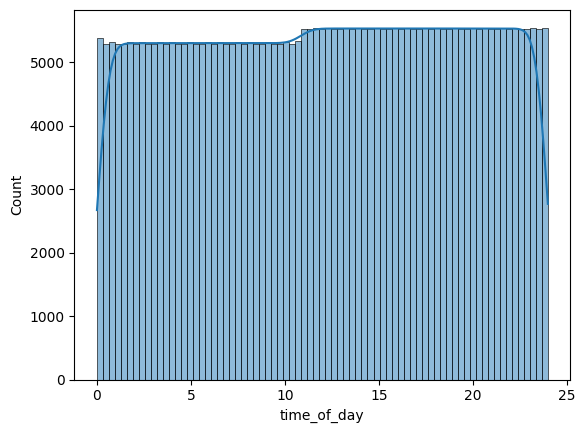

 21%|████████████████▋                                                               | 208/996 [08:27<36:15,  2.76s/it]

321202d4


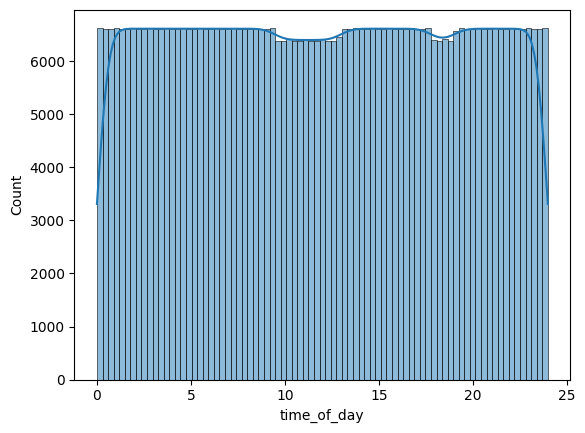

 21%|████████████████▊                                                               | 209/996 [08:31<41:21,  3.15s/it]

3216b978


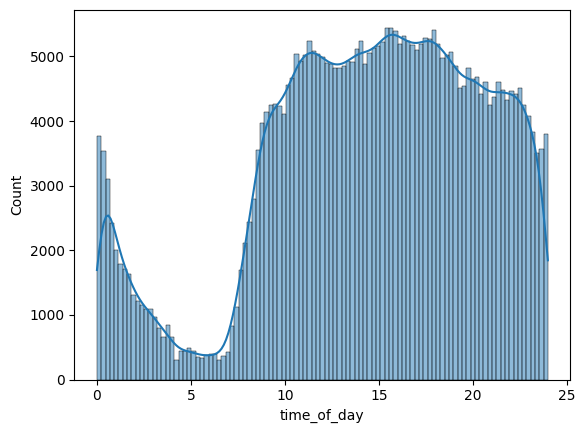

 21%|████████████████▊                                                               | 210/996 [08:34<40:01,  3.05s/it]

325afd3d


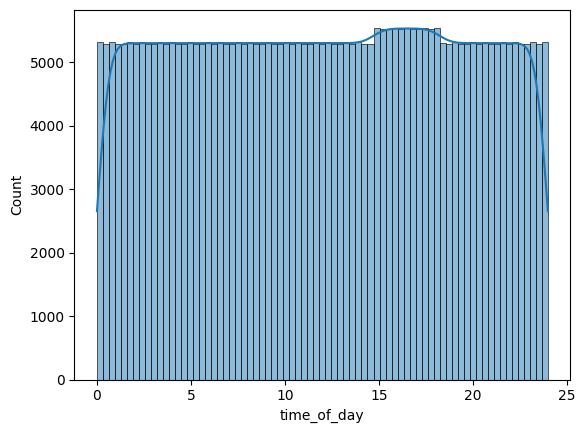

 21%|████████████████▉                                                               | 211/996 [08:37<40:11,  3.07s/it]

3268c574


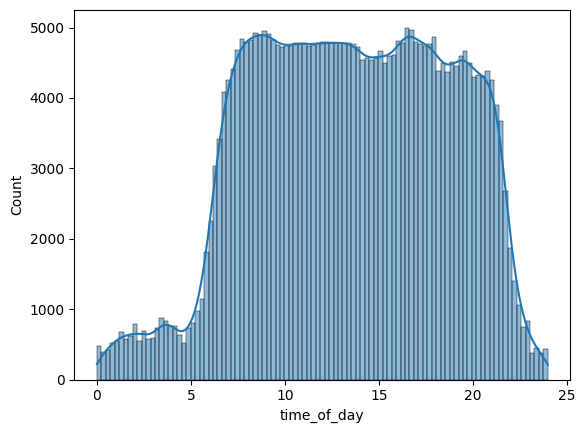

 21%|█████████████████                                                               | 212/996 [08:40<37:59,  2.91s/it]

327ef356


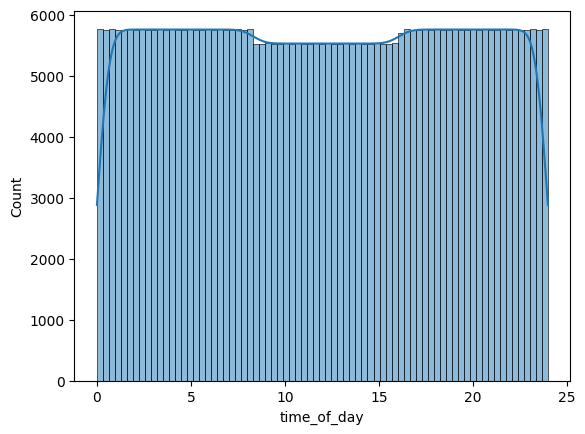

 21%|█████████████████                                                               | 213/996 [08:43<39:41,  3.04s/it]

32b8490d


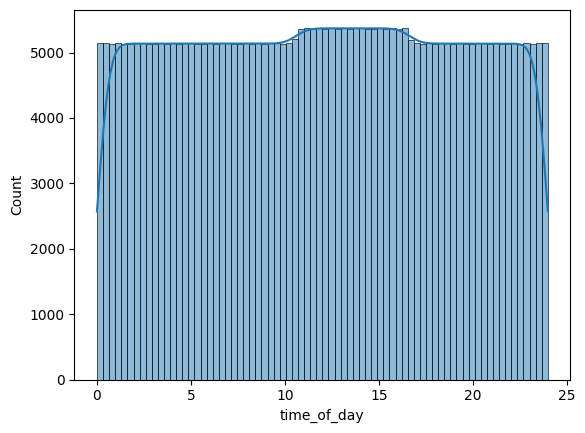

 21%|█████████████████▏                                                              | 214/996 [08:46<39:30,  3.03s/it]

32dcc8ab


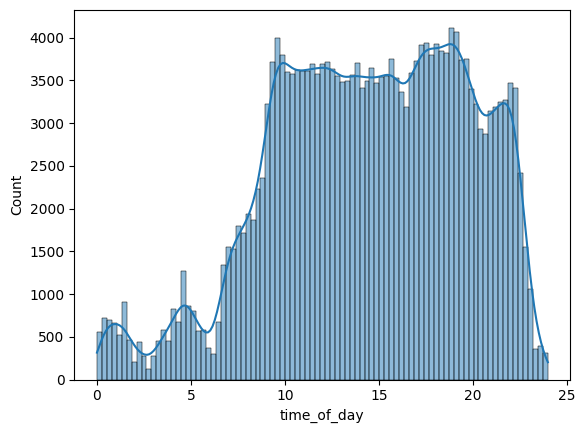

 22%|█████████████████▎                                                              | 215/996 [08:48<34:26,  2.65s/it]

331733c7


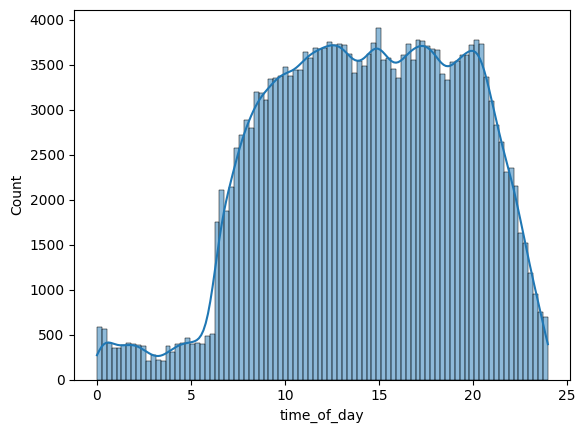

 22%|█████████████████▎                                                              | 216/996 [08:49<30:55,  2.38s/it]

338146bd


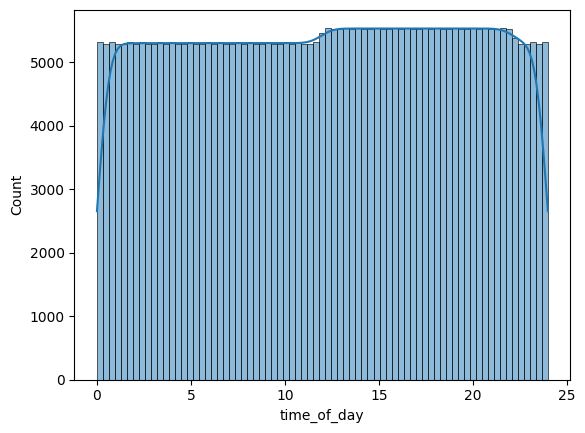

 22%|█████████████████▍                                                              | 217/996 [08:53<33:53,  2.61s/it]

33d60f7d


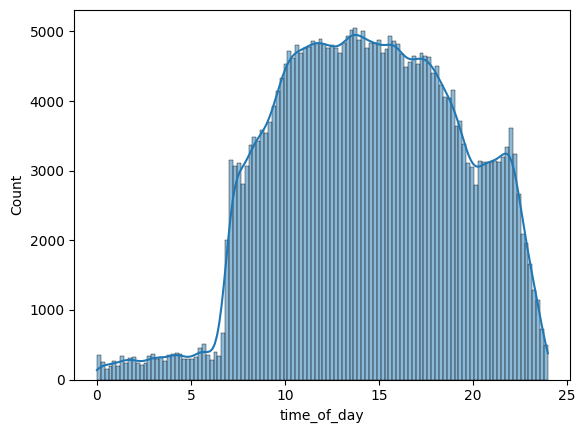

 22%|█████████████████▌                                                              | 218/996 [08:55<33:22,  2.57s/it]

33fe1b04


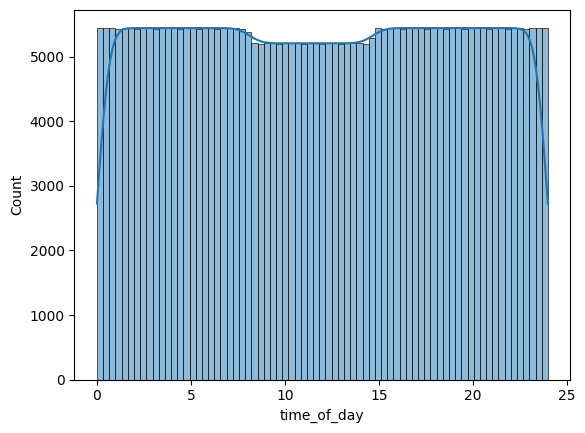

 22%|█████████████████▌                                                              | 219/996 [08:58<35:14,  2.72s/it]

34362a9a


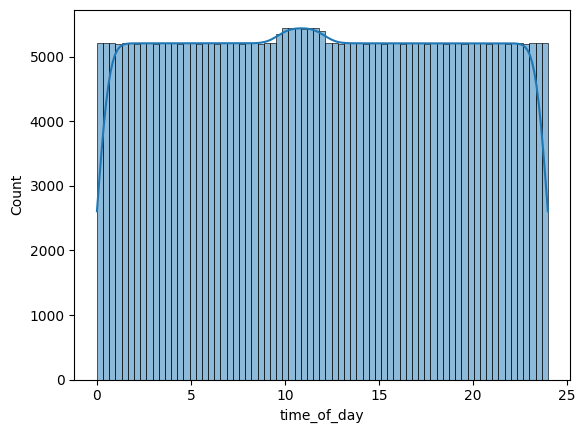

 22%|█████████████████▋                                                              | 220/996 [09:01<36:23,  2.81s/it]

34ec5de4


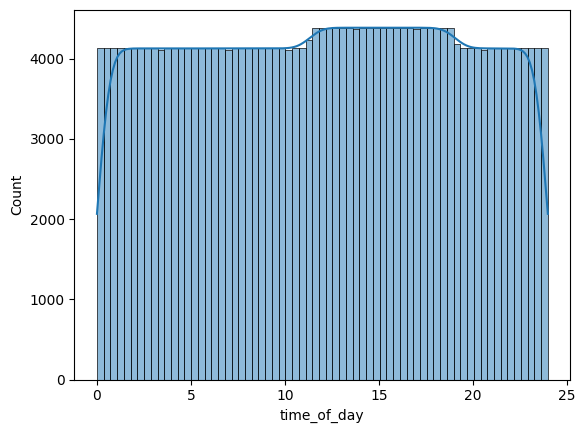

 22%|█████████████████▊                                                              | 221/996 [09:03<34:13,  2.65s/it]

350cf38b


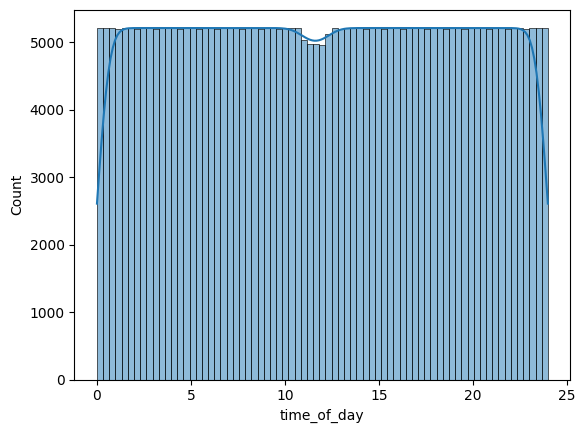

 22%|█████████████████▊                                                              | 222/996 [09:06<35:28,  2.75s/it]

350dbeba


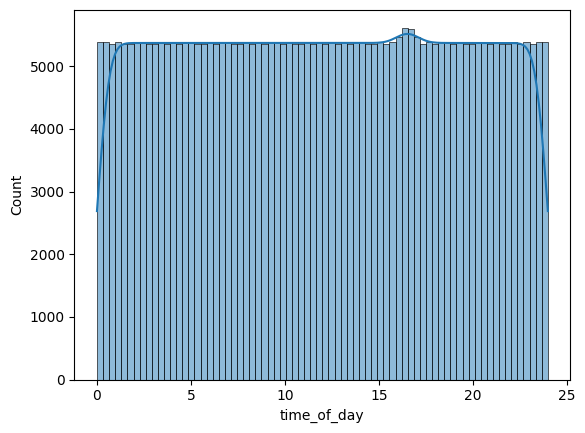

 22%|█████████████████▉                                                              | 223/996 [09:09<36:46,  2.85s/it]

35198c2d


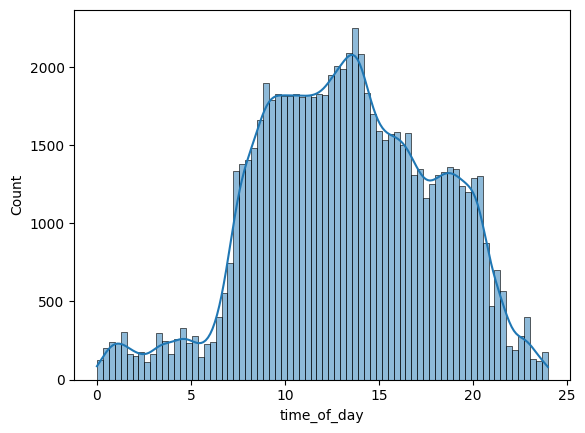

 22%|█████████████████▉                                                              | 224/996 [09:10<28:26,  2.21s/it]

351cd4ec


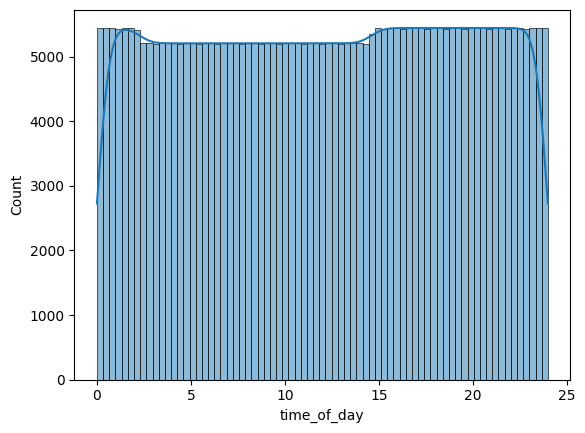

 23%|██████████████████                                                              | 225/996 [09:13<31:35,  2.46s/it]

35d2aa41


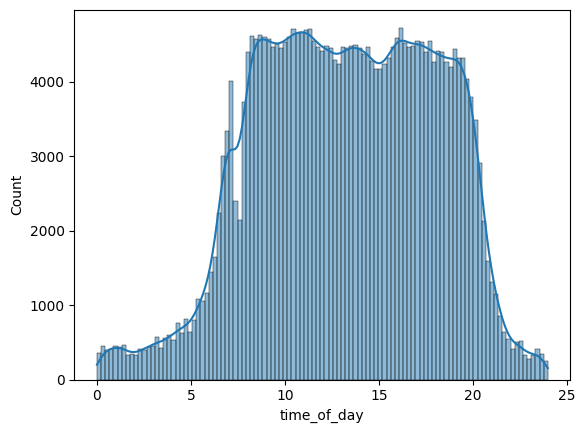

 23%|██████████████████▏                                                             | 226/996 [09:16<31:55,  2.49s/it]

35daea65


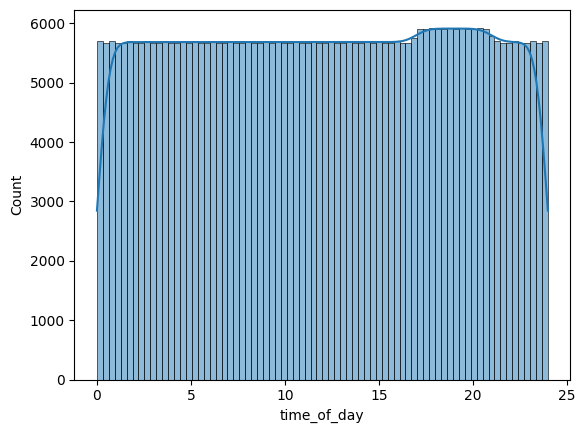

 23%|██████████████████▏                                                             | 227/996 [09:19<35:20,  2.76s/it]

35fa2ebf


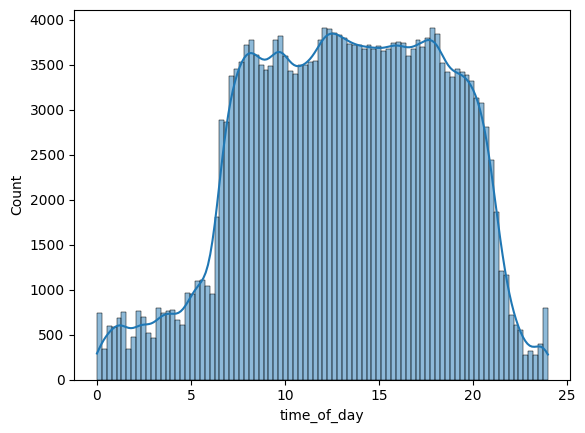

 23%|██████████████████▎                                                             | 228/996 [09:21<31:37,  2.47s/it]

36530d36


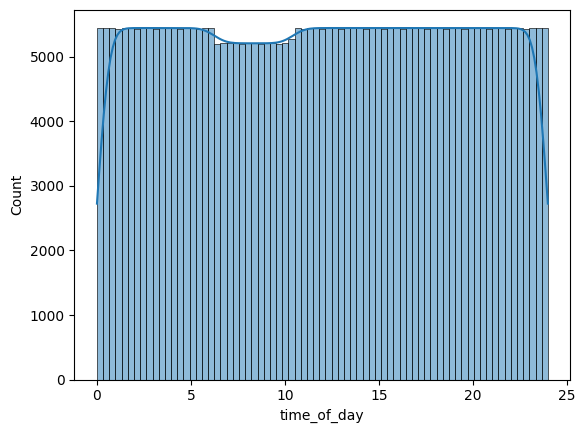

 23%|██████████████████▍                                                             | 229/996 [09:24<33:59,  2.66s/it]

36c060b9


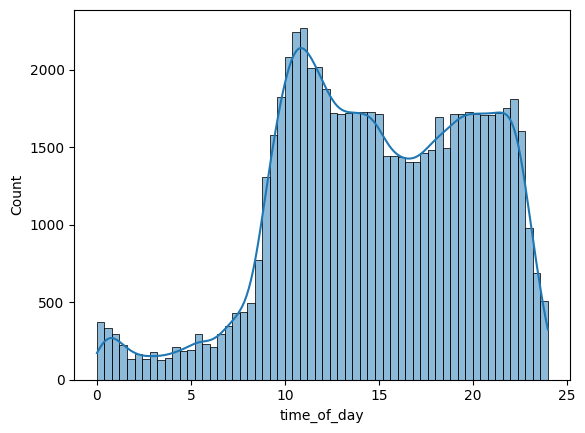

 23%|██████████████████▍                                                             | 230/996 [09:25<26:09,  2.05s/it]

36c1f189


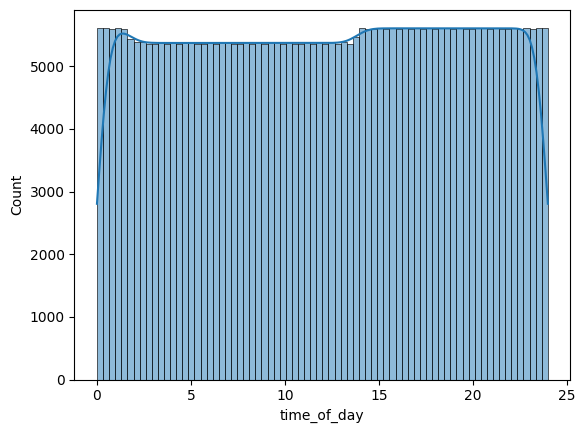

 23%|██████████████████▌                                                             | 231/996 [09:28<30:22,  2.38s/it]

372a7950


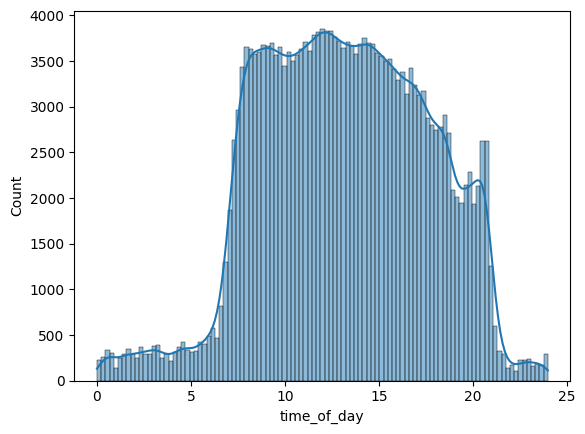

 23%|██████████████████▋                                                             | 232/996 [09:30<27:48,  2.18s/it]

37995242


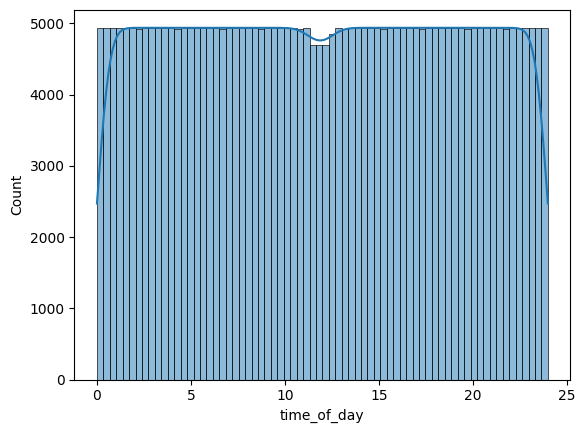

 23%|██████████████████▋                                                             | 233/996 [09:32<29:49,  2.35s/it]

37ae1239


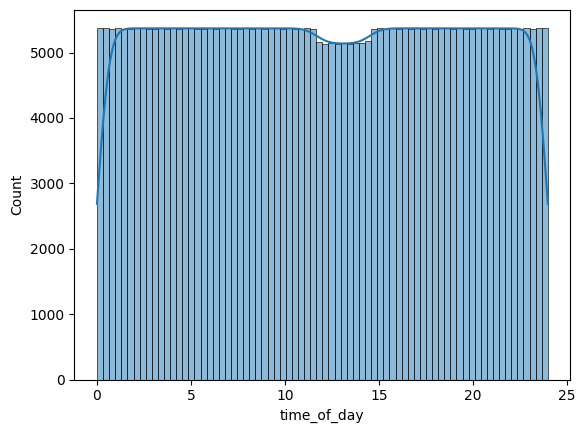

 23%|██████████████████▊                                                             | 234/996 [09:35<32:39,  2.57s/it]

37bcfa7e


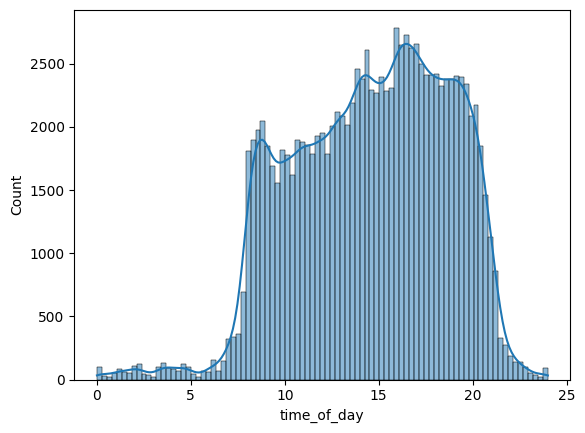

 24%|██████████████████▉                                                             | 235/996 [09:36<26:23,  2.08s/it]

380029ef


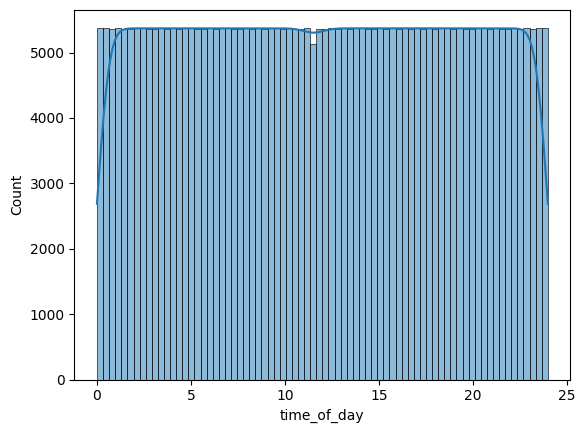

 24%|██████████████████▉                                                             | 236/996 [09:39<30:17,  2.39s/it]

3826be66


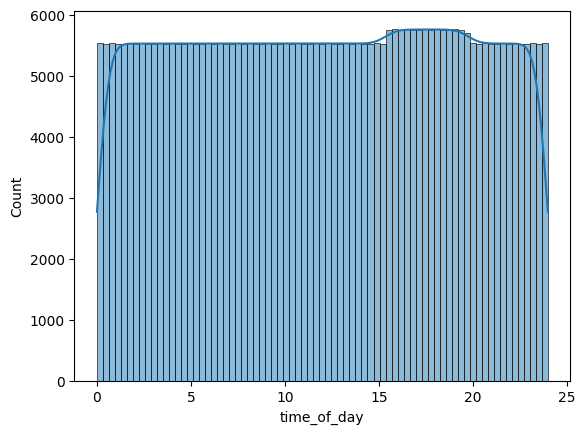

 24%|███████████████████                                                             | 237/996 [09:43<33:32,  2.65s/it]

384c3f27


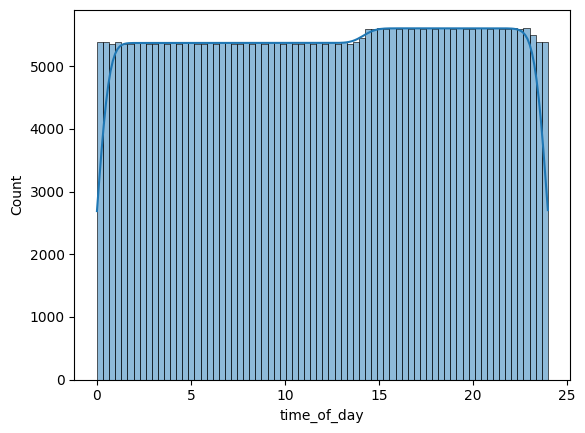

 24%|███████████████████                                                             | 238/996 [09:46<35:24,  2.80s/it]

3875d4de


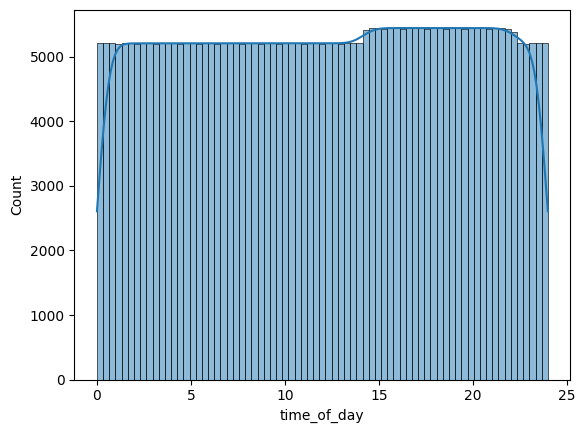

 24%|███████████████████▏                                                            | 239/996 [09:49<36:09,  2.87s/it]

38cccd6d


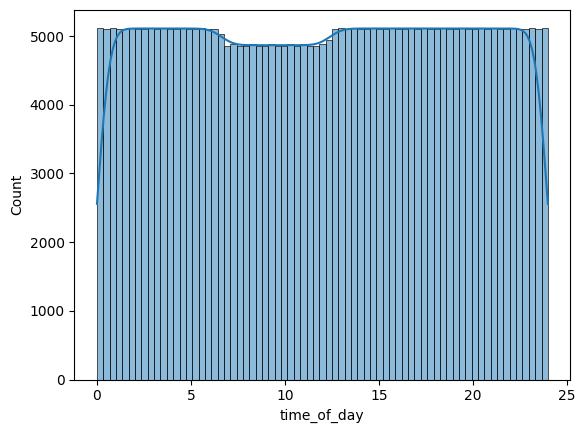

 24%|███████████████████▎                                                            | 240/996 [09:52<35:57,  2.85s/it]

38d53b92


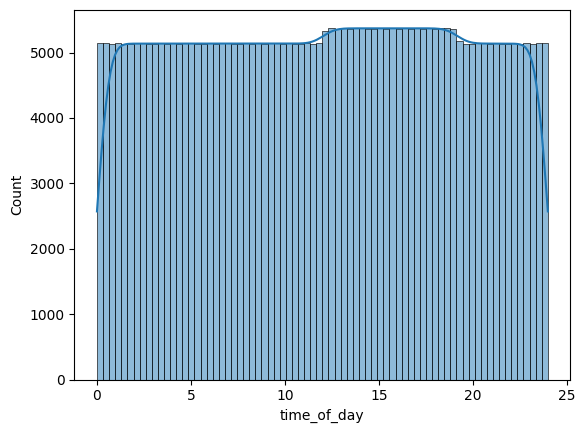

 24%|███████████████████▎                                                            | 241/996 [09:55<36:30,  2.90s/it]

3950aa00


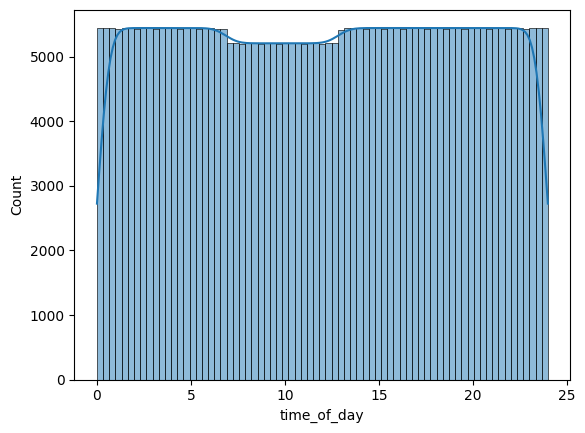

 24%|███████████████████▍                                                            | 242/996 [09:58<37:14,  2.96s/it]

397efe7a


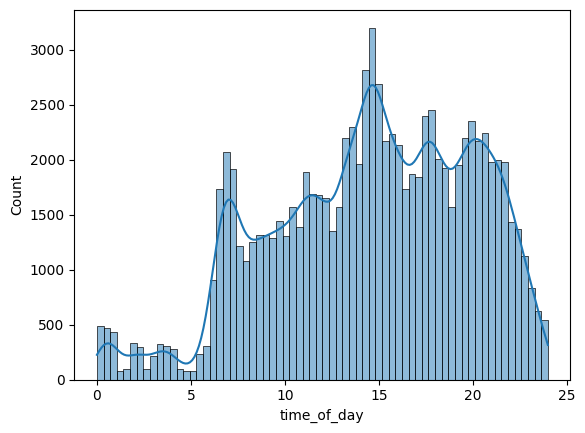

 24%|███████████████████▌                                                            | 243/996 [09:59<29:07,  2.32s/it]

3983d3cd


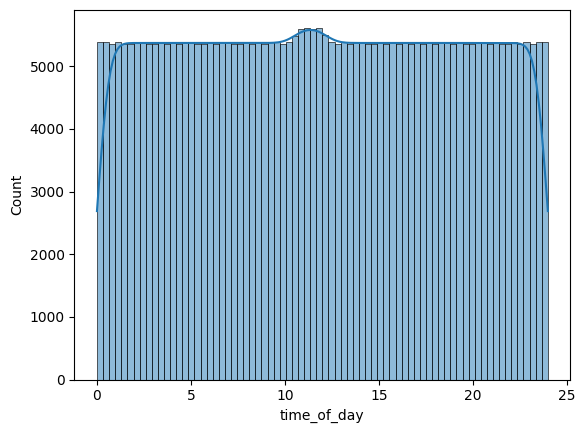

 24%|███████████████████▌                                                            | 244/996 [10:02<32:01,  2.55s/it]

39fb1ad0


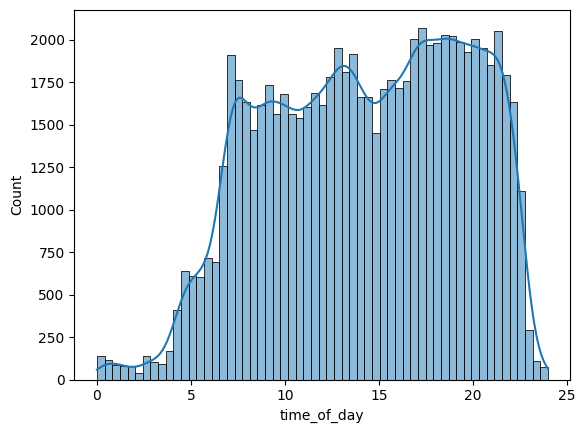

 25%|███████████████████▋                                                            | 245/996 [10:02<24:57,  1.99s/it]

3a594acf


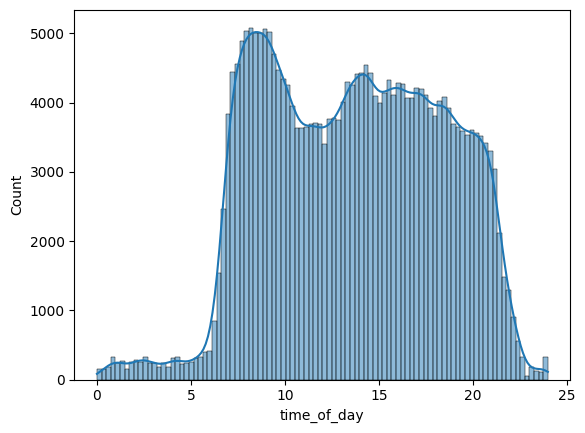

 25%|███████████████████▊                                                            | 246/996 [10:04<25:04,  2.01s/it]

3ab539f0


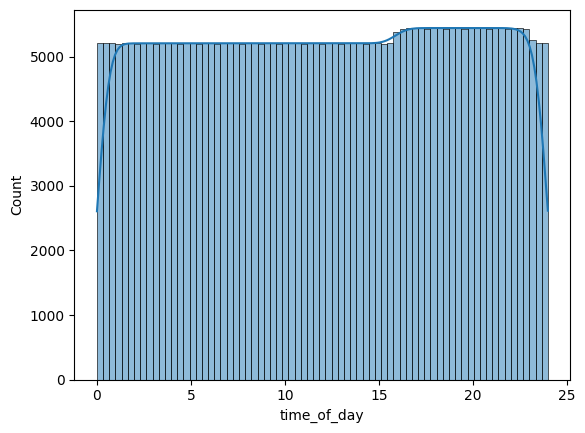

 25%|███████████████████▊                                                            | 247/996 [10:07<28:50,  2.31s/it]

3acb5be3


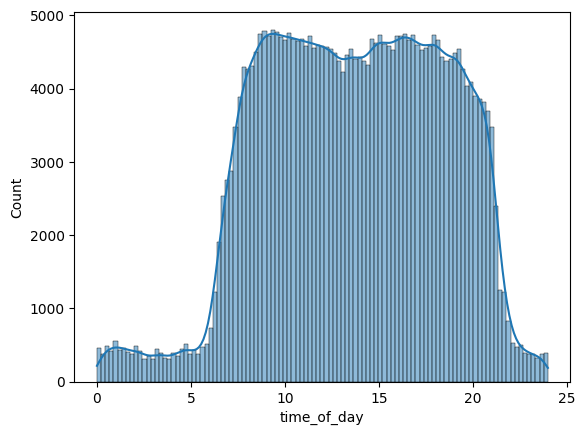

 25%|███████████████████▉                                                            | 248/996 [10:10<29:02,  2.33s/it]

3b091b83


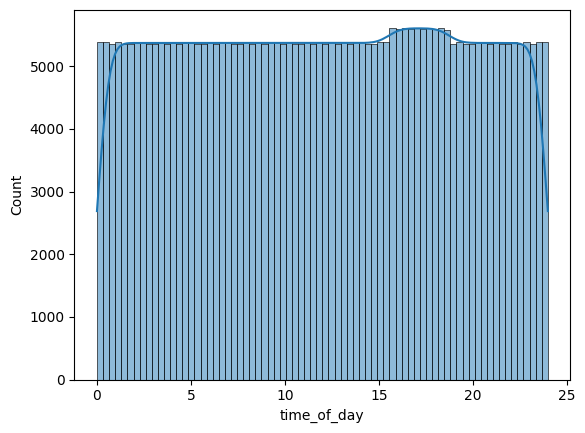

 25%|████████████████████                                                            | 249/996 [10:13<31:58,  2.57s/it]

3b1b9538


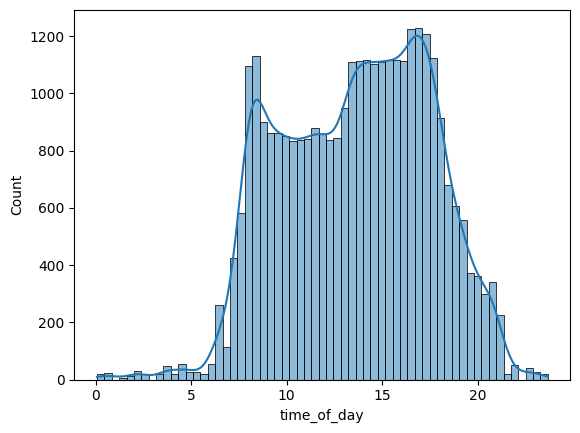

 25%|████████████████████                                                            | 250/996 [10:14<24:40,  1.98s/it]

3ba48ca7


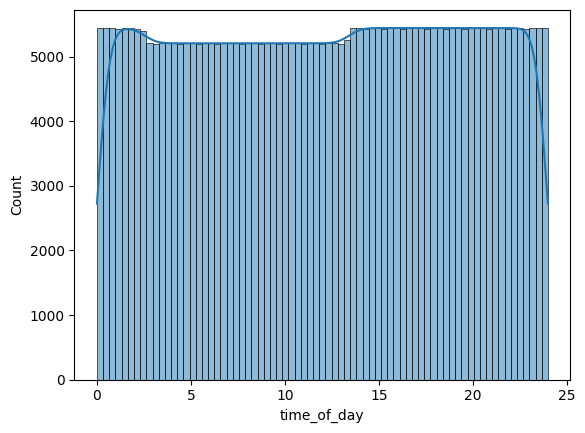

 25%|████████████████████▏                                                           | 251/996 [10:17<28:32,  2.30s/it]

3c0aba64


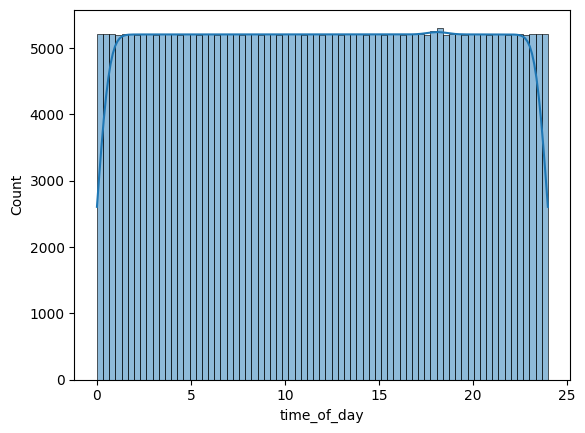

 25%|████████████████████▏                                                           | 252/996 [10:20<31:03,  2.50s/it]

3c2cf08e


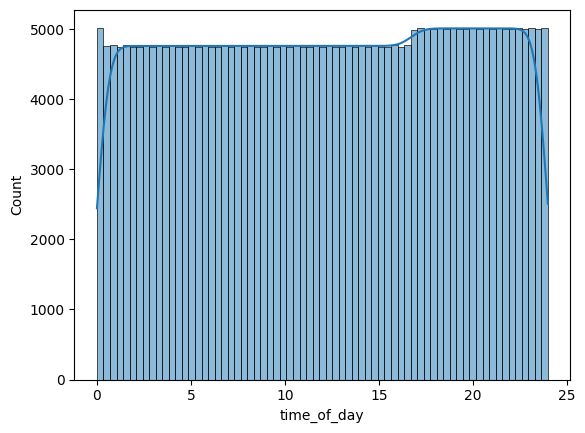

 25%|████████████████████▎                                                           | 253/996 [10:22<31:31,  2.55s/it]

3c620257


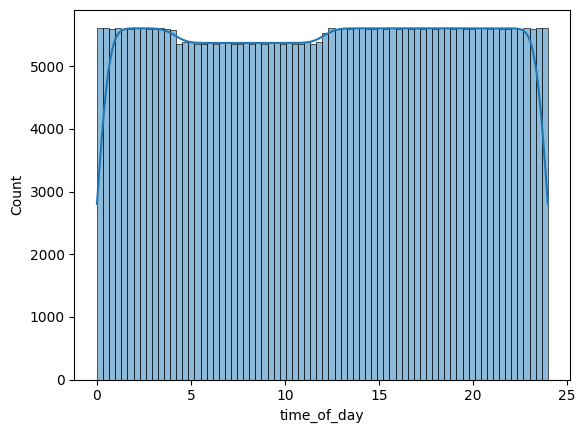

 26%|████████████████████▍                                                           | 254/996 [10:25<33:53,  2.74s/it]

3c8f474a


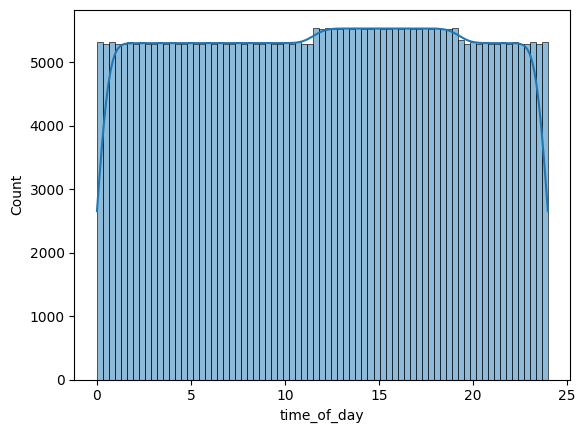

 26%|████████████████████▍                                                           | 255/996 [10:29<35:20,  2.86s/it]

3ca35642


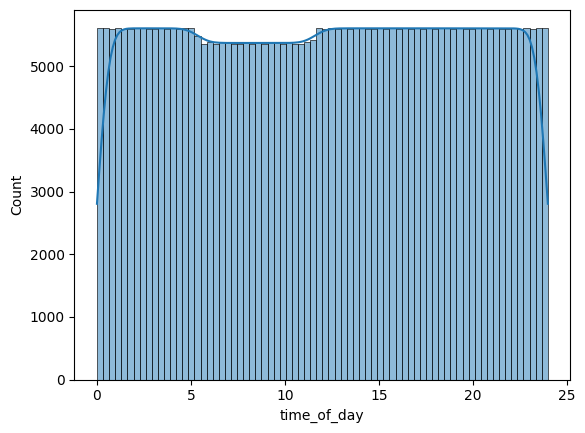

 26%|████████████████████▌                                                           | 256/996 [10:32<36:29,  2.96s/it]

3d36fe8b


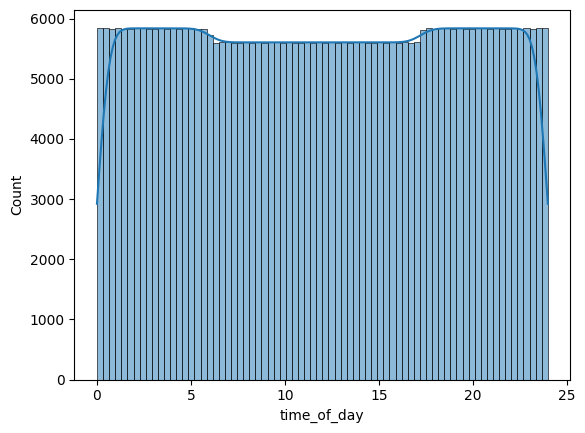

 26%|████████████████████▋                                                           | 257/996 [10:35<37:44,  3.06s/it]

3d3b87db


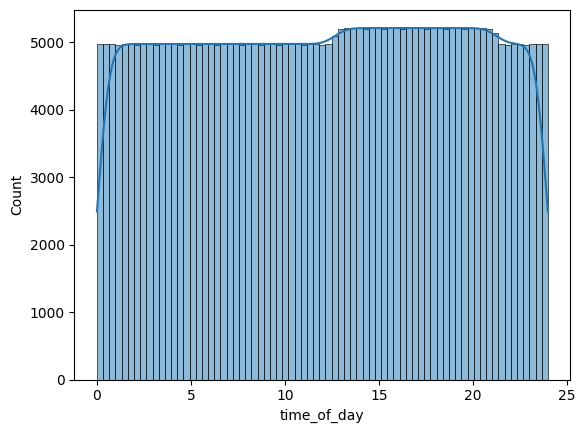

 26%|████████████████████▋                                                           | 258/996 [10:38<37:10,  3.02s/it]

3d3dd3ae


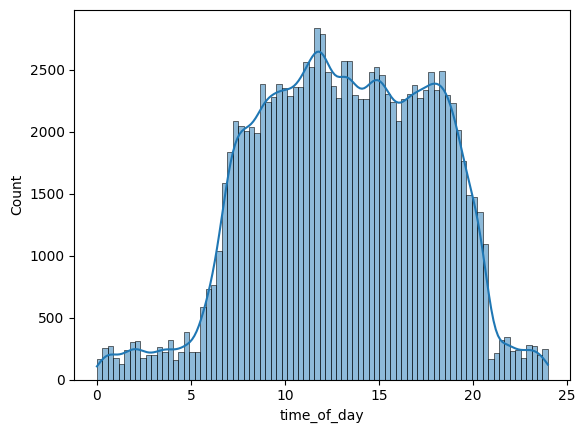

 26%|████████████████████▊                                                           | 259/996 [10:39<29:43,  2.42s/it]

3d48430d


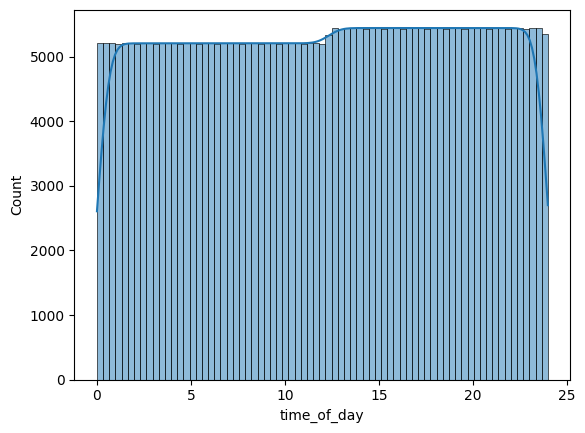

 26%|████████████████████▉                                                           | 260/996 [10:42<32:05,  2.62s/it]

3d6143f3


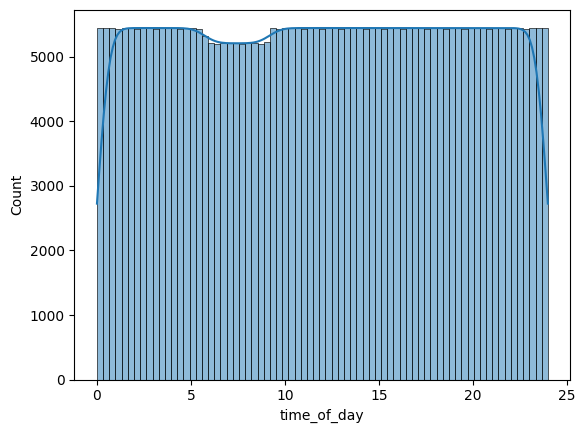

 26%|████████████████████▉                                                           | 261/996 [10:45<33:47,  2.76s/it]

3d736110


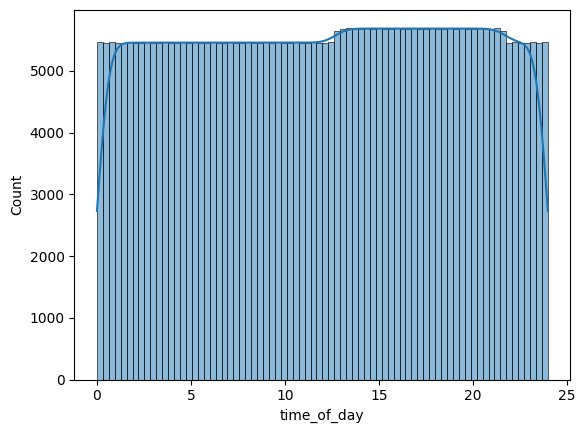

 26%|█████████████████████                                                           | 262/996 [10:49<35:45,  2.92s/it]

3d970ce4


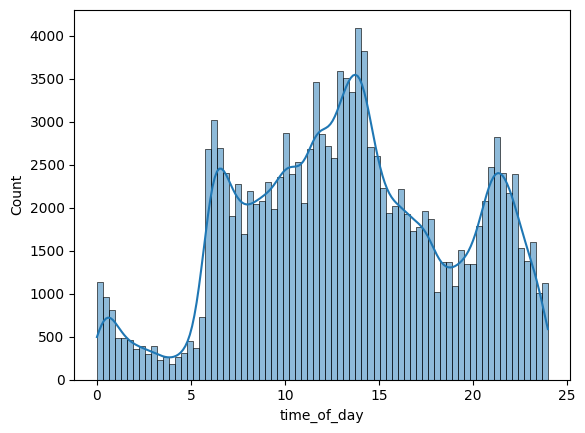

 26%|█████████████████████                                                           | 263/996 [10:50<29:13,  2.39s/it]

3e398bf9


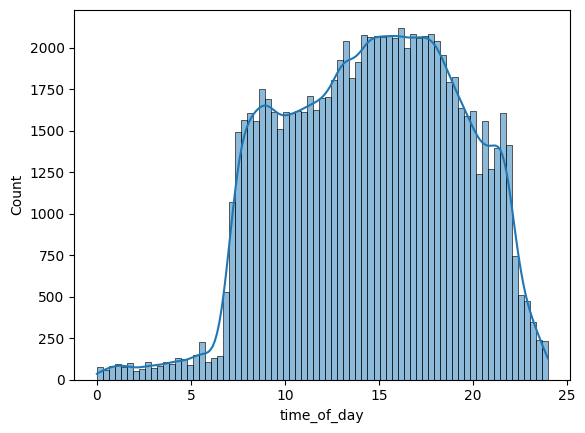

 27%|█████████████████████▏                                                          | 264/996 [10:50<23:15,  1.91s/it]

3e5d5b58


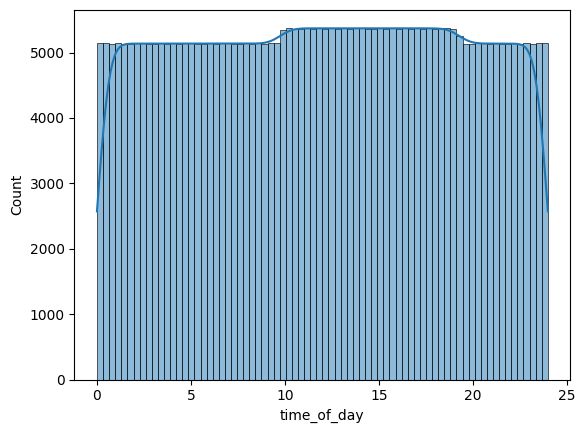

 27%|█████████████████████▎                                                          | 265/996 [10:53<27:20,  2.24s/it]

3e5ee48c


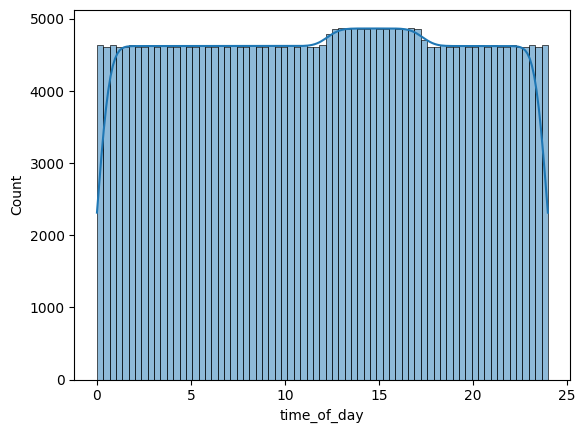

 27%|█████████████████████▎                                                          | 266/996 [10:56<28:42,  2.36s/it]

3f1cf5ba


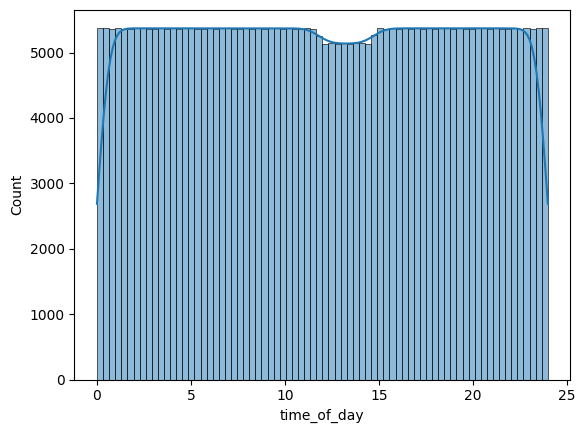

 27%|█████████████████████▍                                                          | 267/996 [10:59<31:23,  2.58s/it]

3f1f23e7


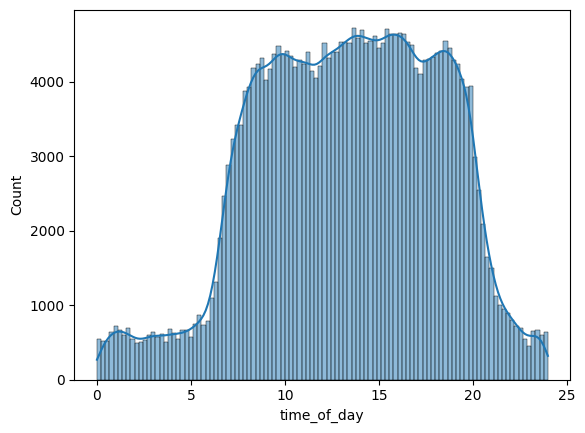

 27%|█████████████████████▌                                                          | 268/996 [11:01<30:13,  2.49s/it]

3fcef947


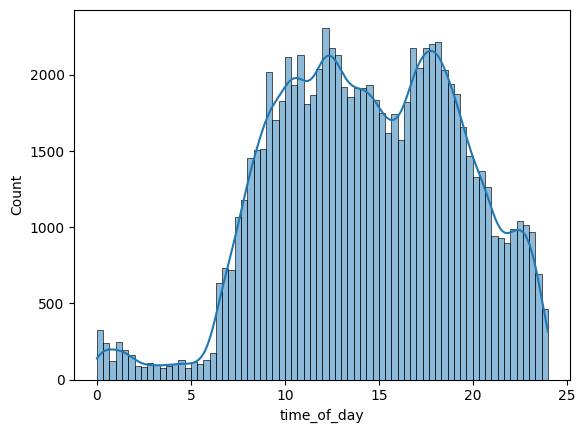

 27%|█████████████████████▌                                                          | 269/996 [11:02<23:54,  1.97s/it]

40087bc5


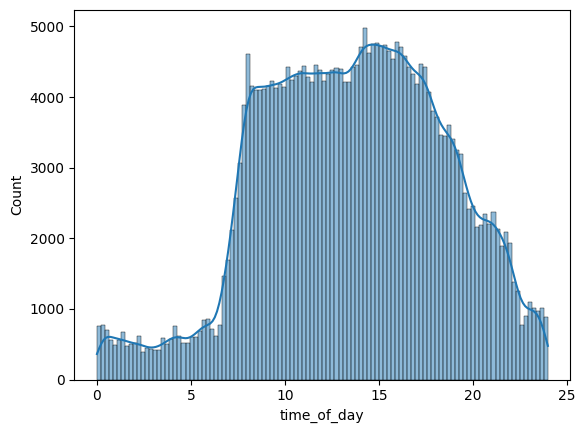

 27%|█████████████████████▋                                                          | 270/996 [11:05<25:06,  2.07s/it]

408bed19


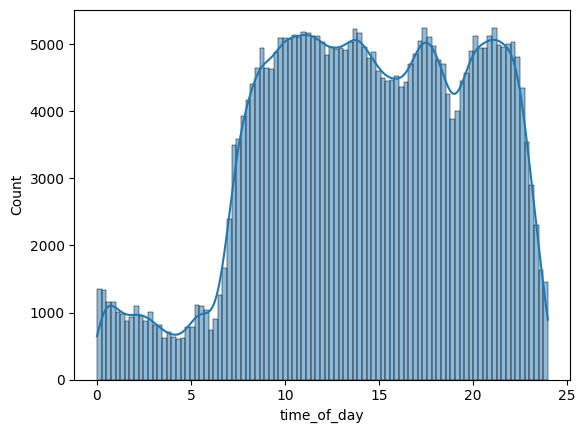

 27%|█████████████████████▊                                                          | 271/996 [11:07<27:02,  2.24s/it]

40aae75f


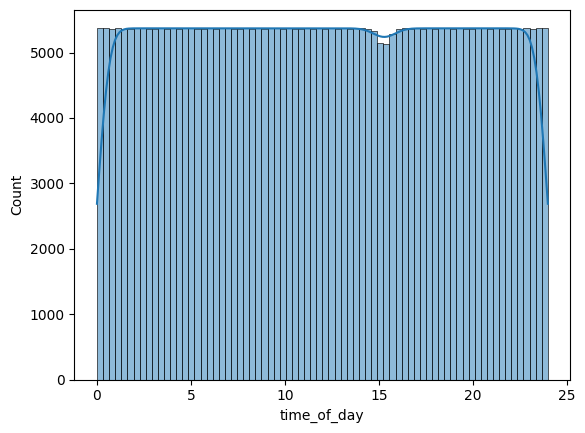

 27%|█████████████████████▊                                                          | 272/996 [11:10<30:06,  2.50s/it]

416b6ba2


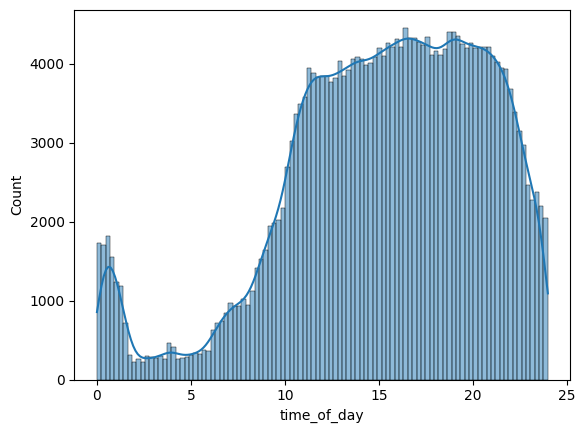

 27%|█████████████████████▉                                                          | 273/996 [11:12<28:33,  2.37s/it]

4177e5e5


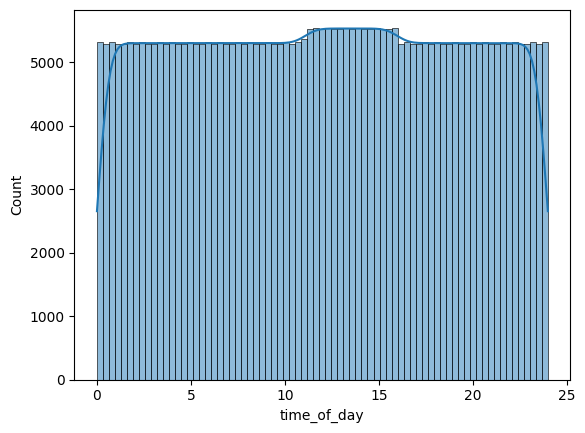

 28%|██████████████████████                                                          | 274/996 [11:15<31:15,  2.60s/it]

419d05c6


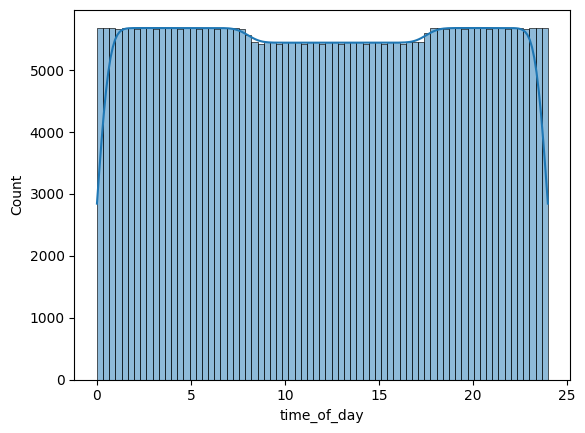

 28%|██████████████████████                                                          | 275/996 [11:19<34:15,  2.85s/it]

427037b2


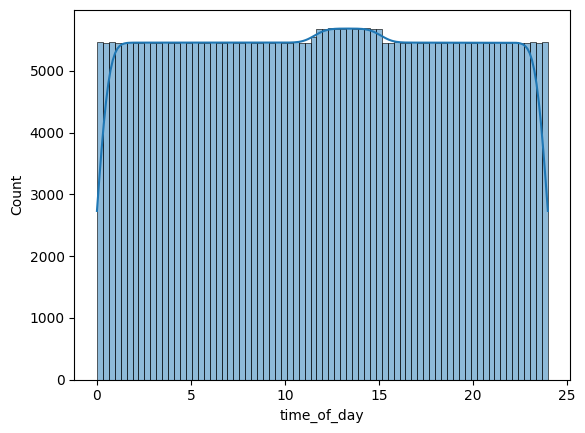

 28%|██████████████████████▏                                                         | 276/996 [11:22<35:40,  2.97s/it]

4280076d


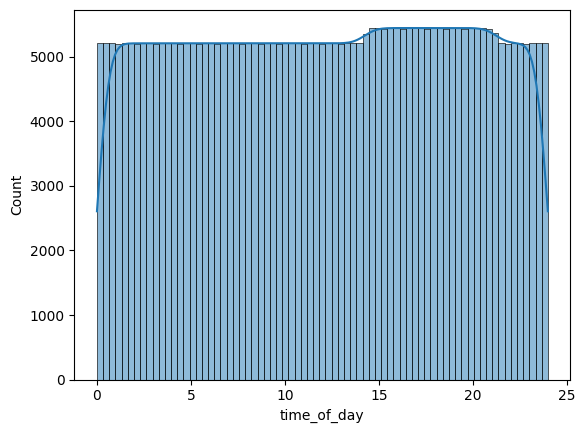

 28%|██████████████████████▏                                                         | 277/996 [11:25<35:46,  2.99s/it]

428970d4


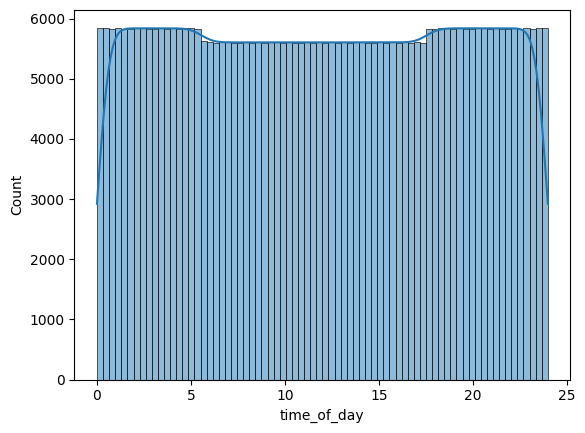

 28%|██████████████████████▎                                                         | 278/996 [11:28<36:49,  3.08s/it]

428c37ea


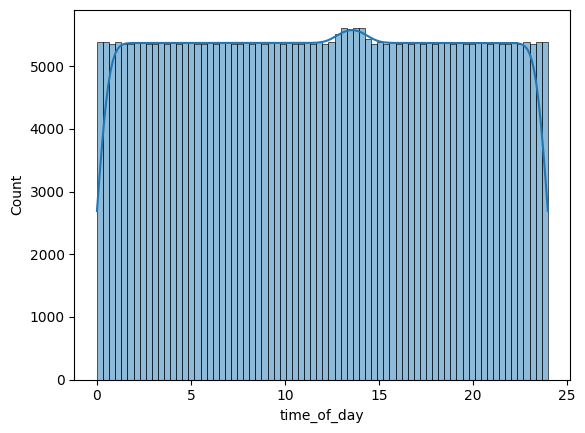

 28%|██████████████████████▍                                                         | 279/996 [11:32<36:52,  3.09s/it]

429cc266


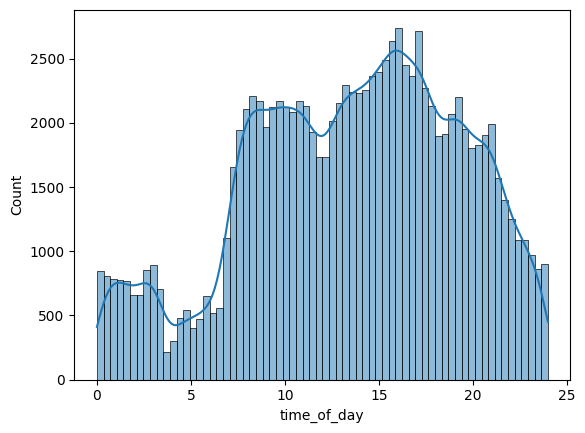

 28%|██████████████████████▍                                                         | 280/996 [11:33<29:05,  2.44s/it]

4307d287


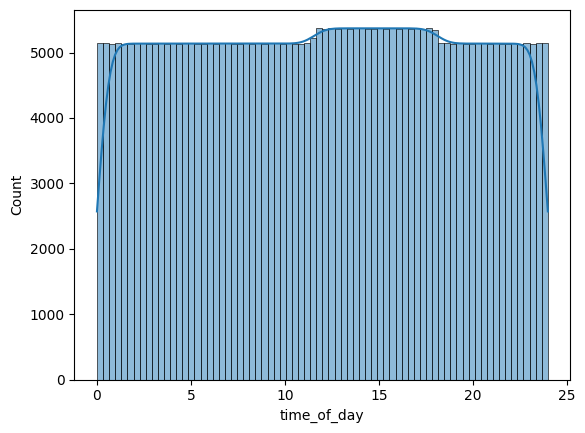

 28%|██████████████████████▌                                                         | 281/996 [11:36<31:05,  2.61s/it]

432aff11


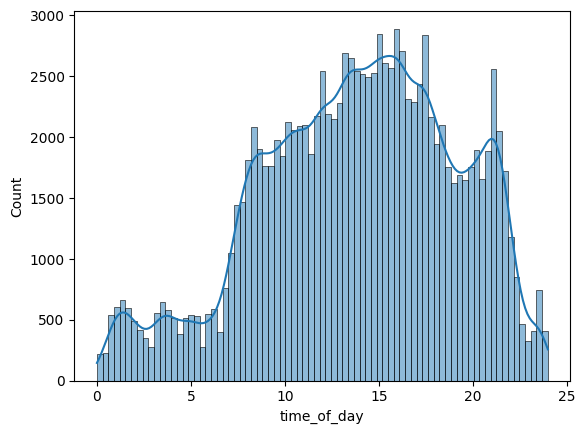

 28%|██████████████████████▋                                                         | 282/996 [11:37<25:22,  2.13s/it]

43629a34


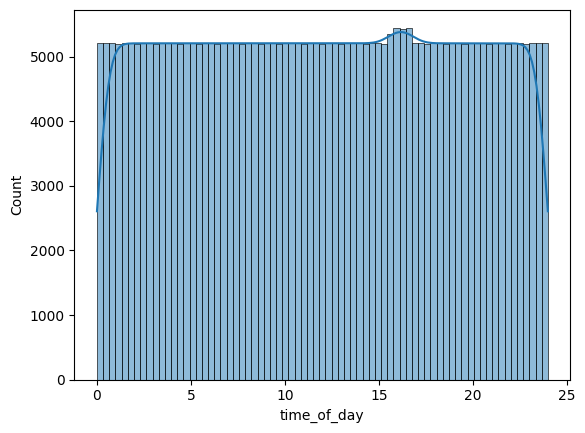

 28%|██████████████████████▋                                                         | 283/996 [11:40<28:21,  2.39s/it]

436dd613


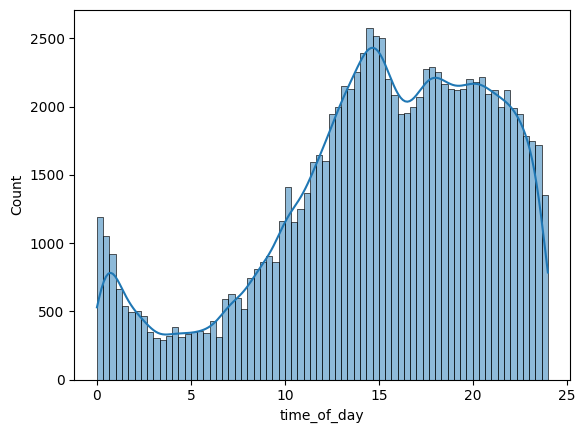

 29%|██████████████████████▊                                                         | 284/996 [11:40<22:57,  1.93s/it]

43720c15


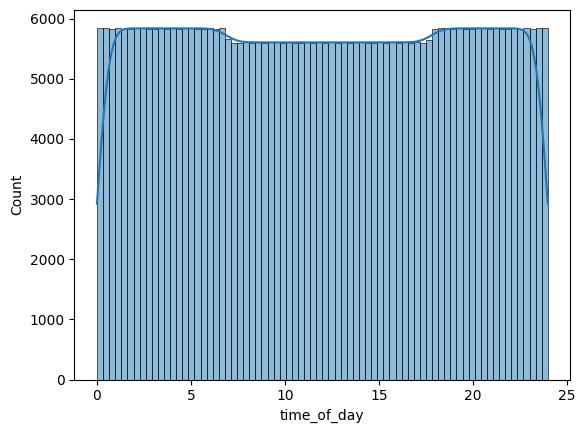

 29%|██████████████████████▉                                                         | 285/996 [11:44<27:49,  2.35s/it]

43a7386d


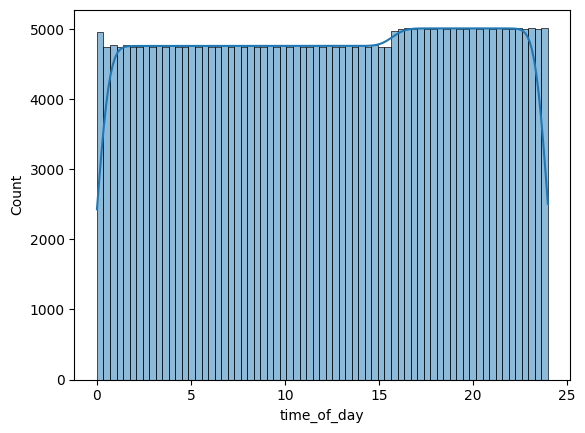

 29%|██████████████████████▉                                                         | 286/996 [11:46<28:51,  2.44s/it]

43f44f6c


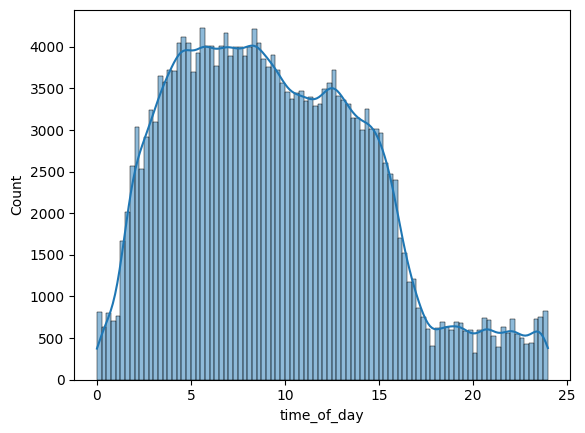

 29%|███████████████████████                                                         | 287/996 [11:48<26:38,  2.25s/it]

43f5d3c5


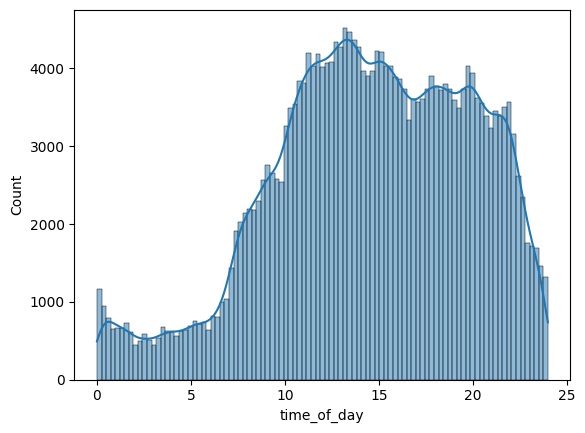

 29%|███████████████████████▏                                                        | 288/996 [11:50<25:41,  2.18s/it]

440acf4f


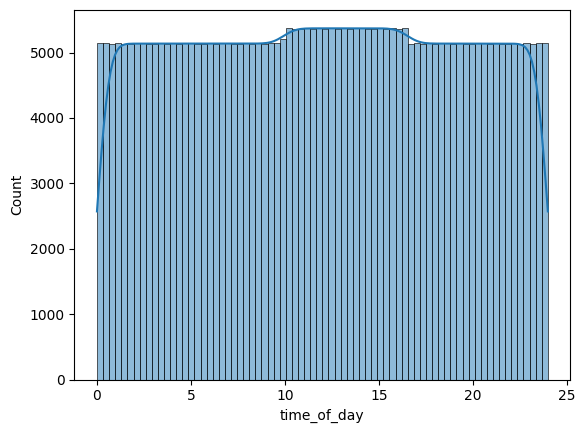

 29%|███████████████████████▏                                                        | 289/996 [11:53<28:38,  2.43s/it]

4442c376


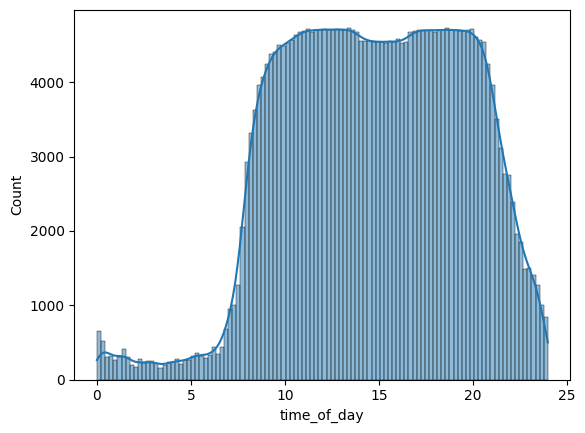

 29%|███████████████████████▎                                                        | 290/996 [11:56<28:26,  2.42s/it]

4570c8b8


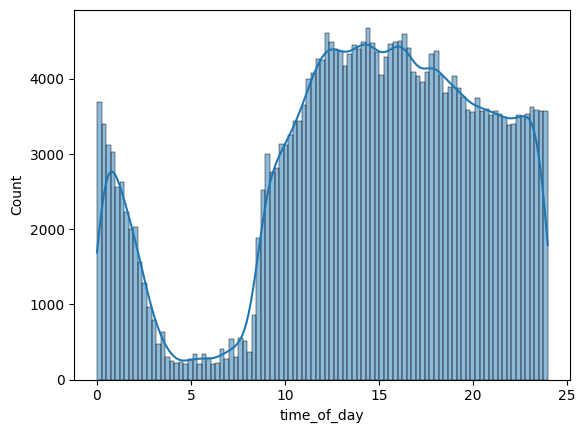

 29%|███████████████████████▎                                                        | 291/996 [11:58<27:47,  2.36s/it]

464a75fb


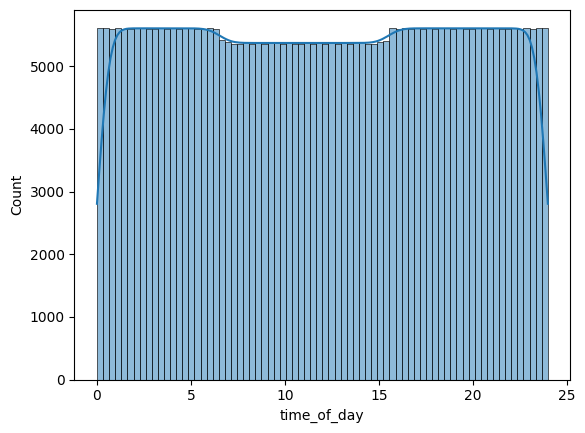

 29%|███████████████████████▍                                                        | 292/996 [12:01<30:38,  2.61s/it]

467c549f


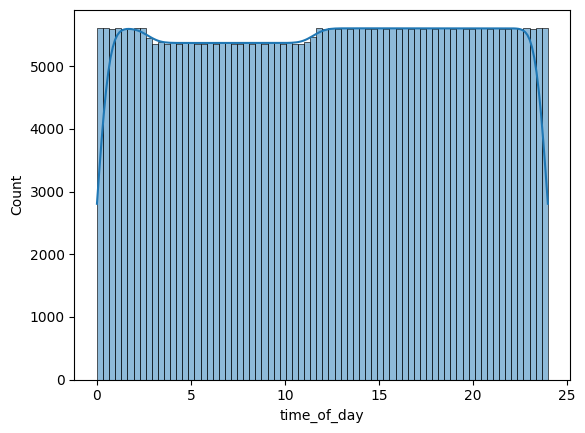

 29%|███████████████████████▌                                                        | 293/996 [12:04<32:44,  2.79s/it]

47240aa3


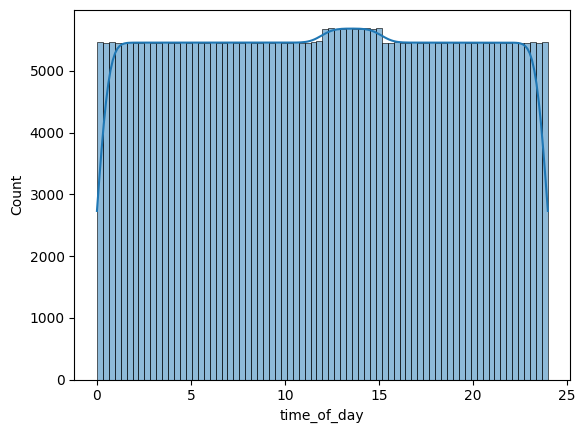

 30%|███████████████████████▌                                                        | 294/996 [12:08<34:17,  2.93s/it]

47350ac6


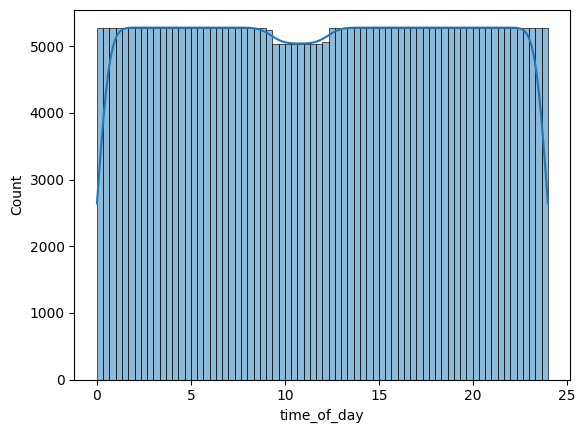

 30%|███████████████████████▋                                                        | 295/996 [12:10<34:25,  2.95s/it]

481a1861


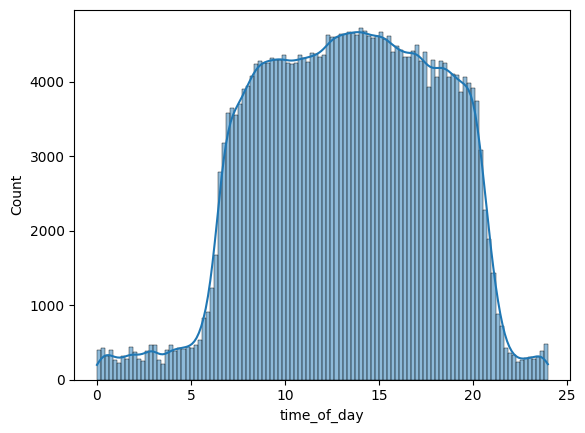

 30%|███████████████████████▊                                                        | 296/996 [12:13<32:08,  2.76s/it]

4859a9f9


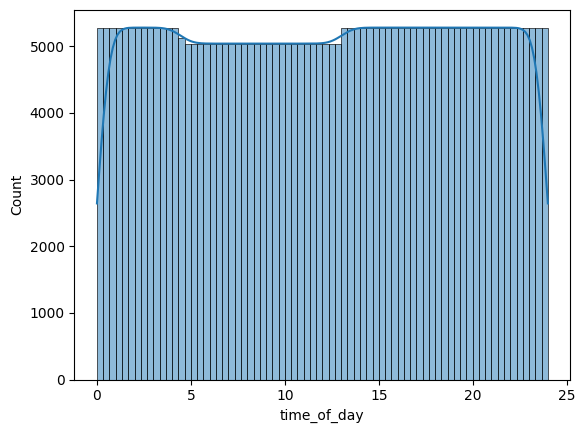

 30%|███████████████████████▊                                                        | 297/996 [12:16<32:45,  2.81s/it]

48db8ecf


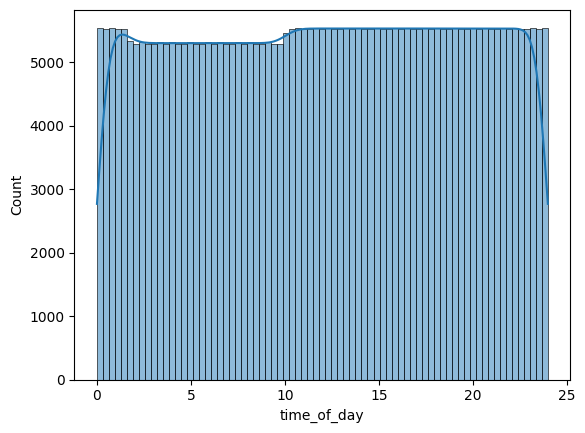

 30%|███████████████████████▉                                                        | 298/996 [12:19<34:07,  2.93s/it]

48df987b


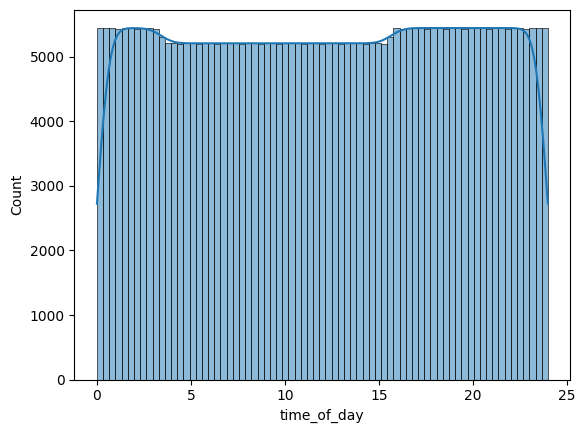

 30%|████████████████████████                                                        | 299/996 [12:22<34:27,  2.97s/it]

48e69212


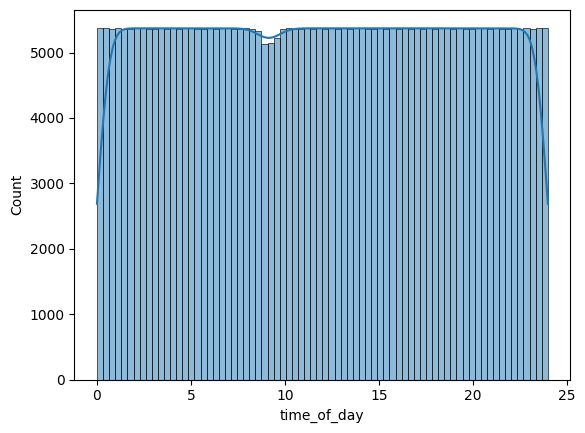

 30%|████████████████████████                                                        | 300/996 [12:25<35:44,  3.08s/it]

4926b18a


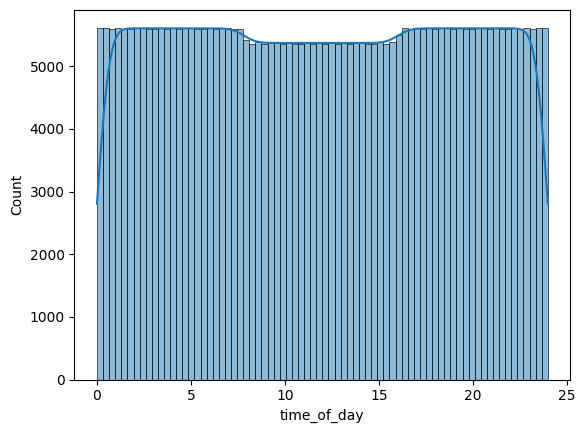

 30%|████████████████████████▏                                                       | 301/996 [12:29<36:05,  3.12s/it]

4940a214


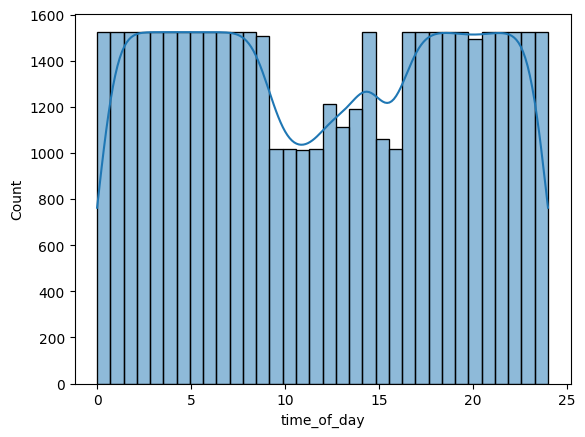

 30%|████████████████████████▎                                                       | 302/996 [12:29<26:51,  2.32s/it]

4950e24c


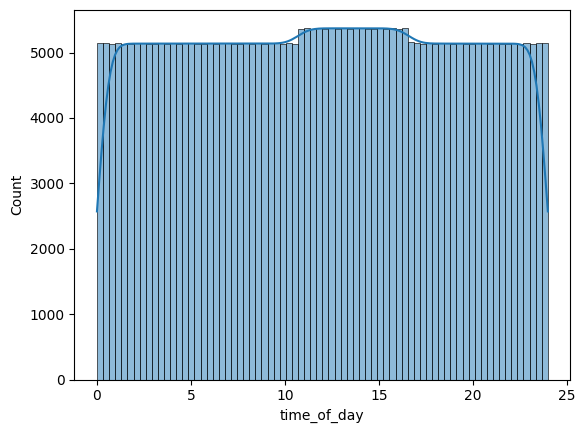

 30%|████████████████████████▎                                                       | 303/996 [12:32<29:10,  2.53s/it]

49a1931d


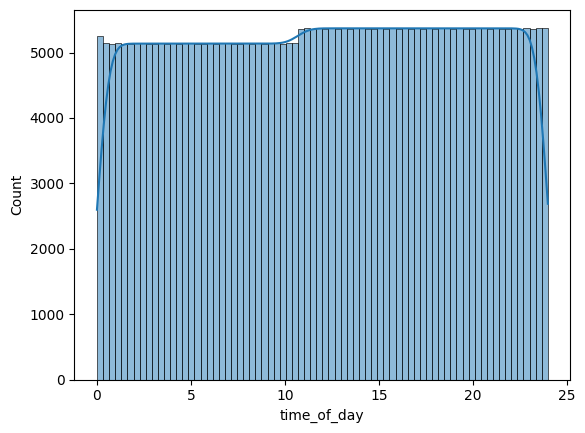

 31%|████████████████████████▍                                                       | 304/996 [12:35<30:58,  2.69s/it]

49e4eade


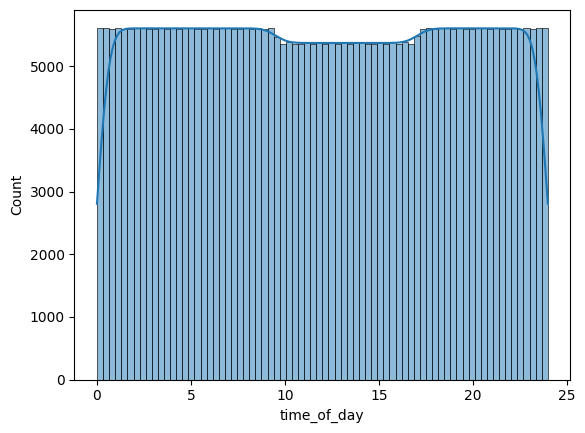

 31%|████████████████████████▍                                                       | 305/996 [12:38<32:55,  2.86s/it]

4a1440d9


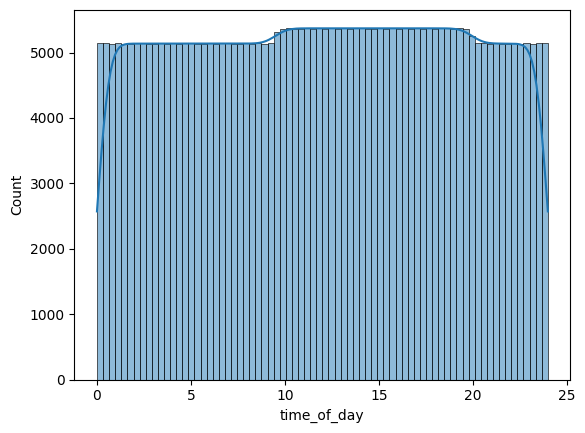

 31%|████████████████████████▌                                                       | 306/996 [12:41<33:30,  2.91s/it]

4a17b463


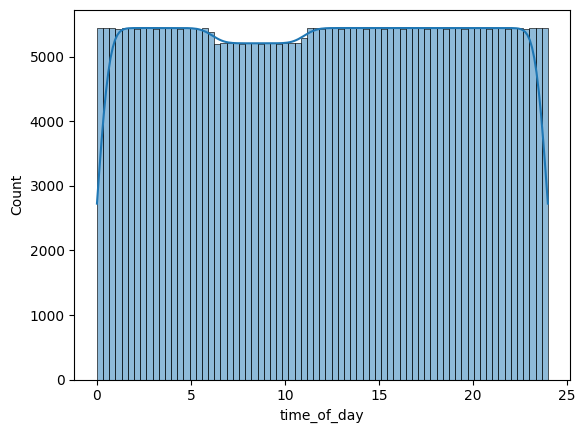

 31%|████████████████████████▋                                                       | 307/996 [12:45<34:14,  2.98s/it]

4a475a9f


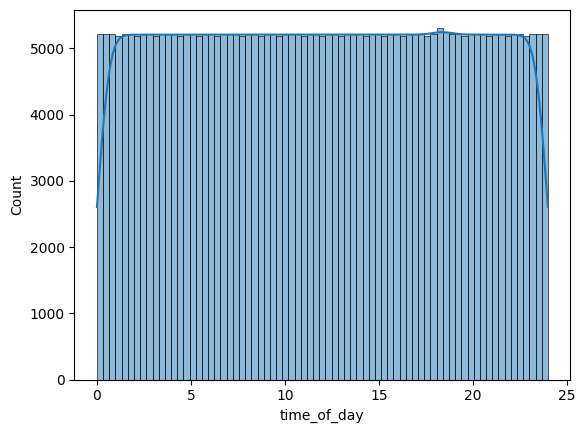

 31%|████████████████████████▋                                                       | 308/996 [12:48<34:12,  2.98s/it]

4a4a0f78


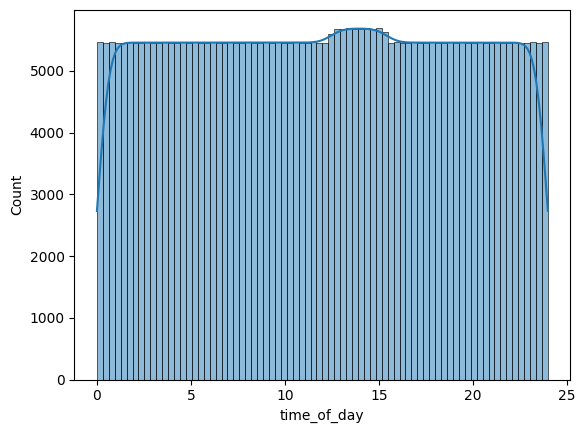

 31%|████████████████████████▊                                                       | 309/996 [12:51<35:00,  3.06s/it]

4a62661a


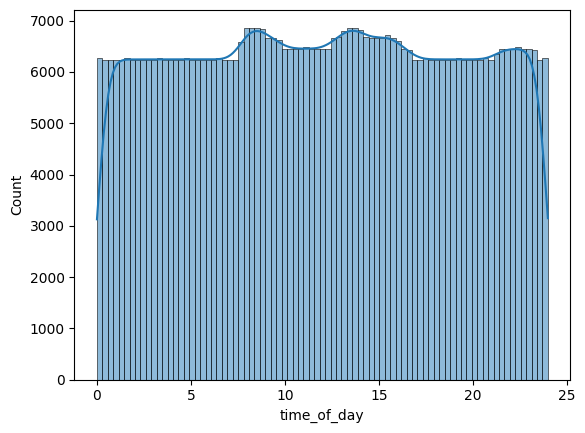

 31%|████████████████████████▉                                                       | 310/996 [12:55<38:23,  3.36s/it]

4a6af685


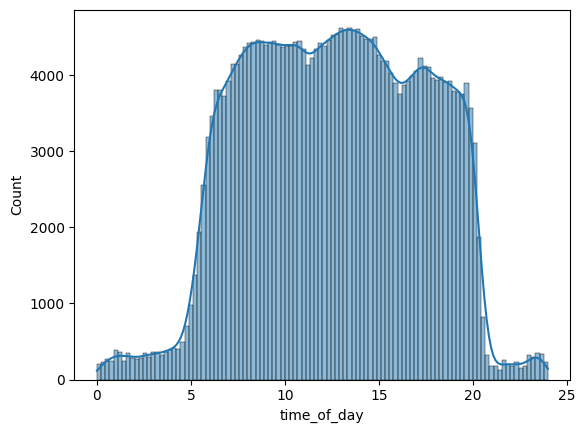

 31%|████████████████████████▉                                                       | 311/996 [12:57<34:28,  3.02s/it]

4a9f92ca


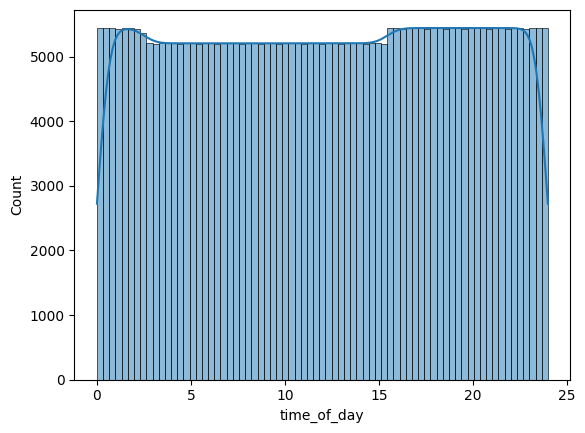

 31%|█████████████████████████                                                       | 312/996 [13:00<34:29,  3.03s/it]

4aa87859


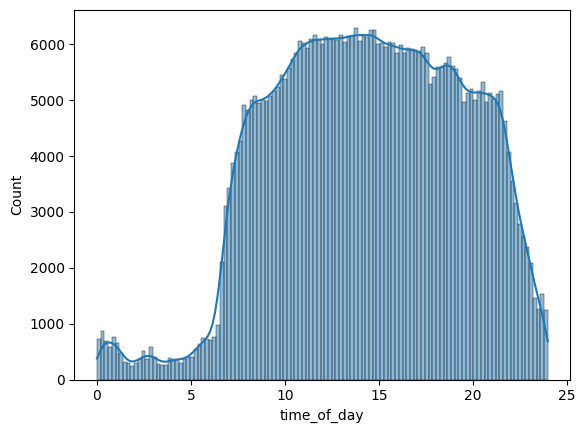

 31%|█████████████████████████▏                                                      | 313/996 [13:03<35:43,  3.14s/it]

4b0f961e


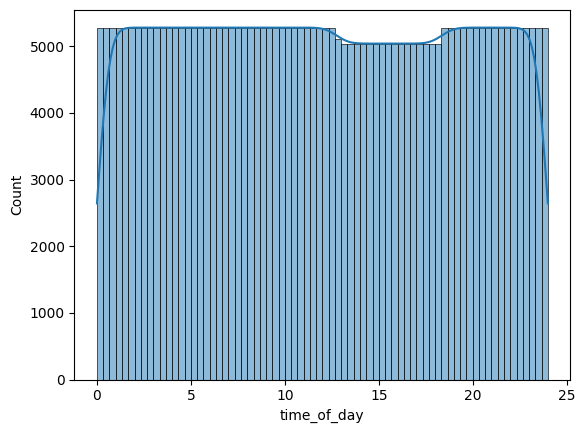

 32%|█████████████████████████▏                                                      | 314/996 [13:06<35:03,  3.08s/it]

4b3c7594


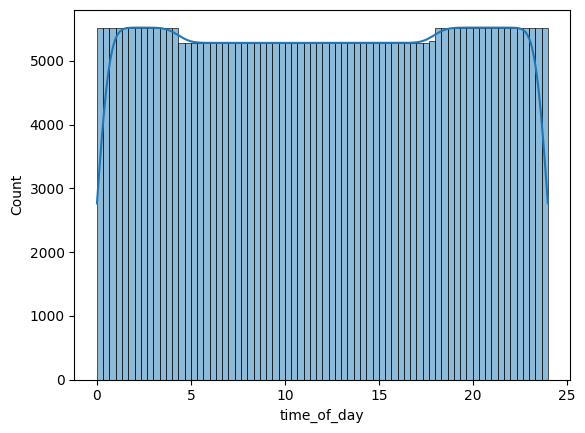

 32%|█████████████████████████▎                                                      | 315/996 [13:09<34:49,  3.07s/it]

4b71830a


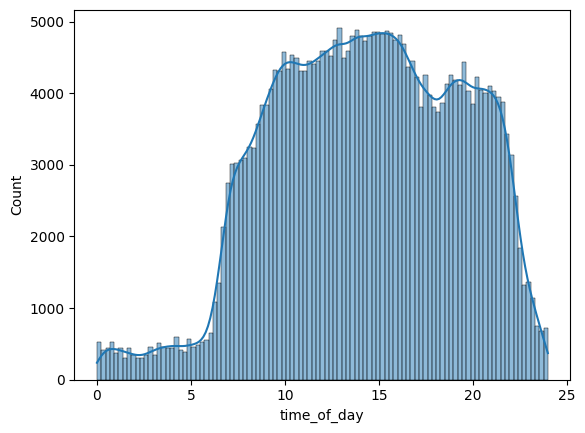

 32%|█████████████████████████▍                                                      | 316/996 [13:12<32:17,  2.85s/it]

4bc2bee9


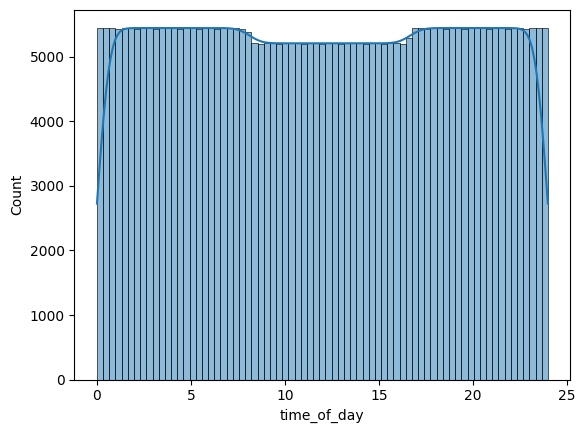

 32%|█████████████████████████▍                                                      | 317/996 [13:15<32:59,  2.92s/it]

4ca242ea


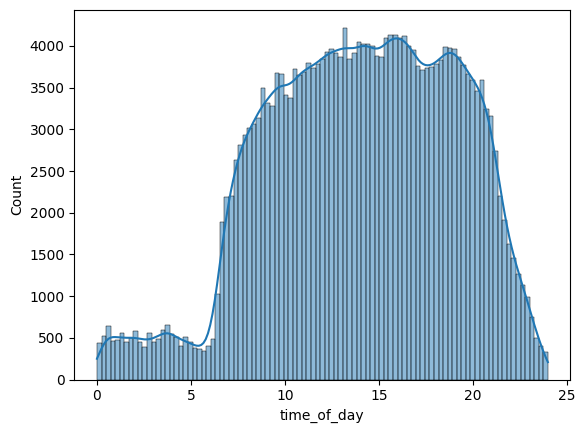

 32%|█████████████████████████▌                                                      | 318/996 [13:17<29:36,  2.62s/it]

4cabd7aa


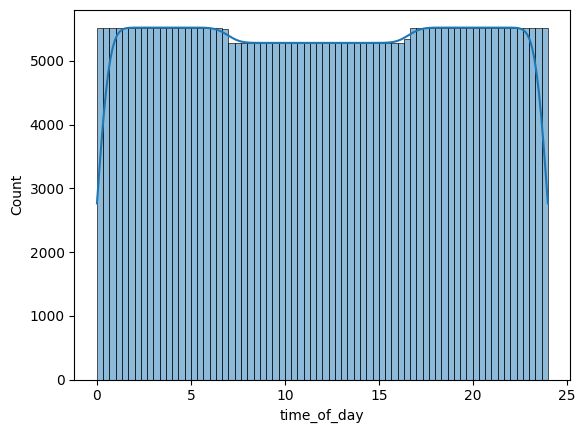

 32%|█████████████████████████▌                                                      | 319/996 [13:20<31:02,  2.75s/it]

4cde1e34


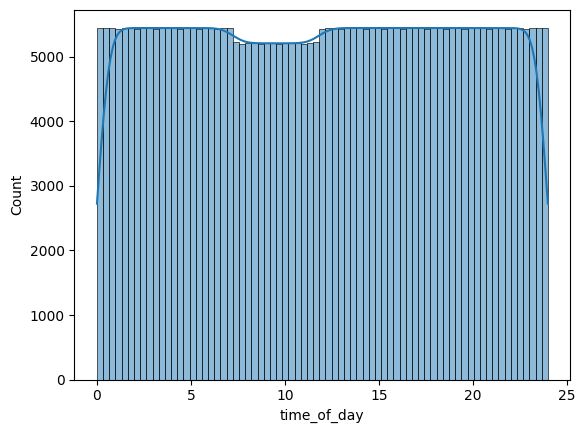

 32%|█████████████████████████▋                                                      | 320/996 [13:23<32:08,  2.85s/it]

4d19854c


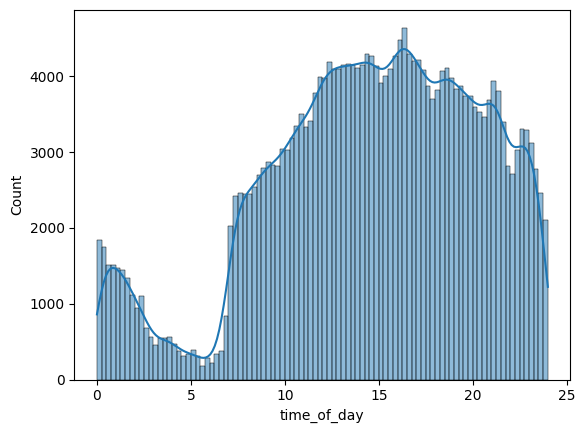

 32%|█████████████████████████▊                                                      | 321/996 [13:25<29:29,  2.62s/it]

4d5a8ce7


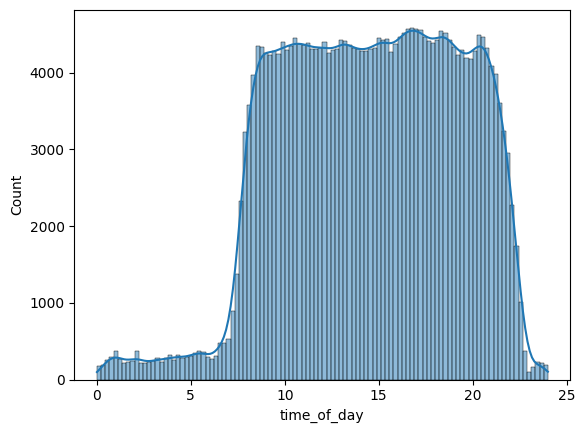

 32%|█████████████████████████▊                                                      | 322/996 [13:27<28:06,  2.50s/it]

4d61a44e


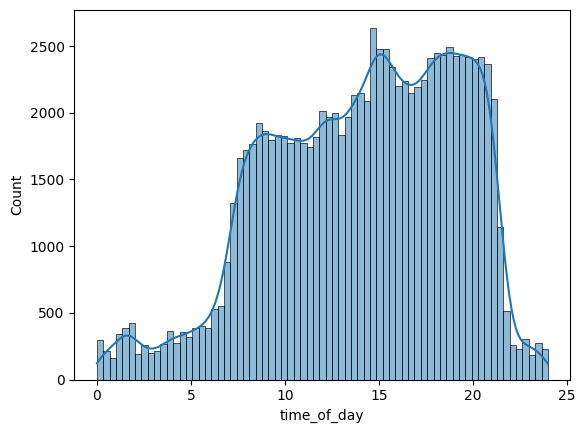

 32%|█████████████████████████▉                                                      | 323/996 [13:28<22:31,  2.01s/it]

4dc4ed56


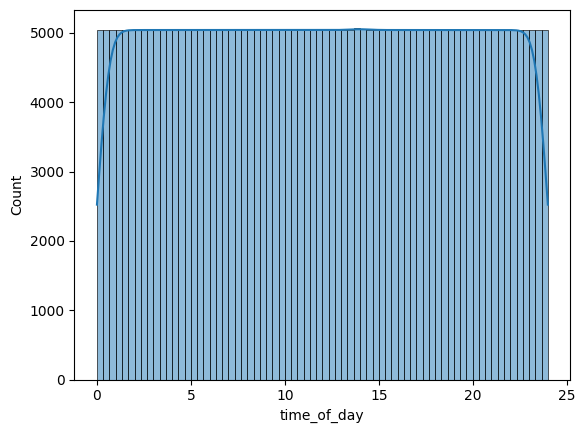

 33%|██████████████████████████                                                      | 324/996 [13:31<26:15,  2.34s/it]

4decbcd8


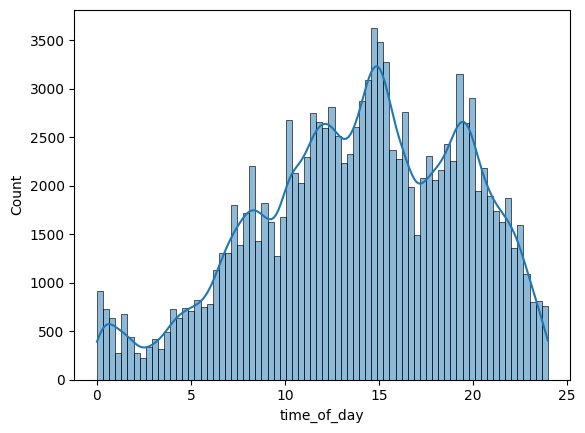

 33%|██████████████████████████                                                      | 325/996 [13:32<21:56,  1.96s/it]

4dfb4e1d


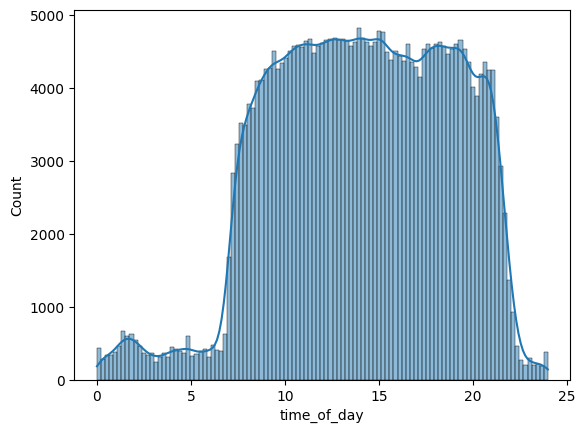

 33%|██████████████████████████▏                                                     | 326/996 [13:35<23:14,  2.08s/it]

4e6c7a75


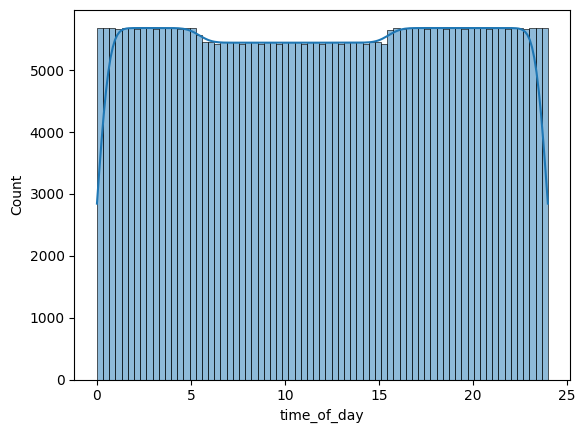

 33%|██████████████████████████▎                                                     | 327/996 [13:38<26:53,  2.41s/it]

4e85505f


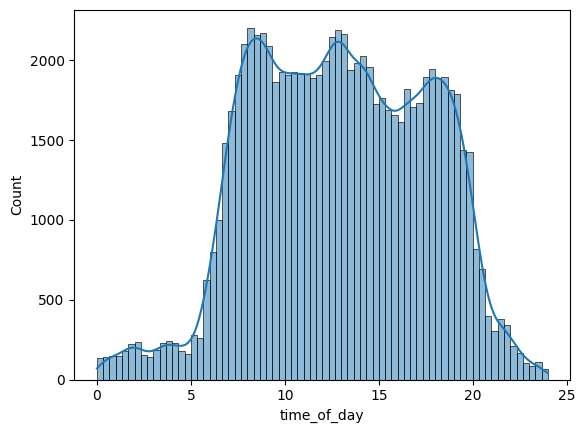

 33%|██████████████████████████▎                                                     | 328/996 [13:39<21:18,  1.91s/it]

4f059221


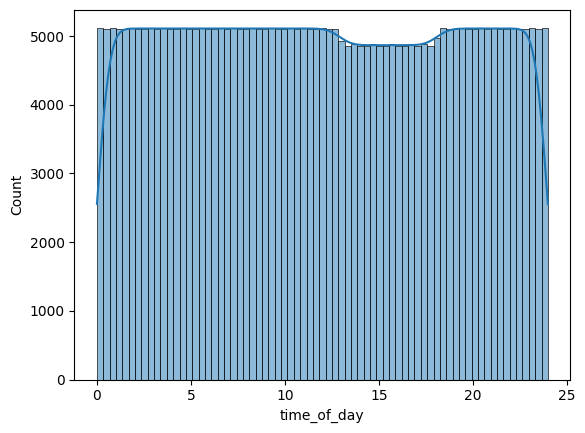

 33%|██████████████████████████▍                                                     | 329/996 [13:41<24:19,  2.19s/it]

4f20b188


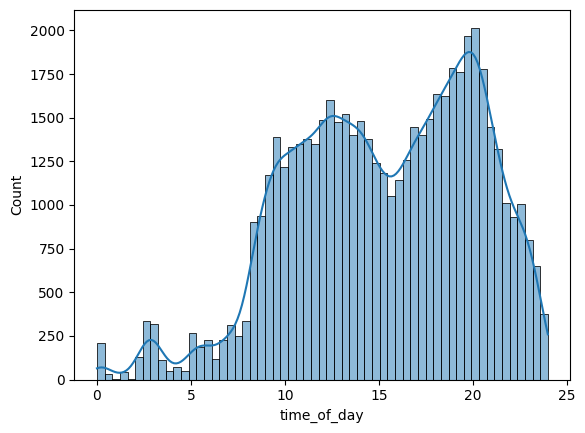

 33%|██████████████████████████▌                                                     | 330/996 [13:42<18:46,  1.69s/it]

4fd7e043


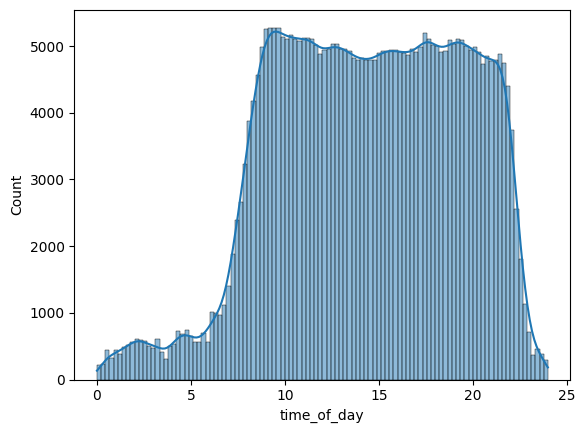

 33%|██████████████████████████▌                                                     | 331/996 [13:45<21:54,  1.98s/it]

50707f1e


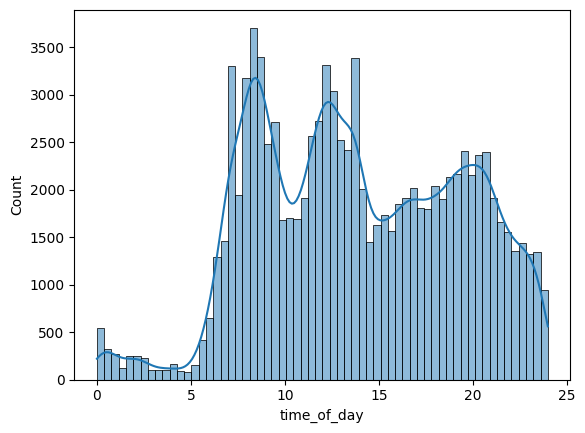

 33%|██████████████████████████▋                                                     | 332/996 [13:45<18:13,  1.65s/it]

50b2b84b


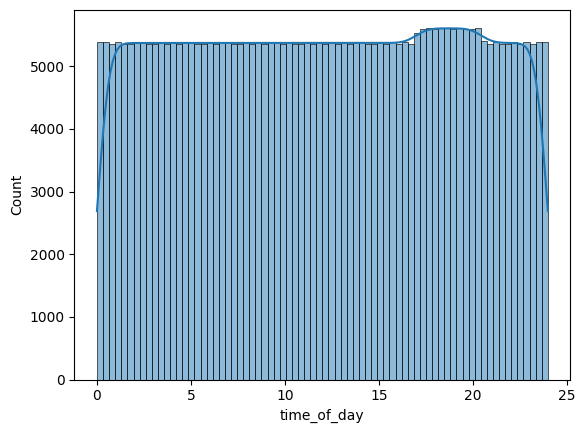

 33%|██████████████████████████▋                                                     | 333/996 [13:49<23:04,  2.09s/it]

5124169c


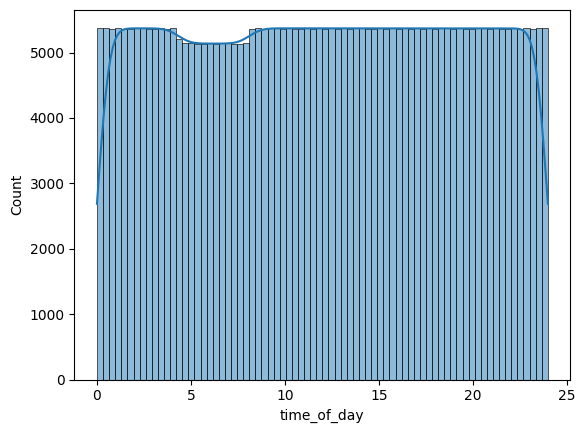

 34%|██████████████████████████▊                                                     | 334/996 [13:52<26:21,  2.39s/it]

5132511c


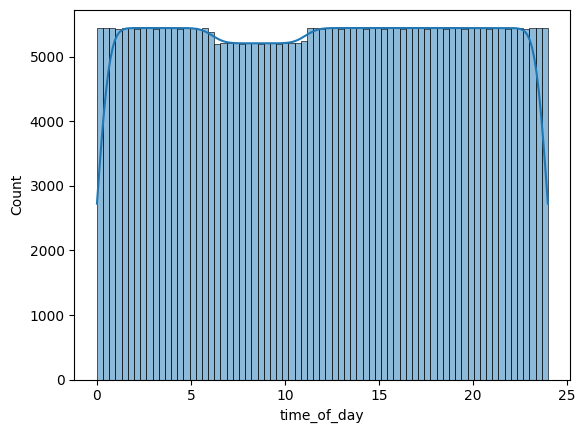

 34%|██████████████████████████▉                                                     | 335/996 [13:55<28:33,  2.59s/it]

51364c23


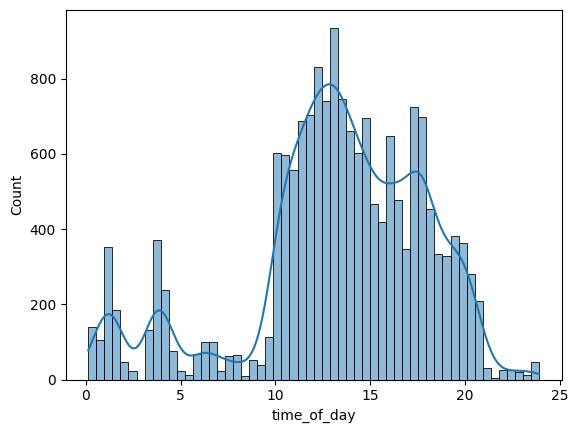

 34%|██████████████████████████▉                                                     | 336/996 [13:55<20:49,  1.89s/it]

51f38b37


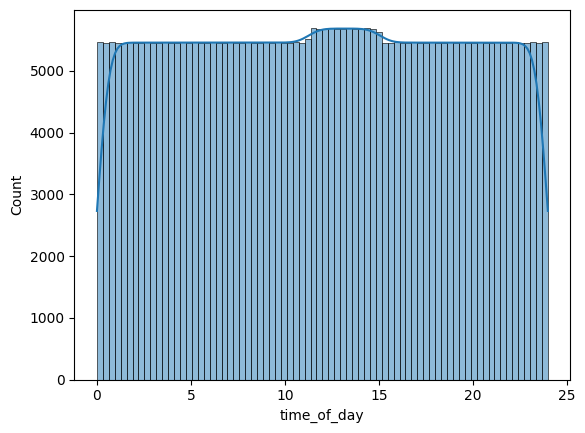

 34%|███████████████████████████                                                     | 337/996 [13:58<25:12,  2.30s/it]

5264bb0e


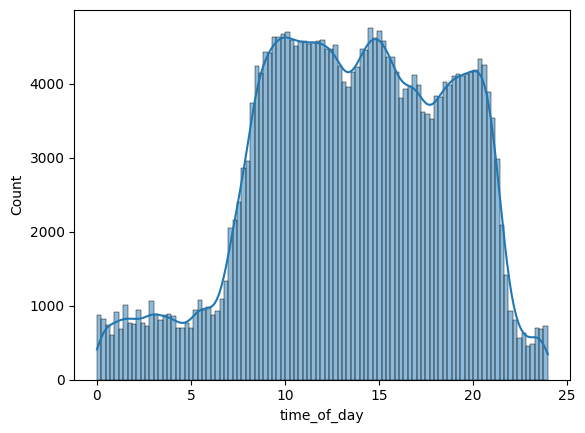

 34%|███████████████████████████▏                                                    | 338/996 [14:00<24:59,  2.28s/it]

526f719b


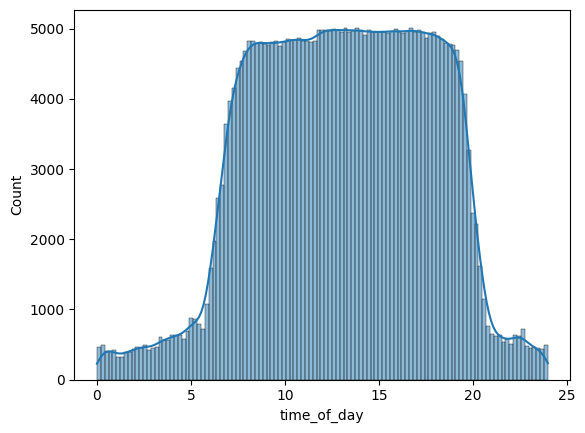

 34%|███████████████████████████▏                                                    | 339/996 [14:03<26:01,  2.38s/it]

52ce9b8b


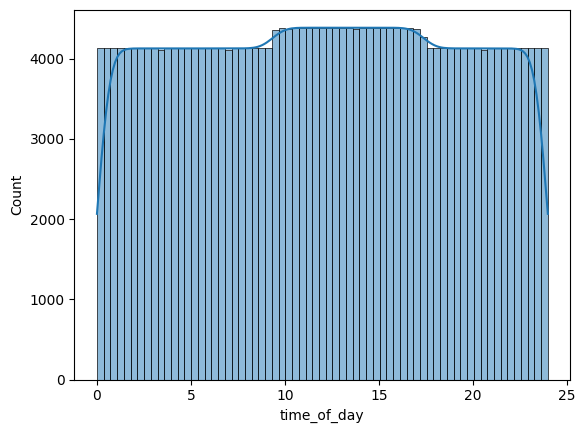

 34%|███████████████████████████▎                                                    | 340/996 [14:05<25:35,  2.34s/it]

52e9e467


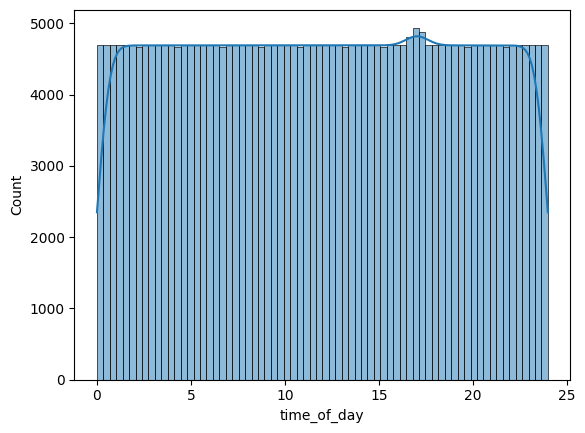

 34%|███████████████████████████▍                                                    | 341/996 [14:08<26:24,  2.42s/it]

537dc410


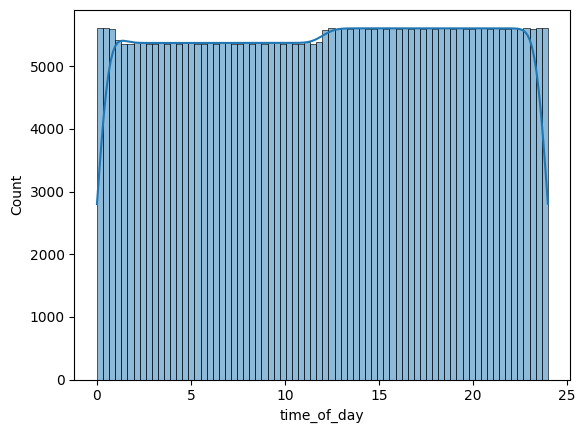

 34%|███████████████████████████▍                                                    | 342/996 [14:11<28:52,  2.65s/it]

53814642


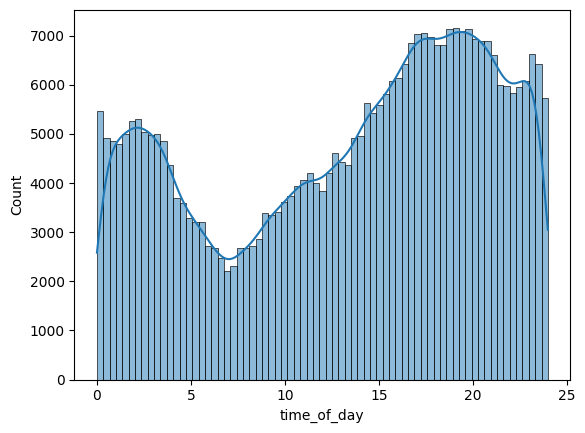

 34%|███████████████████████████▌                                                    | 343/996 [14:14<29:17,  2.69s/it]

53905a2c


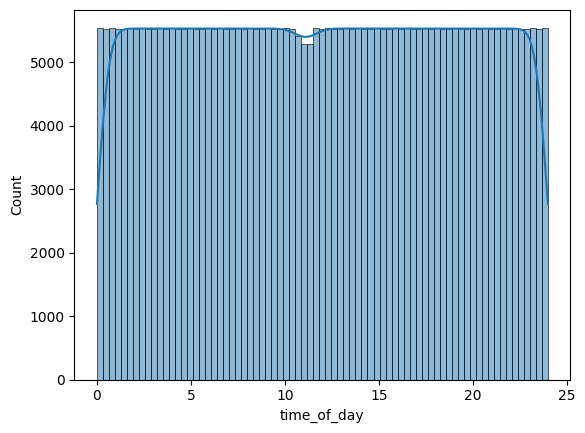

 35%|███████████████████████████▋                                                    | 344/996 [14:17<30:59,  2.85s/it]

54391716


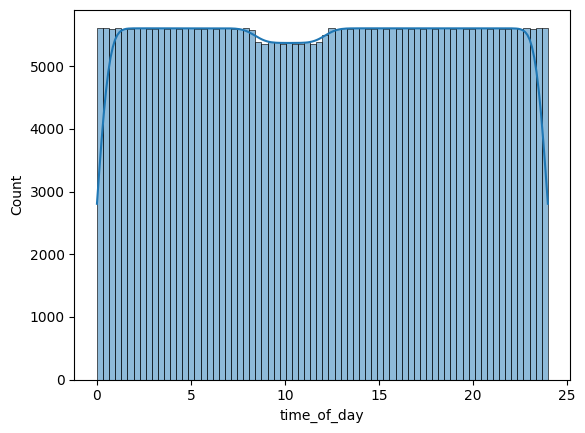

 35%|███████████████████████████▋                                                    | 345/996 [14:20<32:05,  2.96s/it]

54945f30


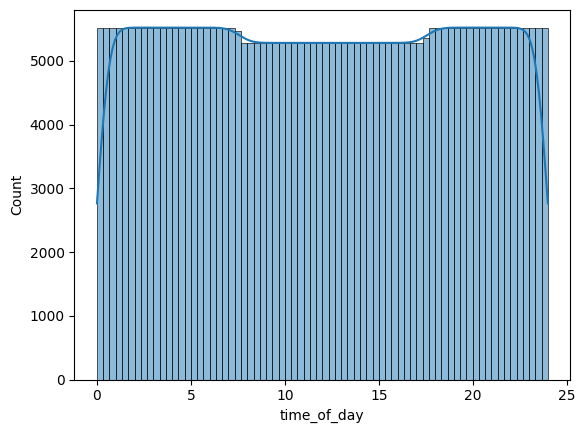

 35%|███████████████████████████▊                                                    | 346/996 [14:23<32:22,  2.99s/it]

54fef303


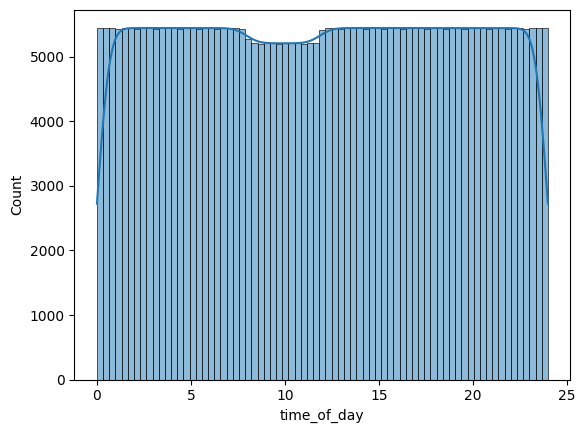

 35%|███████████████████████████▊                                                    | 347/996 [14:27<32:38,  3.02s/it]

554e46e9


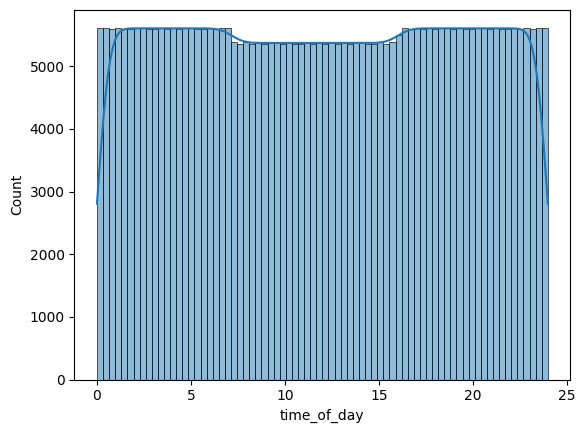

 35%|███████████████████████████▉                                                    | 348/996 [14:30<33:15,  3.08s/it]

55f9338e


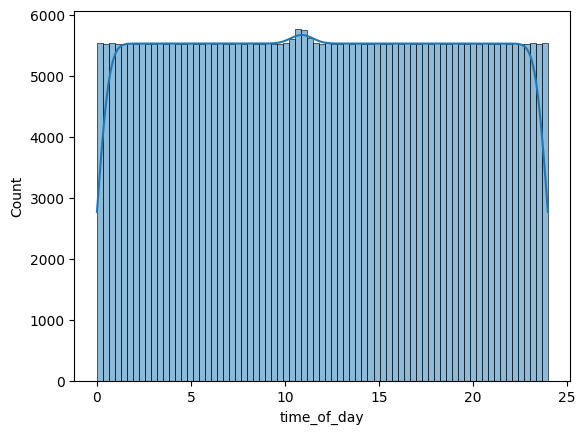

 35%|████████████████████████████                                                    | 349/996 [14:33<34:32,  3.20s/it]

563ebc00


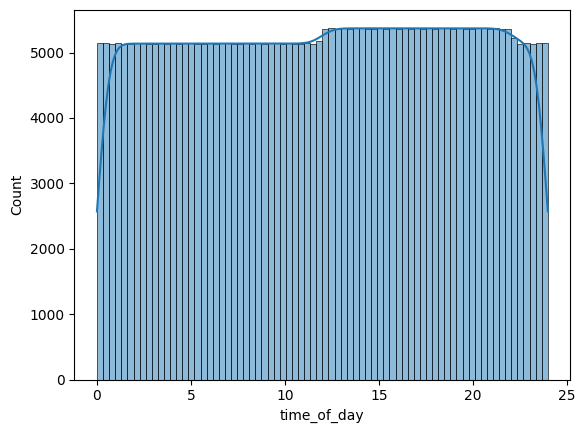

 35%|████████████████████████████                                                    | 350/996 [14:36<34:01,  3.16s/it]

56cb7161


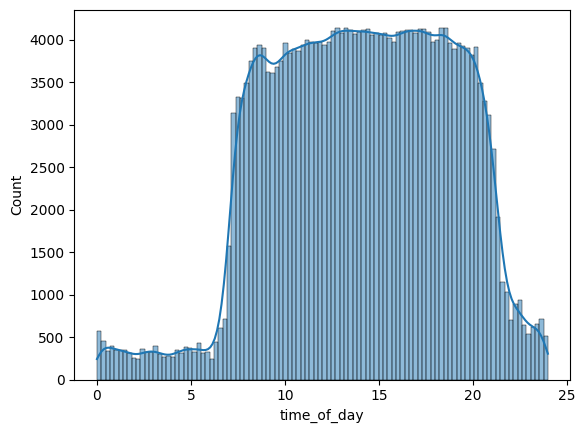

 35%|████████████████████████████▏                                                   | 351/996 [14:38<30:22,  2.83s/it]

56d9dead


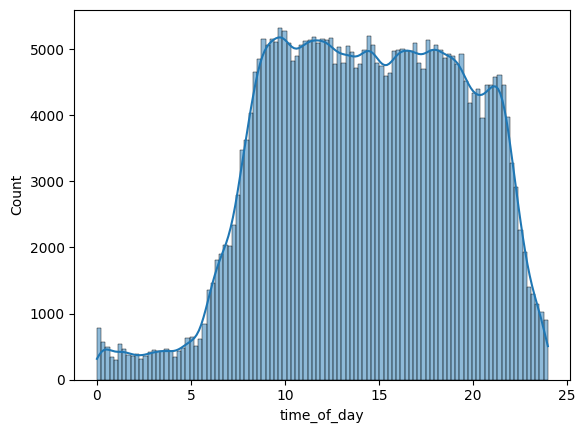

 35%|████████████████████████████▎                                                   | 352/996 [14:41<29:43,  2.77s/it]

56ef356c


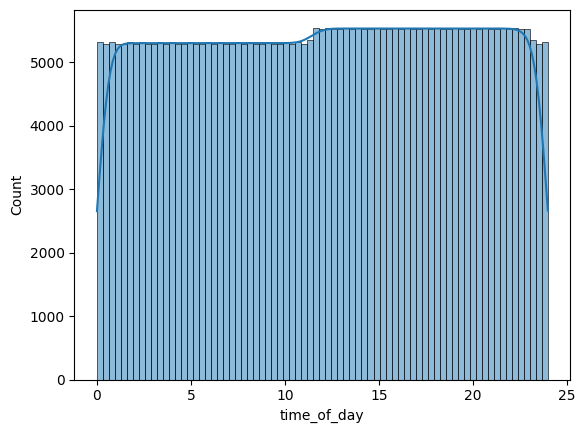

 35%|████████████████████████████▎                                                   | 353/996 [14:44<30:55,  2.89s/it]

5779f2e9


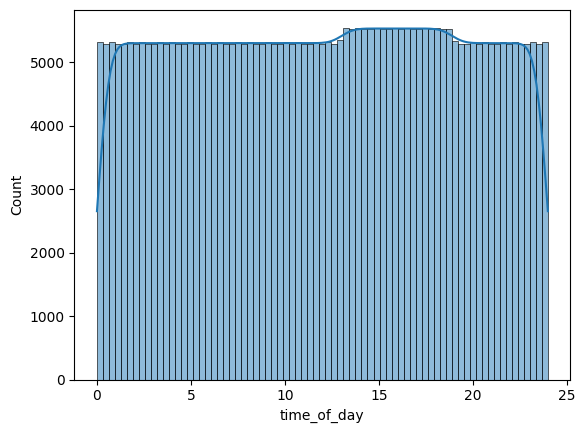

 36%|████████████████████████████▍                                                   | 354/996 [14:47<31:45,  2.97s/it]

579e50bd


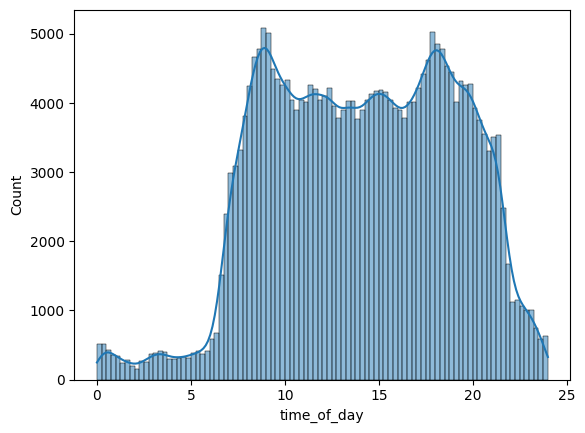

 36%|████████████████████████████▌                                                   | 355/996 [14:49<28:45,  2.69s/it]

57c4f2b4


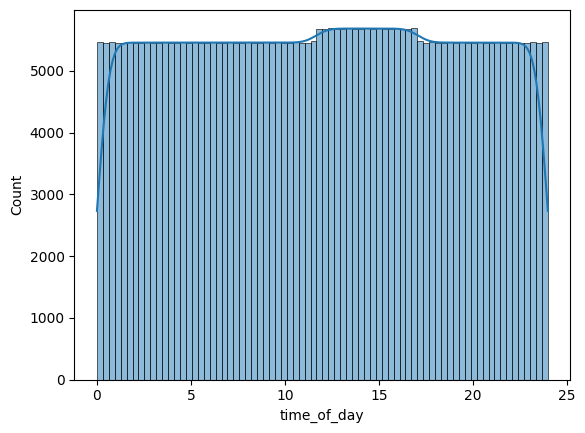

 36%|████████████████████████████▌                                                   | 356/996 [14:53<30:31,  2.86s/it]

57de6095


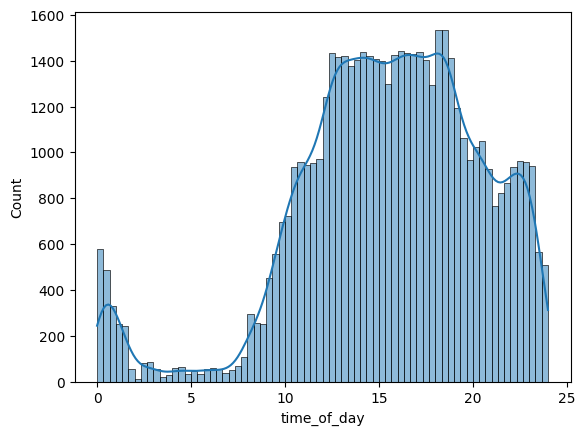

 36%|████████████████████████████▋                                                   | 357/996 [14:53<23:02,  2.16s/it]

57f6fa6c


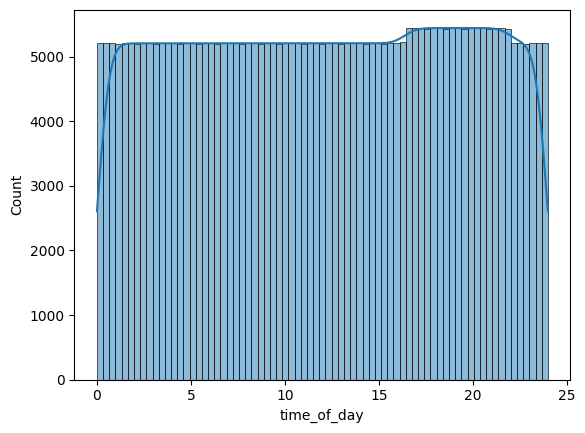

 36%|████████████████████████████▊                                                   | 358/996 [14:56<25:39,  2.41s/it]

58391429


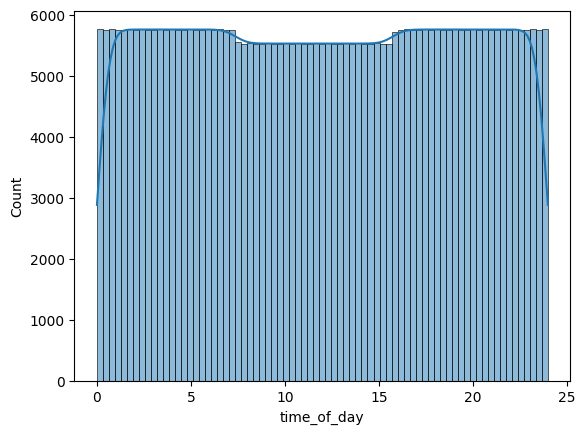

 36%|████████████████████████████▊                                                   | 359/996 [14:59<28:32,  2.69s/it]

58ada72e


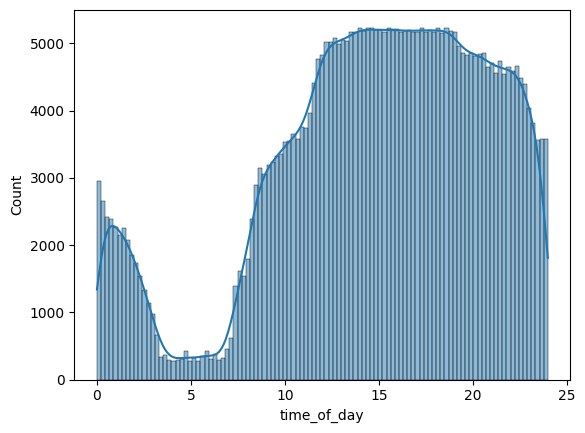

 36%|████████████████████████████▉                                                   | 360/996 [15:02<28:52,  2.72s/it]

58dfccdb


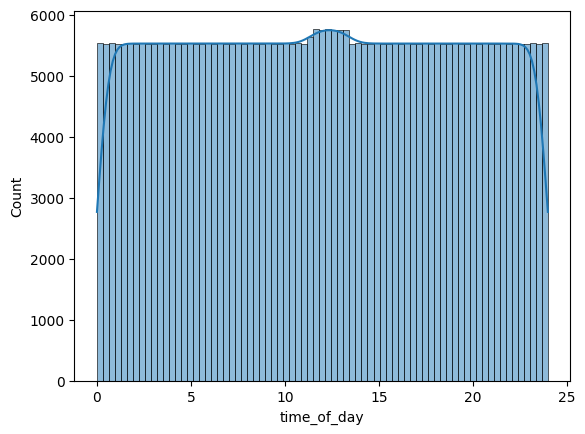

 36%|████████████████████████████▉                                                   | 361/996 [15:06<30:29,  2.88s/it]

5985f299


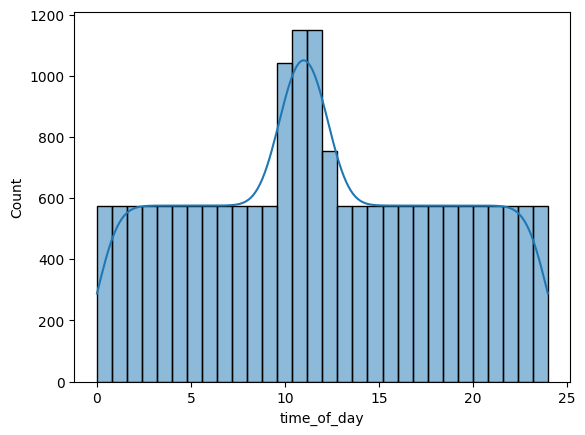

 36%|█████████████████████████████                                                   | 362/996 [15:06<22:06,  2.09s/it]

5a313293


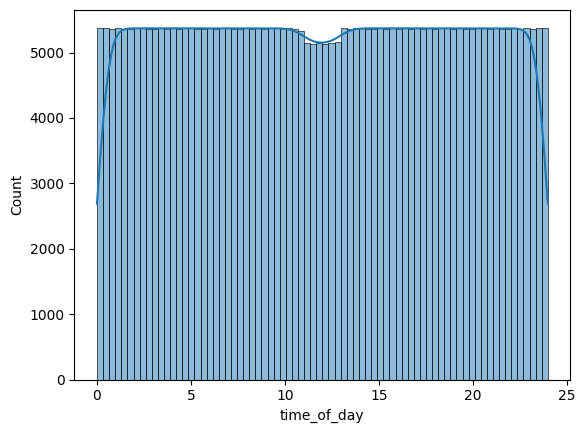

 36%|█████████████████████████████▏                                                  | 363/996 [15:09<25:15,  2.39s/it]

5af79adb


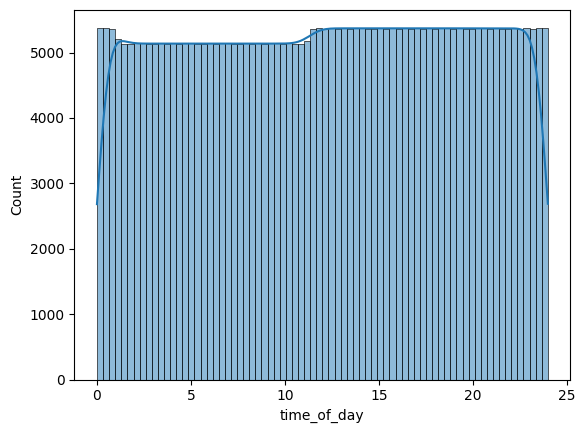

 37%|█████████████████████████████▏                                                  | 364/996 [15:12<27:23,  2.60s/it]

5b2c9b83


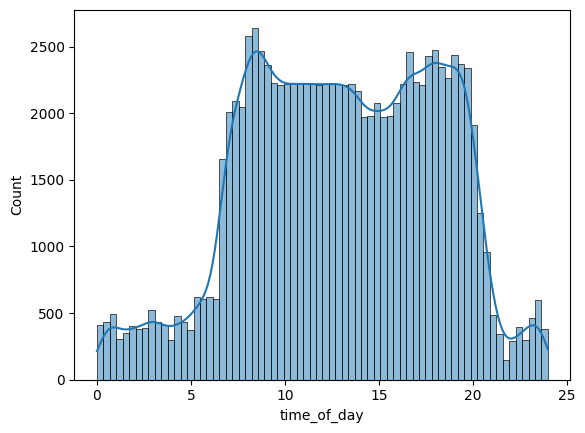

 37%|█████████████████████████████▎                                                  | 365/996 [15:13<21:58,  2.09s/it]

5b66b6f2


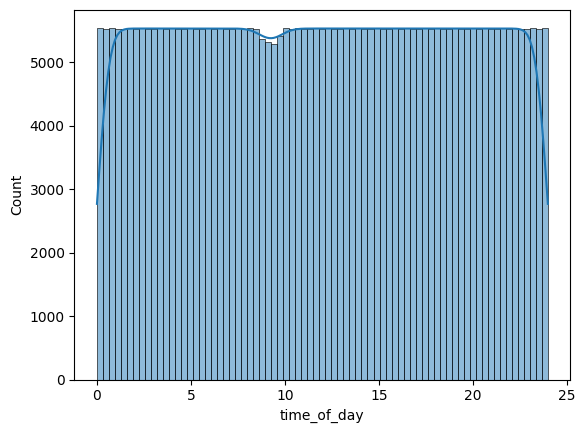

 37%|█████████████████████████████▍                                                  | 366/996 [15:16<25:27,  2.43s/it]

5b9ff85e


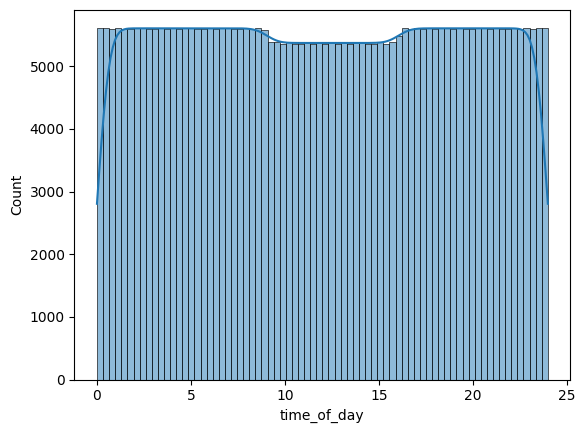

 37%|█████████████████████████████▍                                                  | 367/996 [15:19<27:52,  2.66s/it]

5c186496


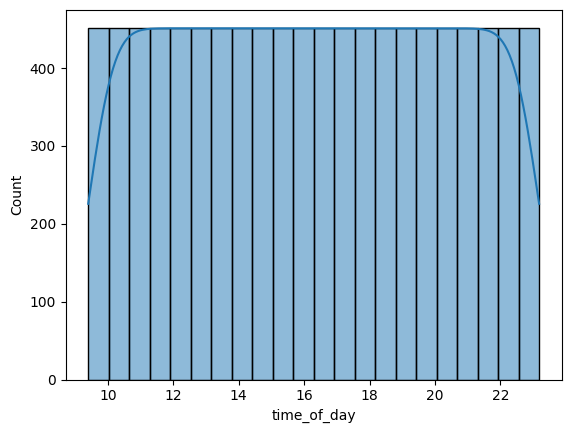

 37%|█████████████████████████████▌                                                  | 368/996 [15:19<20:00,  1.91s/it]

5c22f241


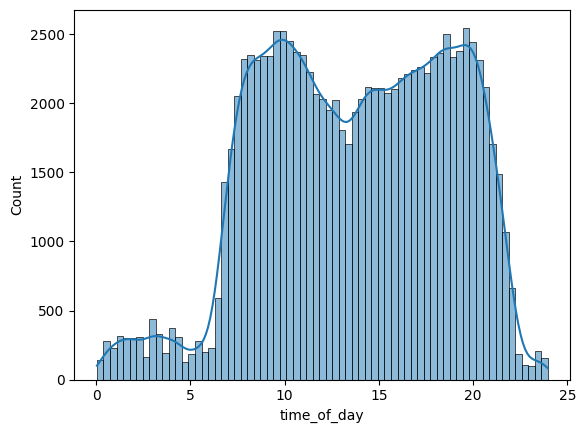

 37%|█████████████████████████████▋                                                  | 369/996 [15:20<16:41,  1.60s/it]

5c2c136d


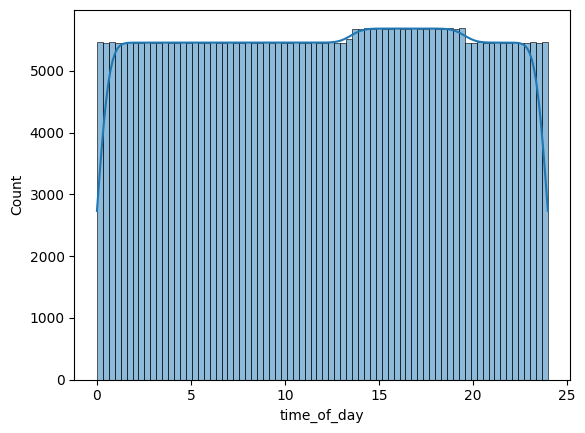

 37%|█████████████████████████████▋                                                  | 370/996 [15:24<21:49,  2.09s/it]

5cd83147


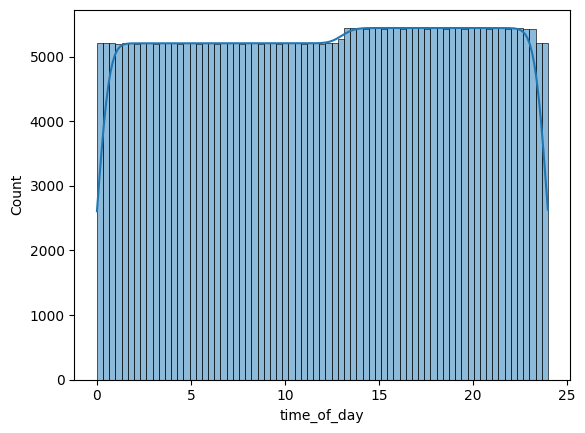

 37%|█████████████████████████████▊                                                  | 371/996 [15:27<24:43,  2.37s/it]

5d3b6ea5


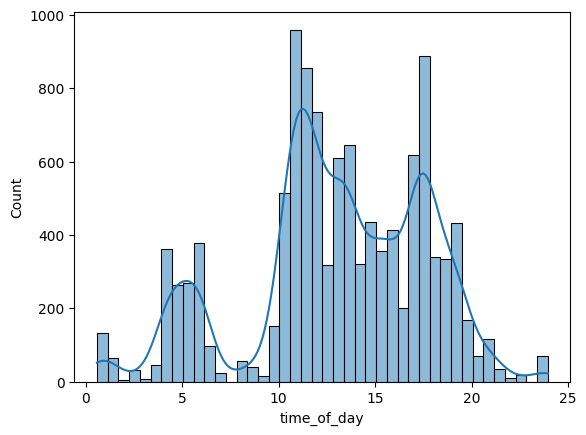

 37%|█████████████████████████████▉                                                  | 372/996 [15:27<17:52,  1.72s/it]

5d762840


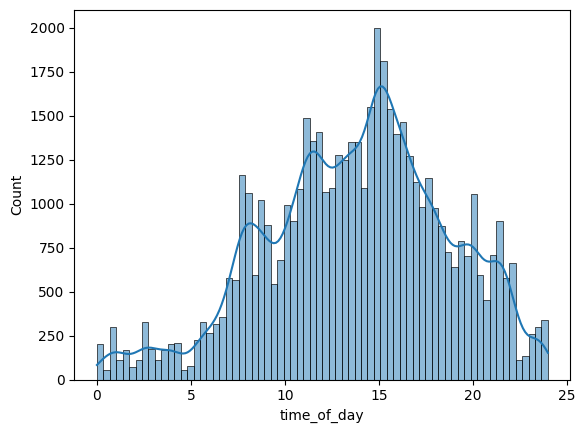

 37%|█████████████████████████████▉                                                  | 373/996 [15:27<14:04,  1.36s/it]

5d885b20


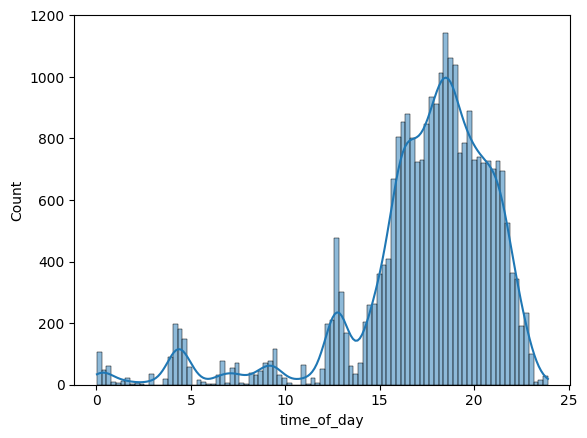

 38%|██████████████████████████████                                                  | 374/996 [15:28<11:41,  1.13s/it]

5ddbac80


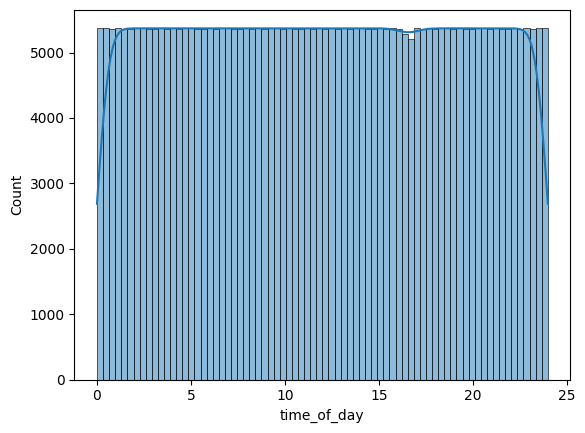

 38%|██████████████████████████████                                                  | 375/996 [15:31<17:49,  1.72s/it]

5e359a08


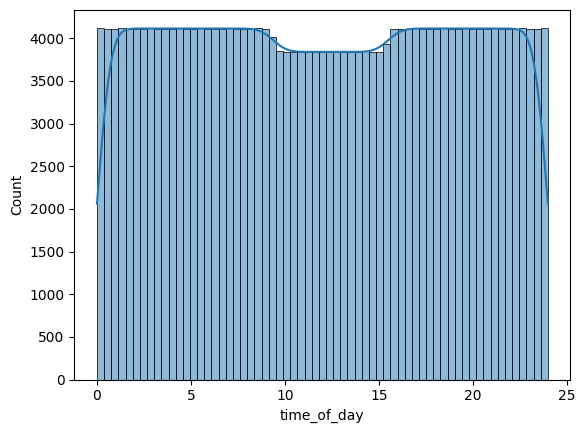

 38%|██████████████████████████████▏                                                 | 376/996 [15:33<18:55,  1.83s/it]

5e55e9fd


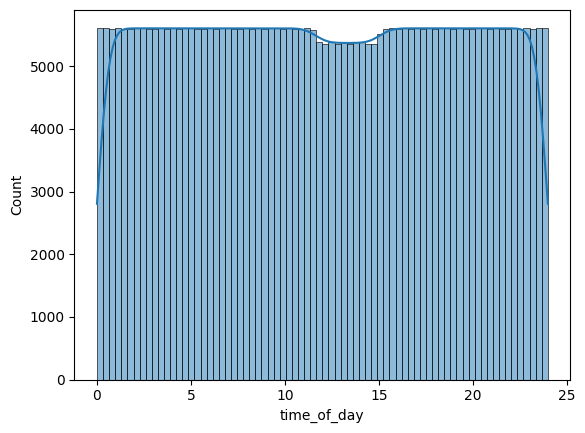

 38%|██████████████████████████████▎                                                 | 377/996 [15:36<23:16,  2.26s/it]

5e57bd12


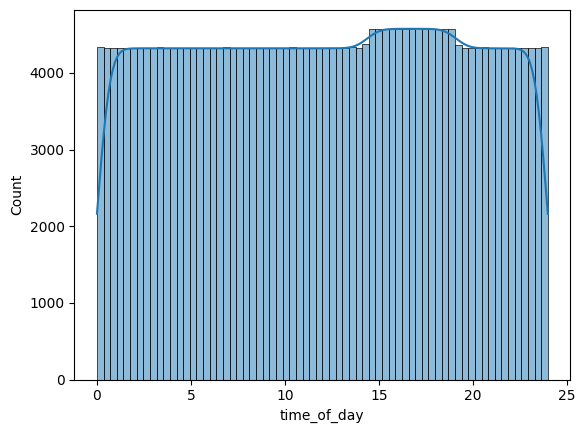

 38%|██████████████████████████████▎                                                 | 378/996 [15:39<23:35,  2.29s/it]

5ea2c305


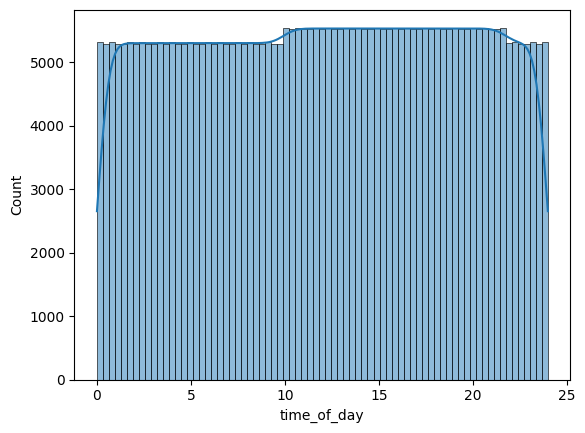

 38%|██████████████████████████████▍                                                 | 379/996 [15:42<26:14,  2.55s/it]

5ed5f205


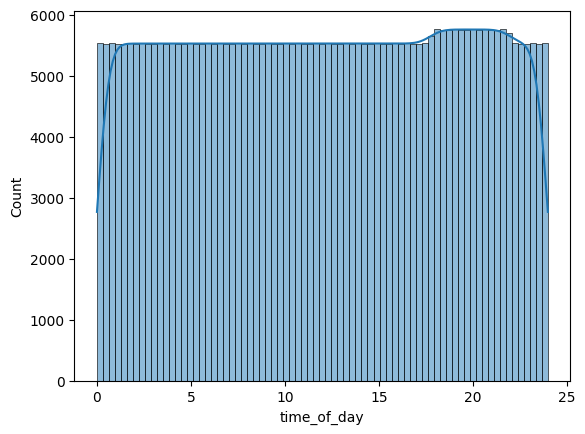

 38%|██████████████████████████████▌                                                 | 380/996 [15:45<28:23,  2.76s/it]

5ee595e8


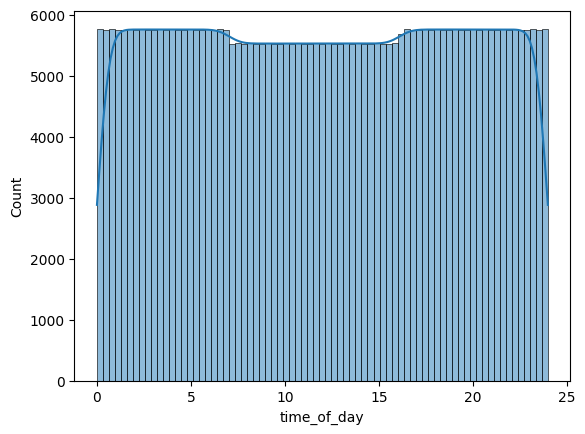

 38%|██████████████████████████████▌                                                 | 381/996 [15:48<30:00,  2.93s/it]

5ef3d64e


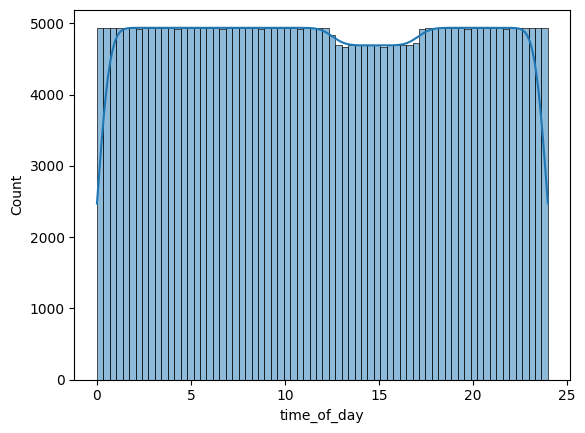

 38%|██████████████████████████████▋                                                 | 382/996 [15:51<29:16,  2.86s/it]

5f099188


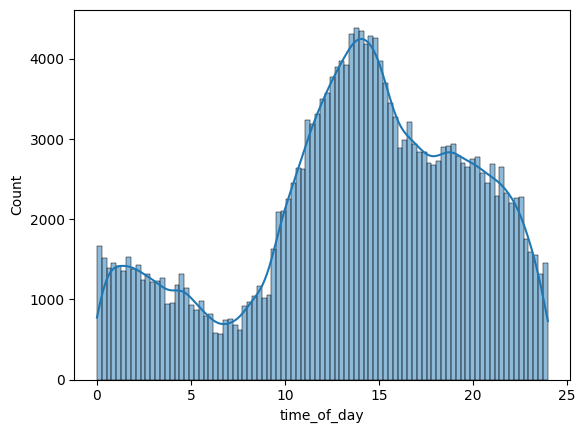

 38%|██████████████████████████████▊                                                 | 383/996 [15:53<25:35,  2.50s/it]

5f1b07e1


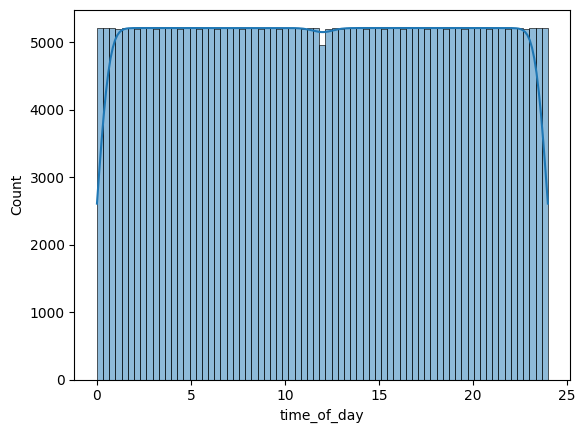

 39%|██████████████████████████████▊                                                 | 384/996 [15:56<26:59,  2.65s/it]

5f37ceb1


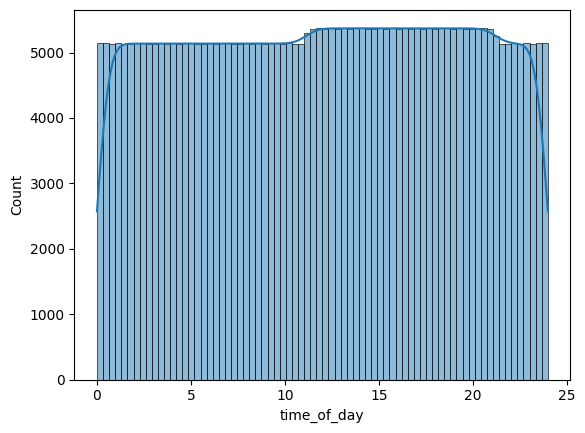

 39%|██████████████████████████████▉                                                 | 385/996 [15:59<28:08,  2.76s/it]

5f574f3d


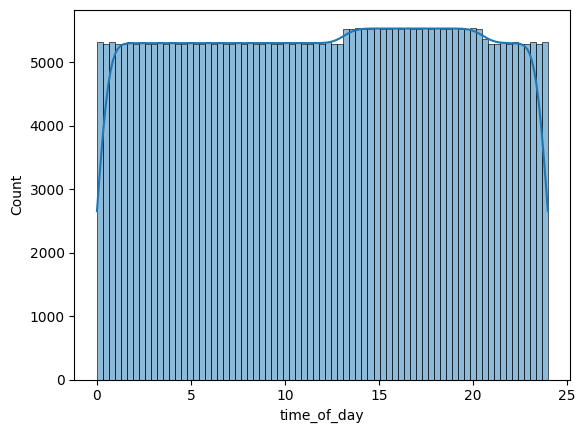

 39%|███████████████████████████████                                                 | 386/996 [16:02<29:16,  2.88s/it]

5f7537cf


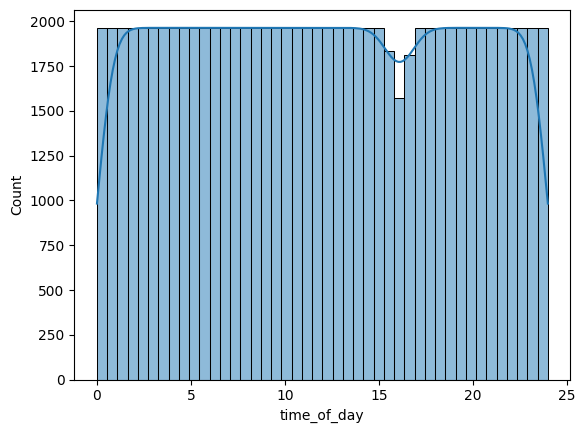

 39%|███████████████████████████████                                                 | 387/996 [16:03<22:45,  2.24s/it]

5f78f7b9


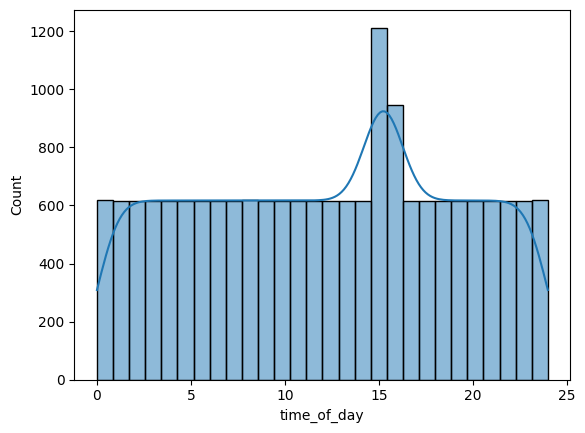

 39%|███████████████████████████████▏                                                | 388/996 [16:03<16:37,  1.64s/it]

5f9dddb4


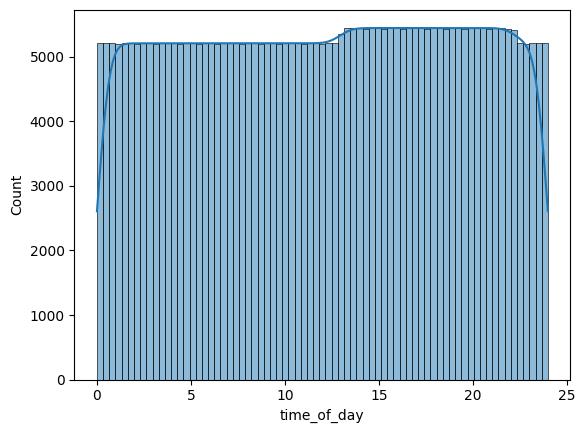

 39%|███████████████████████████████▏                                                | 389/996 [16:06<20:47,  2.05s/it]

60c1ff37


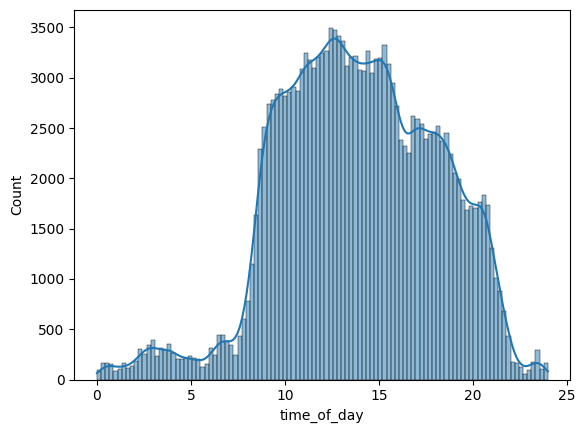

 39%|███████████████████████████████▎                                                | 390/996 [16:07<18:43,  1.85s/it]

613fc399


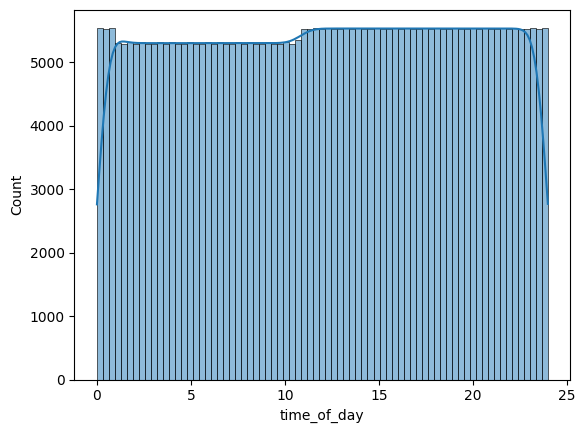

 39%|███████████████████████████████▍                                                | 391/996 [16:11<22:50,  2.26s/it]

6187d0dc


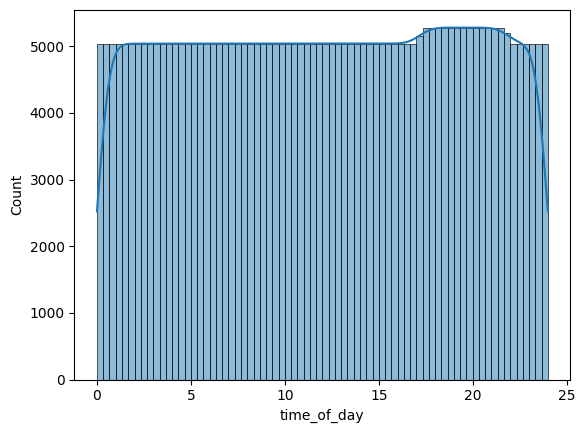

 39%|███████████████████████████████▍                                                | 392/996 [16:13<24:45,  2.46s/it]

6197a2ce


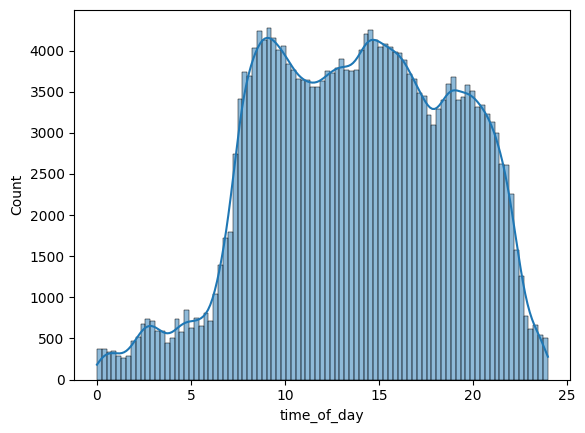

 39%|███████████████████████████████▌                                                | 393/996 [16:15<22:56,  2.28s/it]

621066ff


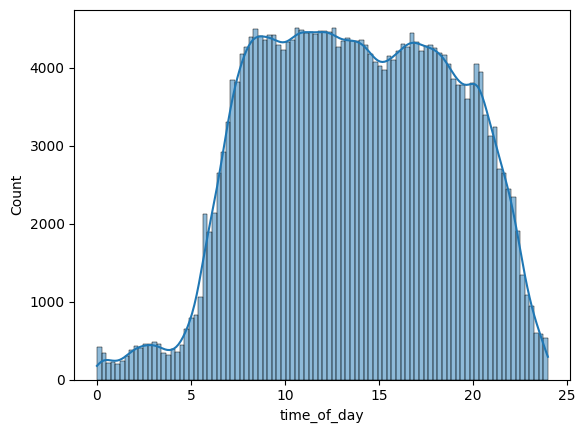

 40%|███████████████████████████████▋                                                | 394/996 [16:18<22:41,  2.26s/it]

6247cc15


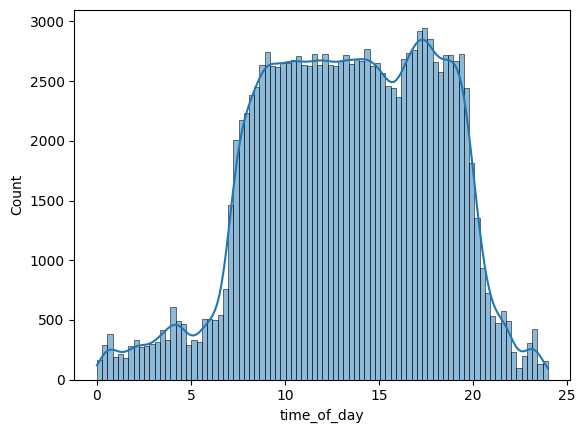

 40%|███████████████████████████████▋                                                | 395/996 [16:19<19:21,  1.93s/it]

6282e693


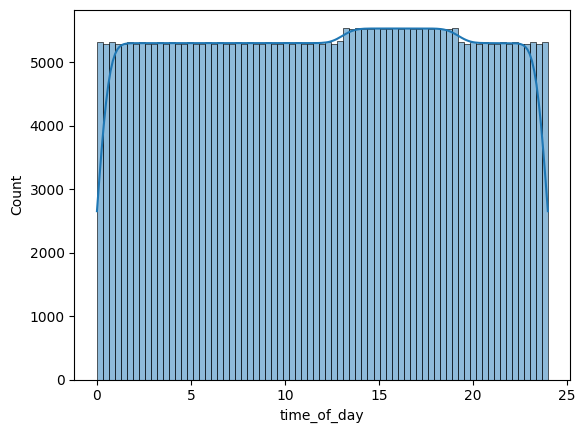

 40%|███████████████████████████████▊                                                | 396/996 [16:22<23:04,  2.31s/it]

62b873a2


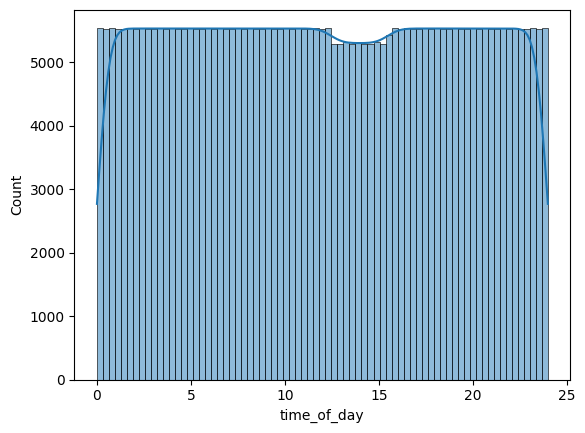

 40%|███████████████████████████████▉                                                | 397/996 [16:25<25:52,  2.59s/it]

62cd5c74


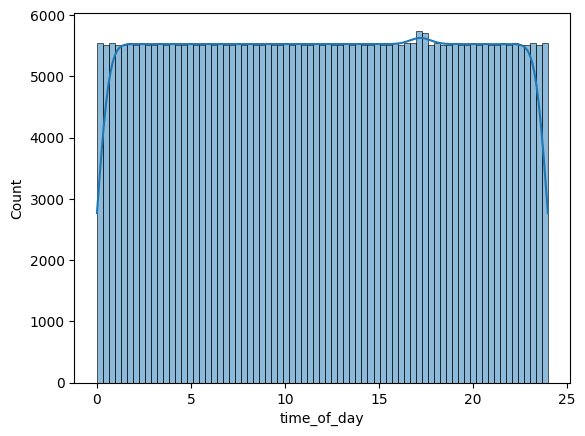

 40%|███████████████████████████████▉                                                | 398/996 [16:28<27:51,  2.79s/it]

63d4ab9a


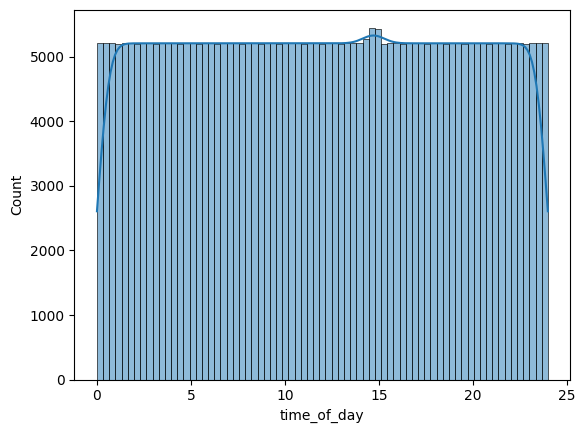

 40%|████████████████████████████████                                                | 399/996 [16:31<28:23,  2.85s/it]

63fc9770


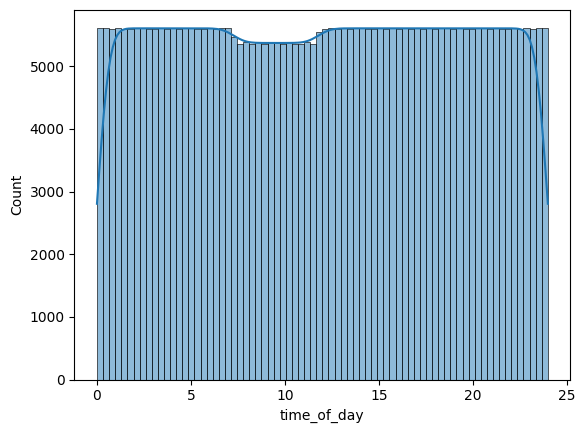

 40%|████████████████████████████████▏                                               | 400/996 [16:35<30:07,  3.03s/it]

641697e6


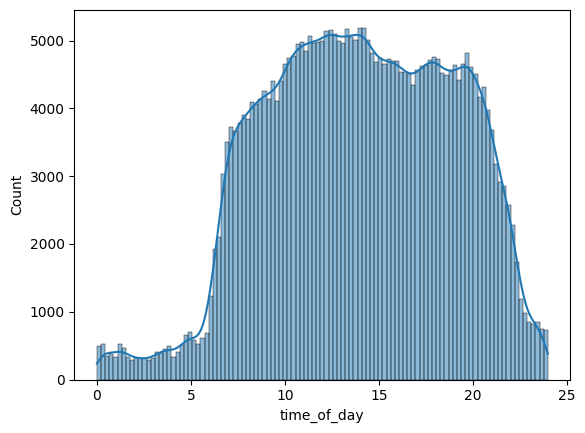

 40%|████████████████████████████████▏                                               | 401/996 [16:38<28:53,  2.91s/it]

649ff6d9


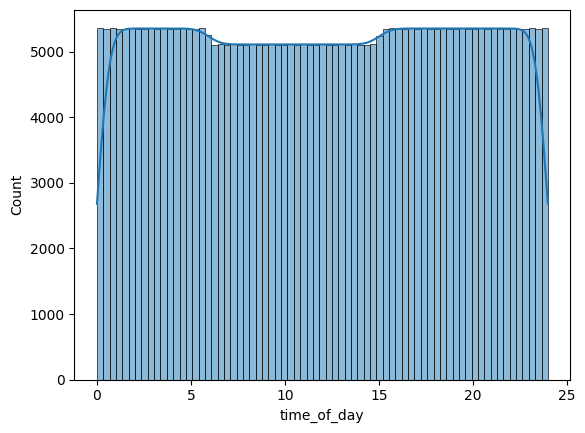

 40%|████████████████████████████████▎                                               | 402/996 [16:40<29:01,  2.93s/it]

64b4005d


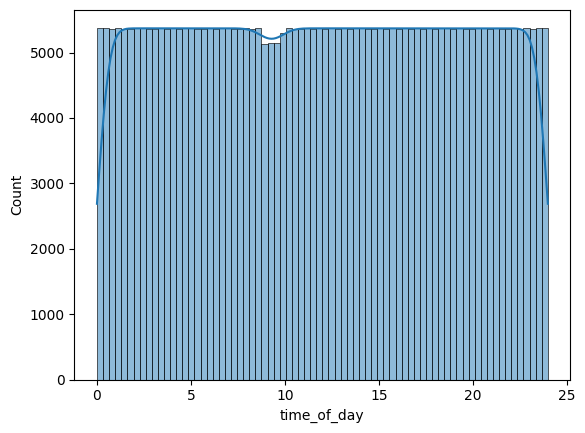

 40%|████████████████████████████████▎                                               | 403/996 [16:44<29:34,  2.99s/it]

64ed48c4


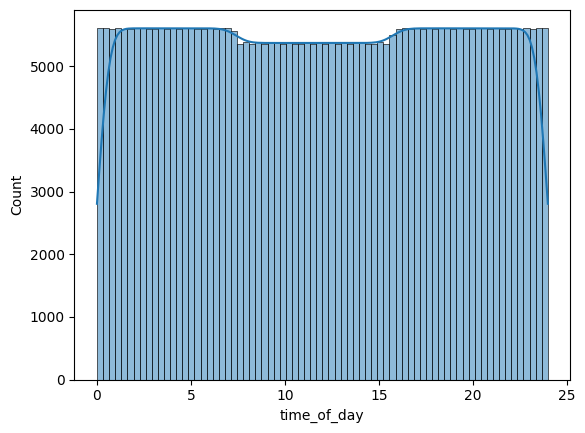

 41%|████████████████████████████████▍                                               | 404/996 [16:47<30:12,  3.06s/it]

658e66ec


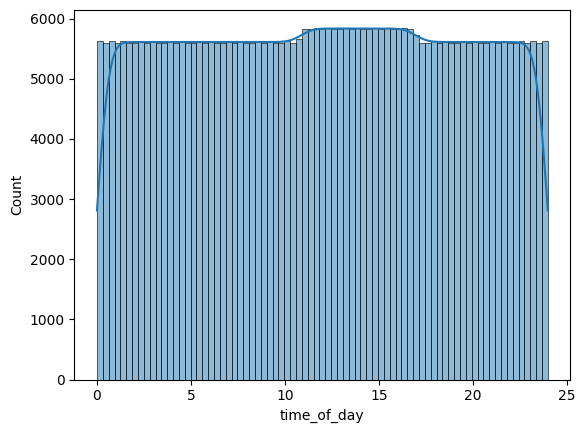

 41%|████████████████████████████████▌                                               | 405/996 [16:50<31:11,  3.17s/it]

6595d479


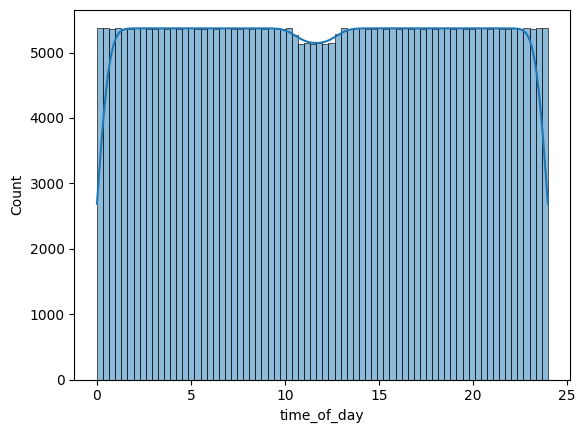

 41%|████████████████████████████████▌                                               | 406/996 [16:53<30:58,  3.15s/it]

659fec57


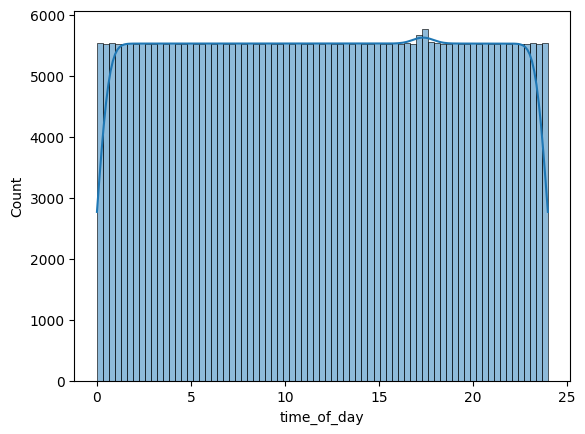

 41%|████████████████████████████████▋                                               | 407/996 [16:57<31:09,  3.17s/it]

65fe69c0


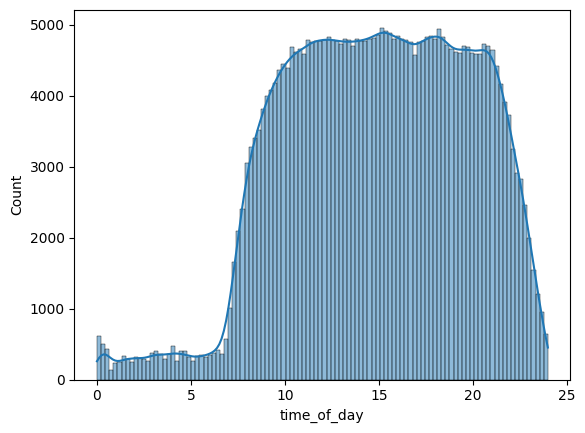

 41%|████████████████████████████████▊                                               | 408/996 [16:59<29:03,  2.97s/it]

6699c999


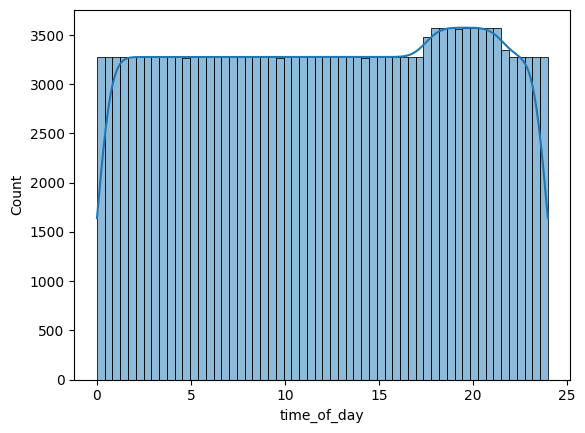

 41%|████████████████████████████████▊                                               | 409/996 [17:01<24:59,  2.55s/it]

66f619e3


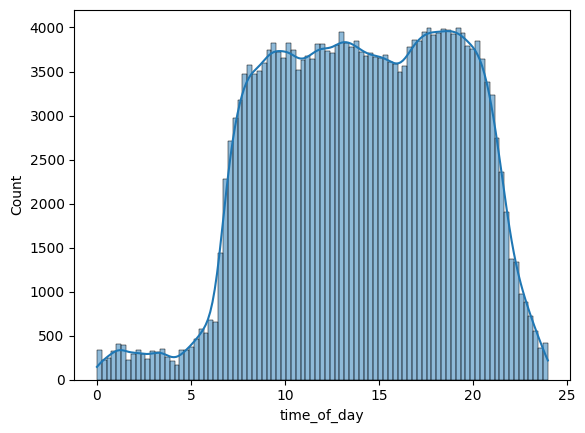

 41%|████████████████████████████████▉                                               | 410/996 [17:02<22:47,  2.33s/it]

677038b5


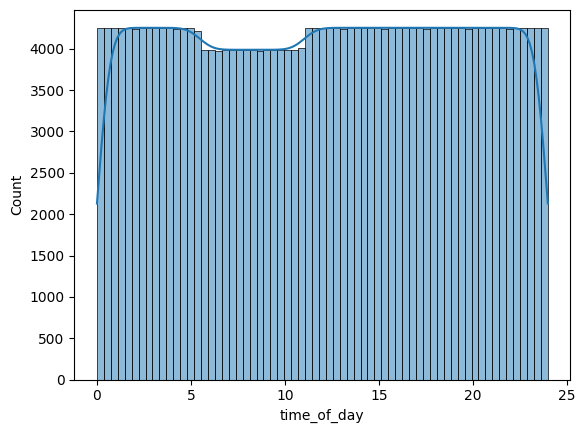

 41%|█████████████████████████████████                                               | 411/996 [17:05<22:23,  2.30s/it]

6774ba64


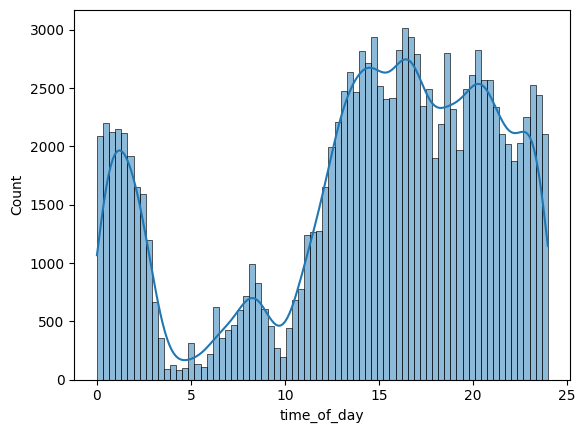

 41%|█████████████████████████████████                                               | 412/996 [17:06<18:40,  1.92s/it]

678598dd


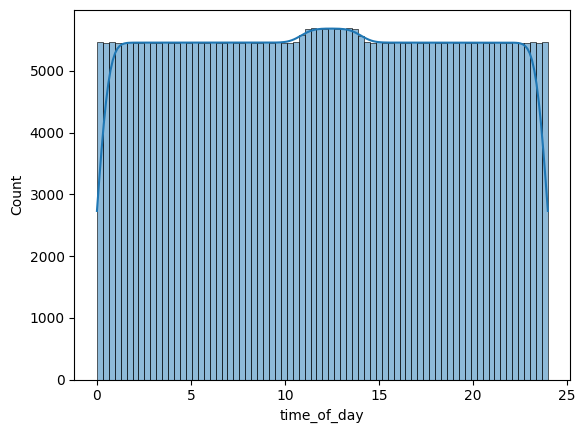

 41%|█████████████████████████████████▏                                              | 413/996 [17:09<22:32,  2.32s/it]

6795027a


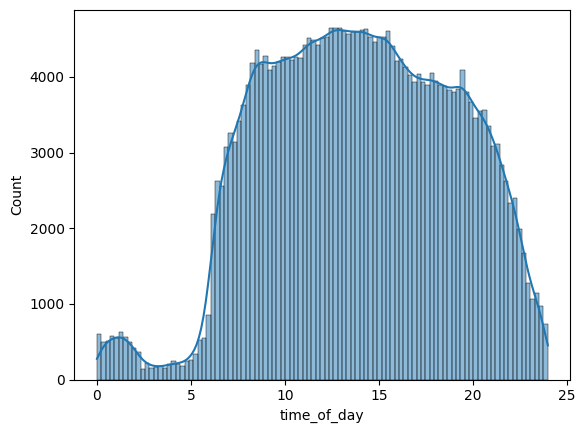

 42%|█████████████████████████████████▎                                              | 414/996 [17:11<22:20,  2.30s/it]

6826f0be


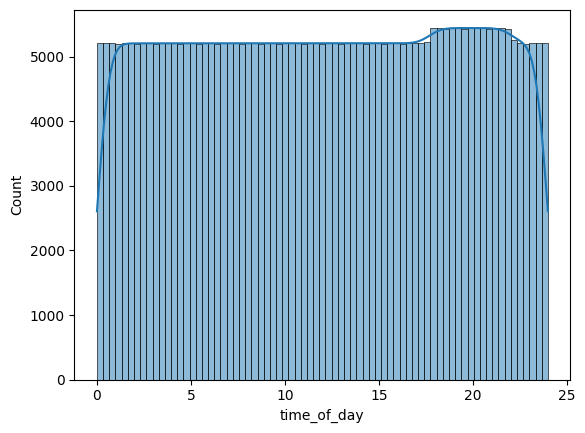

 42%|█████████████████████████████████▎                                              | 415/996 [17:14<24:25,  2.52s/it]

685cc0f1


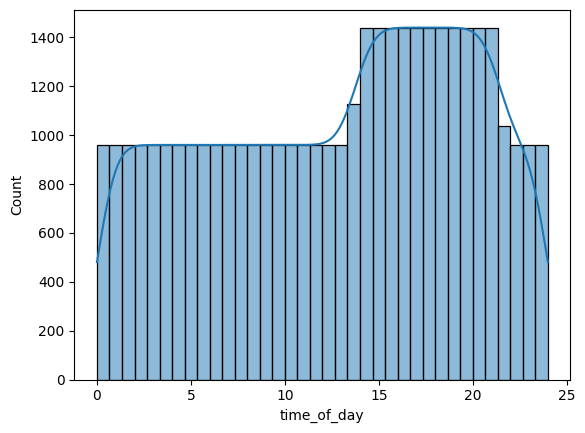

 42%|█████████████████████████████████▍                                              | 416/996 [17:15<18:14,  1.89s/it]

687c85e7


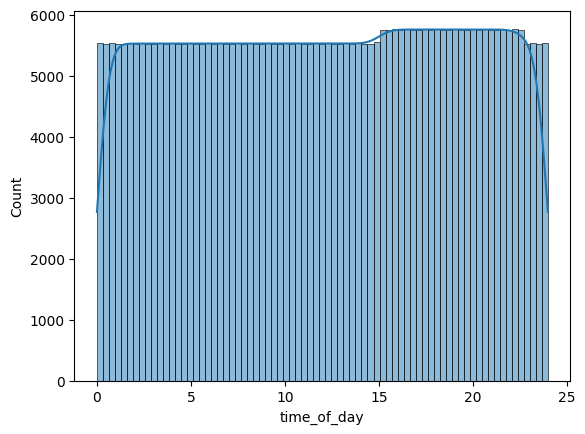

 42%|█████████████████████████████████▍                                              | 417/996 [17:18<22:12,  2.30s/it]

68be3d5c


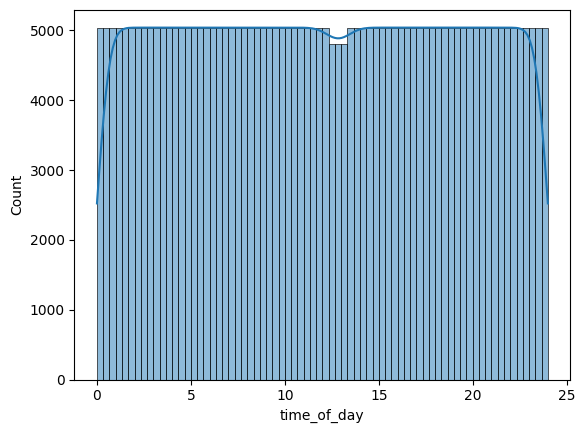

 42%|█████████████████████████████████▌                                              | 418/996 [17:21<23:47,  2.47s/it]

68fa4631


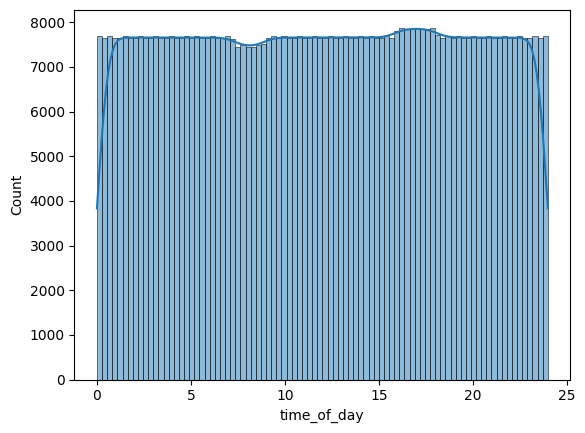

 42%|█████████████████████████████████▋                                              | 419/996 [17:26<31:15,  3.25s/it]

697c41d7


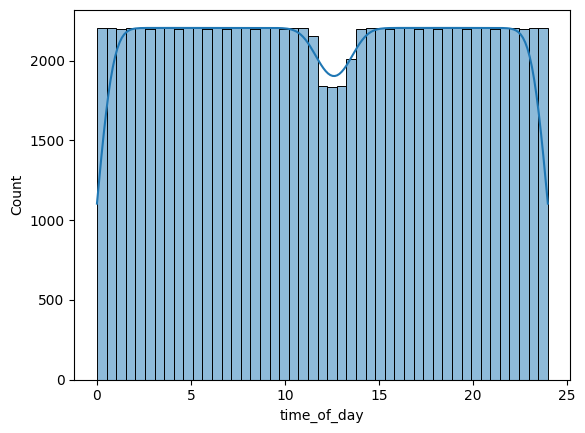

 42%|█████████████████████████████████▋                                              | 420/996 [17:27<24:22,  2.54s/it]

69b65679


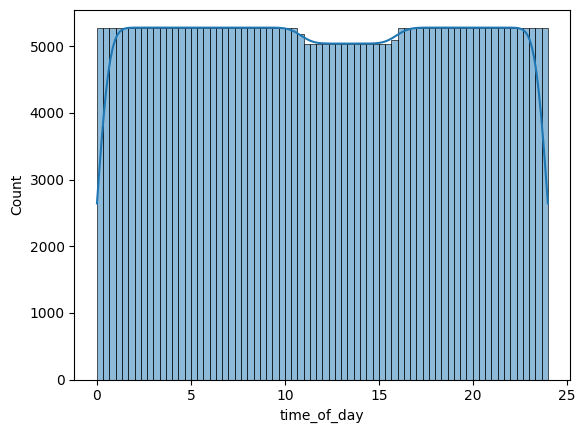

 42%|█████████████████████████████████▊                                              | 421/996 [17:30<25:33,  2.67s/it]

6a16089d


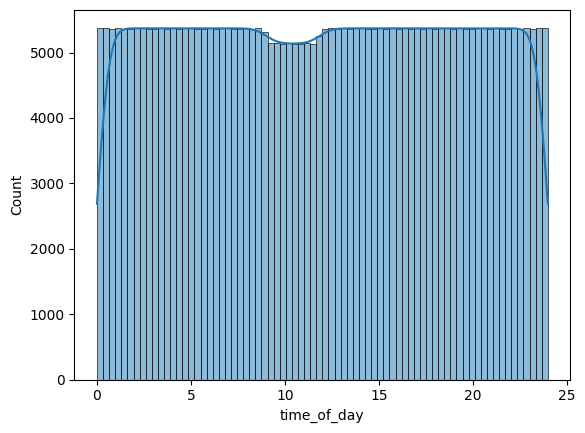

 42%|█████████████████████████████████▉                                              | 422/996 [17:33<26:46,  2.80s/it]

6a2fd807


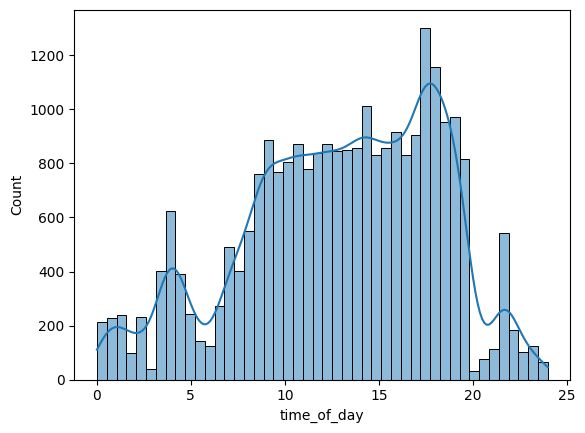

 42%|█████████████████████████████████▉                                              | 423/996 [17:33<19:34,  2.05s/it]

6a4df6ff


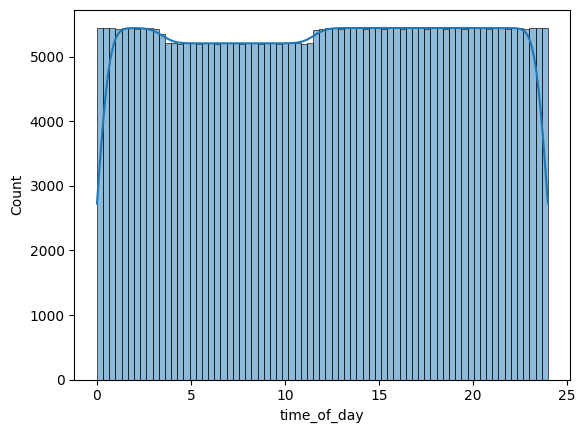

 43%|██████████████████████████████████                                              | 424/996 [17:36<22:31,  2.36s/it]

6a864b11


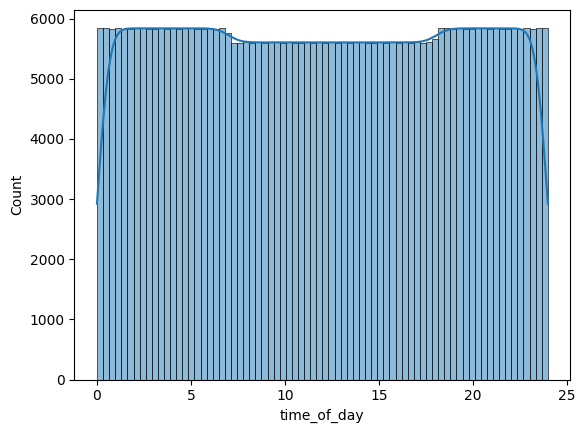

 43%|██████████████████████████████████▏                                             | 425/996 [17:40<25:54,  2.72s/it]

6abd21d4


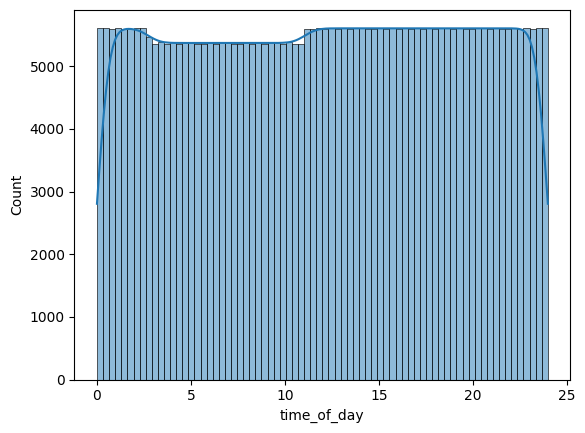

 43%|██████████████████████████████████▏                                             | 426/996 [17:43<27:18,  2.87s/it]

6ac5763a


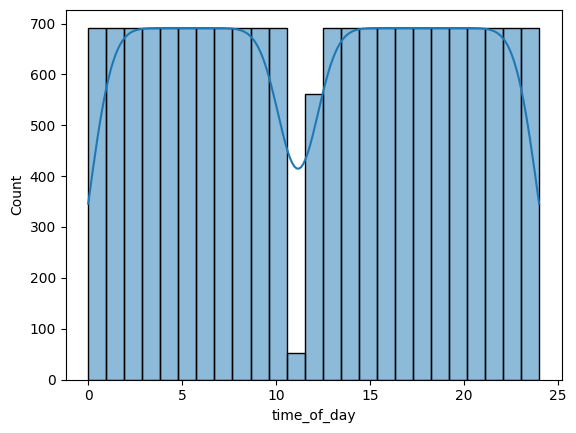

 43%|██████████████████████████████████▎                                             | 427/996 [17:43<19:45,  2.08s/it]

6ac5eaaf


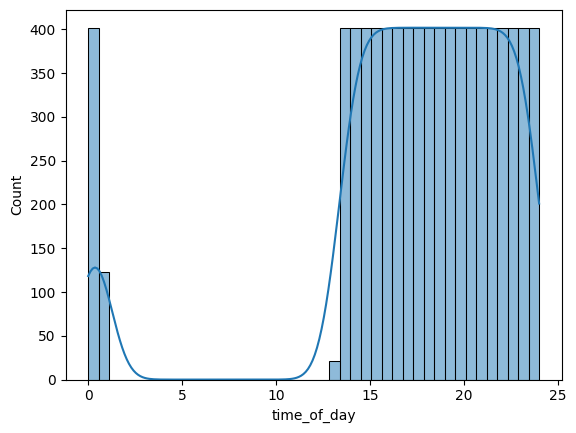

 43%|██████████████████████████████████▍                                             | 428/996 [17:43<14:17,  1.51s/it]

6b6467f4


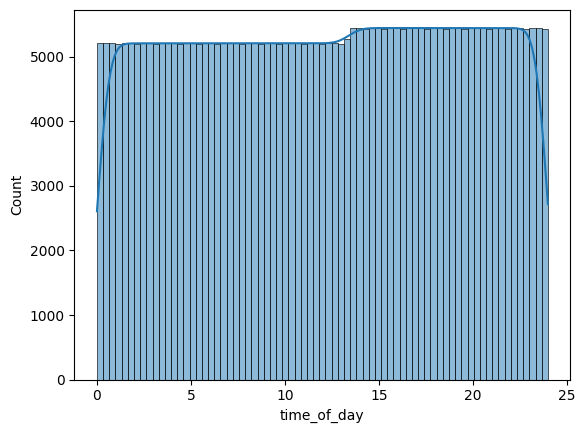

 43%|██████████████████████████████████▍                                             | 429/996 [17:46<18:36,  1.97s/it]

6b773506


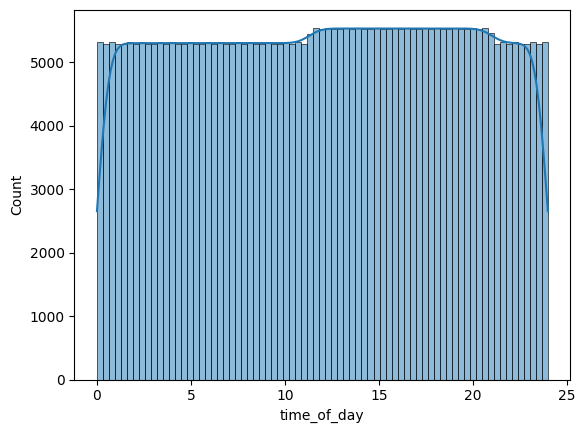

 43%|██████████████████████████████████▌                                             | 430/996 [17:50<21:56,  2.33s/it]

6c0fe935


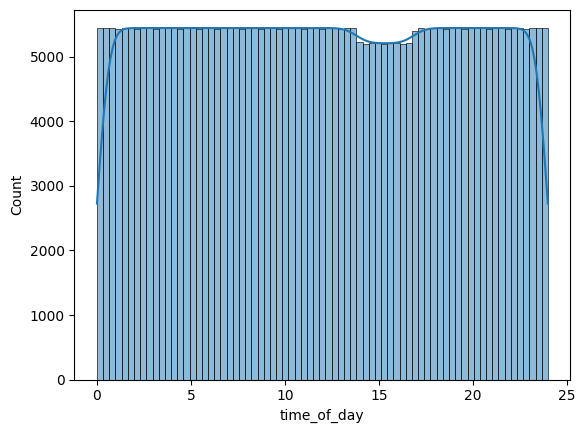

 43%|██████████████████████████████████▌                                             | 431/996 [17:53<24:04,  2.56s/it]

6c2edc91


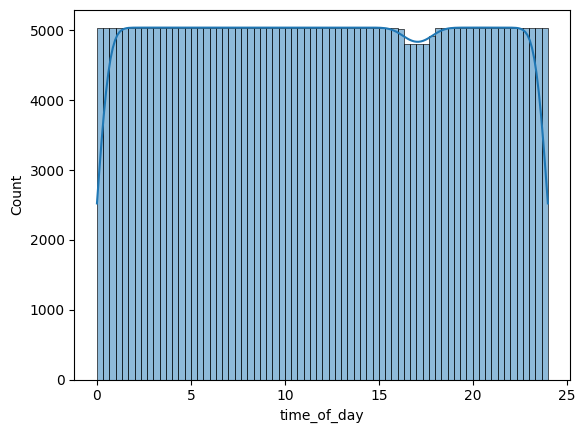

 43%|██████████████████████████████████▋                                             | 432/996 [17:56<24:54,  2.65s/it]

6c6cd633


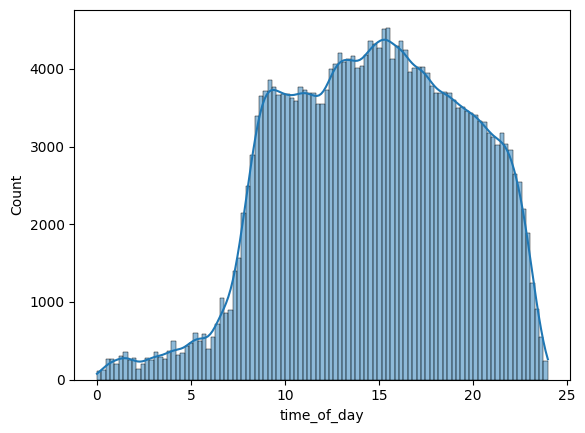

 43%|██████████████████████████████████▊                                             | 433/996 [17:58<23:00,  2.45s/it]

6c737069


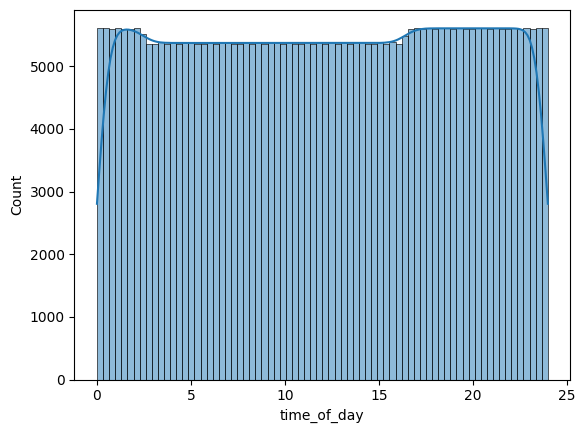

 44%|██████████████████████████████████▊                                             | 434/996 [18:01<24:58,  2.67s/it]

6d5944a9


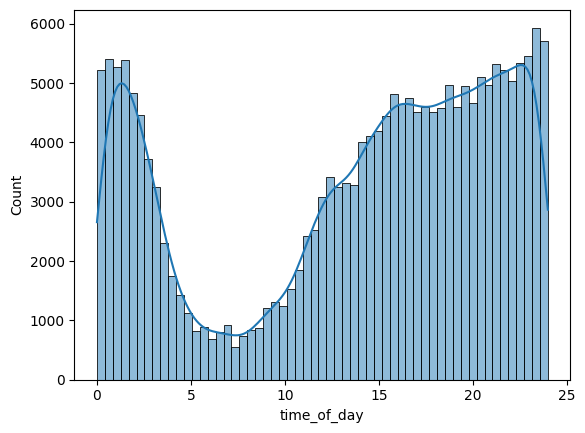

 44%|██████████████████████████████████▉                                             | 435/996 [18:02<21:59,  2.35s/it]

6d707ac3


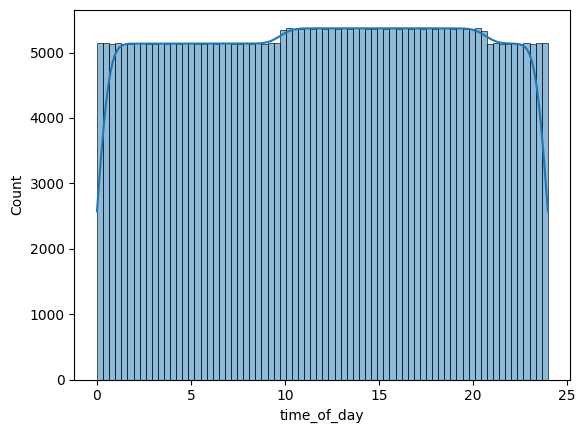

 44%|███████████████████████████████████                                             | 436/996 [18:05<23:54,  2.56s/it]

6dfe4a75


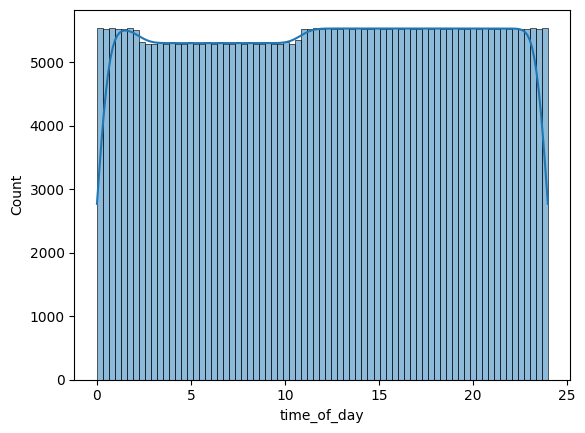

 44%|███████████████████████████████████                                             | 437/996 [18:09<25:37,  2.75s/it]

6e128c6b


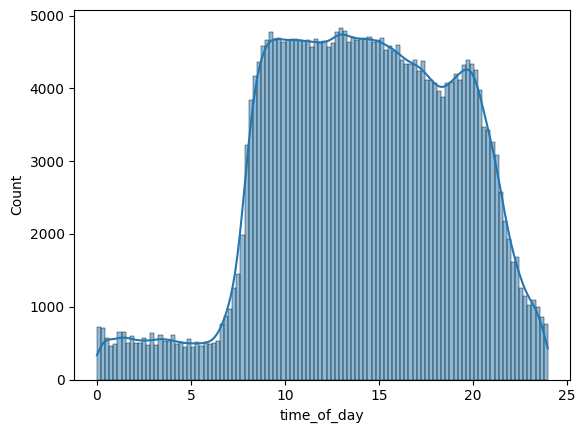

 44%|███████████████████████████████████▏                                            | 438/996 [18:11<24:32,  2.64s/it]

6e1d28b6


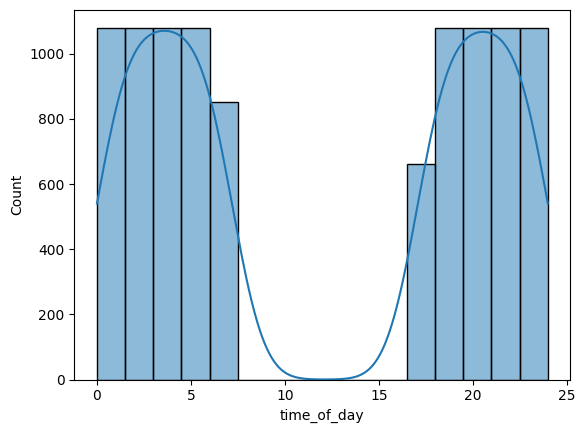

 44%|███████████████████████████████████▎                                            | 439/996 [18:11<17:38,  1.90s/it]

6e85a624


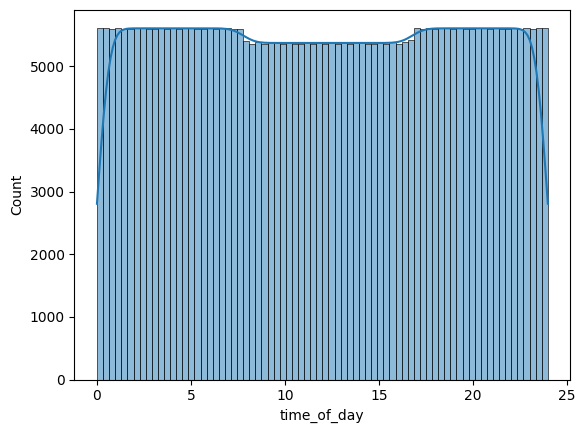

 44%|███████████████████████████████████▎                                            | 440/996 [18:14<21:09,  2.28s/it]

6e9beaee


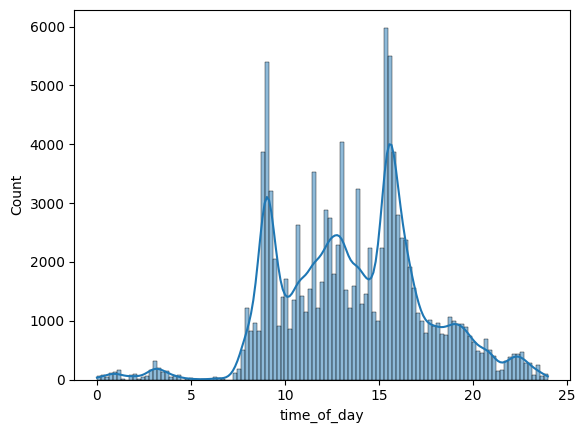

 44%|███████████████████████████████████▍                                            | 441/996 [18:15<17:32,  1.90s/it]

6ebfdc95


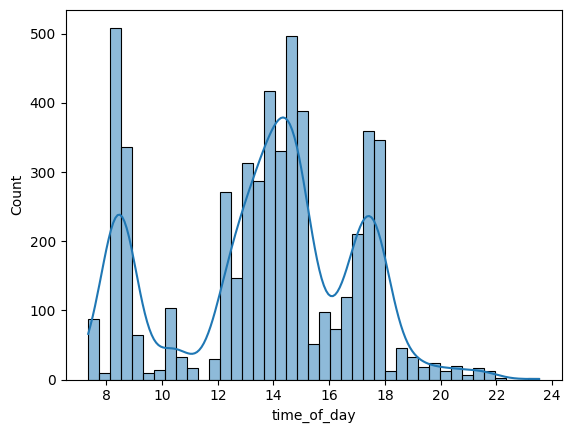

 44%|███████████████████████████████████▌                                            | 442/996 [18:15<12:39,  1.37s/it]

6f49c8d0


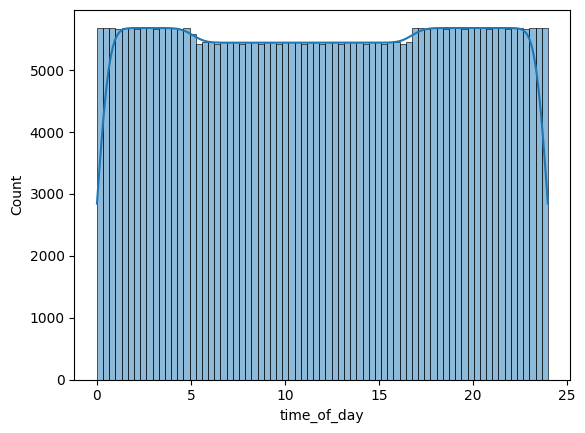

 44%|███████████████████████████████████▌                                            | 443/996 [18:19<17:38,  1.91s/it]

6f5677b7


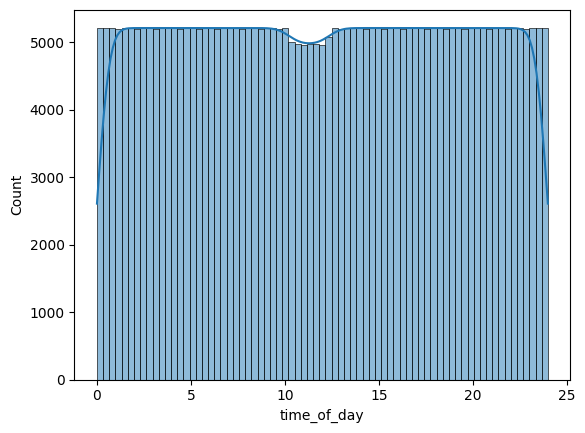

 45%|███████████████████████████████████▋                                            | 444/996 [18:22<20:33,  2.23s/it]

6fb28c2a


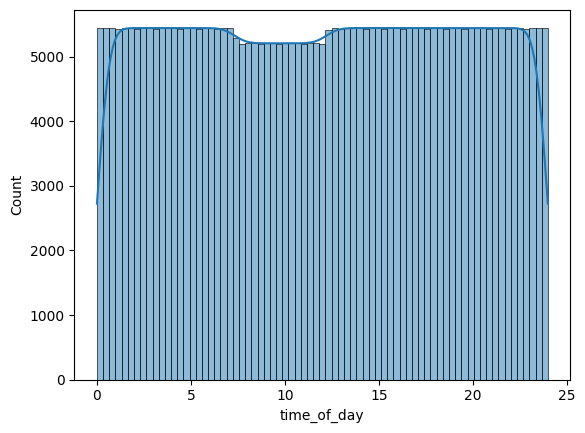

 45%|███████████████████████████████████▋                                            | 445/996 [18:25<22:51,  2.49s/it]

6fcdcb2a


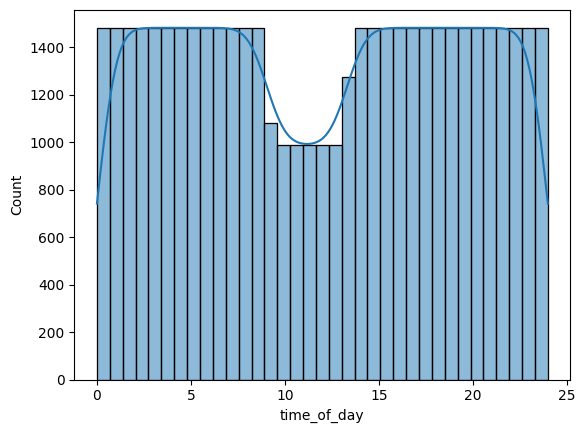

 45%|███████████████████████████████████▊                                            | 446/996 [18:25<17:16,  1.88s/it]

7015528d


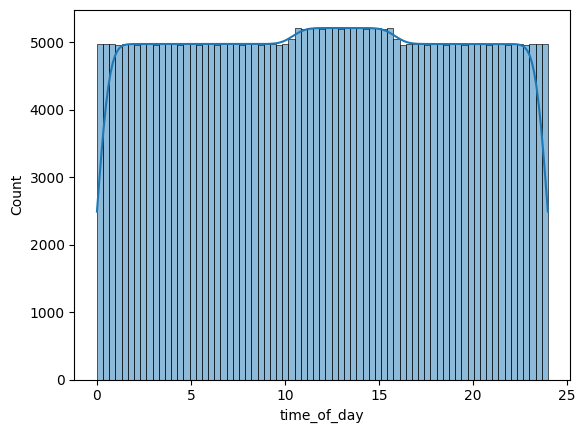

 45%|███████████████████████████████████▉                                            | 447/996 [18:28<20:00,  2.19s/it]

709457f3


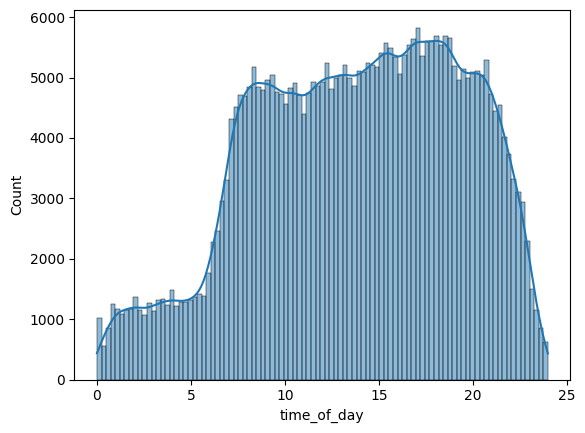

 45%|███████████████████████████████████▉                                            | 448/996 [18:31<21:43,  2.38s/it]

70de1c63


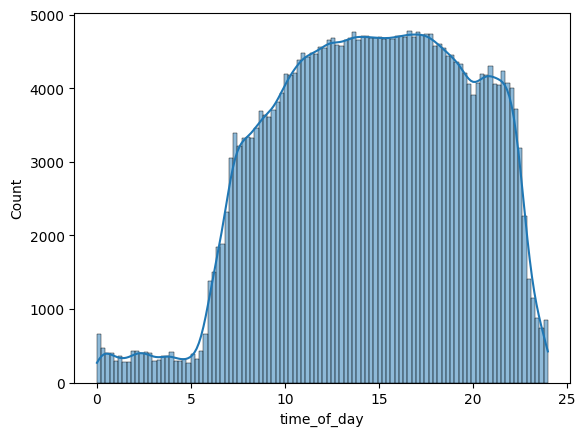

 45%|████████████████████████████████████                                            | 449/996 [18:33<21:49,  2.39s/it]

71850348


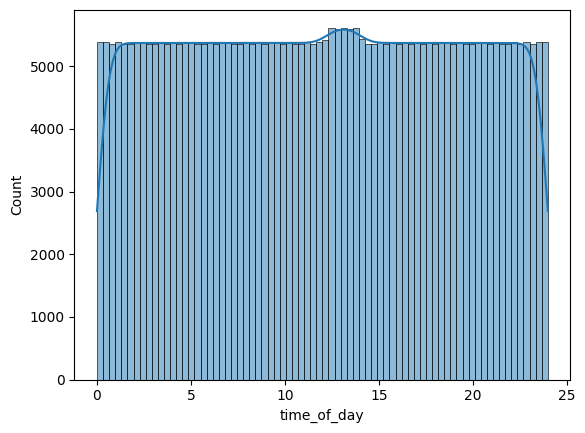

 45%|████████████████████████████████████▏                                           | 450/996 [18:36<23:45,  2.61s/it]

71852781


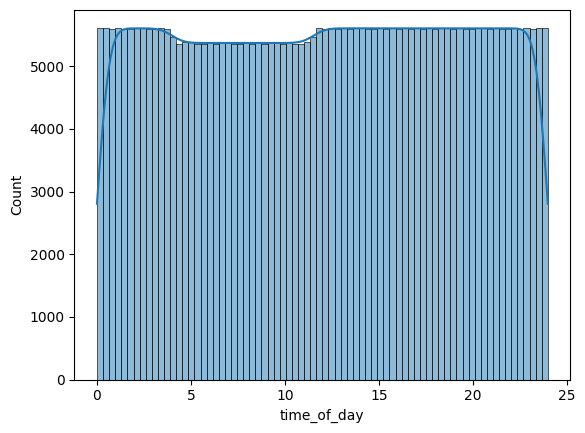

 45%|████████████████████████████████████▏                                           | 451/996 [18:40<25:22,  2.79s/it]

7187caec


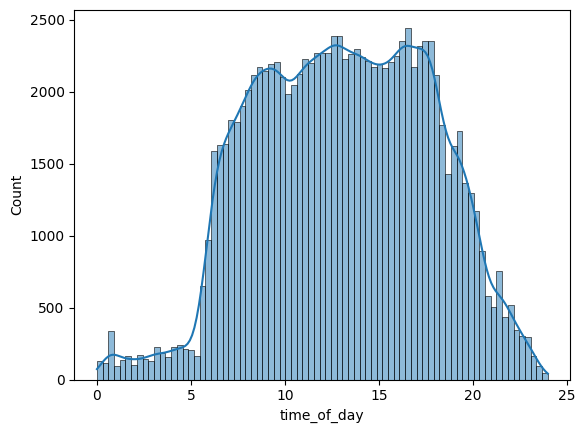

 45%|████████████████████████████████████▎                                           | 452/996 [18:41<20:58,  2.31s/it]

71c1b1d2


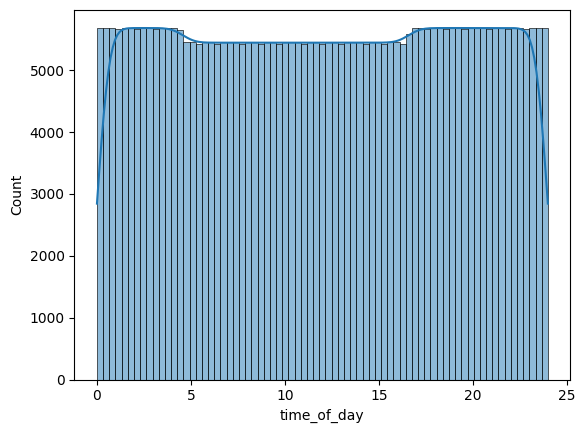

 45%|████████████████████████████████████▍                                           | 453/996 [18:44<23:16,  2.57s/it]

71ee31f8


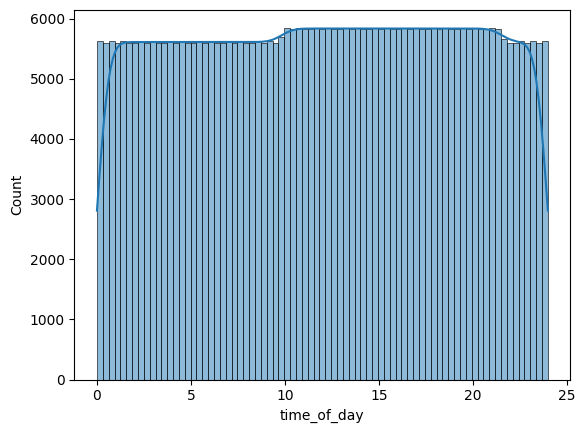

 46%|████████████████████████████████████▍                                           | 454/996 [18:47<25:34,  2.83s/it]

721ea536


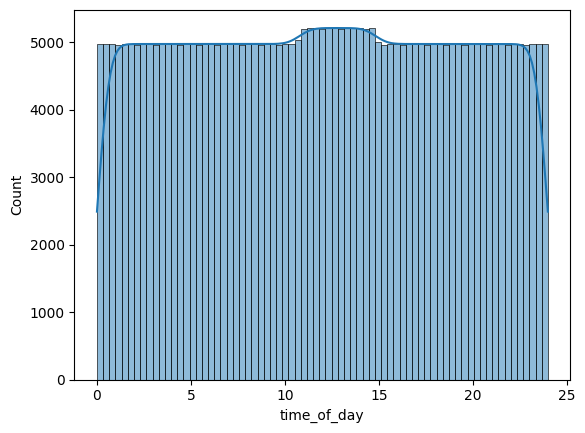

 46%|████████████████████████████████████▌                                           | 455/996 [18:50<25:39,  2.84s/it]

7265f1e5


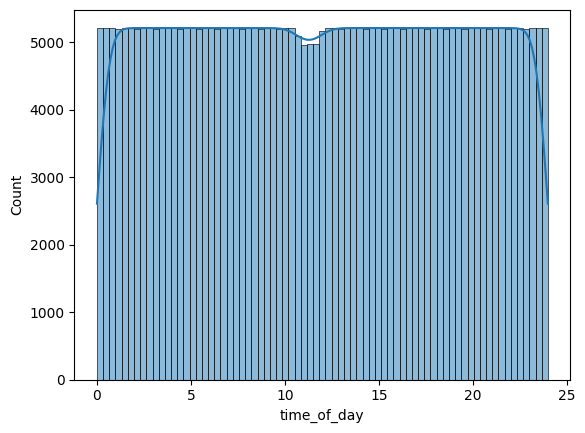

 46%|████████████████████████████████████▋                                           | 456/996 [18:53<25:58,  2.89s/it]

72a0c969


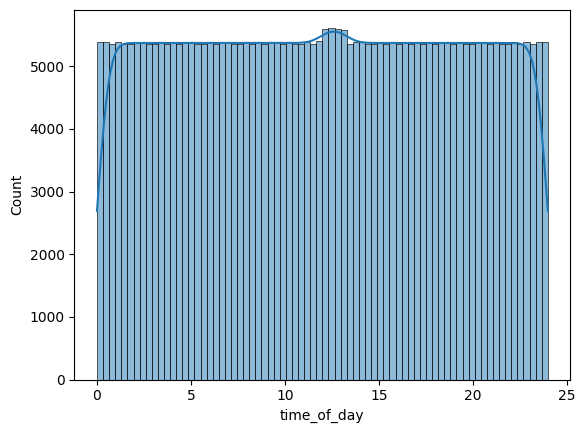

 46%|████████████████████████████████████▋                                           | 457/996 [18:56<26:32,  2.95s/it]

72c9c38d


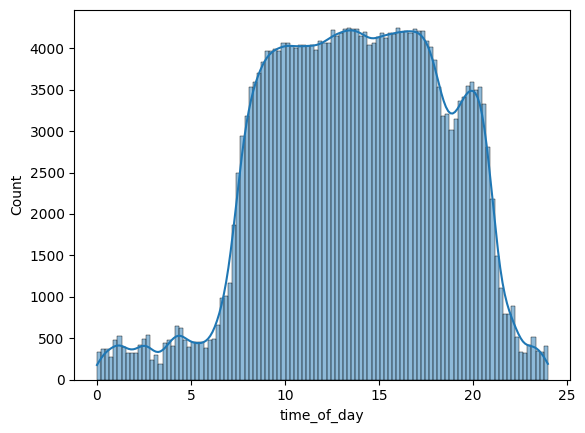

 46%|████████████████████████████████████▊                                           | 458/996 [18:59<24:06,  2.69s/it]

732b2327


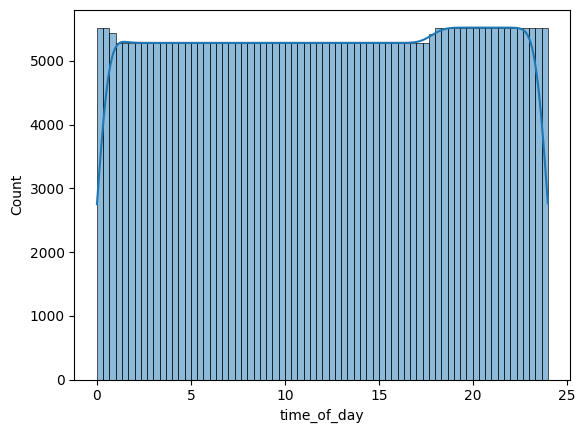

 46%|████████████████████████████████████▊                                           | 459/996 [19:02<24:57,  2.79s/it]

7347b54e


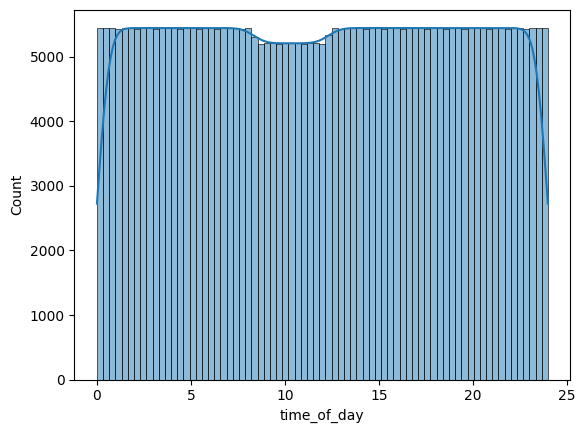

 46%|████████████████████████████████████▉                                           | 460/996 [19:05<25:43,  2.88s/it]

73ec551e


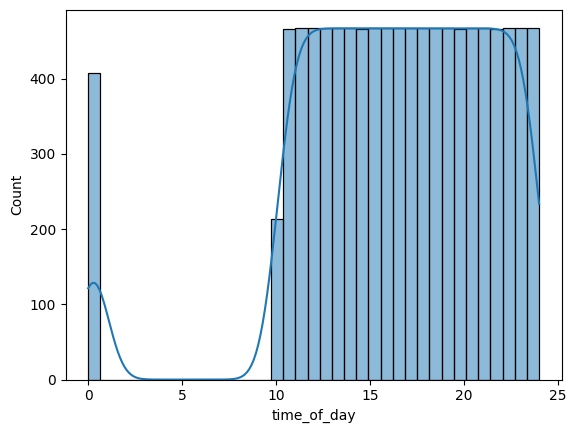

 46%|█████████████████████████████████████                                           | 461/996 [19:05<18:28,  2.07s/it]

73ffa609


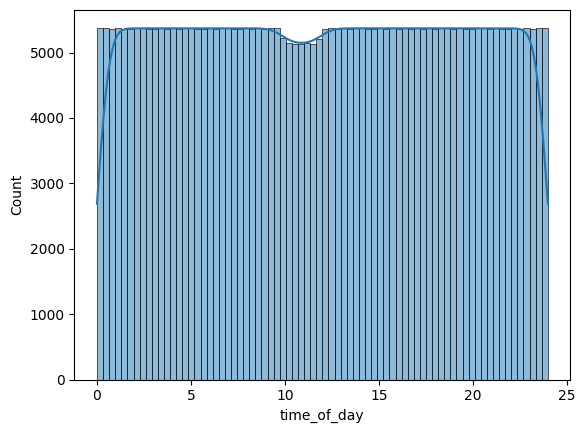

 46%|█████████████████████████████████████                                           | 462/996 [19:08<21:12,  2.38s/it]

745e6065


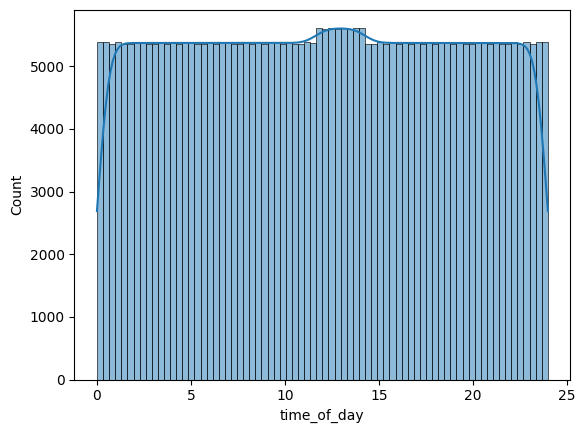

 46%|█████████████████████████████████████▏                                          | 463/996 [19:11<23:10,  2.61s/it]

7494989e


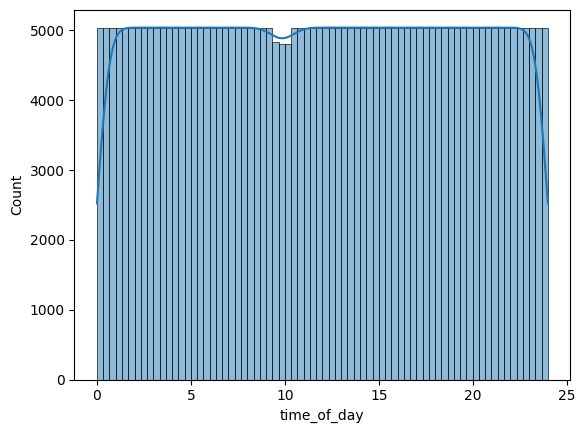

 47%|█████████████████████████████████████▎                                          | 464/996 [19:14<23:45,  2.68s/it]

75ad73ee


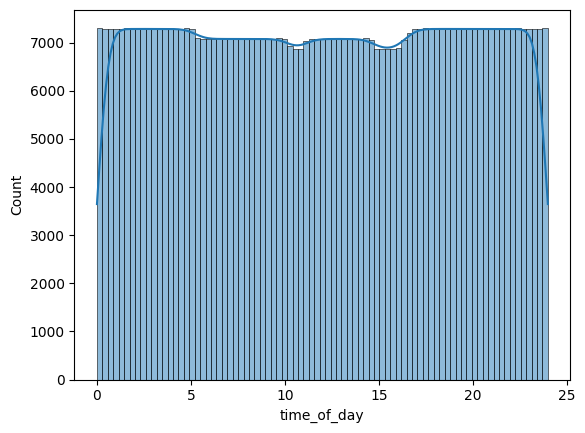

 47%|█████████████████████████████████████▎                                          | 465/996 [19:18<28:36,  3.23s/it]

75b0446f


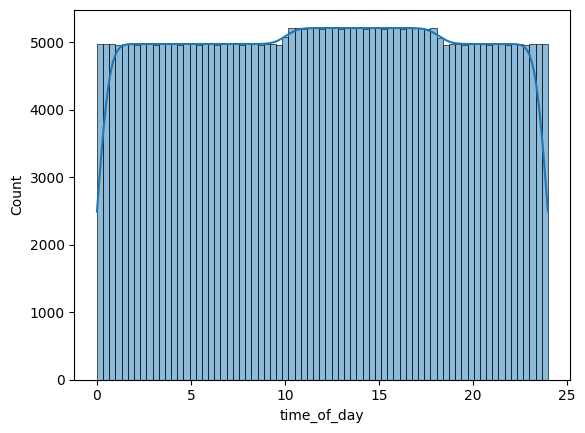

 47%|█████████████████████████████████████▍                                          | 466/996 [19:21<27:40,  3.13s/it]

75b53bd4


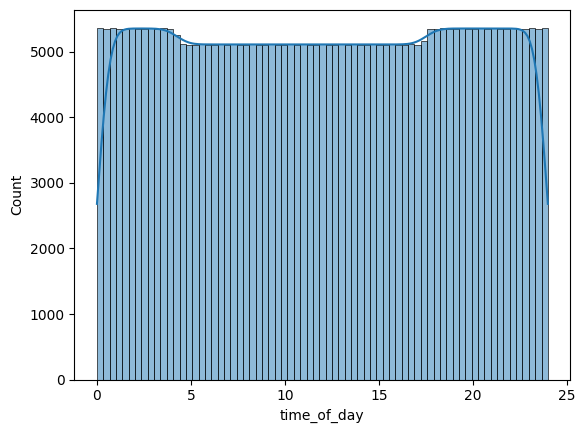

 47%|█████████████████████████████████████▌                                          | 467/996 [19:24<27:03,  3.07s/it]

75c13e08


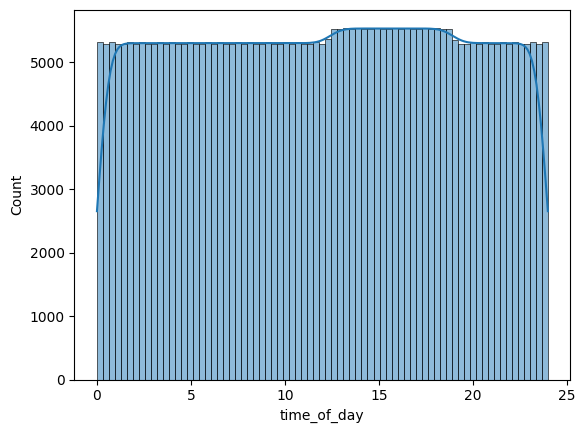

 47%|█████████████████████████████████████▌                                          | 468/996 [19:27<27:17,  3.10s/it]

764d8b42


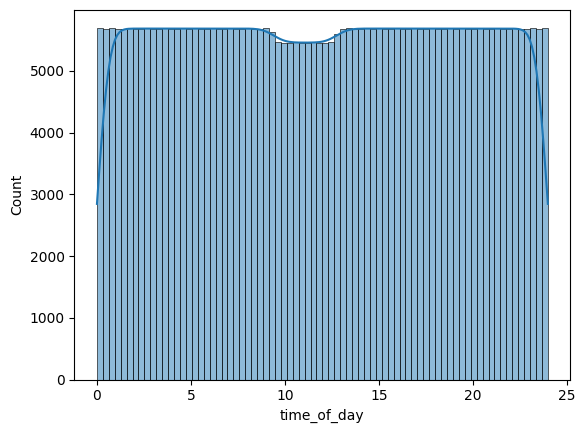

 47%|█████████████████████████████████████▋                                          | 469/996 [19:31<27:52,  3.17s/it]

76781cd8


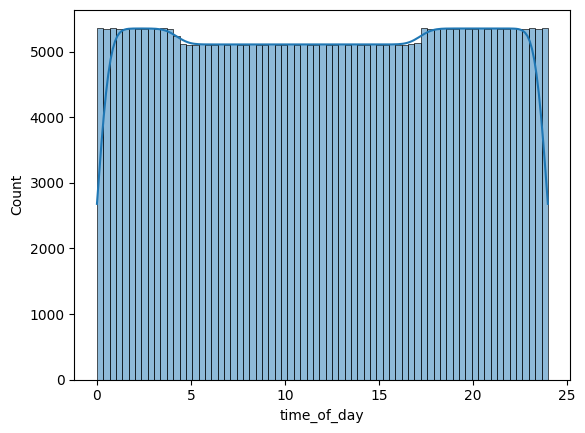

 47%|█████████████████████████████████████▊                                          | 470/996 [19:34<27:11,  3.10s/it]

76fb4afb


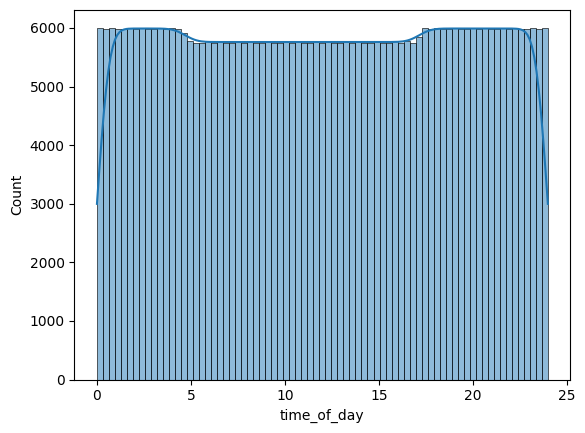

 47%|█████████████████████████████████████▊                                          | 471/996 [19:37<27:59,  3.20s/it]

7800a084


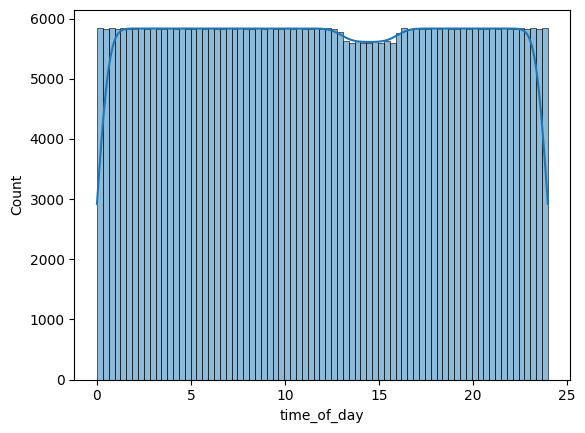

 47%|█████████████████████████████████████▉                                          | 472/996 [19:41<28:40,  3.28s/it]

7860b64c


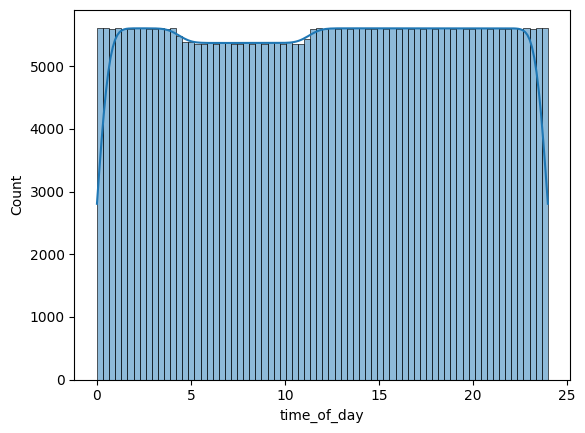

 47%|█████████████████████████████████████▉                                          | 473/996 [19:44<28:23,  3.26s/it]

78704d22


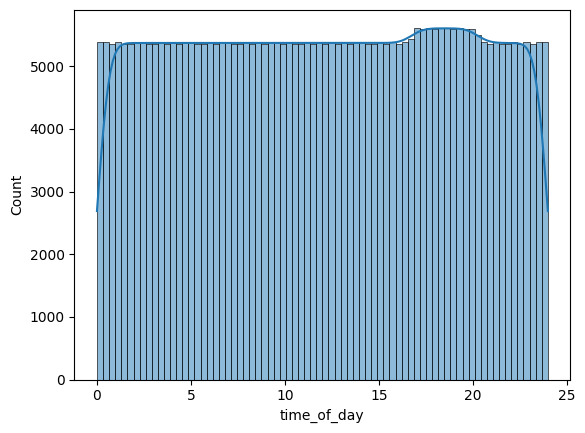

 48%|██████████████████████████████████████                                          | 474/996 [19:47<27:59,  3.22s/it]

79bd36b6


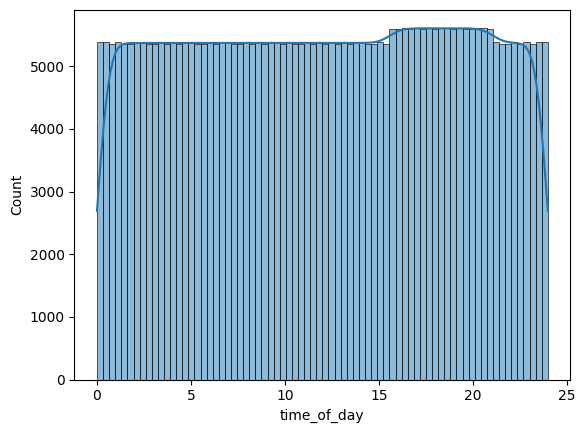

 48%|██████████████████████████████████████▏                                         | 475/996 [19:50<27:43,  3.19s/it]

7a0136e0


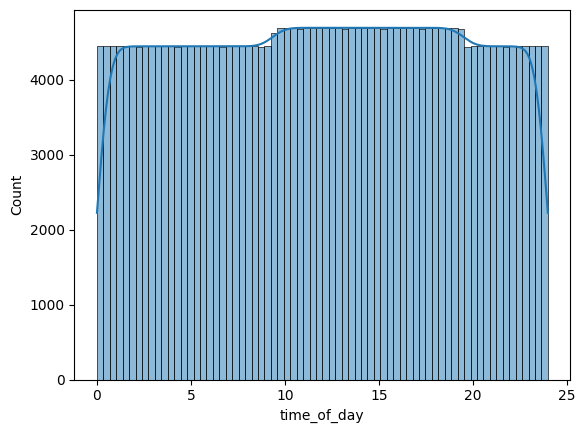

 48%|██████████████████████████████████████▏                                         | 476/996 [19:53<26:00,  3.00s/it]

7a6d26a2


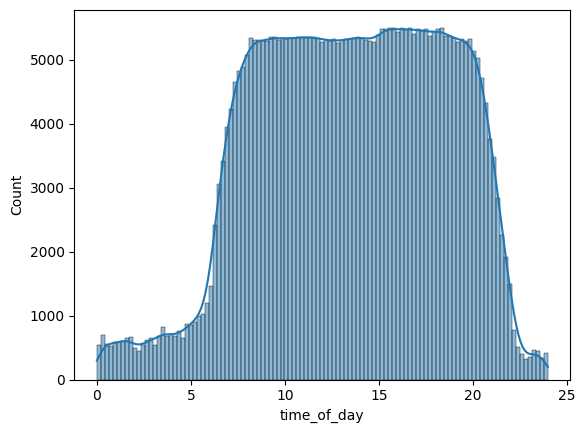

 48%|██████████████████████████████████████▎                                         | 477/996 [19:56<26:37,  3.08s/it]

7b0a4060


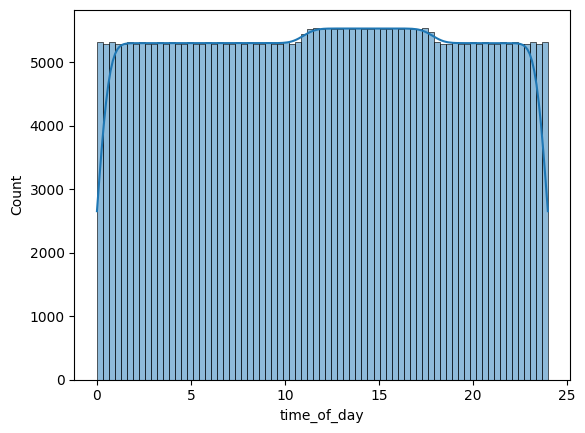

 48%|██████████████████████████████████████▍                                         | 478/996 [19:59<26:45,  3.10s/it]

7b543871


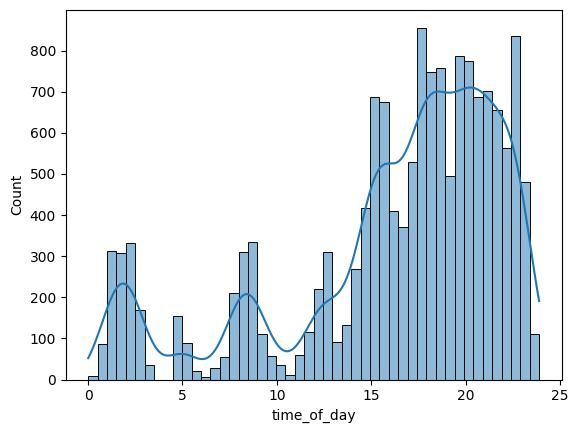

 48%|██████████████████████████████████████▍                                         | 479/996 [19:59<19:17,  2.24s/it]

7b8842c3


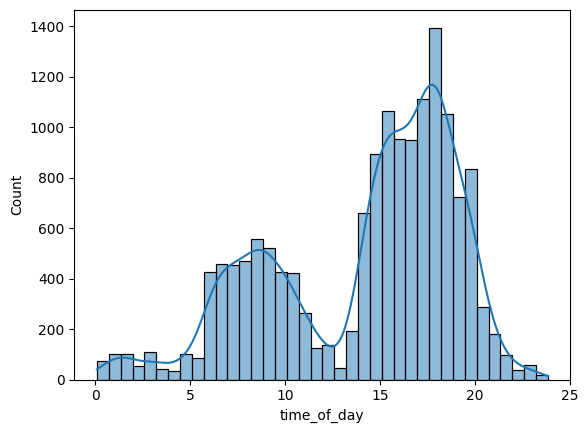

 48%|██████████████████████████████████████▌                                         | 480/996 [19:59<14:02,  1.63s/it]

7bdbf66f


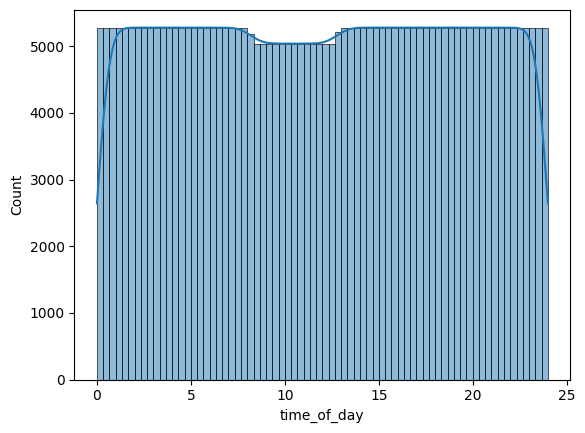

 48%|██████████████████████████████████████▋                                         | 481/996 [20:02<17:27,  2.03s/it]

7c194077


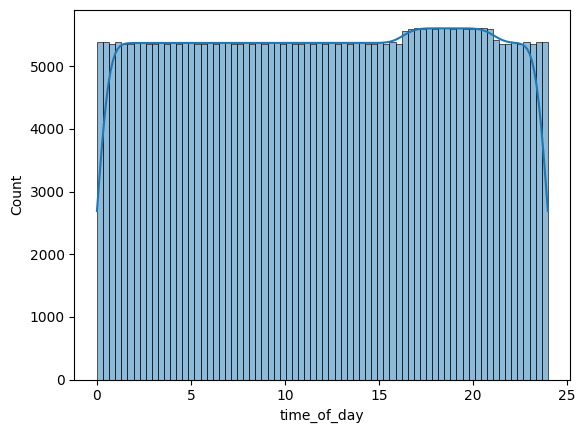

 48%|██████████████████████████████████████▋                                         | 482/996 [20:06<20:17,  2.37s/it]

7c21ad67


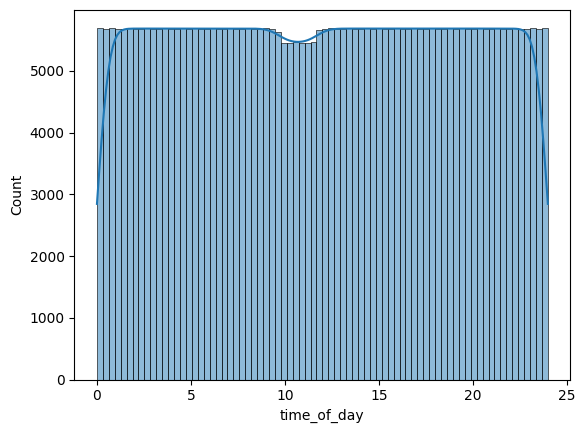

 48%|██████████████████████████████████████▊                                         | 483/996 [20:09<22:54,  2.68s/it]

7c39c8e5


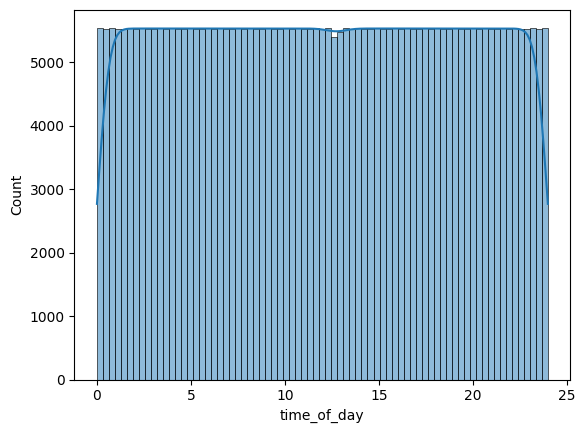

 49%|██████████████████████████████████████▉                                         | 484/996 [20:12<24:23,  2.86s/it]

7ce36c38


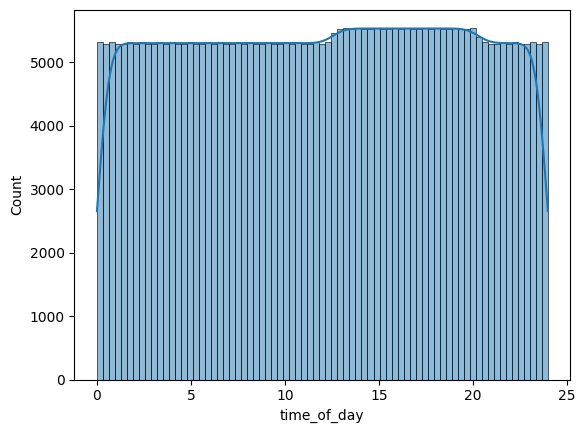

 49%|██████████████████████████████████████▉                                         | 485/996 [20:15<25:11,  2.96s/it]

7d8f1716


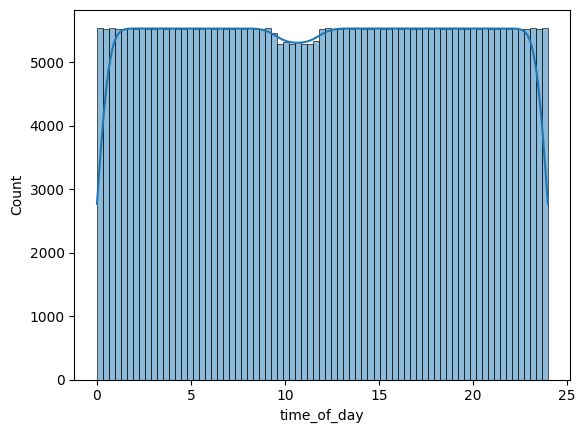

 49%|███████████████████████████████████████                                         | 486/996 [20:19<25:48,  3.04s/it]

7dc65b92


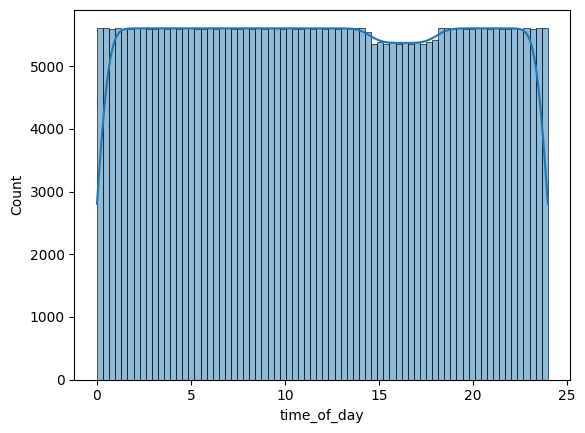

 49%|███████████████████████████████████████                                         | 487/996 [20:22<26:08,  3.08s/it]

7e46b693


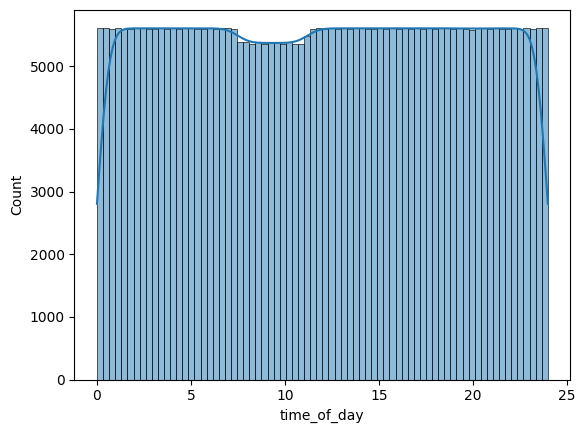

 49%|███████████████████████████████████████▏                                        | 488/996 [20:25<26:23,  3.12s/it]

7e87087b


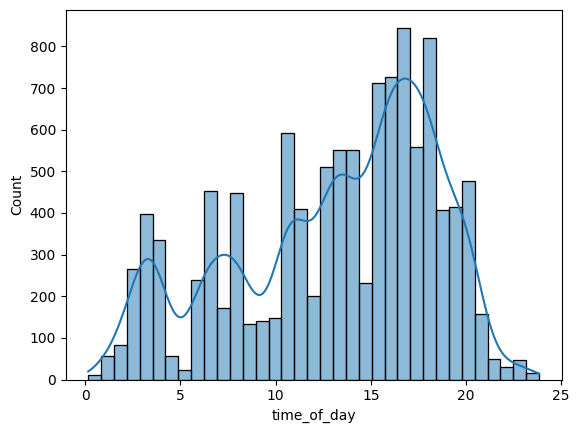

 49%|███████████████████████████████████████▎                                        | 489/996 [20:25<18:55,  2.24s/it]

7f26f78c


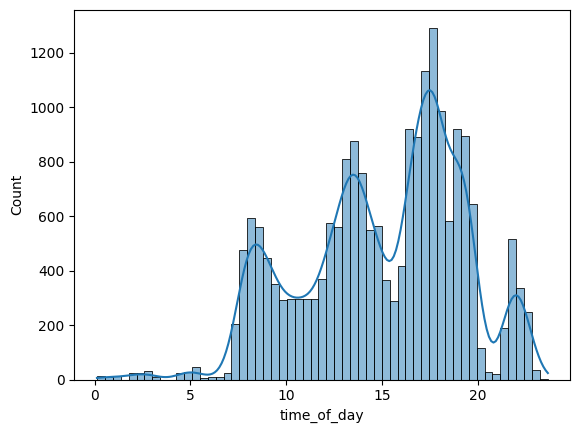

 49%|███████████████████████████████████████▎                                        | 490/996 [20:26<13:52,  1.65s/it]

7f2715b4


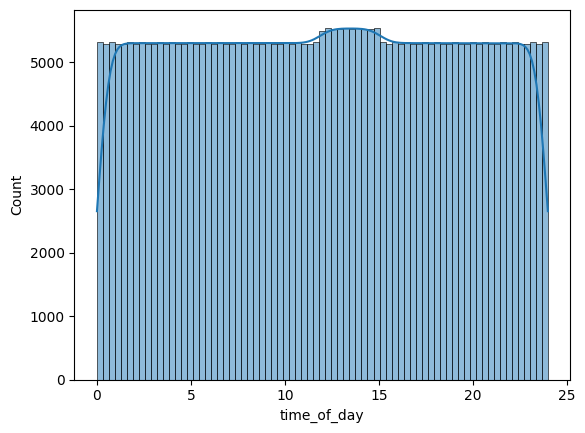

 49%|███████████████████████████████████████▍                                        | 491/996 [20:29<17:28,  2.08s/it]

7f44236f


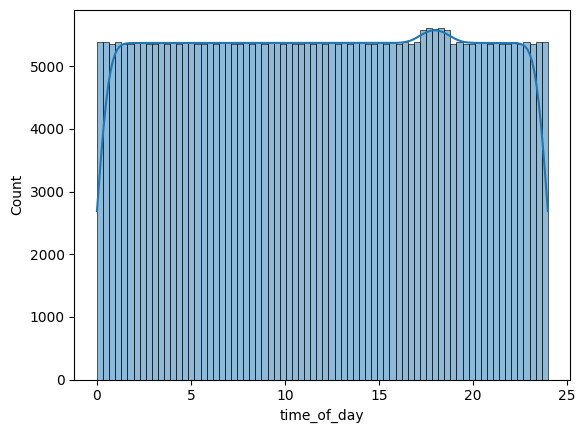

 49%|███████████████████████████████████████▌                                        | 492/996 [20:32<20:00,  2.38s/it]

7fa51811


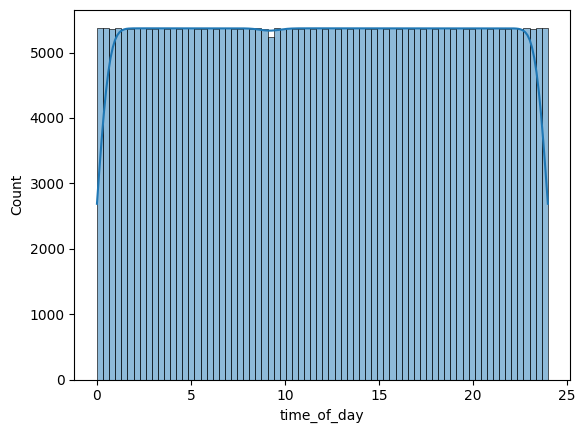

 49%|███████████████████████████████████████▌                                        | 493/996 [20:35<21:44,  2.59s/it]

7fa7ccc4


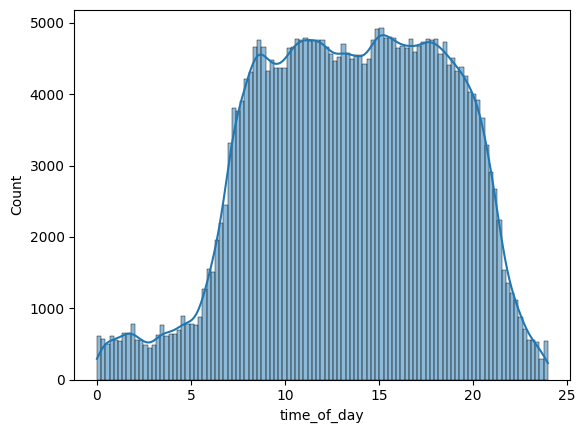

 50%|███████████████████████████████████████▋                                        | 494/996 [20:37<21:19,  2.55s/it]

806d877f


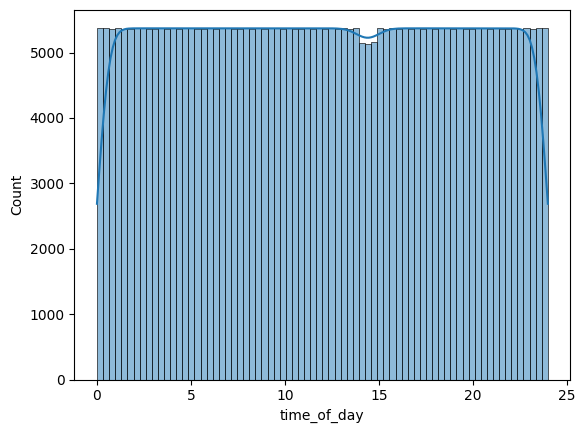

 50%|███████████████████████████████████████▊                                        | 495/996 [20:40<22:41,  2.72s/it]

8078b7de


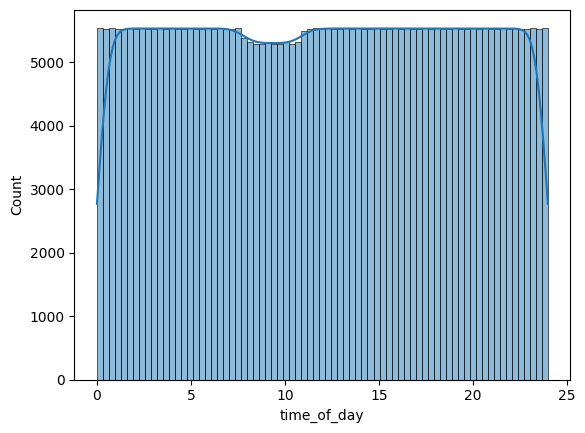

 50%|███████████████████████████████████████▊                                        | 496/996 [20:44<23:56,  2.87s/it]

807d8908


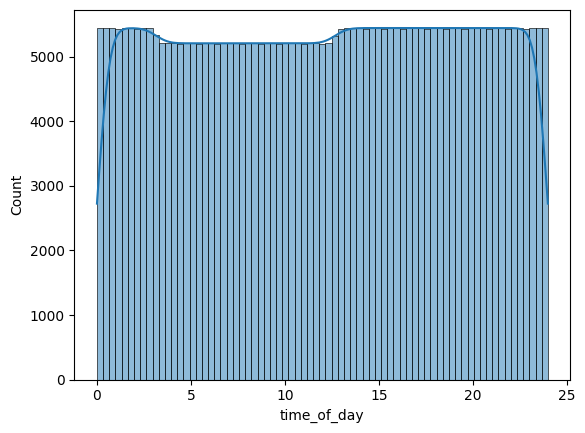

 50%|███████████████████████████████████████▉                                        | 497/996 [20:47<24:24,  2.94s/it]

80b46ffb


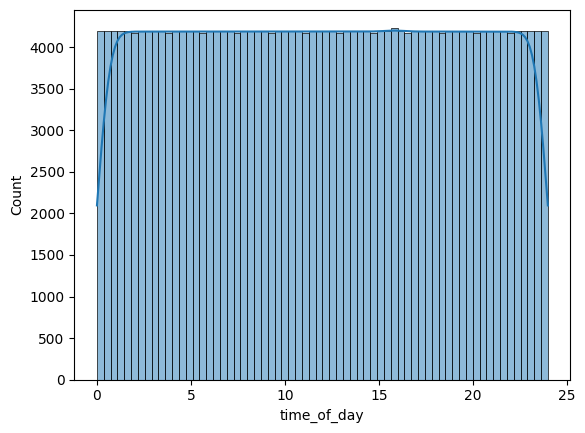

 50%|████████████████████████████████████████                                        | 498/996 [20:49<22:37,  2.73s/it]

812f6873


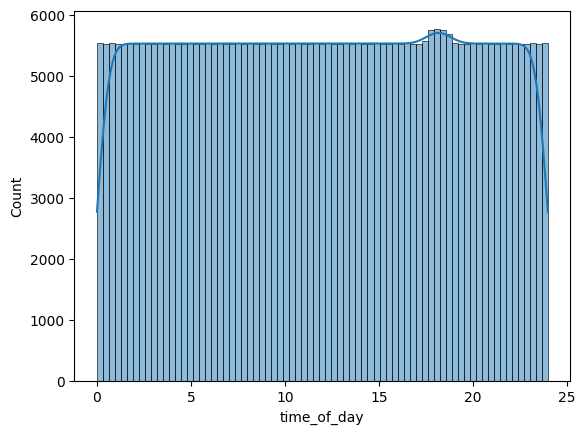

 50%|████████████████████████████████████████                                        | 499/996 [20:52<23:56,  2.89s/it]

8148c785


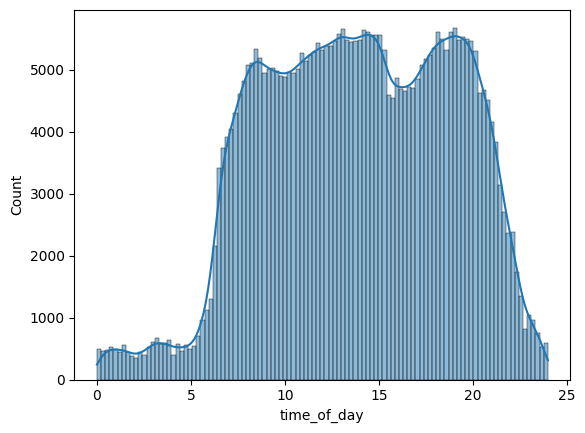

 50%|████████████████████████████████████████▏                                       | 500/996 [20:55<23:46,  2.88s/it]

81a4b826


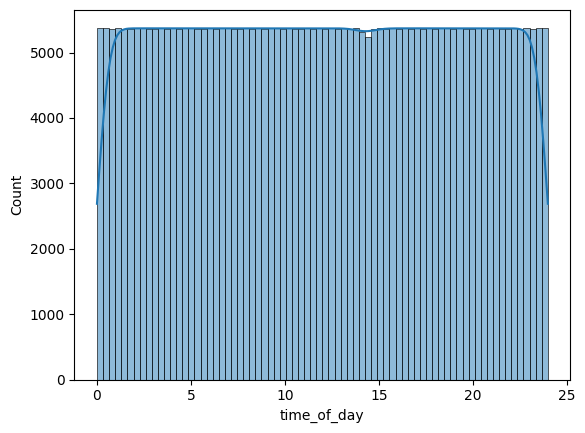

 50%|████████████████████████████████████████▏                                       | 501/996 [20:58<24:22,  2.95s/it]

81d3ab22


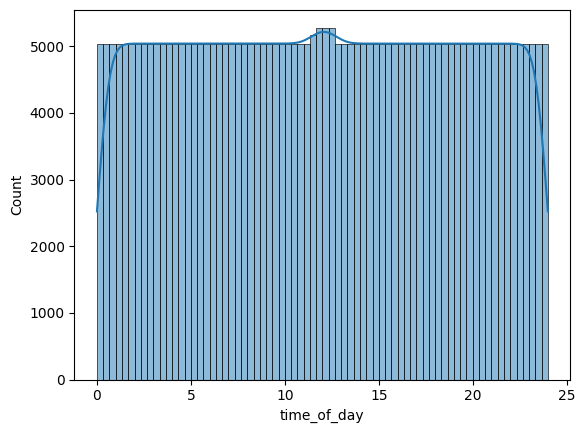

 50%|████████████████████████████████████████▎                                       | 502/996 [21:01<24:42,  3.00s/it]

81feecad


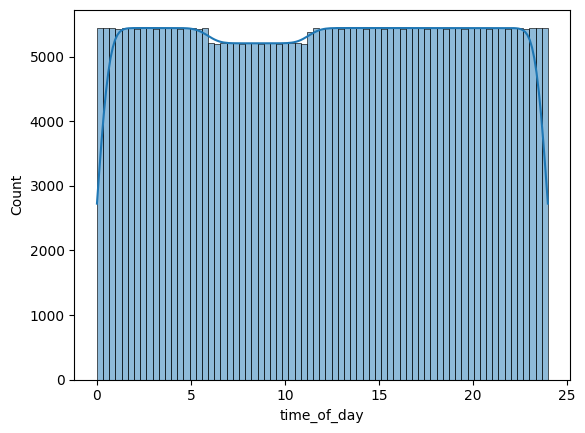

 51%|████████████████████████████████████████▍                                       | 503/996 [21:04<24:53,  3.03s/it]

82ec9747


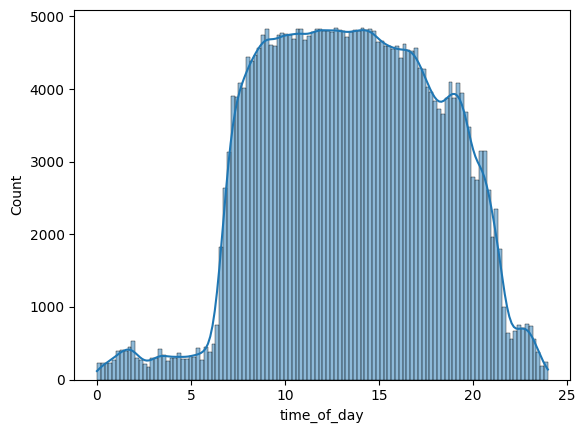

 51%|████████████████████████████████████████▍                                       | 504/996 [21:07<23:29,  2.87s/it]

83379672


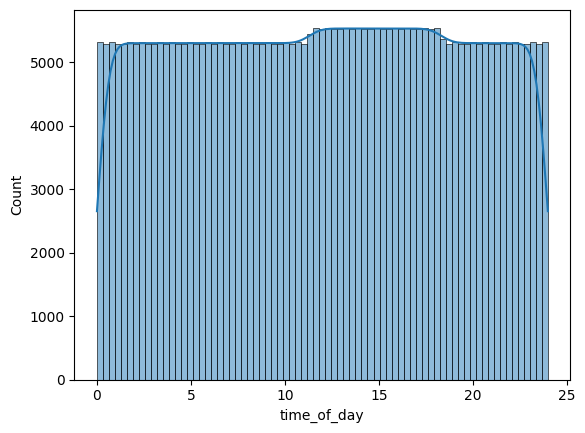

 51%|████████████████████████████████████████▌                                       | 505/996 [21:10<24:09,  2.95s/it]

836b4de3


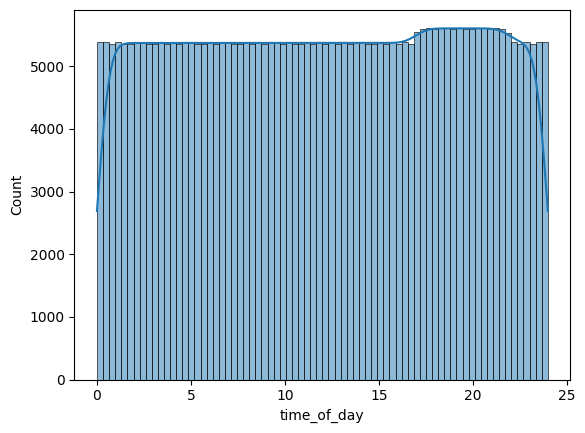

 51%|████████████████████████████████████████▋                                       | 506/996 [21:13<24:33,  3.01s/it]

83711ef5


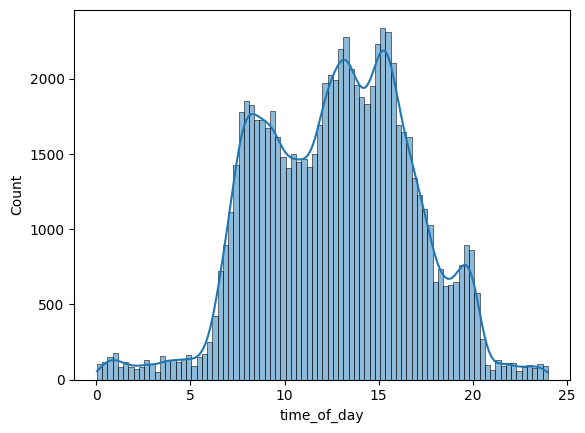

 51%|████████████████████████████████████████▋                                       | 507/996 [21:14<18:54,  2.32s/it]

8376acc5


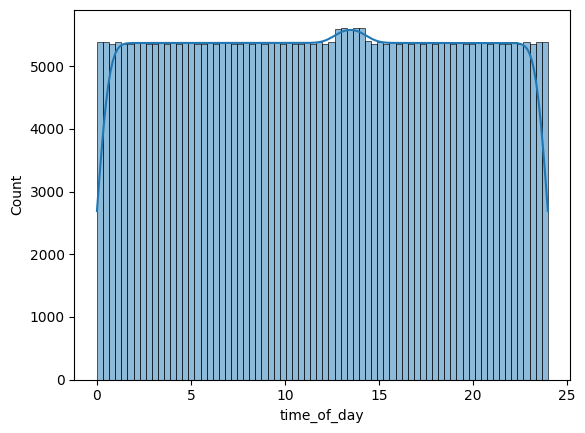

 51%|████████████████████████████████████████▊                                       | 508/996 [21:17<20:48,  2.56s/it]

83846d0c


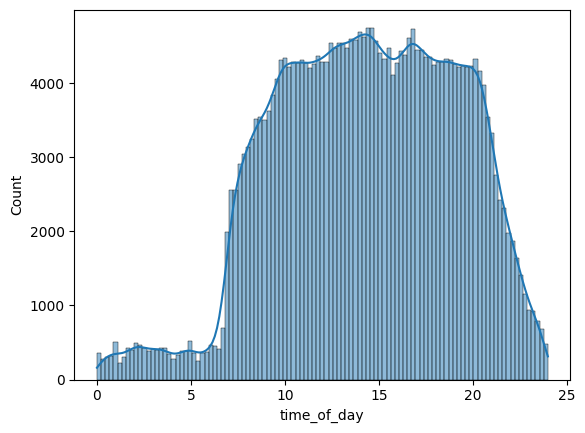

 51%|████████████████████████████████████████▉                                       | 509/996 [21:19<20:03,  2.47s/it]

83912085


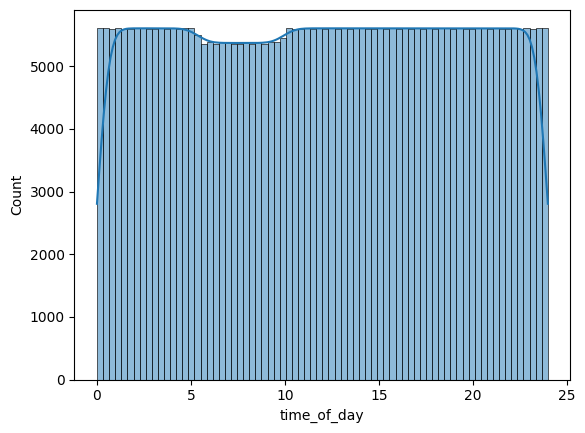

 51%|████████████████████████████████████████▉                                       | 510/996 [21:22<21:49,  2.70s/it]

83eda373


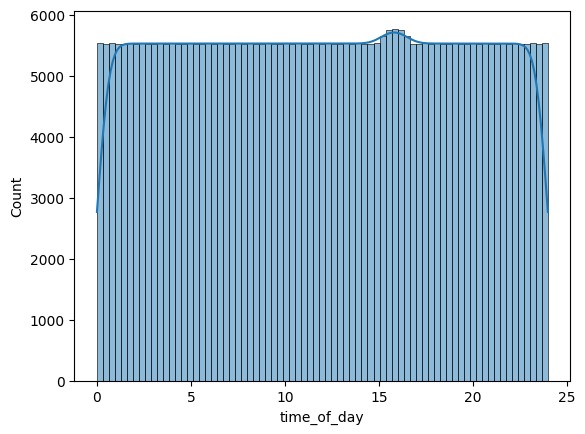

 51%|█████████████████████████████████████████                                       | 511/996 [21:26<23:08,  2.86s/it]

84875079


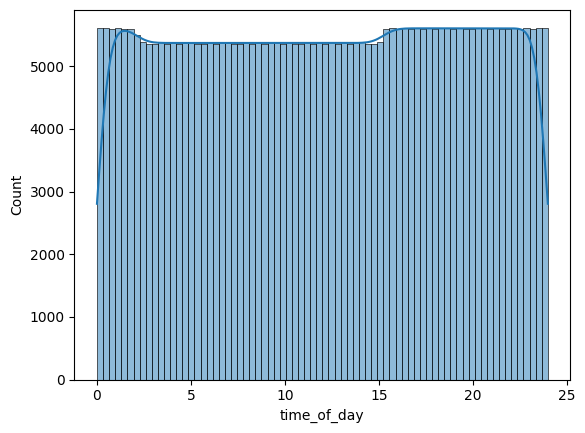

 51%|█████████████████████████████████████████                                       | 512/996 [21:29<23:48,  2.95s/it]

84b7d89d


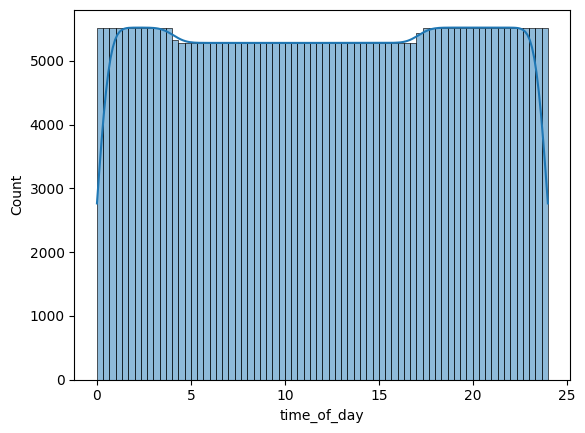

 52%|█████████████████████████████████████████▏                                      | 513/996 [21:32<24:02,  2.99s/it]

855c6099


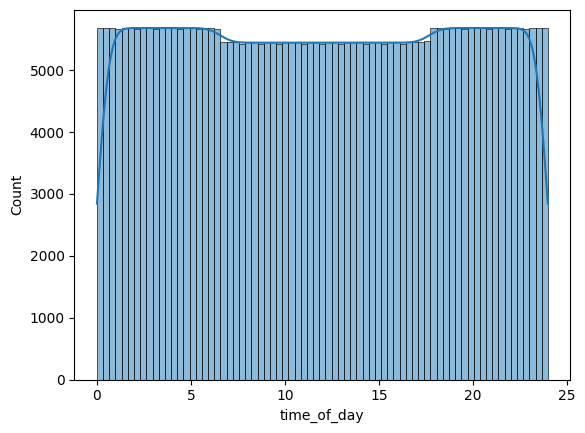

 52%|█████████████████████████████████████████▎                                      | 514/996 [21:35<24:26,  3.04s/it]

857baaa6


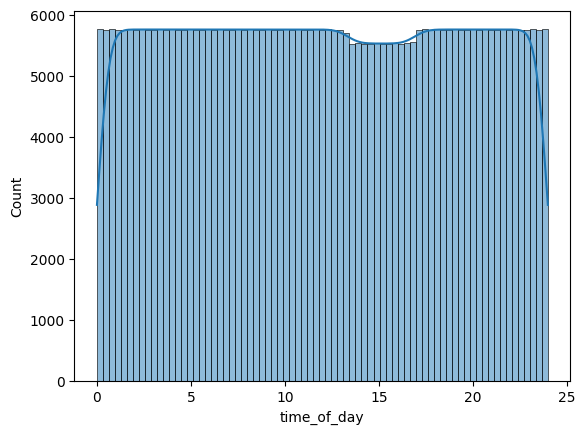

 52%|█████████████████████████████████████████▎                                      | 515/996 [21:38<25:10,  3.14s/it]

85d99199


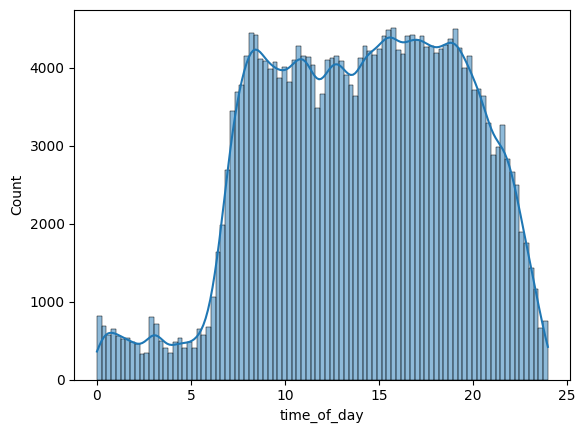

 52%|█████████████████████████████████████████▍                                      | 516/996 [21:41<22:38,  2.83s/it]

85d9c915


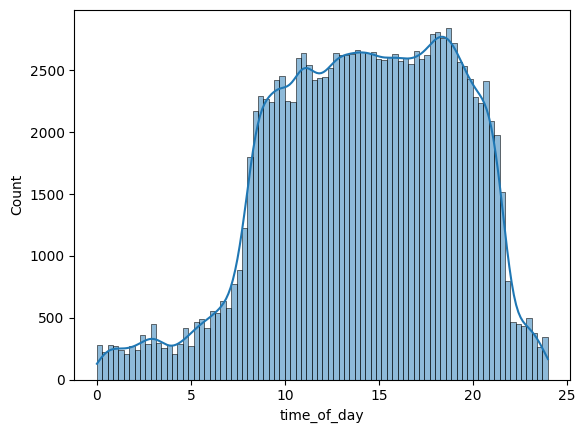

 52%|█████████████████████████████████████████▌                                      | 517/996 [21:42<18:30,  2.32s/it]

860f4f9c


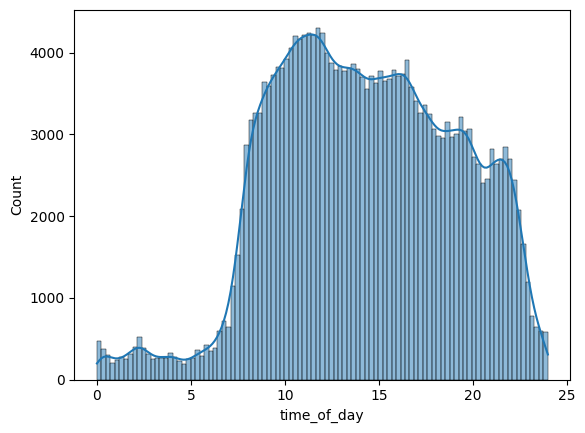

 52%|█████████████████████████████████████████▌                                      | 518/996 [21:44<17:20,  2.18s/it]

86335468


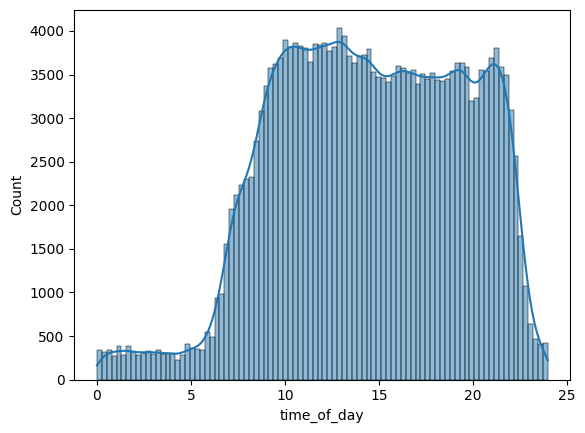

 52%|█████████████████████████████████████████▋                                      | 519/996 [21:45<16:16,  2.05s/it]

863e40c7


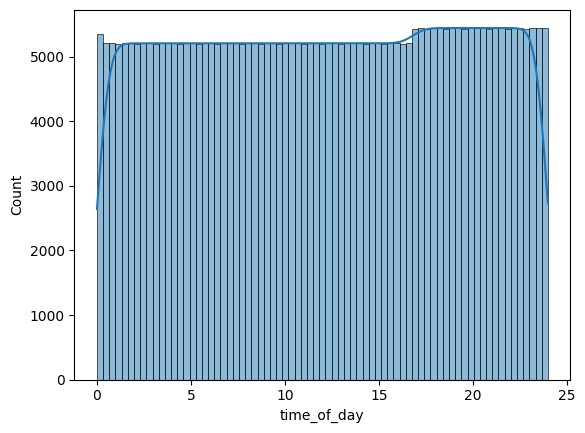

 52%|█████████████████████████████████████████▊                                      | 520/996 [21:48<18:34,  2.34s/it]

86a8e0d6


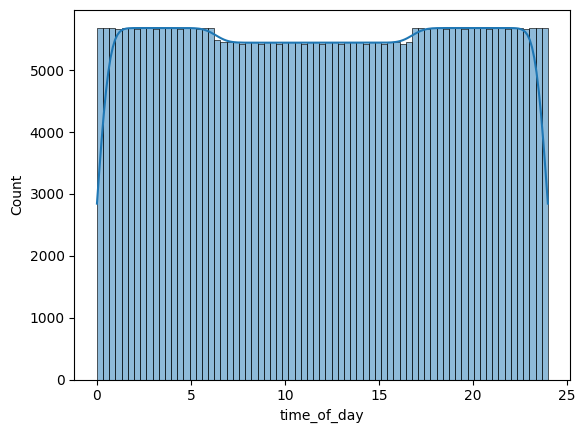

 52%|█████████████████████████████████████████▊                                      | 521/996 [21:52<20:31,  2.59s/it]

86bd716a


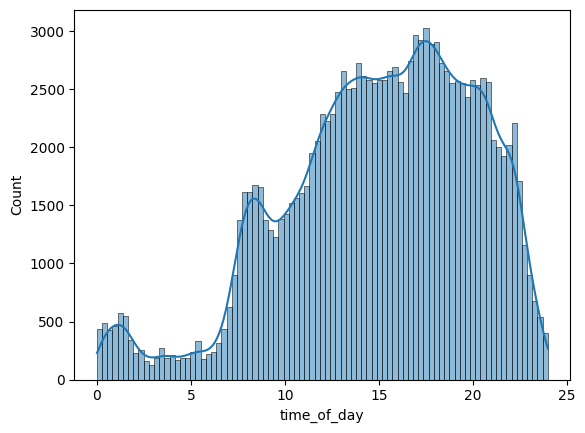

 52%|█████████████████████████████████████████▉                                      | 522/996 [21:53<17:03,  2.16s/it]

87050a09


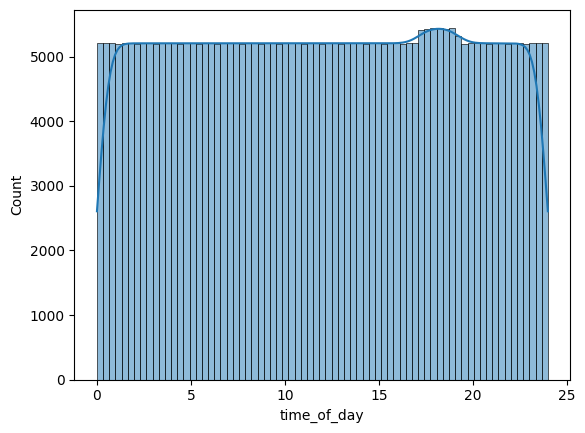

 53%|██████████████████████████████████████████                                      | 523/996 [21:56<18:58,  2.41s/it]

87af775e


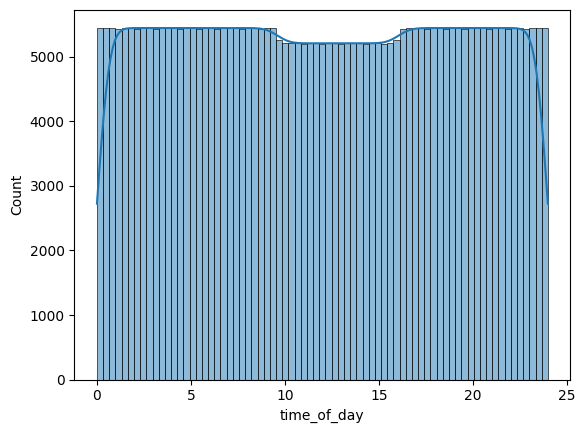

 53%|██████████████████████████████████████████                                      | 524/996 [21:59<20:35,  2.62s/it]

8823b020


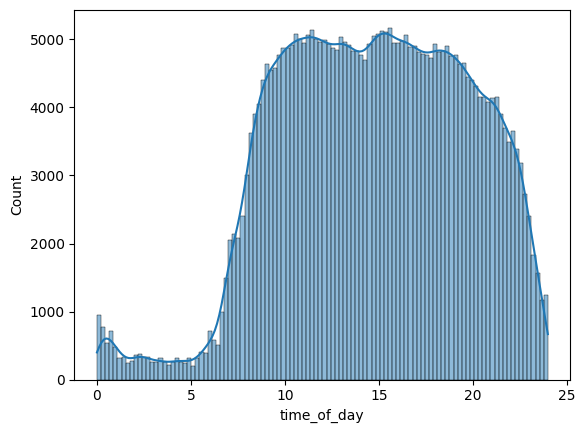

 53%|██████████████████████████████████████████▏                                     | 525/996 [22:01<20:31,  2.61s/it]

8875387b


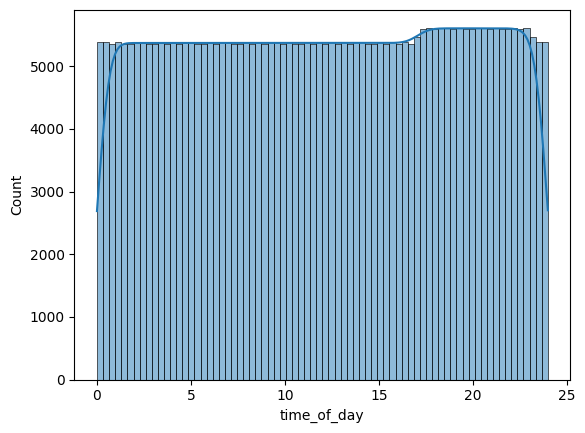

 53%|██████████████████████████████████████████▏                                     | 526/996 [22:05<22:20,  2.85s/it]

893293dd


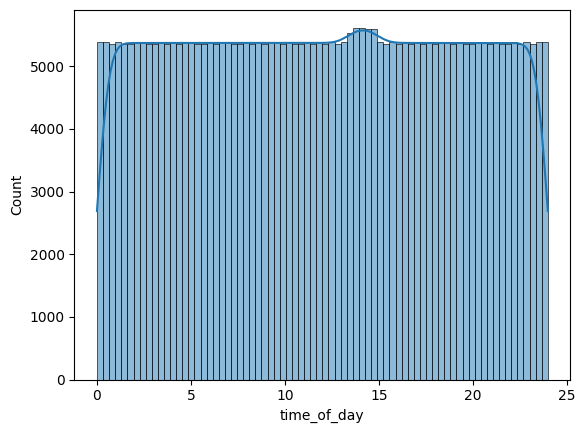

 53%|██████████████████████████████████████████▎                                     | 527/996 [22:08<22:56,  2.93s/it]

89739b1a


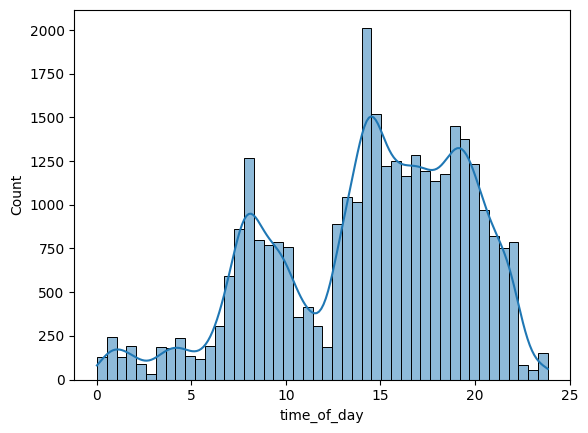

 53%|██████████████████████████████████████████▍                                     | 528/996 [22:08<16:50,  2.16s/it]

897da2c8


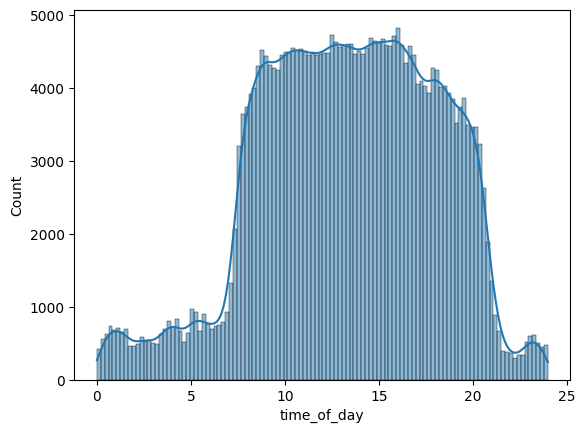

 53%|██████████████████████████████████████████▍                                     | 529/996 [22:11<17:18,  2.22s/it]

898096eb


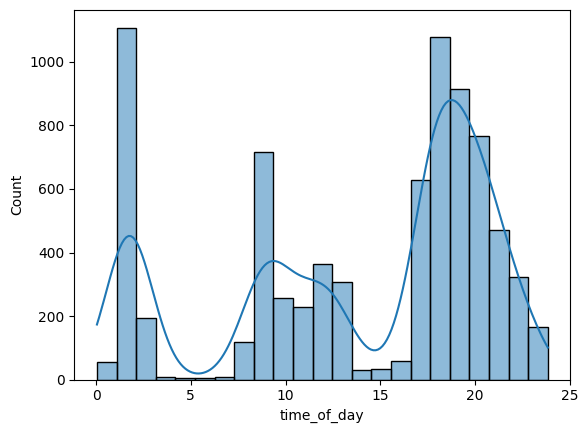

 53%|██████████████████████████████████████████▌                                     | 530/996 [22:11<12:26,  1.60s/it]

89a26502


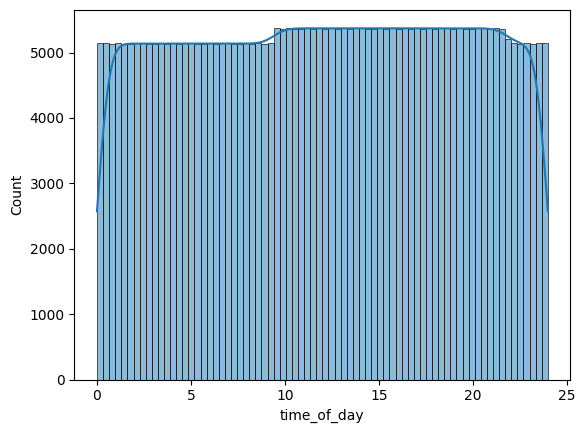

 53%|██████████████████████████████████████████▋                                     | 531/996 [22:14<15:49,  2.04s/it]

8a44ea3a


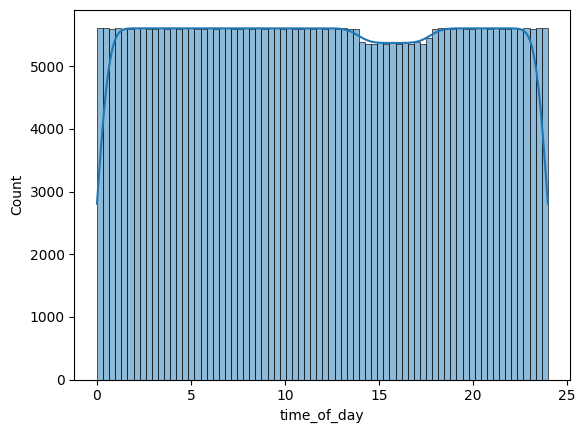

 53%|██████████████████████████████████████████▋                                     | 532/996 [22:17<18:35,  2.40s/it]

8a4e5d1a


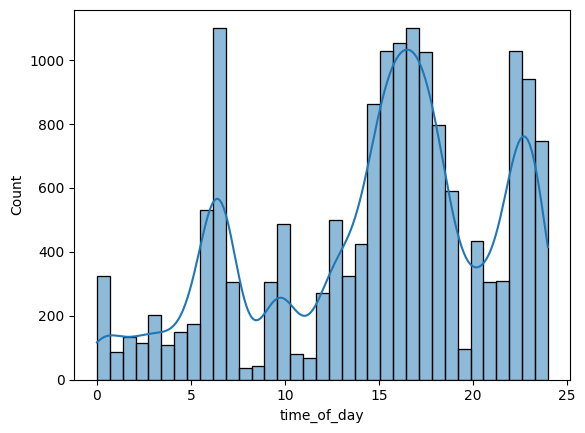

 54%|██████████████████████████████████████████▊                                     | 533/996 [22:17<13:29,  1.75s/it]

8a645723


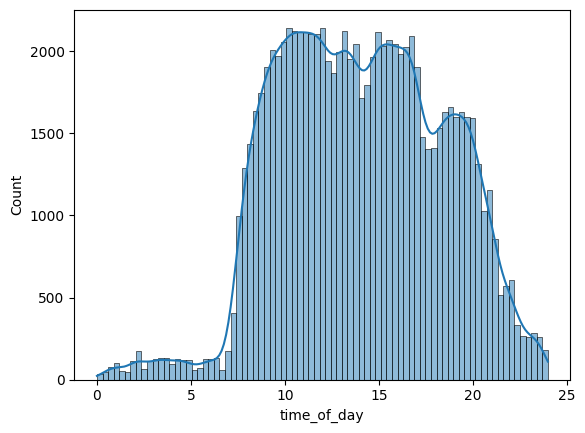

 54%|██████████████████████████████████████████▉                                     | 534/996 [22:18<11:14,  1.46s/it]

8a6b6912


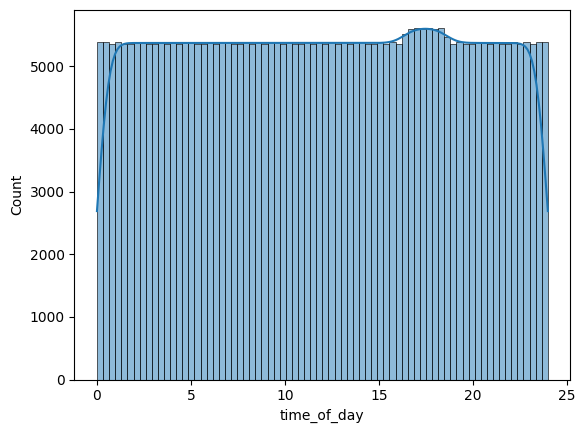

 54%|██████████████████████████████████████████▉                                     | 535/996 [22:21<15:01,  1.96s/it]

8a77c3e9


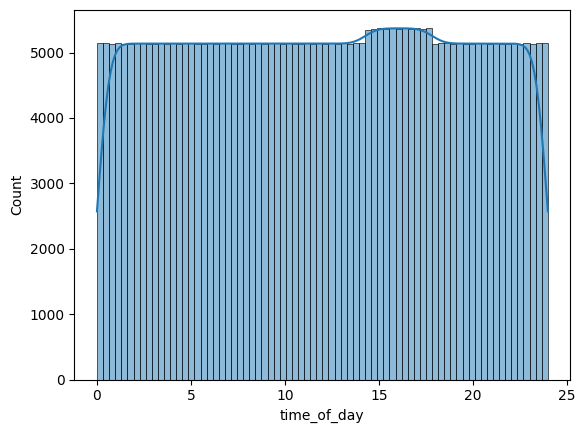

 54%|███████████████████████████████████████████                                     | 536/996 [22:24<17:27,  2.28s/it]

8a9e653f


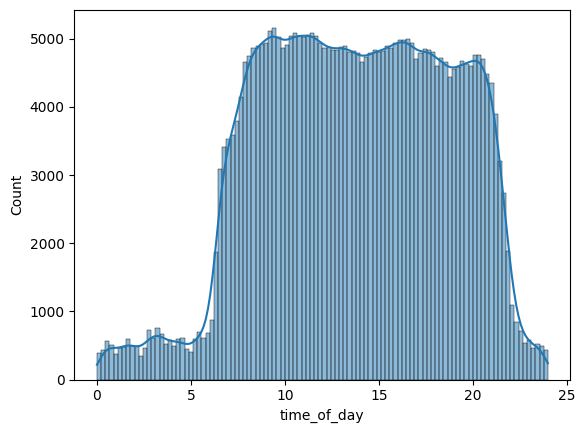

 54%|███████████████████████████████████████████▏                                    | 537/996 [22:27<18:12,  2.38s/it]

8abbbc38


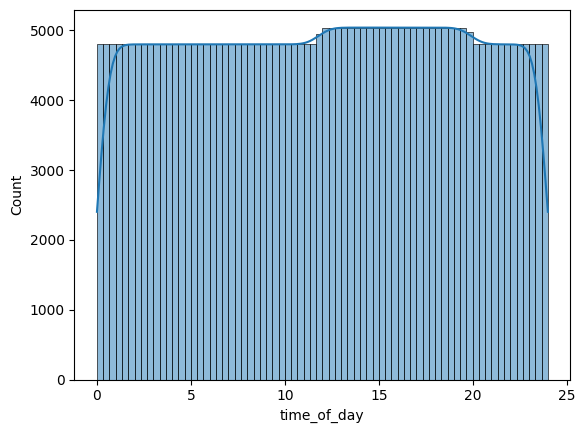

 54%|███████████████████████████████████████████▏                                    | 538/996 [22:30<19:04,  2.50s/it]

8ba98f12


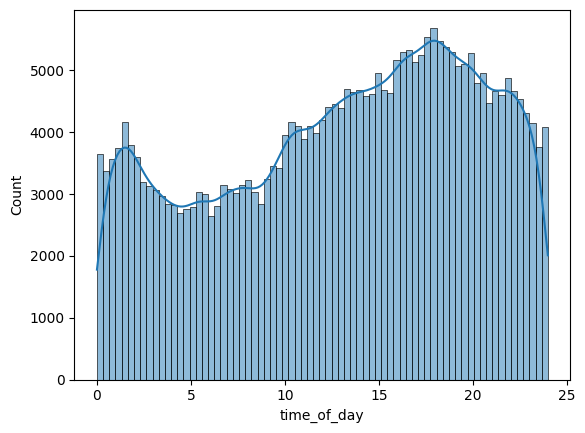

 54%|███████████████████████████████████████████▎                                    | 539/996 [22:32<18:45,  2.46s/it]

8c0ca955


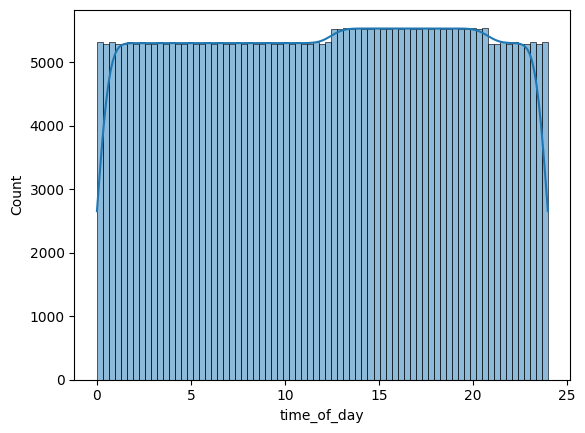

 54%|███████████████████████████████████████████▎                                    | 540/996 [22:35<20:17,  2.67s/it]

8c1f9196


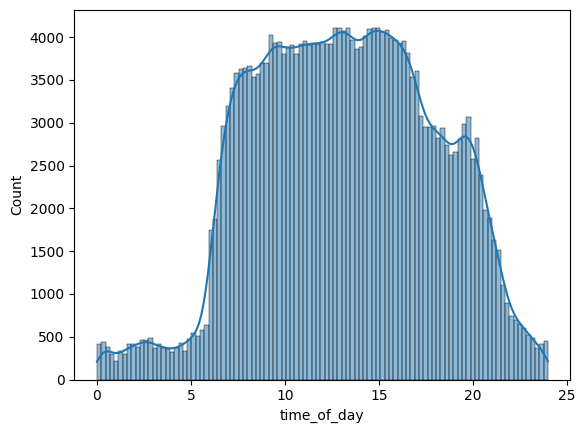

 54%|███████████████████████████████████████████▍                                    | 541/996 [22:37<18:41,  2.46s/it]

8c6c52a2


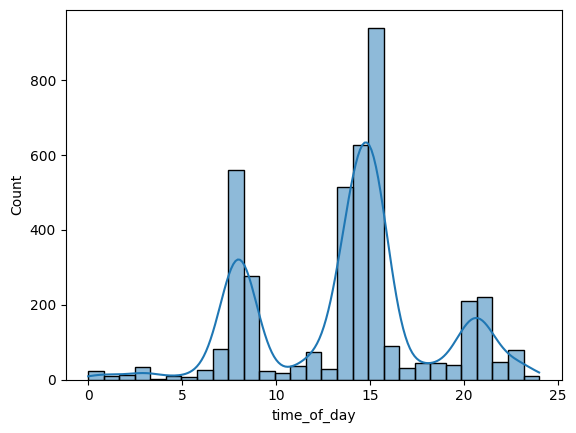

 54%|███████████████████████████████████████████▌                                    | 542/996 [22:37<13:19,  1.76s/it]

8cab7bc4


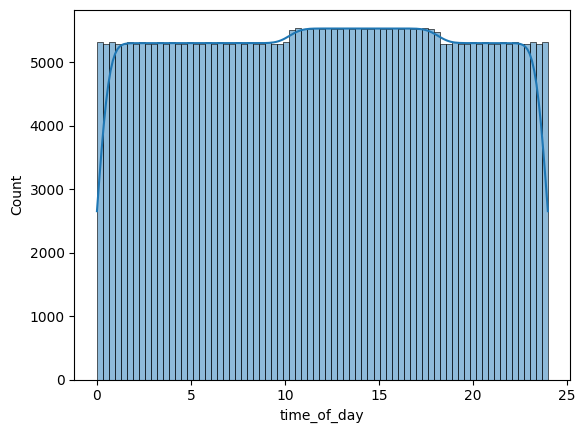

 55%|███████████████████████████████████████████▌                                    | 543/996 [22:40<16:29,  2.18s/it]

8d8b8553


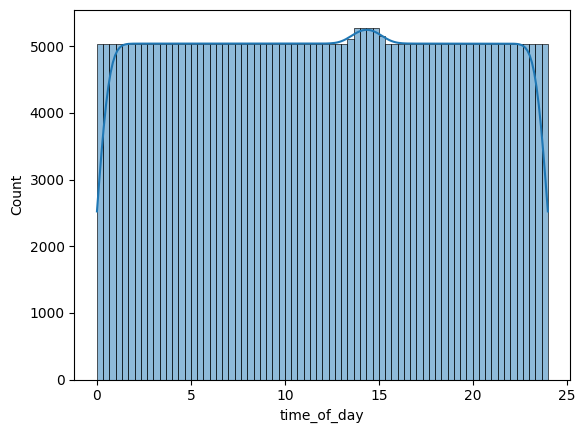

 55%|███████████████████████████████████████████▋                                    | 544/996 [22:43<18:03,  2.40s/it]

8ddb6b8d


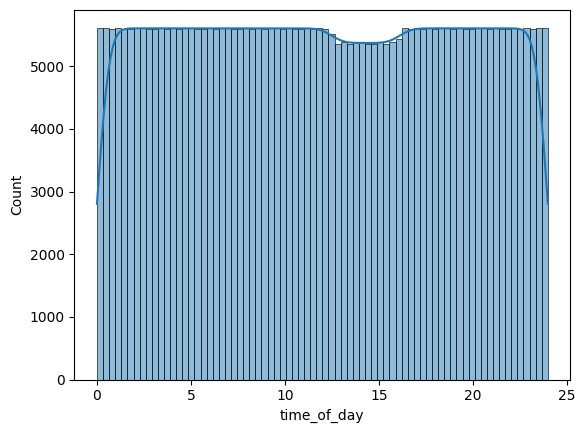

 55%|███████████████████████████████████████████▊                                    | 545/996 [22:47<19:53,  2.65s/it]

8e59a69a


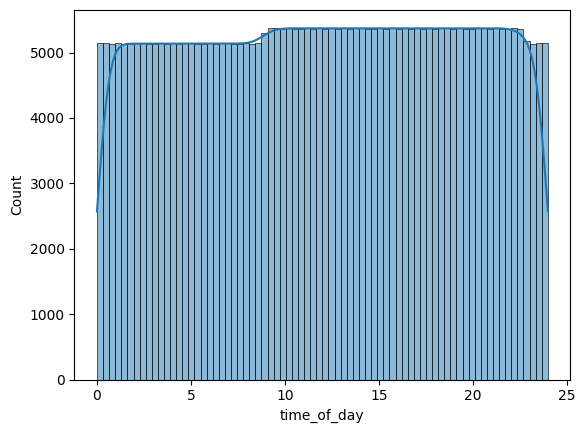

 55%|███████████████████████████████████████████▊                                    | 546/996 [22:50<20:45,  2.77s/it]

8e749c85


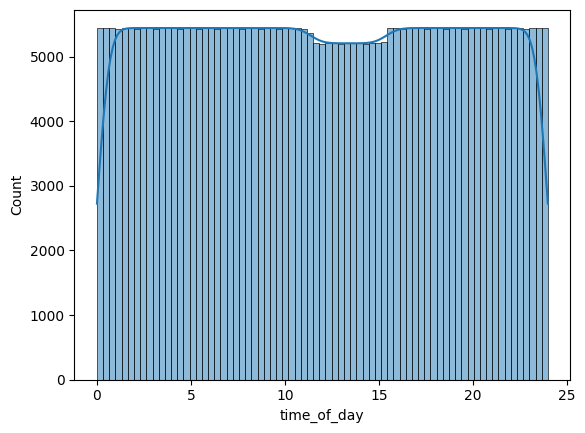

 55%|███████████████████████████████████████████▉                                    | 547/996 [22:53<21:31,  2.88s/it]

8e80deb7


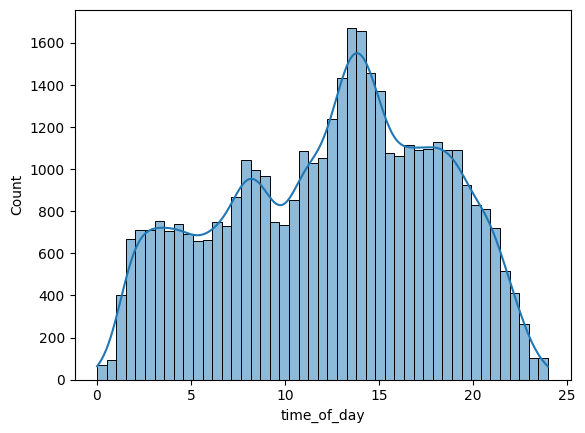

 55%|████████████████████████████████████████████                                    | 548/996 [22:53<15:58,  2.14s/it]

8ec2cc63


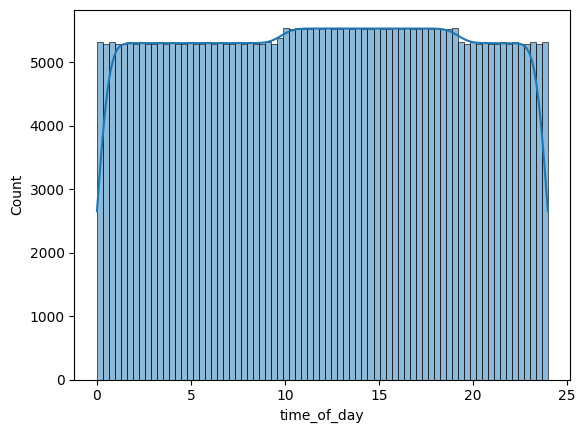

 55%|████████████████████████████████████████████                                    | 549/996 [22:56<18:11,  2.44s/it]

8f015125


In [ ]:
i = 0
parquet_list = []
more_than_one_per_window_df_list = []
for id_folder in tqdm(train_parquet_id_folders_list):
    iid = id_folder.replace('id=', '')

    #if iid in concat_df['id'].tolist():
    #    i += 1

    parquet_files_path = path + 'series_train.parquet/' + id_folder + '/'
    parquet_files_list = os.listdir(parquet_files_path)

    dfs_list = []
    for parquet_filename in parquet_files_list:
        parquet_df = pd.read_parquet(parquet_files_path + parquet_filename)
        dfs_list.append(parquet_df)
    parquet_concat_df = pd.concat(dfs_list, ignore_index=True)
    current_cols = parquet_concat_df.columns.tolist()
    
    parquet_concat_df['id'] = iid
    #parquet_concat_df = parquet_concat_df.with_columns(pl.lit(iid).alias('id'))
    
    parquet_concat_df = parquet_concat_df[['id'] + current_cols]
    #parquet_concat_df = parquet_concat_df.select(['id'] + current_cols)
    
    parquet_concat_df['day_since_wear'] = parquet_concat_df['relative_date_PCIAT'] - parquet_concat_df['relative_date_PCIAT'].min()
    #parquet_concat_df = parquet_concat_df.with_columns(
    #    pl.lit(parquet_concat_df['relative_date_PCIAT'] - parquet_concat_df['relative_date_PCIAT'].min()).alias('day_since_wear')
    #)
    
    map_dict = {1:'Monday', 2:'Tuesday', 3:'Wednesday', 4:'Thursday', 5:'Friday', 6:'Saturday', 7:'Sunday'}
    parquet_concat_df['weekday_mapped'] = parquet_concat_df['weekday'].map(map_dict)
    #parquet_concat_df = parquet_concat_df.with_columns(
    #    pl.col('weekday').replace_strict(map_dict, default=None).alias('weekday_mapped')
    #)

    parquet_concat_df['time_of_day'] = parquet_concat_df['time_of_day'] / 1e9
    parquet_concat_df['time_of_day_day'] = parquet_concat_df['time_of_day'] / 60 / 60 / 24
    parquet_concat_df['time_of_day_hour'] = (parquet_concat_df['time_of_day'] / 60 / 60).astype(int)
    #parquet_concat_df = parquet_concat_df.with_columns(
    #    pl.lit(parquet_concat_df['time_of_day'] / 60 / 60 / 24).alias('time_of_day_day')
    #)
    
    parquet_concat_df['battery_voltage'] = parquet_concat_df['battery_voltage'] / 1000
    #parquet_concat_df = parquet_concat_df.with_columns(
    #    battery_voltage=(pl.col('battery_voltage') / 1000)

    parquet_concat_df['timestamp_day'] = parquet_concat_df['day_since_wear'] + parquet_concat_df['time_of_day_day']
    #parquet_concat_df = parquet_concat_df.with_columns(
    #    (pl.col('day_since_wear') + pl.col('time_of_day_day')).alias('day_time')
    #)

    if parquet_concat_df['timestamp_day'].nunique() != parquet_concat_df.shape[0]:
        print('yes')

    parquet_concat_df['timestamp_hour'] = parquet_concat_df['timestamp_day'] * 24
    parquet_concat_df['timestamp_min'] = parquet_concat_df['timestamp_day'] * 24 * 60
    parquet_concat_df['timestamp_sec'] = parquet_concat_df['timestamp_day'] * 24 * 60 * 60

    parquet_concat_df['timestamp_hour_window'] = parquet_concat_df['timestamp_hour'].astype(int)
    parquet_concat_df['timestamp_min_window'] = parquet_concat_df['timestamp_min'].astype(int)


    plt.figure()
    sns.histplot(parquet_concat_df['time_of_day'] / 60 / 60, kde=True)
    plt.show()




    print(iid)
    
    i += 1
    #if i >= 5:
        #break

In [39]:
print(parquet_concat_df.shape)
parquet_concat_df.head()

(43330, 24)


,id,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,day_since_wear,weekday_mapped,time_of_day_day,time_of_day_hour,timestamp_day,timestamp_hour,timestamp_min,timestamp_sec,timestamp_hour_window,timestamp_min_window
0,00115b9f,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4.188000,56940.0,4,3,41.0,0.0,Thursday,0.659028,15,0.659028,15.816667,949.000000,56940.0,15,949
1,00115b9f,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4.188167,56945.0,4,3,41.0,0.0,Thursday,0.659086,15,0.659086,15.818056,949.083333,56945.0,15,949
2,00115b9f,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4.188334,56950.0,4,3,41.0,0.0,Thursday,0.659144,15,0.659144,15.819444,949.166667,56950.0,15,949
3,00115b9f,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4.188500,56955.0,4,3,41.0,0.0,Thursday,0.659201,15,0.659201,15.820833,949.250000,56955.0,15,949
4,00115b9f,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4.181000,57235.0,4,3,41.0,0.0,Thursday,0.662442,15,0.662442,15.898611,953.916667,57235.0,15,953


<Axes: xlabel='time_of_day_hour', ylabel='Count'>

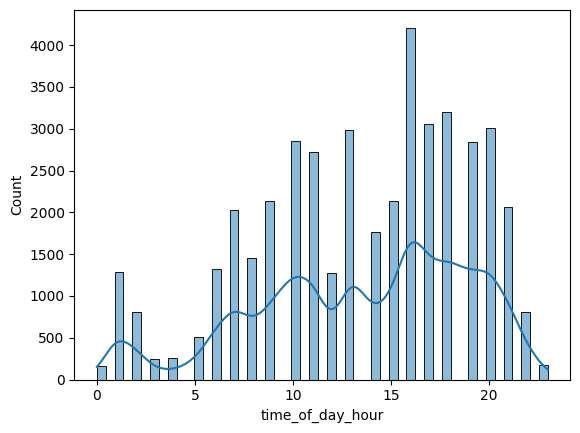

In [40]:
sns.histplot(parquet_concat_df['time_of_day_hour'], kde=True)

<Axes: xlabel='time_of_day_day', ylabel='Count'>

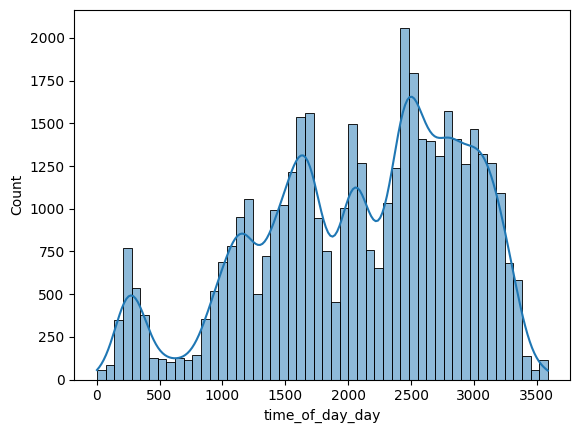

In [43]:
sns.histplot(parquet_concat_df['time_of_day_day'] * 60 * 60, kde=True)

In [ ]:
time_of_day_day

In [34]:
parquet_concat_df['hour'].nunique()

268

<Axes: xlabel='time_of_day_day', ylabel='Count'>

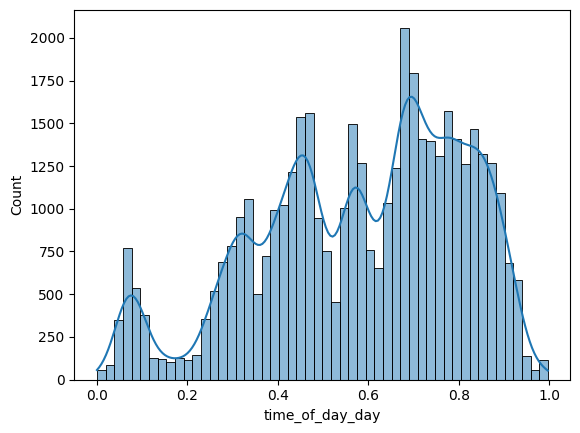

In [29]:
sns.histplot(parquet_concat_df['time_of_day_day'], kde=True)

<Axes: xlabel='day_time', ylabel='Count'>

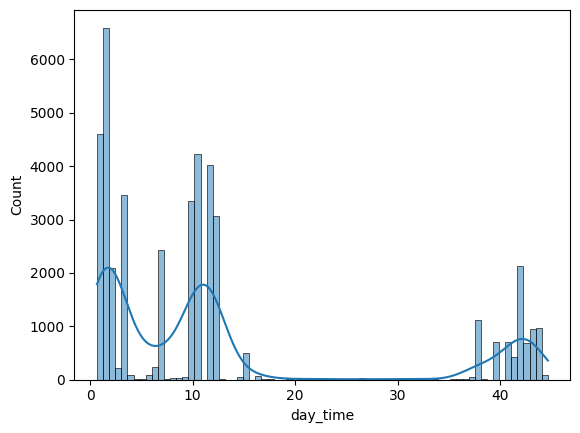

In [30]:
sns.histplot(parquet_concat_df['day_time'], kde=True)

In [ ]:
print(parquet_concat_df.shape)
parquet_concat_df.head()

In [ ]:
more_than_one_per_window_df_list = []
for day in sorted(parquet_concat_df['day_since_wear'].unique().tolist()):
    day_df = parquet_concat_df[parquet_concat_df['day_since_wear'] == day]
    for v in day_df['time_of_day_sec'].unique():
        if (day_df['time_of_day_sec'] == v).sum() > 1:
            df = day_df[day_df['time_of_day_sec'] == v]
            more_than_one_per_window_df_list.append(df)    

In [ ]:
parquet_concat_df['time_of_day_sec'].nunique()

In [ ]:
more_than_one_per_window_df_list = []
for v in parquet_concat_df['time_of_day_sec'].unique():
    if (parquet_concat_df['time_of_day_sec'] == v).sum() > 1:
        df = parquet_concat_df[parquet_concat_df['time_of_day_sec'] == v]
        more_than_one_per_window_df_list.append(df)

In [ ]:
len(more_than_one_per_window_df_list)

In [ ]:
more_than_one_per_window_df_list[0]

In [ ]:
parquet_concat_df['quarter'].value_counts()

In [ ]:
parquet_concat_df['weekday'].value_counts()

In [ ]:
parquet_concat_df['time_of_day_sec'].describe()

In [ ]:
parquet_concat_df['time_of_day_min'].describe()

In [ ]:
parquet_concat_df['time_of_day_hour'].describe()

In [ ]:
parquet_concat_df['time_of_day_day'].describe()

In [ ]:
sns.histplot(parquet_concat_df['light'], kde=True)

In [ ]:
parquet_concat_df['light'].describe()

In [ ]:
parquet_concat_df['light'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99])

In [ ]:
max_df = parquet_concat_df[parquet_concat_df['light'] == parquet_concat_df['light'].max()]
print(max_df.shape)
max_df.head()

In [ ]:
above_95_df = parquet_concat_df[parquet_concat_df['light'] >= parquet_concat_df['light'].quantile(0.95)]
print(above_95_df.shape)
above_95_df.head()

In [ ]:
sns.histplot(above_95_df['light'], kde=True)

In [ ]:
above_99_df = parquet_concat_df[parquet_concat_df['light'] >= parquet_concat_df['light'].quantile(0.99)]
print(above_99_df.shape)
above_99_df.head()

In [ ]:
sns.histplot(above_99_df['light'], kde=True)

In [ ]:
below_99_df = parquet_concat_df[parquet_concat_df['light'] < parquet_concat_df['light'].quantile(0.99)]
print(below_99_df.shape)
below_99_df.head()

In [ ]:
sns.histplot(below_99_df['light'], kde=True)

In [ ]:
below_95_df = parquet_concat_df[parquet_concat_df['light'] < parquet_concat_df['light'].quantile(0.95)]
print(below_95_df.shape)
below_95_df.head()

In [ ]:
sns.histplot(below_95_df['light'], kde=True)

In [ ]:
parquet_concat_df['non-wear_flag'].describe()

In [ ]:
enmo

In [ ]:
sns.histplot(parquet_concat_df['enmo'], kde=True)

In [ ]:
parquet_concat_df['enmo'].describe(percentiles=[0.01] + [0.03] + [i*0.05 + 0.05 for i in range(19)] + [0.97] + [0.99])

In [ ]:
enmo_above_99_df = parquet_concat_df[parquet_concat_df['enmo'] >= parquet_concat_df['enmo'].quantile(0.99)]
print(enmo_above_99_df.shape)
enmo_above_99_df.head()

In [ ]:
sns.histplot(enmo_above_99_df['enmo'], kde=True)

In [ ]:
sns.histplot(parquet_concat_df['X'], kde=True)

In [ ]:
sns.histplot(parquet_concat_df['Y'], kde=True)

In [ ]:
sns.histplot(parquet_concat_df['Z'], kde=True)

In [ ]:
has_parquet_df = concat_df[concat_df['id'].isin(train_parquet_id_list)]
print(has_parquet_df.shape)
has_parquet_df.head()

In [ ]:
# Visualize missing values in the original dataset using a heatmap
plt.figure(figsize=(12, 8))
plt.title("Heatmap of Missing Values in Original Dataset", fontsize=16)
sns.heatmap(has_parquet_df.isnull(), cbar=False, cmap="viridis", yticklabels=False)
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Rows", fontsize=14)
plt.show()

In [ ]:
no_parquet_df = concat_df[~concat_df['id'].isin(train_parquet_id_list)]
print(no_parquet_df.shape)
no_parquet_df.head()

In [ ]:
# Visualize missing values in the original dataset using a heatmap
plt.figure(figsize=(12, 8))
plt.title("Heatmap of Missing Values in Original Dataset", fontsize=16)
sns.heatmap(no_parquet_df.isnull(), cbar=False, cmap="viridis", yticklabels=False)
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Rows", fontsize=14)
plt.show()

In [ ]:
has_parquet_df.shape

In [ ]:
joined_df = has_parquet_df.join(train['sii'], how='left')
print(joined_df.shape)
joined_df.head()

In [ ]:
joined_df['sii'].info()

In [ ]:
def process_file(id_folder, dirname):
    files = os.listdir(os.path.join(path, dirname, id_folder))
    if len(files) > 1:
        df_list = []
        for file in files:
            df = pd.read_parquet(os.path.join(dirname, id_folder, file))
            df_list.append(df)
        df = pd.concat(df_list, ignore_index=True)
    else:
        df = pd.read_parquet(os.path.join(dirname, id_folder, files[0]))
    
    df.drop('step', axis=1, inplace=True)

    df = df[df['non-wear_flag'] == 0].drop('non-wear_flag', axis=1).reset_index(drop=True)

    describe_df = df.describe(percentiles=[0.01] + [i*0.5/10 + 0.05 for i in range(19)] + [0.99])
    count_mean = describe_df.loc['count', :].mean()
    describe_df.drop('count', axis=0, inplace=True)
    
    return np.append(describe_df.values.reshape(-1), count_mean), id_folder.split('=')[1]

def load_time_series(dirname) -> pd.DataFrame:
    ids = os.listdir(dirname)
    
    with ThreadPoolExecutor() as executor:
        results = list(tqdm(executor.map(lambda fname: process_file(fname, dirname), ids), total=len(ids)))
    
    stats, indexes = zip(*results)
    
    df = pd.DataFrame(stats, columns=[f"stat_{i}" for i in range(len(stats[0]))])
    df['id'] = indexes
    return df


class AutoEncoder(nn.Module):
    def __init__(self, input_dim, encoding_dim):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, encoding_dim*4),
            nn.ReLU(),
            nn.Linear(encoding_dim*4, encoding_dim*2),
            nn.ReLU(),
            nn.Linear(encoding_dim*2, encoding_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, encoding_dim*2),
            nn.ReLU(),
            nn.Linear(encoding_dim*2, encoding_dim*4),
            nn.ReLU(),
            nn.Linear(encoding_dim*4, input_dim),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded


def perform_autoencoder(df, encoding_dim=50, epochs=50, batch_size=32):
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)
    
    data_tensor = torch.FloatTensor(df_scaled)
    
    input_dim = data_tensor.shape[1]
    autoencoder = AutoEncoder(input_dim, encoding_dim)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(autoencoder.parameters())
    
    for epoch in range(epochs):
        for i in range(0, len(data_tensor), batch_size):
            batch = data_tensor[i : i + batch_size]
            optimizer.zero_grad()
            reconstructed = autoencoder(batch)
            loss = criterion(reconstructed, batch)
            loss.backward()
            optimizer.step()
            
        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.4f}]')
                 
    with torch.no_grad():
        encoded_data = autoencoder.encoder(data_tensor).numpy()
        
    df_encoded = pd.DataFrame(encoded_data, columns=[f'Enc_{i + 1}' for i in range(encoded_data.shape[1])])
    
    return df_encoded

def feature_engineering(df):
    df['BMI_Age'] = df['Physical-BMI'] * df['Basic_Demos-Age']
    df['Internet_Hours_Age'] = df['PreInt_EduHx-computerinternet_hoursday'] * df['Basic_Demos-Age']
    df['BMI_Internet_Hours'] = df['Physical-BMI'] * df['PreInt_EduHx-computerinternet_hoursday']
    df['BFP_BMI'] = df['BIA-BIA_Fat'] / df['BIA-BIA_BMI']
    df['FFMI_BFP'] = df['BIA-BIA_FFMI'] / df['BIA-BIA_Fat']
    df['FMI_BFP'] = df['BIA-BIA_FMI'] / df['BIA-BIA_Fat']
    df['LST_TBW'] = df['BIA-BIA_LST'] / df['BIA-BIA_TBW']
    df['BFP_BMR'] = df['BIA-BIA_Fat'] * df['BIA-BIA_BMR']
    df['BFP_DEE'] = df['BIA-BIA_Fat'] * df['BIA-BIA_DEE']
    df['BMR_Weight'] = df['BIA-BIA_BMR'] / df['Physical-Weight']
    df['DEE_Weight'] = df['BIA-BIA_DEE'] / df['Physical-Weight']
    df['SMM_Height'] = df['BIA-BIA_SMM'] / df['Physical-Height']
    df['Muscle_to_Fat'] = df['BIA-BIA_SMM'] / df['BIA-BIA_FMI']
    df['Hydration_Status'] = df['BIA-BIA_TBW'] / df['Physical-Weight']
    df['ICW_TBW'] = df['BIA-BIA_ICW'] / df['BIA-BIA_TBW']
    
    return df

In [ ]:
train_ts = load_time_series(path + "series_train.parquet")
test_ts = load_time_series(path + "series_test.parquet")

In [ ]:
concat_ts = pd.concat([train_ts, test_ts], ignore_index=True)
df_concat = concat_ts.drop('id', axis=1)

In [ ]:
for col in df_concat.columns:
    if df_concat[col].std() == 0:
        df_concat.drop(col, axis=1, inplace=True)

In [ ]:
time_series_cols = df_concat.columns.tolist()
df_concat["id"] = concat_ts["id"]
train_ts = df_concat.head(train_ts.shape[0]).reset_index(drop=True)
test_ts = df_concat.tail(test_ts.shape[0]).reset_index(drop=True)
train_merge = pd.merge(train, train_ts, how="left", on='id')
test_merge = pd.merge(test, test_ts, how="left", on='id')

In [ ]:
cat_cols = []
for i in range(data_dict.shape[0]):
    col = data_dict['Field'][i]
    if col == 'id':
        continue
    if (data_dict['Type'][i] == 'str') | ('categori' in data_dict['Type'][i]):
        cat_cols.append(col)

In [ ]:
ordinal_variables = ['FGC-FGC_CU_Zone', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU_Zone',
                     'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL_Zone', 'BIA-BIA_Activity_Level_num', 'BIA-BIA_Frame_num',
                     'PreInt_EduHx-computerinternet_hoursday']

ordinal_variables += [col for col in cat_cols if (('PCIAT' in col)&('Season' not in col))]
print(len(ordinal_variables))
ordinal_variables

In [ ]:
cat_cols = list(set(cat_cols) - set(ordinal_variables))
print(len(cat_cols))
cat_cols

In [ ]:
train_nonan = train_merge.dropna(subset=['sii'], ignore_index=True)
print(train_nonan.shape)
train_nonan.head()

In [ ]:
train_one_hot = train_nonan.copy()
test_one_hot = test_merge.copy()

In [ ]:
for col in cat_cols:
    if 'PCIAT' not in col:
        train_sr = train_one_hot[col].fillna('Missing').apply(str)        
        test_sr = test_one_hot[col].fillna('Missing').apply(str)
        train_one_hot[col] = train_sr
        test_one_hot[col] = test_sr
        concat_sr = pd.concat([train_sr, test_sr])
        unique_list = sorted(concat_sr.unique().tolist())

        for v in unique_list:
            new_col_name = col + '_' + v
            train_one_hot[new_col_name] = pd.Series(train_one_hot[col] == v).astype(int)
            test_one_hot[new_col_name] = pd.Series(test_one_hot[col] == v).astype(int)
    else:
        train_sr = train_one_hot[col].fillna('Missing').apply(str)
        train_one_hot[col] = train_sr
        unique_list = sorted(train_sr.unique().tolist())

        for v in unique_list:
            new_col_name = col + '_' + v
            train_one_hot[new_col_name] = pd.Series(train_one_hot[col] == v).astype(int)

train_one_hot.drop(cat_cols, axis=1, inplace=True)
test_one_hot.drop([col for col in cat_cols if 'PCIAT' not in col], axis=1, inplace=True)

In [ ]:
print(train_ts.shape)
train_ts.head()

In [ ]:
print(train_one_hot.shape)
train_one_hot.head()

In [ ]:
print(test_one_hot.shape)
test_one_hot.head()

In [ ]:
train_one_hot.drop('id', axis=1, inplace=True)
test_one_hot.drop('id', axis=1, inplace=True)

In [ ]:
train = train_one_hot[test_one_hot.columns.tolist() + ['sii']].copy()
test = test_one_hot.copy()

In [ ]:
print(train.shape)
train.head()

In [ ]:
print(test.shape)
test.head()

In [ ]:
concat_df = pd.concat([train[test.columns], test], ignore_index=True)
print(concat_df.shape)
concat_df.head()

In [ ]:
imputer = KNNImputer(n_neighbors=5)
imputed_data_concat = imputer.fit_transform(concat_df)

In [ ]:
concat_imputed = pd.DataFrame(imputed_data_concat, columns=concat_df.columns)
print(concat_imputed.shape)
concat_imputed.head()

In [ ]:
concat_imputed.isna().sum().sum()

In [ ]:
concat_imputed = feature_engineering(concat_imputed)
print(concat_imputed.shape)
concat_imputed.head()

In [ ]:
if np.any(np.isinf(concat_imputed)):
    print('inf in data')
    concat_imputed = concat_imputed.replace([np.inf, -np.inf], np.nan)

In [ ]:
imputer = KNNImputer(n_neighbors=5)
imputed_data = imputer.fit_transform(concat_imputed)

In [ ]:
concat_imputed = pd.DataFrame(imputed_data, columns=concat_imputed.columns)
print(concat_imputed.shape)
concat_imputed.head()

In [ ]:
concat_imputed.isna().sum().sum()

In [ ]:
train_imputed = concat_imputed.head(train.shape[0]).reset_index(drop=True)
test_imputed = concat_imputed.tail(test.shape[0]).reset_index(drop=True)

In [ ]:
train_imputed['sii'] = train['sii']

In [ ]:
train_final = train_imputed.copy()
test_final = test_imputed.copy()

In [ ]:
print(train_final.shape)
print(test_final.shape)

In [ ]:
def quadratic_weighted_kappa(y_true, y_pred):
    return cohen_kappa_score(y_true, y_pred, weights='quadratic')

def threshold_Rounder(oof_non_rounded, thresholds):
    return np.where(oof_non_rounded < thresholds[0], 0,
                    np.where(oof_non_rounded < thresholds[1], 1,
                             np.where(oof_non_rounded < thresholds[2], 2, 3)))

def evaluate_predictions(thresholds, y_true, oof_non_rounded):
    rounded_p = threshold_Rounder(oof_non_rounded, thresholds)
    return -quadratic_weighted_kappa(y_true, rounded_p)

# Model Training and Evaluation

- **Model Types**: Various models are used, including:
  - **LightGBM**: A gradient-boosting framework known for its speed and efficiency with large datasets.
  - **XGBoost**: Another powerful gradient-boosting model used for structured data.
  - **CatBoost**: Optimized for categorical features without the need for extensive preprocessing.
  - **Voting Regressor**: An ensemble model that combines the predictions of LightGBM, XGBoost, and CatBoost for better accuracy.
- **Cross-Validation**: Stratified K-Folds cross-validation is employed to split the data into training and validation sets, ensuring balanced class distribution in each fold.
- **Quadratic Weighted Kappa (QWK)**: The performance of the models is evaluated using QWK, which measures the agreement between predicted and actual values, taking into account the ordinal nature of the target variable.
- **Threshold Optimization**: The `minimize` function from `scipy.optimize` is used to fine-tune decision thresholds that map continuous predictions to discrete categories (None, Mild, Moderate, Severe).


In [ ]:
def TrainML(model_class, train_data, test_data):
    X = train_data.drop(['sii'], axis=1)
    y = train_data['sii']

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]

        model = clone(model_class)
        model.fit(X_train, y_train)

        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)

        train_S.append(train_kappa)
        test_S.append(val_kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Train QWK: {train_kappa:.4f}, Validation QWK: {val_kappa:.4f}")
        clear_output(wait=True)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': sample['id'],
        'sii': tpTuned
    })

    return submission


# Hyperparameter Tuning

- **LightGBM Parameters**: Hyperparameters such as `learning_rate`, `max_depth`, `num_leaves`, and `feature_fraction` are tuned to improve the performance of the LightGBM model. These parameters control the complexity of the model and its ability to generalize to new data.
- **XGBoost and CatBoost Parameters**: Similar tuning is applied for XGBoost and CatBoost, adjusting parameters such as `n_estimators`, `max_depth`, `learning_rate`, `subsample`, and `regularization` terms (`reg_alpha`, `reg_lambda`). These help in controlling overfitting and ensuring the model's robustness.

In [ ]:
Params7 = {
    'learning_rate': 0.03884249148676395,
    'max_depth': 12,
    'num_leaves': 413,
    'min_data_in_leaf': 14,
    'feature_fraction': 0.7987976913702801,
    'bagging_fraction': 0.7602261703576205,
    'bagging_freq': 2,
    'lambda_l1': 4.735462555910575,
    'lambda_l2': 4.735028557007343e-06
} # CV : 0.4094 | LB : 0.471

In [ ]:
Light = LGBMRegressor(**Params7, random_state=SEED, verbose=-1, n_estimators=200)

In [ ]:
Submission1 = TrainML(Light, train_final, test_final)
Submission1.to_csv('submission.csv', index=False)

Submission1